In [7]:
from pathlib import Path
path_folder = Path("/Users/keithlowton/Desktop/Ks/Python code/Kaggle/Restaurant Customer Satisfaction Dataset")
print(path_folder.exists())
print(path_folder)

True
/Users/keithlowton/Desktop/Ks/Python code/Kaggle/Restaurant Customer Satisfaction Dataset


In [8]:
import abc
import os
import pickle
import random
import time
from datetime import datetime

import feather
import gower
import lightgbm as lgb
import matplotlib as mpl
import matplotlib.pyplot as plt
import mlflow
import numpy as np
import optuna
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import shap
import statsmodels.api as sm
import xgboost as xgb
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier
from mlxtend.classifier import StackingClassifier
from optuna.integration.mlflow import MLflowCallback
from optuna.visualization import plot_optimization_history, plot_param_importances
from plotly.subplots import make_subplots
from scipy import stats
from sklearn import metrics, tree
from sklearn.calibration import CalibratedClassifierCV, calibration_curve
from sklearn.cluster import KMeans
from sklearn.compose import ColumnTransformer
from sklearn.decomposition import PCA
from sklearn.ensemble import (
    AdaBoostClassifier,
    BaggingClassifier,
    IsolationForest,
    RandomForestClassifier,
    VotingClassifier,
)
from sklearn.feature_selection import RFECV, SelectKBest, mutual_info_classif
from sklearn.linear_model import LogisticRegression, RidgeClassifier, SGDClassifier
from sklearn.metrics import (
    ConfusionMatrixDisplay,
    accuracy_score,
    auc,
    brier_score_loss,
    classification_report,
    confusion_matrix,
    f1_score,
    log_loss,
    matthews_corrcoef,
    plot_roc_curve,
    precision_recall_curve,
    roc_auc_score,
    roc_curve,
    silhouette_samples,
    silhouette_score,
)
from sklearn.model_selection import GridSearchCV, StratifiedKFold, cross_val_score, learning_curve, train_test_split
from sklearn.naive_bayes import BernoulliNB, GaussianNB
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, StandardScaler
from sklearn.tree import DecisionTreeClassifier, _tree
from statsmodels.stats.outliers_influence import variance_inflation_factor
from tqdm import tqdm
from xgboost import XGBClassifier
from yellowbrick.cluster import KElbowVisualizer

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/shap/utils/_clustering.py:35: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def _pt_shuffle_rec(i, indexes, index_mask, partition_tree, M, pos):
/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/shap/utils/_clustering.py:54: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-

### Functions

In [9]:
def two_cat_cont_compare(df, catvar1, catvar2, var, plot_title):
    agg_data = df.groupby([catvar1, catvar2])[var].mean().reset_index()
    agg_data_p = agg_data.pivot(index=catvar1, columns=catvar2, values=var)
    agg_data_p = agg_data_p.reset_index()

    for name in list(agg_data_p.columns)[1:]:
        agg_data_p.loc[:,name] = agg_data_p.loc[:,name].fillna(0)
        agg_data_p.loc[:,name] = agg_data_p.loc[:,name].astype(int)

    sns.set_theme(style="whitegrid")

    # Make the PairGrid
    g = sns.PairGrid(agg_data_p,
                     x_vars=agg_data_p.columns[1:],
                     y_vars=[catvar1],
                     height=8,
                     aspect=.25)

    # Draw a dot plot using the stripplot function
    g.map(sns.stripplot,
          size=6,
          orient="h",
          jitter=False,
          palette="flare_r",
          linewidth=1,
          edgecolor="w")

    # Use the same x axis limits on all columns and add better labels
    g.set(xlim=(0, max(agg_data_p.max(axis = 1))), xlabel=plot_title, ylabel="")

    # Use semantically meaningful titles for the columns
    titles = list(agg_data_p.columns)[1:]

    for ax, title in zip(g.axes.flat, titles):

        # Set a different title for each axes
        ax.set(title=title)

        # Make the grid horizontal instead of vertical
        ax.xaxis.grid(False)
        ax.yaxis.grid(True)

    sns.despine(left=True, bottom=True)

In [10]:
def boxplot_compare(dset,
                    target,
                    var,
                    num,
                    target_val1,
                    target_val2,
                    target_val1_name,
                    target_val2_name):
    """
    Boxplots comparing the same x and y axes between 2 subgroups
    Args:
        dset (dataframe): Pandas dataframe containing the data of interest
        target (string): Feature where the 2 subgroups are coming from
        var (string): Categorical feature being used as the y axis
        num (string): Numeric feature being used as the x axis
        target_val1 (string/numeric): First subgroup value used with the target feature
        target_val2 (string/numeric): Second subgroup value used with the target feature
        target_val1_name (string): Name of the first subgroup value
        target_val2_name (string): Name of the second subgroup value
    Returns: 2 boxplots side by side
    """
    fig, ax=plt.subplots(1, 2, figsize=(20, 7))
    d1 = dset[dset[target] == target_val1]
    d1 = d1.sort_values([var])
    d2 = dset[dset[target] == target_val2]
    d2 = d2.sort_values([var])
    g1 = sns.boxplot(data=d1, x=num, y=var, palette="rainbow", showmeans=True, ax=ax[0])
    g1.set_title(f"{target_val1_name} Data")
    g1.set_xlim(0, max(dset[num]) + 1)

    g2 = sns.boxplot(data=d2, x=num, y=var, palette="rainbow", showmeans=True, ax=ax[1])
    g2.set(ylabel=None)
    g2.set(yticklabels=[])
    g2.set_title(f"{target_val2_name} Data")
    g2.set_xlim(0, max(dset[num]) + 1)

In [11]:
def pie_chart(dset, name : str, threshold = 100):
    """
    Pie chart to examine all values or a percentage threshold

    Args:
        dset (dataframe): Pandas dataframe containing the data of interest
        name (string): Feature being summarised
        threshold (numeric): Percentage of the data to be shown
    Return: Plot of a pie chart
    """
    c_loc = dset.sort_values(by = name)
    c_loc = c_loc.groupby([name]).size().to_frame("Count").reset_index()
    c_loc["perc"] = c_loc["Count"]/dset.shape[0] * 100
    c_loc = c_loc.sort_values(by = "perc", ascending = False)
    c_loc["cum_perc"] = c_loc["perc"].cumsum()
    c_loc = c_loc.reset_index(drop=True)

    if threshold:
        c_loc = c_loc[c_loc.cum_perc <= threshold]

    dseta = dset[dset[name].isin(c_loc[name])]

    fig = px.pie(dseta, names=name, title=f"Category values for {name}")
    fig.show()

In [12]:
def make_mi_scores(X, y, discrete_features):
    """
    Function to produce the mutual information data for given datasets
    Args:
        X (dataframe): Dataframe of the predictor features
        y (dataframe): Dataframe of the target
        discrete_features: Discrete features in the data
    Returns: Dataframe of the mutual information values for each feature
    """
    mi_scores = mutual_info_classif(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

def plot_mi_scores(scores):
    """
    Plot of the mutual information results
    Args:
        scores (dataframe): Dataframe of the mutual information values for each feature
    Returns: Plot of the mutual information values for each feature
    """
    scores = scores.sort_values(ascending=True)
    width = np.arange(len(scores))
    ticks = list(scores.index)
    plt.barh(width, scores)
    plt.yticks(width, ticks)
    plt.title("Mutual Information Scores")

In [13]:
def get_rules(tree, feature_names, class_names, perc_thold = 80, sample_thold = 100):
    """
    Function to output the tree based sub populations that are the most predictive
    Args:
        tree: Decision Tree Classifier
        feature_names: List of features going into the classifier
        class_names: Target values
        perc_thold (numeric): Percentage threshold for minimum value of one class in a node
        sample_thold (numeric): Numeric threshold for minimum sample value in a node
    Returns: A list of sub populations that can be converted into specific features
    """
    tree_ = tree.tree_
    feature_name = [
        feature_names[i] if i != _tree.TREE_UNDEFINED else "undefined!"
        for i in tree_.feature
    ]

    paths = []
    path = []

    def recurse(node, path, paths):

        if tree_.feature[node] != _tree.TREE_UNDEFINED:
            name = feature_name[node]
            threshold = tree_.threshold[node]
            p1, p2 = list(path), list(path)
            p1 += [f"({name} <= {np.round(threshold, 3)})"]
            recurse(tree_.children_left[node], p1, paths)
            p2 += [f"({name} > {np.round(threshold, 3)})"]
            recurse(tree_.children_right[node], p2, paths)
        else:
            path += [(tree_.value[node], tree_.n_node_samples[node])]
            paths += [path]

    recurse(0, path, paths)

    # sort by samples count
    samples_count = [p[-1][1] for p in paths]
    ii = list(np.argsort(samples_count))
    paths = [paths[i] for i in reversed(ii)]

    rules = []
    proba = []

    for path in paths:
        rule = "if "

        for p in path[:-1]:
            if rule != "if ":
                rule += " and "
            rule += str(p)
        rule += " then "
        if class_names is None:
            rule += "response: "+str(np.round(path[-1][0][0][0],3))
        else:
            classes = path[-1][0][0]
            l_class = np.argmax(classes)
            rule += f"class: {class_names[l_class]} (proba: {np.round(100.0*classes[l_class]/np.sum(classes),2)}%)"
        rule += f" | based on {path[-1][1]:,} samples"

        if (np.round(100.0*classes[l_class]/np.sum(classes),2) > perc_thold) & (path[-1][1] > sample_thold):
            rules += [rule]
            proba += [np.round(100.0*classes[l_class]/np.sum(classes),2)]

    return rules, proba

In [14]:
def calculate_vif(feature_dset):
    """
    Variance inflation factor calculation

    Args:
        feature_dset (dataframe): Dataframe of the predictor features
    Return: Dataframe of features and VIF value
    """
    vif = pd.DataFrame()
    vif["Features"] = feature_dset.columns
    vif["VIF"] = [variance_inflation_factor(feature_dset.values, i) for i in range(feature_dset.shape[1])]
    return(vif)

In [15]:
def cluster_index(dset, cluster_dset, cluster_name : str):
    """
    Establish the important columns with regards the over/under index representation

    Args:
        dset (dataframe): Dataframe with the actual/predicted values
        cluster_dset (dataframe): Dataframe with the cluster group assignments
        cluster_name (string): Name of the cluster feature feature
    Return: Dataframe with the values for the important columns
    """
    dset = pd.concat([dset, cluster_dset], axis=1)
    print(dset.shape)
    clust_mean_data = dset.groupby([cluster_name]).mean()
    clust_mean_data[cluster_name] = clust_mean_data.index
    print(clust_mean_data.shape)

    for name in list(dset.columns):

        mean_val = np.mean(clust_mean_data[name])
        clust_mean_data.loc[:, str("Index_") + str(name)] = (clust_mean_data[name] / mean_val) * 100

    import_col = []
    index_col = [col for col in list(clust_mean_data.columns) if "Index" in str(col)]
    for name in index_col:
        if ((min(clust_mean_data[name]) < 60) | (max(clust_mean_data[name]) > 250)) & (min(clust_mean_data[name]) != 0):
            import_col.append(name)
    origin_col = [item.replace("Index_cat__", "").split("_")[0] if "cat" in item else item.replace("Index_num__", "") for item in import_col]
    origin_col = [item.replace("Index_remainder__", "") if "remainder" in item else item.replace("Index_", "") for item in origin_col]
    origin_col = [item.replace("_bin", "") if "_bin" in item else item.replace("Index_", "") for item in origin_col]
    origin_col = list(set(origin_col))
    try:
        origin_col.remove("Index")
    except Exception:
        origin_col = origin_col
    return import_col, origin_col, clust_mean_data[import_col + [cluster_name]]

In [16]:
def clust_diag_plots(dset, origin_columns, cluster_dset):

    """
    Summary statistic plots to help identify cluster characteristics
    Args:
        dset (dataframe): Pandas dataframe containing the data of interest
        origin_columns (list): List of the original column names before preprocessing
        cluster_dset (dataframe): Dataframe with the cluster group assignments
    Returns: 2 boxplots side by side
    """
    clust_diag_data = pd.concat([dset[origin_columns], cluster_dset], axis=1)

    num_cols_clust = clust_diag_data.select_dtypes(include=["number"], exclude=["datetime", "timedelta"]).columns.tolist()
    num_cols_clust = (list(set(num_cols_clust) - set([col for col in clust_diag_data.columns if ("_bin" in col) or ("Clusters" in col) or ("_n" in col)])))
    print("Numeric cluster columns:", num_cols_clust)

    for name in num_cols_clust:
        sns.boxplot(data=clust_diag_data, x="Clusters", y=name, showmeans=True, showfliers=False)
        plt.xlabel("Clusters")
        plt.ylabel(name)
        plt.show()

    cat_cols_clust = clust_diag_data.select_dtypes(include=["object", "category"]).columns.tolist()
    cat_cols_clust = (cat_cols_clust + [col for col in clust_diag_data.columns if ("_bin" in col) or ("_n" in col)])
    print("Categorical cluster columns:", cat_cols_clust)

    for name in cat_cols_clust:
        crosstab = pd.crosstab(clust_diag_data[name], clust_diag_data.Clusters)

        fig, ax = plt.subplots(figsize=(9, 6))
        sns.heatmap(crosstab,
                    annot=True,
                    fmt="g",
                    linewidths=.5,
                    ax=ax)

In [17]:
def select_model(X, y, pipeline=None):
    """
    Test a range of classifiers and return their performance metrics on training data.

    Args:
        X (object): Pandas dataframe containing X_train data.
        y (object): Pandas dataframe containing y_train data.
        pipeline (object): Pipeline from get_pipeline().

    Return:
        df (object): Pandas dataframe containing model performance data.
    """

    classifiers = {}
    classifiers.update({"LGBMClassifier": LGBMClassifier()})
    classifiers.update({"BaggingClassifier": BaggingClassifier(n_estimators=10,
                                                               base_estimator=DecisionTreeClassifier(max_depth=8))})
    classifiers.update({"RidgeClassifier": RidgeClassifier()})
    classifiers.update({"BernoulliNB": BernoulliNB()})
    classifiers.update({"SGDClassifier": SGDClassifier()})
    classifiers.update({"AdaBoostClassifier": AdaBoostClassifier()})
    classifiers.update({"CatBoostClassifier":CatBoostClassifier(silent=True)})
    classifiers.update({"XGBClassifier": XGBClassifier(eval_metric='logloss',
                                                       objective='binary:logistic')})
    classifiers.update({"DecisionTreeClassifier": DecisionTreeClassifier()})

    # Stacking
    models = []

    models = []
    models.append(('XGBClassifier', XGBClassifier(eval_metric="logloss",
                                                  objective="binary:logistic")))
    models.append(('LGBMClassifier', LGBMClassifier()))
    models.append(('CatBoostClassifier', CatBoostClassifier(silent=True)))
    classifiers.update({"VotingClassifier (XGBClassifier, LGBMClassifier, CatBoostClassifier)": VotingClassifier(models, voting="soft")})

    df_models = pd.DataFrame(columns=["model", "run_time", "roc_auc"])

    for key in tqdm(classifiers):
        start_time = time.time()
        cv = cross_val_score(classifiers[key],
                             X,
                             y,
                             cv=10,
                             scoring = "roc_auc"
        )
        row = {"model": key,
               "run_time": format(round((time.time() - start_time)/60,2)),
               "roc_auc": cv.mean(),
        }
        row_df = pd.DataFrame(row, index=[0])

        df_models = pd.concat([df_models,
                               row_df],
                               axis=0,
                               ignore_index=True)

        df_models = df_models.sort_values(by="roc_auc", ascending=False)
    return df_models


In [18]:

def train_diag_mlflow(classifier, xtrain, ytrain, splits, model):
    """
    Function to output the diagnostic plots for a classifier with cross validation

    Args:
        classifier: Binary classification model
        xtrain (dataframe): Dataframe of the values to be used for prediction
        ytrain (dataframe): Dataframe of the target values
        splits (numeric): Number of splits for the shuffled cross validation
        model: Name of the binary classification model
    Returns:
        results (dataframe): Dataframe of the results for that model
        o_threshold (numeric): threshold value if different from 0.5
        pr_data_all (dataframe): Dataframe of the precision-recall values for a dashboard
        roc_data_train_all (dataframe): Dataframe of the roc-auc values for a dashboard
    """

    date_run = datetime.now().strftime("%Y%m%d_%H%M%S")
    mlflow.set_experiment(f"{model}_{date_run}")

    folds = StratifiedKFold(n_splits=splits, shuffle=True, random_state=31416)
    folds.get_n_splits(xtrain, ytrain)

    results = pd.DataFrame(["ROC/AUC:", "Accuracy:", "F1 score:", "MCC score:"], columns=["Metrics"])

    pr_data_all = pd.DataFrame(columns=["Precision", "Recall", "Folds"])
    roc_data_train_all = pd.DataFrame(columns=["Thresholds", "FPR", "TPR", "FPR_TPR", "Folds"])

    threshold_lst = []

    with mlflow.start_run():
        for i, (train, test) in tqdm(enumerate(folds.split(xtrain, ytrain))):
            with mlflow.start_run(nested=True):

                y_pred_p = classifier.predict_proba(xtrain.iloc[test, :])
                y_pred_p1 = y_pred_p[:, 1]
                y_pred_hyp = classifier.predict(xtrain.iloc[test, :])

                metric_lst = []
                roc_auc_hyp = round(roc_auc_score(ytrain[test], y_pred_p1), 4)
                metric_lst.append(roc_auc_hyp)
                accuracy_hyp = round(accuracy_score(ytrain[test], y_pred_hyp), 4)
                metric_lst.append(accuracy_hyp)
                f1_score_hyp = round(f1_score(ytrain[test], y_pred_hyp), 4)
                metric_lst.append(f1_score_hyp)
                mcc_score = round(matthews_corrcoef(ytrain[test], y_pred_hyp), 4)
                metric_lst.append(mcc_score)


                print("ROC/AUC:", roc_auc_hyp)
                print("Accuracy:", accuracy_hyp)
                print("F1 score:", f1_score_hyp)
                print("MCC score:", mcc_score)

                mlflow.log_param("auc", roc_auc_hyp)
                mlflow.log_param("accuracy", accuracy_hyp)
                mlflow.log_metric("f1_score", f1_score_hyp)
                mlflow.log_metric("mcc_score", mcc_score)

                o_threshold = 0.5
                fpr, tpr, thresholds = roc_curve(ytrain[test], y_pred_p1, drop_intermediate=False)

                if (roc_auc_hyp == 0.5) | (f1_score_hyp == 0):

                    plt.scatter(thresholds, np.abs(fpr + tpr - 1))
                    plt.xlabel("Threshold")
                    plt.ylabel("|FPR + TPR - 1|")
                    plt.xlim([0.0, 1.05])
                    plt.ylim([0.0, 1.05])
                    plt.show()

                    plt.savefig("fpr_tpr.png")
                    mlflow.log_artifact("fpr_tpr.png")
                    os.remove("fpr_tpr.png")

                    roc_data_train = pd.DataFrame([thresholds], columns="thresholds")
                    roc_data_train["fpr_tpr"] = np.abs(fpr + tpr - 1)
                    roc_data_train["fold"] = i

                    o_threshold = thresholds[np.argmin(np.abs(fpr + tpr - 1))]
                    print("Threshold:", round(o_threshold, 4))
                    threshold_lst.append(o_threshold)

                    y_pred_o = y_pred_p1 >= o_threshold  # [:,0]

                    confusion_matrix_o = confusion_matrix(ytrain[test], y_pred_o)

                    disp = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix_o)
                    disp.plot()
                    plt.show()

                    roc_auc = round(roc_auc_score(ytrain[test], y_pred_o), 4)
                    accuracy = round(accuracy_score(ytrain[test], y_pred_o), 4)
                    f1_score_val = round(f1_score(ytrain[test], y_pred_o), 4)
                    mcc_score = round(matthews_corrcoef(ytrain[test], y_pred_o), 4)

                    print("ROC/AUC threshold:", roc_auc)
                    print("Accuracy threshold:", accuracy)
                    print("F1 score threshold:", f1_score_val)
                    print("MCC score:", mcc_score)

                    print(classification_report(ytrain[test], y_pred_o))

                else:

                    print(classification_report(ytrain[test], y_pred_hyp))

                    cm_matrix = confusion_matrix(ytrain[test], y_pred_hyp)

                    disp = ConfusionMatrixDisplay(confusion_matrix=cm_matrix)
                    disp.plot()
                    plt.show()

                    o_threshold = 0.5

                roc_data_train = pd.concat(
                    [
                        pd.DataFrame(thresholds),
                        pd.DataFrame(fpr),
                        pd.DataFrame(tpr),
                        pd.DataFrame(np.abs(fpr + tpr - 1)),
                    ],
                    axis=1,
                )
                roc_data_train.columns = ["Thresholds", "FPR", "TPR", "FPR_TPR"]
                roc_data_train = roc_data_train.reset_index(drop=True)
                roc_data_train["Folds"] = i

                roc_data_train_all = pd.concat([roc_data_train_all, roc_data_train], axis=0).reset_index(drop=True)

                results = pd.concat([results, pd.DataFrame(metric_lst, columns=["Train_" + str(i)])], axis=1)

                # Precision Recall curves

                precision, recall, thresholds = precision_recall_curve(ytrain[test], y_pred_p1)

                # plot the precision-recall curves

                no_skill = len(ytrain[test][ytrain[test] == 1]) / len(ytrain[test])

                plt.plot([0, 1], [no_skill, no_skill], linestyle="--", label="No skill")
                plt.plot(recall, precision, marker=".", label=f"PR fold {i}")
                plt.xlabel("Recall")
                plt.ylabel("Precision")
                plt.legend()
                plt.show()

                plt.savefig("precision_recall.png")
                mlflow.log_artifact("precision_recall.png")
                os.remove("precision_recall.png")

                pr_data = pd.concat([pd.DataFrame(precision), pd.DataFrame(recall)], axis=1)
                pr_data.columns = ["Precision", "Recall"]
                pr_data = pr_data.reset_index(drop=True)
                pr_data["Folds"] = i

                pr_data_all = pd.concat([pr_data_all, pr_data], axis=0).reset_index(drop=True)

        results["Model"] = model

        sns.lineplot(data=pr_data_all, x="Recall", y="Precision", palette="rainbow", hue="Folds")
        plt.legend(bbox_to_anchor=(1.3, 0.5), loc="lower right", title="PR folds")
        plt.show()

        plt.savefig("precision_recall_plot.png")
        mlflow.log_artifact("precision_recall_plot.png")
        os.remove("precision_recall_plot.png")

        if model != "Stacking_classifier":

            fig, ax = plt.subplots()

            tprs = []
            aucs = []
            mean_fpr = np.linspace(0, 1, 100)

            for i, (train, test) in enumerate(folds.split(xtrain, ytrain)):

                viz = plot_roc_curve(
                    classifier, xtrain.iloc[test, :], ytrain[test], name=f"ROC fold {i}", alpha=0.3, lw=1, ax=ax
                )
                interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
                interp_tpr[0] = 0.0
                tprs.append(interp_tpr)
                aucs.append(viz.roc_auc)

            ax.plot([0, 1], [0, 1], linestyle="--", lw=2, color="r", label="Chance", alpha=0.8)

            mean_tpr = np.mean(tprs, axis=0)
            mean_tpr[-1] = 1.0
            mean_auc = auc(mean_fpr, mean_tpr)
            std_auc = np.std(aucs)
            ax.plot(
                mean_fpr, mean_tpr, color="b", label=f"Mean ROC (AUC = {mean_auc:0.4f} +/- {std_auc:0.2f})", lw=2, alpha=0.8
            )

            std_tpr = np.std(tprs, axis=0)
            tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
            tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
            ax.fill_between(mean_fpr, tprs_lower, tprs_upper, color="grey", alpha=0.2, label=r"$\pm$ 1 std. dev.")

            ax.set(xlim=[-0.05, 1.05], ylim=[-0.05, 1.05], title="Receiver operating characteristic example")
            ax.legend(bbox_to_anchor=(1.9, 0), loc="lower right")
            fig.show()

            plt.savefig("roc_curve_plot.png")
            mlflow.log_artifact("roc_curve_plot.png")
            os.remove("roc_curve_plot.png")

    mlflow.end_run()

    return results, o_threshold, pr_data_all, roc_data_train_all


In [19]:
def plot_learning_curve(classifier,
                        title : str,
                        X,
                        y,
                        ylim=None,
                        cv=None,
                        n_jobs=-1,
                        train_sizes=np.linspace(.1, 1.0, 5)):
    """
    Generate a simple plot of the test and training learning curve

    Args:
        classifier: Binary classification model
        title (string): Name of the binary classification model
        X (dataframe): Dataframe to be used for predictions
        y (dataframe): Dataframe with the target values
        ylim (numeric): Value of the ylim for the plot
        cv (numeric): Number for the cross validation
        n_jobs=-1,
        train_sizes
    Returns: Plot of the learning curves
    """
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    train_sizes, train_scores, test_scores = learning_curve(
        classifier, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes
    )
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes,
                     train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std,
                     alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes,
                     test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std,
                     alpha=0.1,
                     color="g")
    plt.plot(train_sizes,
             train_scores_mean,
             "o-",
             color="r",
             label="Training score")
    plt.plot(train_sizes,
             test_scores_mean,
             "o-",
             color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    plt.show()
    return plt

In [157]:
def Rank_Order(X, y : str, Target : str):
    """
    Establish the gains/lift data required to examine the competence of the model

    Args:
        X (dataframe): Dataframe with the actual/predicted values
        y (string): Predicted values of the target
        Target (string): Binary target feature
    Return: Dataframe with the gains/lift calculations
    """

    Rank=X.groupby("decile").apply(lambda x: pd.Series([
        np.min(x[y]),
        np.max(x[y]),
        np.mean(x[y]),
        np.size(x[y]),
        np.sum(x[Target]),
        np.size(x[Target][x[Target]==0]),
        ],
        index=(["min_prob",
                "max_prob",
                "avg_prob",
                "cnt_cust",
                "cnt_resp",
                "cnt_non_resp"])
        )).reset_index()
    Rank=Rank.sort_values(by="decile",ascending=False)
    Rank["rrate"]=round(Rank["cnt_resp"]*100/Rank["cnt_cust"],2)
    Rank["cum_cust"]=np.cumsum(Rank["cnt_cust"])
    Rank["cum_resp"]=np.cumsum(Rank["cnt_resp"])
    Rank["cum_non_resp"]=np.cumsum(Rank["cnt_non_resp"])
    Rank["cum_cust_pct"]=round(Rank["cum_cust"]*100/np.sum(Rank["cnt_cust"]),2)
    Rank["Gain_Percentage"]=round(Rank["cum_resp"]*100/np.sum(Rank["cnt_resp"]),2)
    Rank["cum_non_resp_pct"]=round(
            Rank["cum_non_resp"]*100/np.sum(Rank["cnt_non_resp"]),2)
    Rank["KS"] = round(Rank["Gain_Percentage"] - Rank["cum_non_resp_pct"],2)
    Rank["Lift"] = round(Rank["Gain_Percentage"] / Rank["cum_cust_pct"],2)

    return(Rank)

### Read the data in

In [21]:
data = pd.read_csv(os.path.join(path_folder, "data/restaurant_customer_satisfaction.csv"), sep=",")
print(data.shape)
# (1500, 19)
data.head()

(1500, 19)


,CustomerID,Age,Gender,Income,VisitFrequency,AverageSpend,PreferredCuisine,TimeOfVisit,GroupSize,DiningOccasion,MealType,OnlineReservation,DeliveryOrder,LoyaltyProgramMember,WaitTime,ServiceRating,FoodRating,AmbianceRating,HighSatisfaction
0,654,35,Male,83380,Weekly,27.829142,Chinese,Breakfast,3,Business,Takeaway,0,1,1,43.523929,2,5,4,0
1,655,19,Male,43623,Rarely,115.408622,American,Dinner,1,Casual,Dine-in,0,0,0,57.524294,5,5,3,0
2,656,41,Female,83737,Weekly,106.693771,American,Dinner,6,Celebration,Dine-in,0,1,0,48.682623,3,4,5,0
3,657,43,Male,96768,Rarely,43.508508,Indian,Lunch,1,Celebration,Dine-in,0,0,0,7.552993,4,5,1,0
4,658,55,Female,67937,Monthly,148.084627,Chinese,Breakfast,1,Business,Takeaway,0,0,1,37.789041,2,3,5,0


In [22]:
list(data.columns)

['CustomerID',
 'Age',
 'Gender',
 'Income',
 'VisitFrequency',
 'AverageSpend',
 'PreferredCuisine',
 'TimeOfVisit',
 'GroupSize',
 'DiningOccasion',
 'MealType',
 'OnlineReservation',
 'DeliveryOrder',
 'LoyaltyProgramMember',
 'WaitTime',
 'ServiceRating',
 'FoodRating',
 'AmbianceRating',
 'HighSatisfaction']

In [23]:
data.duplicated().sum()

0

In [24]:
nonvar_lst = []

for i in range(data.shape[1]):
    print("Column: ", data.columns[i], ", number of unique classes: ", data.iloc[:,i].nunique())
    if data.iloc[:,i].nunique() < 50:
        print("Values: ", list(set(data.iloc[:,i])))
    if data.iloc[:,i].nunique() == 1:
        nonvar_lst.append(data.columns[i])

Column:  CustomerID , number of unique classes:  1500
Column:  Age , number of unique classes:  52
Column:  Gender , number of unique classes:  2
Values:  ['Female', 'Male']
Column:  Income , number of unique classes:  1486
Column:  VisitFrequency , number of unique classes:  4
Values:  ['Rarely', 'Daily', 'Monthly', 'Weekly']
Column:  AverageSpend , number of unique classes:  1500
Column:  PreferredCuisine , number of unique classes:  5
Values:  ['Indian', 'Chinese', 'American', 'Italian', 'Mexican']
Column:  TimeOfVisit , number of unique classes:  3
Values:  ['Dinner', 'Lunch', 'Breakfast']
Column:  GroupSize , number of unique classes:  9
Values:  [1, 2, 3, 4, 5, 6, 7, 8, 9]
Column:  DiningOccasion , number of unique classes:  3
Values:  ['Casual', 'Business', 'Celebration']
Column:  MealType , number of unique classes:  2
Values:  ['Dine-in', 'Takeaway']
Column:  OnlineReservation , number of unique classes:  2
Values:  [0, 1]
Column:  DeliveryOrder , number of unique classes:  2


In [25]:
print(nonvar_lst)

[]


### Missing data

In [26]:
check = data.isnull().sum()
check = pd.DataFrame(check)
check.columns = ["Count"]
check["perc"] = check.Count/data.shape[0]*100
check

,Count,perc
CustomerID,0,0.0
Age,0,0.0
Gender,0,0.0
Income,0,0.0
VisitFrequency,0,0.0
AverageSpend,0,0.0
PreferredCuisine,0,0.0
TimeOfVisit,0,0.0
GroupSize,0,0.0
DiningOccasion,0,0.0


In [27]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1500 entries, 0 to 1499
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   CustomerID            1500 non-null   int64  
 1   Age                   1500 non-null   int64  
 2   Gender                1500 non-null   object 
 3   Income                1500 non-null   int64  
 4   VisitFrequency        1500 non-null   object 
 5   AverageSpend          1500 non-null   float64
 6   PreferredCuisine      1500 non-null   object 
 7   TimeOfVisit           1500 non-null   object 
 8   GroupSize             1500 non-null   int64  
 9   DiningOccasion        1500 non-null   object 
 10  MealType              1500 non-null   object 
 11  OnlineReservation     1500 non-null   int64  
 12  DeliveryOrder         1500 non-null   int64  
 13  LoyaltyProgramMember  1500 non-null   int64  
 14  WaitTime              1500 non-null   float64
 15  ServiceRating        

### Adjust the data

In [28]:
df = data.copy()

for name in ["HighSatisfaction", "LoyaltyProgramMember", "DeliveryOrder", "OnlineReservation"]:
    df.rename({str(name): str(name) + "_n"}, axis=1, inplace=True)

df["Gender_n"] = (df["Gender"] == "Female").astype(int)
df["MealType_n"] = (df["MealType"] == "Dine-in").astype(int)

df.drop(["Gender", "MealType"], axis=1, inplace=True)

df.head()


,CustomerID,Age,Income,VisitFrequency,AverageSpend,PreferredCuisine,TimeOfVisit,GroupSize,DiningOccasion,OnlineReservation_n,DeliveryOrder_n,LoyaltyProgramMember_n,WaitTime,ServiceRating,FoodRating,AmbianceRating,HighSatisfaction_n,Gender_n,MealType_n
0,654,35,83380,Weekly,27.829142,Chinese,Breakfast,3,Business,0,1,1,43.523929,2,5,4,0,0,0
1,655,19,43623,Rarely,115.408622,American,Dinner,1,Casual,0,0,0,57.524294,5,5,3,0,0,1
2,656,41,83737,Weekly,106.693771,American,Dinner,6,Celebration,0,1,0,48.682623,3,4,5,0,1,1
3,657,43,96768,Rarely,43.508508,Indian,Lunch,1,Celebration,0,0,0,7.552993,4,5,1,0,0,1
4,658,55,67937,Monthly,148.084627,Chinese,Breakfast,1,Business,0,0,1,37.789041,2,3,5,0,1,0


In [29]:
pd.crosstab(df.MealType_n, df.DeliveryOrder_n)

DeliveryOrder_n,0,1
MealType_n,,
0,456,293
1,436,315


In [30]:
num_cols = df.select_dtypes(include=np.number).columns.tolist()
num_cols = (list(set(num_cols) - set([col for col in df.columns if ("_n" in col)])))
print("Numeric columns:", num_cols)
cat_cols = df.select_dtypes(include=["object", "category"]).columns.tolist()
cat_cols = cat_cols + [col for col in df.columns if ("_n" in col)]
print("Categorical columns:", cat_cols)
other_cols = list(set(list(df.columns)) - set(num_cols + cat_cols))
print("Other columns:", other_cols)

Numeric columns: ['Income', 'AverageSpend', 'FoodRating', 'CustomerID', 'Age', 'WaitTime', 'ServiceRating', 'GroupSize', 'AmbianceRating']
Categorical columns: ['VisitFrequency', 'PreferredCuisine', 'TimeOfVisit', 'DiningOccasion', 'OnlineReservation_n', 'DeliveryOrder_n', 'LoyaltyProgramMember_n', 'HighSatisfaction_n', 'Gender_n', 'MealType_n']
Other columns: []


### Identifying key areas for improvement in service rating

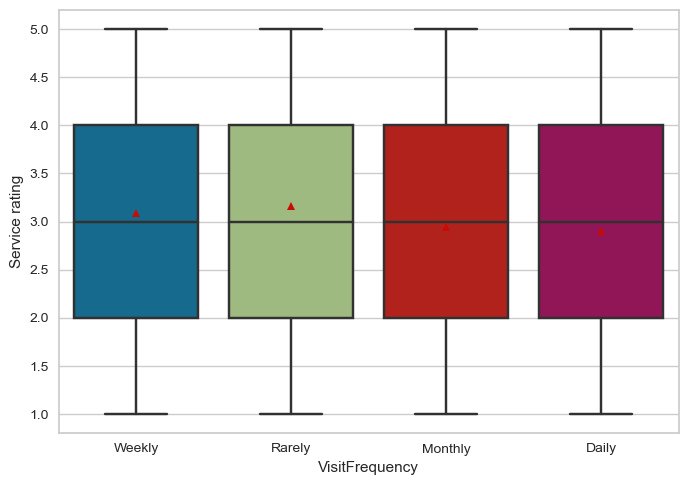

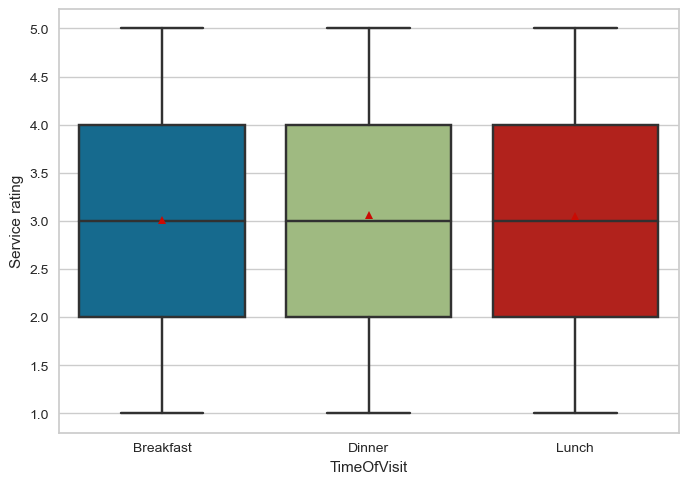

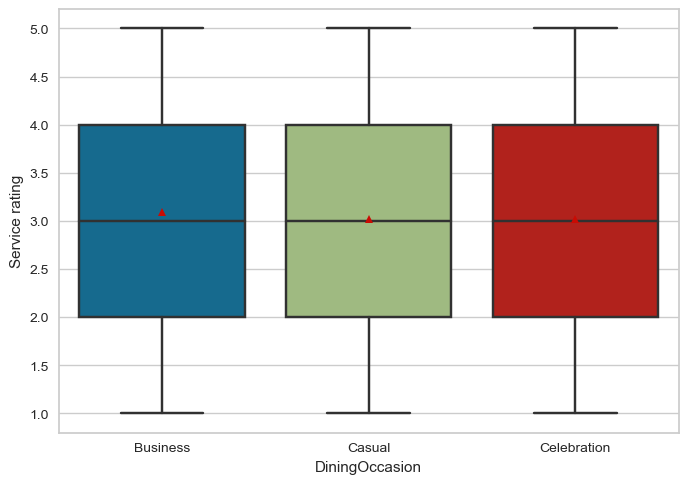

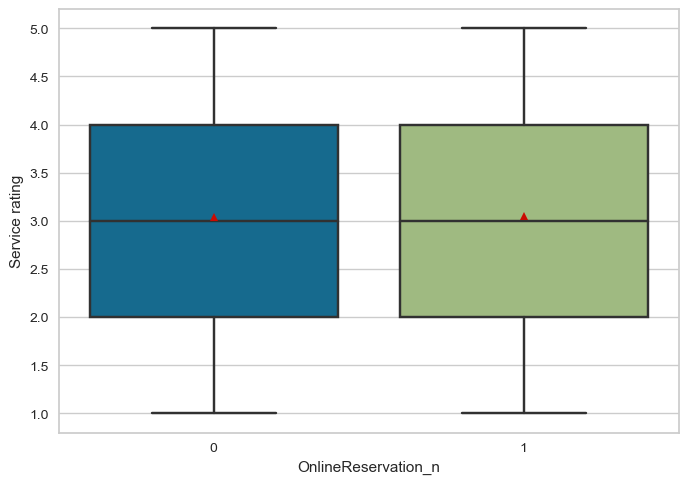

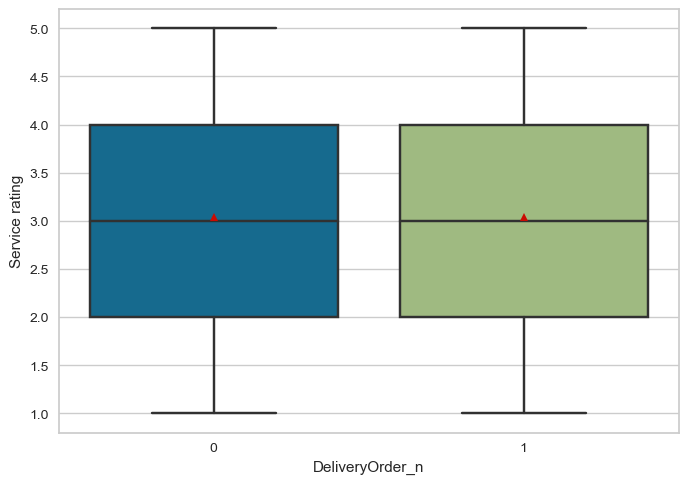

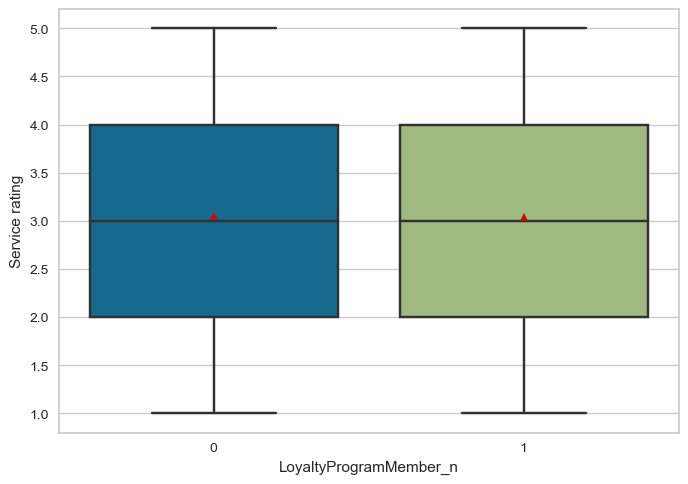

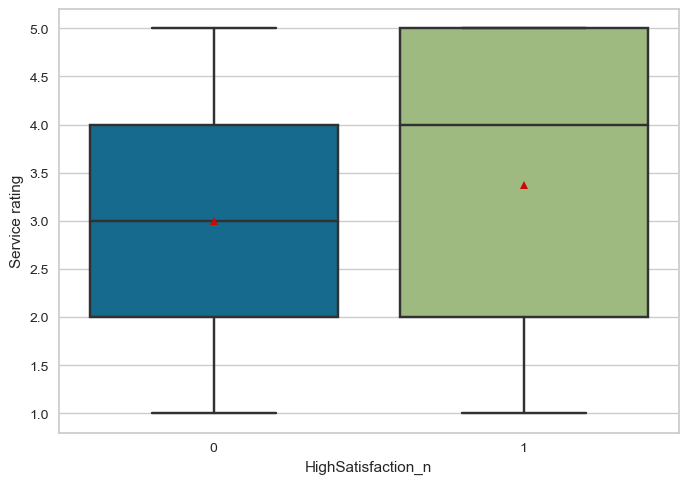

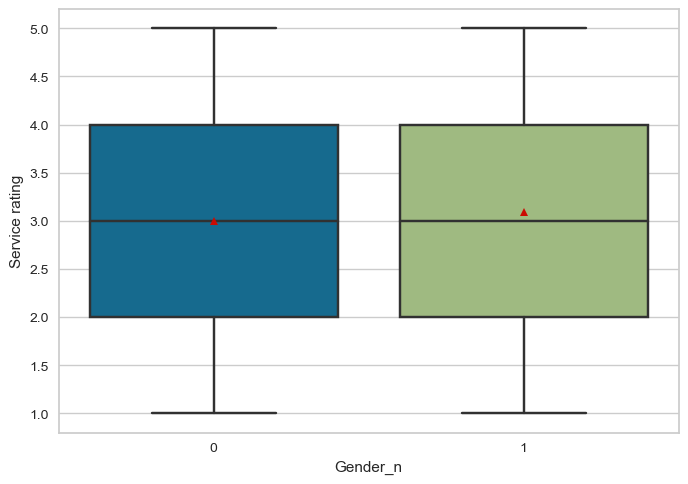

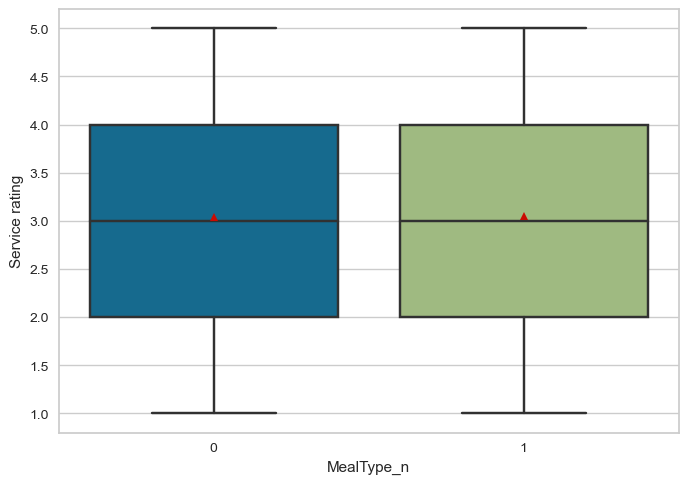

In [31]:
cat_cols = df.select_dtypes(include=["object", "category"]).columns.tolist()
cat_cols = cat_cols + [col for col in df.columns if ("_n" in col)]
cat_cols.remove("PreferredCuisine")

for name in cat_cols:
    sns.boxplot(data=df, x=name, y="ServiceRating", showmeans=True)
    plt.xlabel(name)
    plt.xticks(rotation=0)
    plt.ylabel("Service rating")
    plt.show()

#### Numeric columns

In [32]:
num_cols

['Income',
 'AverageSpend',
 'FoodRating',
 'CustomerID',
 'Age',
 'WaitTime',
 'ServiceRating',
 'GroupSize',
 'AmbianceRating']

In [33]:
num_cols = df.select_dtypes(include=np.number).columns.tolist()
num_cols = (list(set(num_cols) - set([col for col in df.columns if ("_n" in col)])))
num_cols.remove("CustomerID")
num_cols.remove("ServiceRating")
num_cols.remove("FoodRating")

for name in num_cols:
    fig = px.density_contour(df, x="ServiceRating", y=name, z="FoodRating", histfunc="avg")
    fig.update_traces(contours_coloring="fill", contours_showlabels = True)
    fig.show()

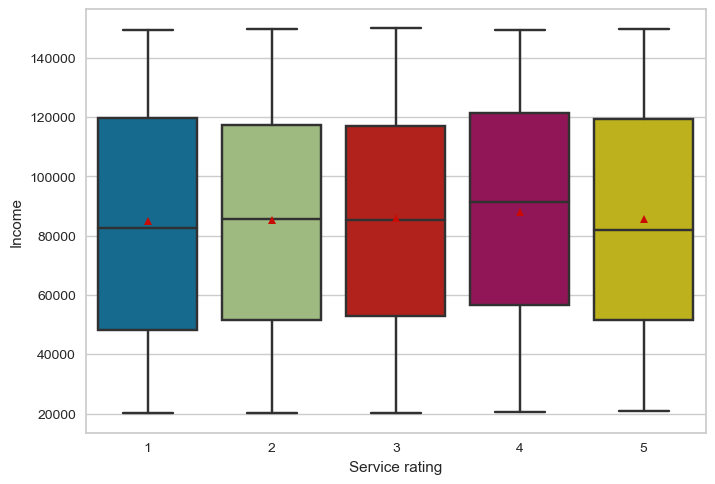

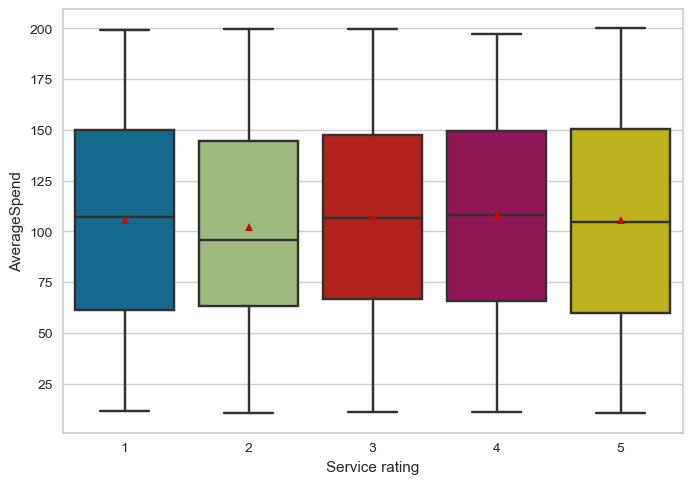

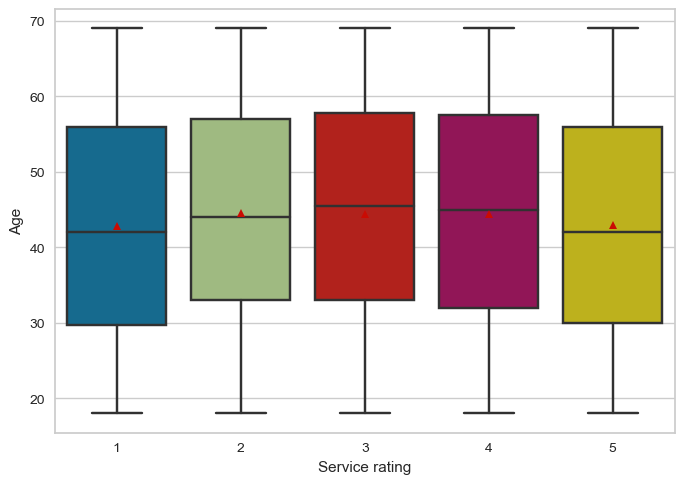

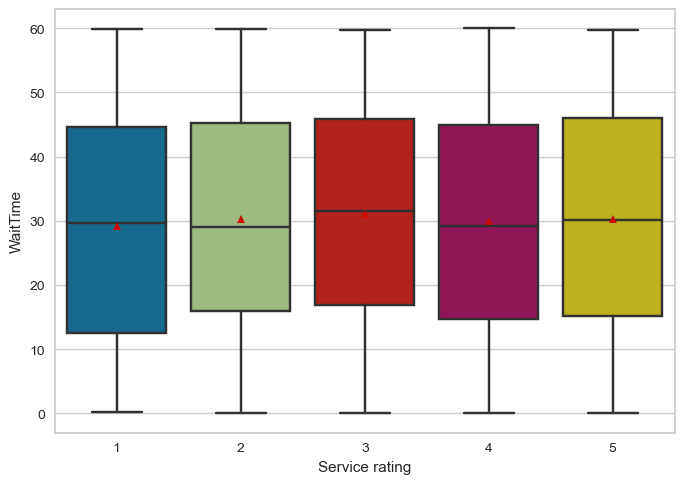

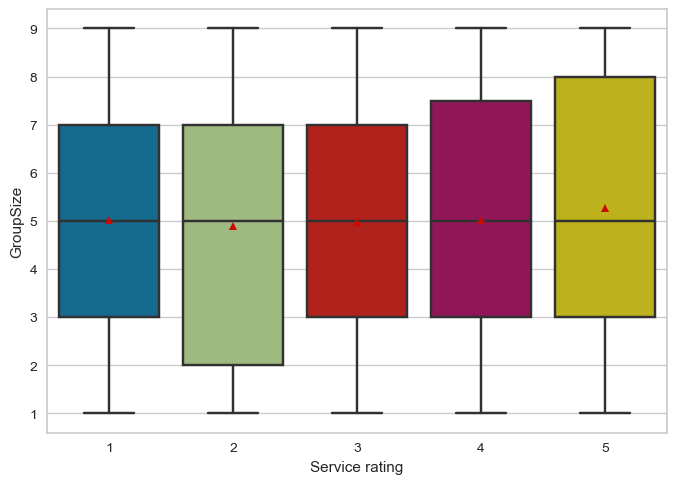

In [34]:
num_cols = df.select_dtypes(include=np.number).columns.tolist()
num_cols = (list(set(num_cols) - set([col for col in df.columns if ("_n" in col)])))
num_cols.remove("ServiceRating")
num_cols.remove("FoodRating")
num_cols.remove("AmbianceRating")
num_cols.remove("CustomerID")

for name in num_cols:
    sns.boxplot(data=df, x="ServiceRating", y=name, showmeans=True)
    plt.xticks(rotation=0)
    plt.ylabel(name)
    plt.xlabel("Service rating")
    plt.show()

There is a higher service rating with larger group sizes, which suggests that either there is more care and attention delivered by the staff. A slightly lower average age is more likely to give either a 1 or a 5 for the service, which suggests that the person is more judgemental. 

### Identifying key areas for improvement in food rating

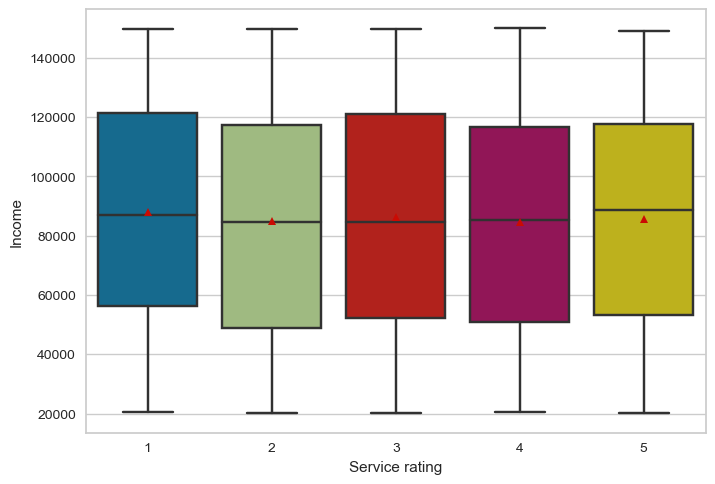

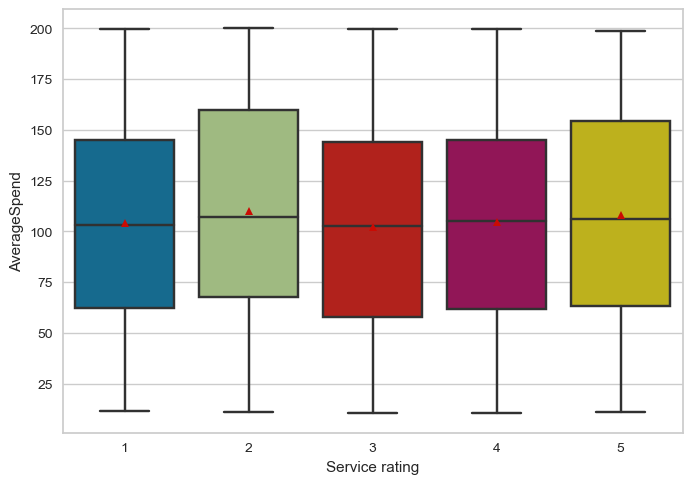

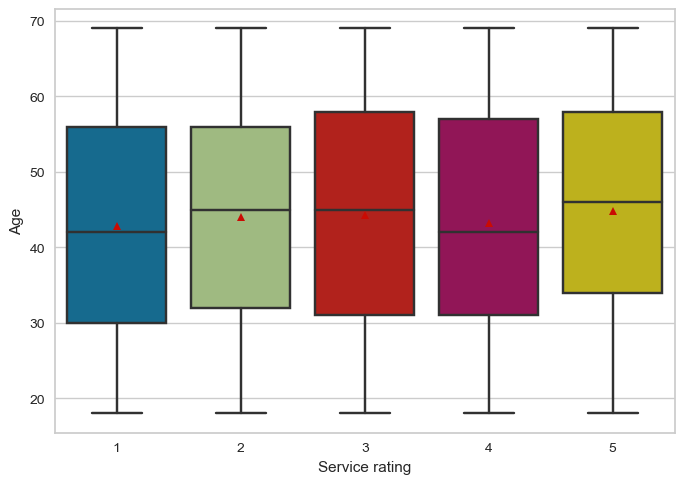

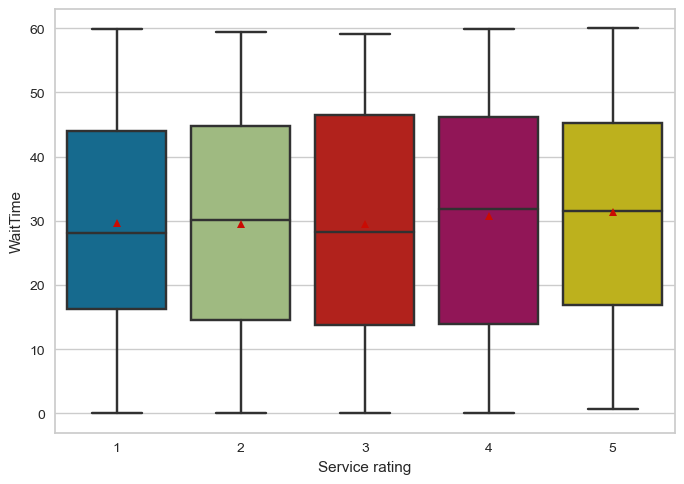

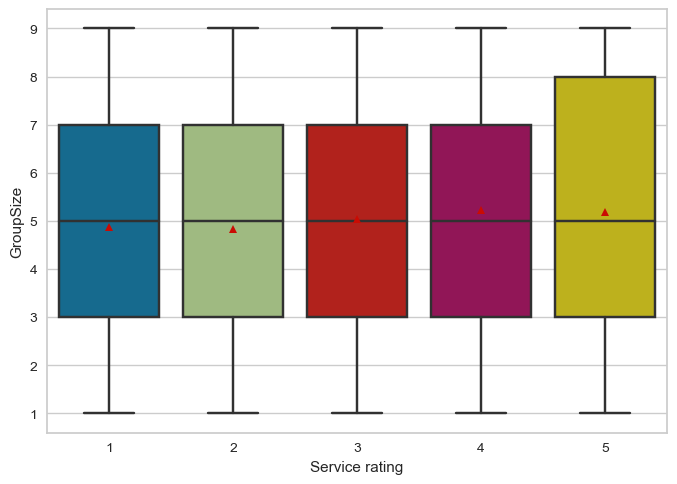

In [35]:
num_cols = df.select_dtypes(include=np.number).columns.tolist()
num_cols = (list(set(num_cols) - set([col for col in df.columns if ("_n" in col)])))
num_cols.remove("FoodRating")
num_cols.remove("ServiceRating")
num_cols.remove("AmbianceRating")
num_cols.remove("CustomerID")

for name in num_cols:
    sns.boxplot(data=df, x="FoodRating", y=name, showmeans=True)
    plt.xticks(rotation=0)
    plt.ylabel(name)
    plt.xlabel("Service rating")
    plt.show()

### Identifying key areas for improvement in service, food, and ambiance

In [36]:
fig = px.scatter(
    df,
    x="ServiceRating",
    y="FoodRating",
    color="AmbianceRating",
    size="Age",
    hover_data=["ServiceRating", "FoodRating"],
    labels={
        "ServiceRating": "Service rating",
        "FoodRating": "Food rating",
        "AmbianceRating": "Ambiance rating",
        "Age": "Age (years)",
    },
    width=900,
    height=600,
    title="Service, Food and Ambiance ratings",
)
fig.update_layout(
    template="plotly_white",
)
fig.show()


In [37]:
fig = px.density_contour(df, x="ServiceRating", y="FoodRating", title="Food rating versus Service rating")
fig.update_traces(contours_coloring="fill", contours_showlabels = True)
fig.show()

In [38]:
fig = px.density_contour(df, x="ServiceRating", y="AmbianceRating", title="Ambiance rating versus Service rating")
fig.update_traces(contours_coloring="fill", contours_showlabels = True)
fig.show()

In [39]:
fig = px.density_contour(df, x="FoodRating", y="AmbianceRating", title="Food rating versus Ambiance rating")
fig.update_traces(contours_coloring="fill", contours_showlabels = True)
fig.show()

In [40]:
agg_data = df.groupby(["ServiceRating", "FoodRating"])["AmbianceRating"].mean().reset_index()
agg_data_p = agg_data.pivot(index="ServiceRating", columns="FoodRating", values="AmbianceRating")
agg_data_p.style.background_gradient(cmap ='viridis').set_properties(**{'font-size': '20px'})

FoodRating,1,2,3,4,5
ServiceRating,,,,,
1,2.925373,2.963636,3.017544,2.916667,3.353846
2,2.918033,2.925926,3.183333,2.984127,2.686275
3,2.482759,3.196078,3.250000,2.806452,2.955224
4,2.683333,3.000000,2.984848,3.014493,3.040816
5,3.223881,3.031746,3.014706,3.000000,3.015152


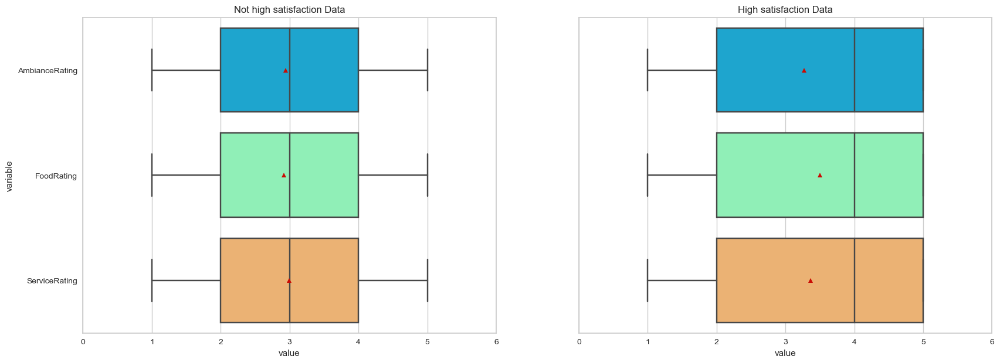

In [41]:
sfa_long = pd.melt(df, id_vars=["HighSatisfaction_n"], value_vars=["ServiceRating", "FoodRating", "AmbianceRating"])
boxplot_compare(sfa_long, "HighSatisfaction_n", "variable", "value", 0, 1, "Not high satisfaction", "High satisfaction")

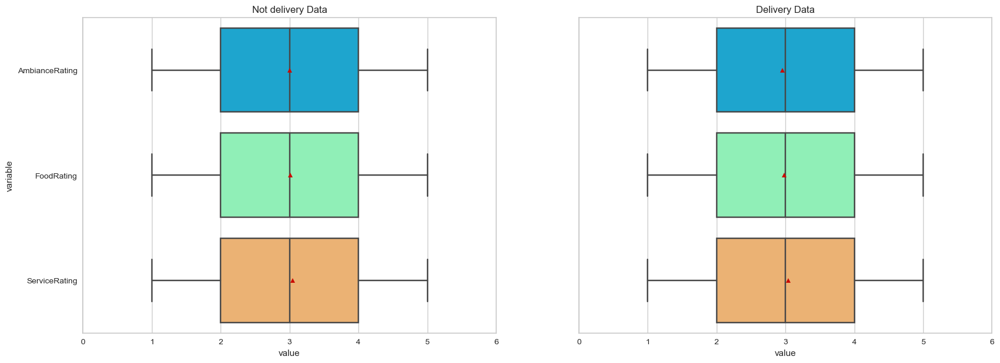

In [42]:
sfa_long = pd.melt(df, id_vars=["DeliveryOrder_n"], value_vars=["ServiceRating", "FoodRating", "AmbianceRating"])
boxplot_compare(sfa_long, "DeliveryOrder_n", "variable", "value", 0, 1, "Not delivery", "Delivery")

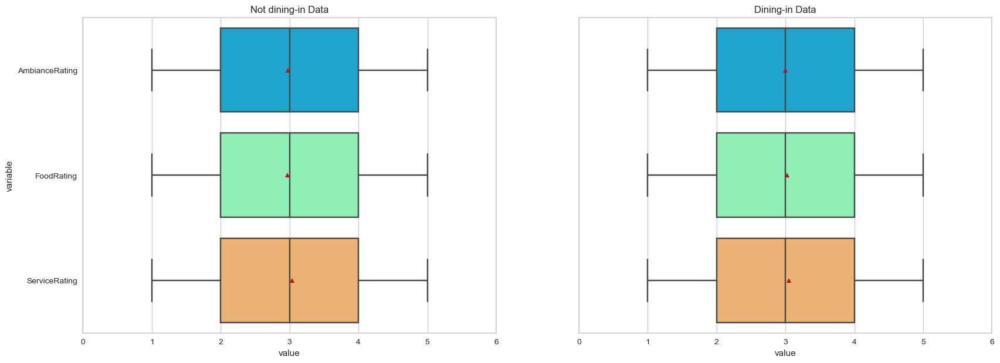

In [43]:
sfa_long = pd.melt(df, id_vars=["MealType_n"], value_vars=["ServiceRating", "FoodRating", "AmbianceRating"])
boxplot_compare(sfa_long, "MealType_n", "variable", "value", 0, 1, "Not dining-in", "Dining-in")

/var/folders/4t/t1tjs2gd7kzg3jkt5d1snhlh0000gn/T/ipykernel_1256/2061792187.py:8: DeprecationWarning:

In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`



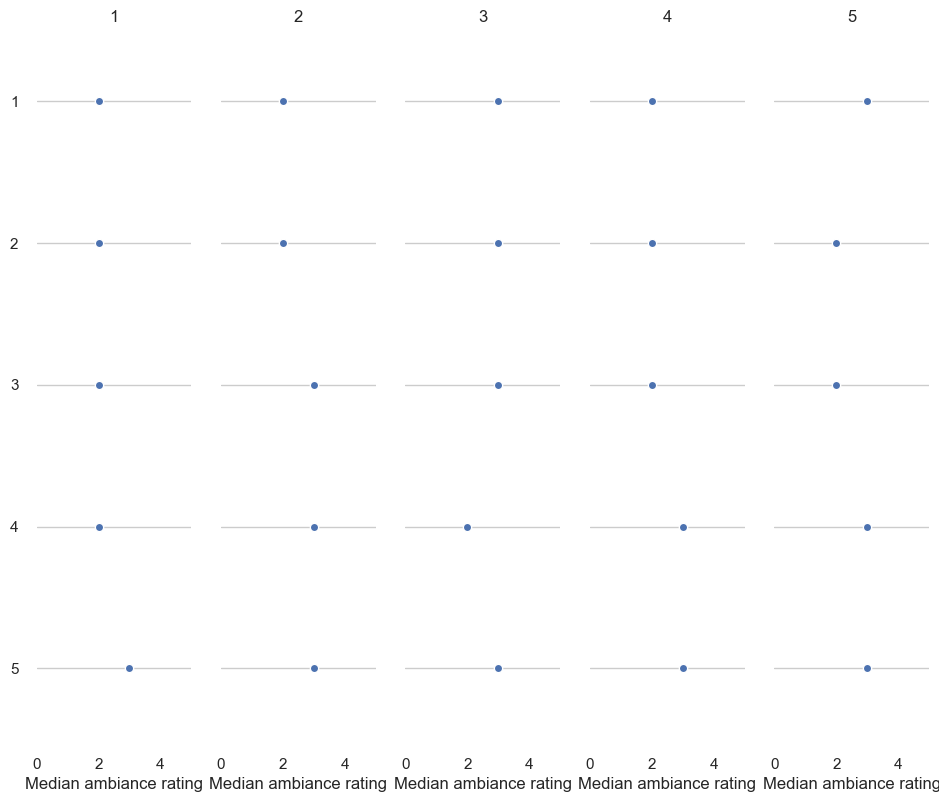

In [44]:
two_cat_cont_compare(df, "ServiceRating", "FoodRating", "AmbianceRating", "Median ambiance rating")

In [45]:
agg_data = df.groupby(["LoyaltyProgramMember_n"])["ServiceRating", "FoodRating", "AmbianceRating"].mean().reset_index()
agg_data

/var/folders/4t/t1tjs2gd7kzg3jkt5d1snhlh0000gn/T/ipykernel_1256/3587100808.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,LoyaltyProgramMember_n,ServiceRating,FoodRating,AmbianceRating
0,0,3.051282,2.985897,3.014103
1,1,3.036111,3.009722,2.958333


In [46]:
agg_data = df.groupby(["LoyaltyProgramMember_n", "MealType_n"])["ServiceRating", "FoodRating", "AmbianceRating"].mean().reset_index()
agg_data


/var/folders/4t/t1tjs2gd7kzg3jkt5d1snhlh0000gn/T/ipykernel_1256/2101899482.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,LoyaltyProgramMember_n,MealType_n,ServiceRating,FoodRating,AmbianceRating
0,0,0,3.080214,2.962567,3.024064
1,0,1,3.024631,3.007389,3.004926
2,1,0,2.994667,2.973333,2.936000
3,1,1,3.081159,3.049275,2.982609


There are lower scores for those not dining in the restaurant and there seems to be less positivity from those on the loyalty program.

In [47]:
sfa_long = pd.melt(df, id_vars=["TimeOfVisit"], value_vars=["ServiceRating", "FoodRating", "AmbianceRating"])
sfa_long_gb = sfa_long.groupby(["TimeOfVisit", "variable"])["value"].mean().reset_index()
fig = px.line(sfa_long_gb, x="TimeOfVisit", y="value", color='variable', title="Ratings by time of visit")
fig.show()

The average food rating is slightly lower for the lunch visits, which may be explained by the shortness of the lunch interval.

In [48]:
sfa_long = pd.melt(df, id_vars=["DiningOccasion"], value_vars=["ServiceRating", "FoodRating", "AmbianceRating"])
sfa_long_gb = sfa_long.groupby(["DiningOccasion", "variable"])["value"].mean().reset_index()
fig = px.line(sfa_long_gb, x="DiningOccasion", y="value", color='variable', title="Ratings by dining occasion")
fig.show()

There seems to be an improvement in the average service rating if the customers are perceived to be there on business. Likewise for a celebration the food and ambience average ratings are slightly lower compared to the other dining occasions.

In [49]:
df.head()

,CustomerID,Age,Income,VisitFrequency,AverageSpend,PreferredCuisine,TimeOfVisit,GroupSize,DiningOccasion,OnlineReservation_n,DeliveryOrder_n,LoyaltyProgramMember_n,WaitTime,ServiceRating,FoodRating,AmbianceRating,HighSatisfaction_n,Gender_n,MealType_n
0,654,35,83380,Weekly,27.829142,Chinese,Breakfast,3,Business,0,1,1,43.523929,2,5,4,0,0,0
1,655,19,43623,Rarely,115.408622,American,Dinner,1,Casual,0,0,0,57.524294,5,5,3,0,0,1
2,656,41,83737,Weekly,106.693771,American,Dinner,6,Celebration,0,1,0,48.682623,3,4,5,0,1,1
3,657,43,96768,Rarely,43.508508,Indian,Lunch,1,Celebration,0,0,0,7.552993,4,5,1,0,0,1
4,658,55,67937,Monthly,148.084627,Chinese,Breakfast,1,Business,0,0,1,37.789041,2,3,5,0,1,0


### Exploration

In [50]:
fig = px.scatter(
    df,
    x="Age",
    y="AverageSpend",
    color="TimeOfVisit",
    size="Income",
    hover_data=["Age", "Income"],
    labels={
        "Age": "Age (years)",
        "TimeOfVisit": "Time of visit",
        "AverageSpend": "Average spend ($)",
        "Income": "Income",
    },
    width=900,
    height=600,
    title="Age versus Average spend",
)
fig.update_layout(
    template="plotly_white",
)
fig.show()


In [51]:
checkb = df[df.TimeOfVisit == "Breakfast"]
checkl = df[df.TimeOfVisit == "Lunch"]
checkd = df[df.TimeOfVisit == "Dinner"]

fig = make_subplots(rows=1, cols=3)

fig.add_trace(go.Scatter(x=checkb.Age, y=checkb.AverageSpend, mode="markers"), row=1, col=1)

fig.add_trace(go.Scatter(x=checkl.Age, y=checkl.AverageSpend, mode="markers"), row=1, col=2)

fig.add_trace(go.Scatter(x=checkd.Age, y=checkd.AverageSpend, mode="markers"), row=1, col=3)

fig.update_layout(height=600, width=800, title_text="Subplots of Age versus Average spend by time of visit")
fig.show()

### Target

In [52]:
df.head()

,CustomerID,Age,Income,VisitFrequency,AverageSpend,PreferredCuisine,TimeOfVisit,GroupSize,DiningOccasion,OnlineReservation_n,DeliveryOrder_n,LoyaltyProgramMember_n,WaitTime,ServiceRating,FoodRating,AmbianceRating,HighSatisfaction_n,Gender_n,MealType_n
0,654,35,83380,Weekly,27.829142,Chinese,Breakfast,3,Business,0,1,1,43.523929,2,5,4,0,0,0
1,655,19,43623,Rarely,115.408622,American,Dinner,1,Casual,0,0,0,57.524294,5,5,3,0,0,1
2,656,41,83737,Weekly,106.693771,American,Dinner,6,Celebration,0,1,0,48.682623,3,4,5,0,1,1
3,657,43,96768,Rarely,43.508508,Indian,Lunch,1,Celebration,0,0,0,7.552993,4,5,1,0,0,1
4,658,55,67937,Monthly,148.084627,Chinese,Breakfast,1,Business,0,0,1,37.789041,2,3,5,0,1,0


In [53]:
target = "HighSatisfaction_n"
fig = px.pie(df, names=target, title="Category values for target variable")
fig.show()

### Influential observations

In [54]:
num_cols = list(df.select_dtypes(include=["number"], exclude=["datetime", "timedelta"]).columns)
num_cols = (list(set(num_cols) - set([col for col in df.columns if ("_n" in col)])))
num_cols.remove("CustomerID")
print(num_cols)

['Income', 'AverageSpend', 'FoodRating', 'Age', 'WaitTime', 'ServiceRating', 'GroupSize', 'AmbianceRating']


In [55]:
X_lt = df[num_cols]
y = df[target]
X_lt_constant = sm.add_constant(X_lt, prepend=False)
logit_results = sm.GLM(y, X_lt_constant, family = sm.families.Binomial()).fit()
print(logit_results.summary())

influence = logit_results.get_influence()
summ_df = influence.summary_frame()

# Filter summary df to Cook"s distance values only
diagnosis_df = summ_df[["cooks_d"]]

# Set Cook"s distance threshold
cook_threshold = 4 / len(X_lt)

# Append absolute standardized residual values
diagnosis_df["std_resid"] = stats.zscore(logit_results.resid_pearson)
diagnosis_df["std_resid"] = diagnosis_df["std_resid"].apply(lambda x: np.abs(x))
diagnosis_df = pd.concat([diagnosis_df, X_lt], axis = 1)
diagnosis_df[target] = df[target]
diagnosis_df["Extreme"] = "No"
diagnosis_df.loc[(diagnosis_df["cooks_d"] > cook_threshold) & (diagnosis_df["std_resid"] > 3), "Extreme"] = "Yes"

# Find observations which are outlier (std dev > 3) and highly influential
extreme = diagnosis_df[(diagnosis_df["cooks_d"] > cook_threshold) &
                       (diagnosis_df["std_resid"] > 3)]

# Show top 5 highly influential outlier observations
print(extreme.shape)
# (9, 13)
extreme.sort_values("cooks_d", ascending=False)

                 Generalized Linear Model Regression Results                  
Dep. Variable:     HighSatisfaction_n   No. Observations:                 1500
Model:                            GLM   Df Residuals:                     1491
Model Family:                Binomial   Df Model:                            8
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -529.63
Date:                Wed, 03 Jul 2024   Deviance:                       1059.3
Time:                        12:31:33   Pearson chi2:                 1.57e+03
No. Iterations:                     6   Pseudo R-squ. (CS):            0.07842
Covariance Type:            nonrobust                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
Income          7.856e-06   2.15e-06      3.

/var/folders/4t/t1tjs2gd7kzg3jkt5d1snhlh0000gn/T/ipykernel_1256/2549534442.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/4t/t1tjs2gd7kzg3jkt5d1snhlh0000gn/T/ipykernel_1256/2549534442.py:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,cooks_d,std_resid,Income,AverageSpend,FoodRating,Age,WaitTime,ServiceRating,GroupSize,AmbianceRating,HighSatisfaction_n,Extreme
1381,0.009838,4.757079,130704,58.021653,1,19,18.532919,4,9,1,1,Yes
1422,0.009681,5.902809,35520,81.499813,1,65,14.140315,1,7,2,1,Yes
1415,0.009149,3.801599,57727,184.028156,1,21,16.532616,1,6,5,1,Yes
1441,0.009067,4.605193,117887,190.664628,1,59,55.462106,3,4,1,1,Yes
1304,0.008927,3.323414,95495,188.758931,4,67,59.498773,5,9,2,1,Yes
1450,0.008625,5.537800,139374,47.189130,1,36,54.158380,3,7,4,1,Yes
1378,0.008424,4.557502,136645,106.804824,3,69,46.685161,1,8,2,1,Yes
1438,0.008339,6.303562,49451,26.535668,1,51,19.842091,2,7,2,1,Yes
1327,0.008222,4.016173,54527,194.884510,2,32,43.199608,5,9,4,1,Yes
317,0.007924,3.265880,101549,74.792903,1,18,0.267692,1,3,2,1,Yes


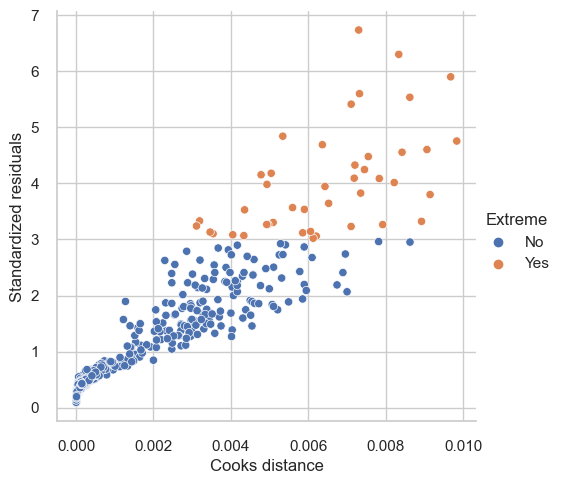

In [56]:
sns.relplot(x="cooks_d", y="std_resid", data=diagnosis_df, kind="scatter", hue="Extreme")
plt.ylabel("Standardized residuals")
plt.xlabel("Cooks distance")
plt.show()


In [57]:
extreme.describe()

,cooks_d,std_resid,Income,AverageSpend,FoodRating,Age,WaitTime,ServiceRating,GroupSize,AmbianceRating,HighSatisfaction_n
count,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.0
mean,0.006461,4.031493,81790.813953,97.439502,2.255814,41.302326,34.431324,2.604651,5.558140,2.837209,1.0
std,0.001815,0.948951,35978.029882,49.503157,1.274157,14.887730,17.152796,1.433270,2.185475,1.396087,0.0
min,0.003112,3.022578,23930.000000,13.002185,1.000000,18.000000,0.267692,1.000000,2.000000,1.000000,1.0
25%,0.005000,3.266755,56269.500000,59.144809,1.000000,28.500000,22.183471,1.000000,4.000000,2.000000,1.0
50%,0.006432,3.827726,75552.000000,86.403799,2.000000,41.000000,36.035402,2.000000,5.000000,3.000000,1.0
75%,0.007694,4.518688,105503.500000,129.780859,3.000000,52.500000,48.891241,4.000000,7.000000,4.000000,1.0
max,0.009838,6.738298,142579.000000,196.363626,5.000000,69.000000,59.707407,5.000000,9.000000,5.000000,1.0


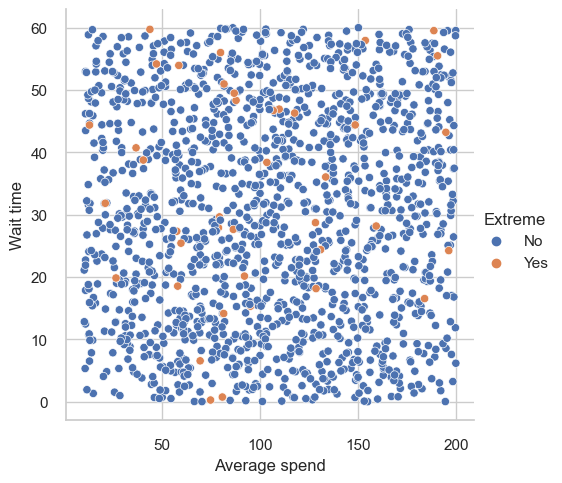

In [58]:
sns.relplot(x="AverageSpend", y="WaitTime", data=diagnosis_df, kind="scatter", hue="Extreme")
plt.ylabel("Wait time")
plt.xlabel("Average spend")
plt.show()


In [59]:
# Remove outliers

dfa = pd.concat([df, diagnosis_df["Extreme"]], axis=1)
df = dfa[dfa.Extreme == "No"]
df = df.drop(["Extreme"], axis=1)
print(dfa.shape, df.shape)
# (1500, 20) (1457, 19)


(1500, 20) (1457, 19)


### Numerical data

In [60]:
num_cols = list(df.select_dtypes(include=["number"], exclude=["datetime", "timedelta"]).columns)
num_cols = (list(set(num_cols) - set([col for col in df.columns if ("_n" in col)])))
num_cols.remove("CustomerID")
print(num_cols)

['Income', 'AverageSpend', 'FoodRating', 'Age', 'WaitTime', 'ServiceRating', 'GroupSize', 'AmbianceRating']


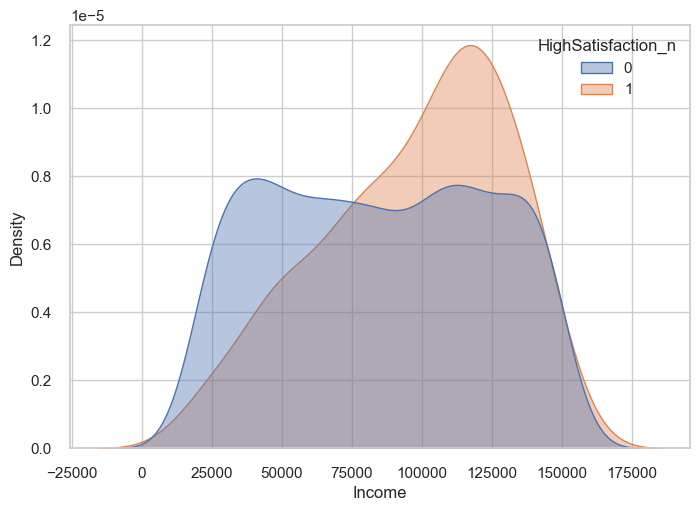

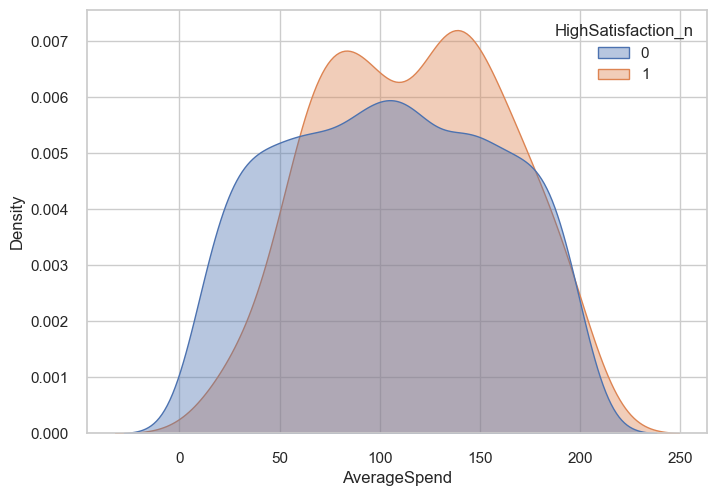

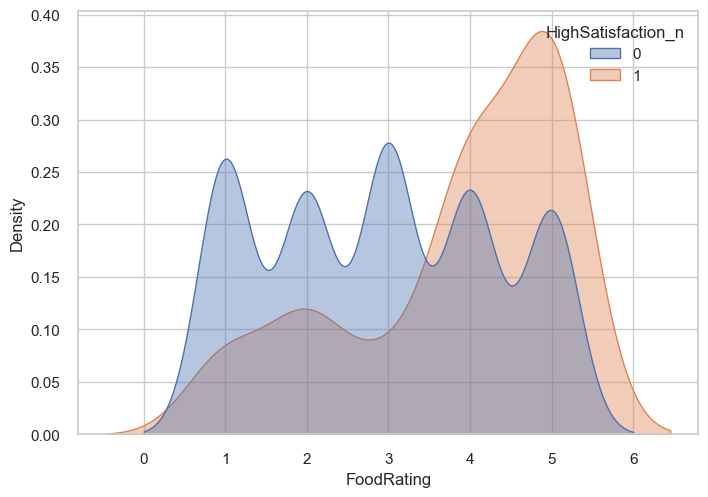

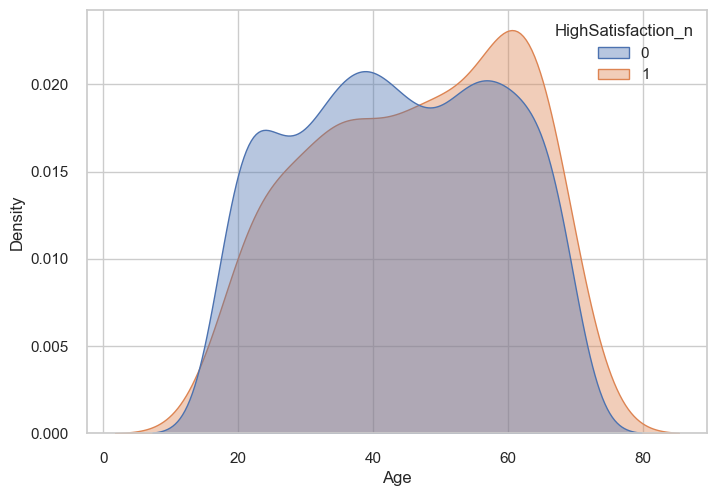

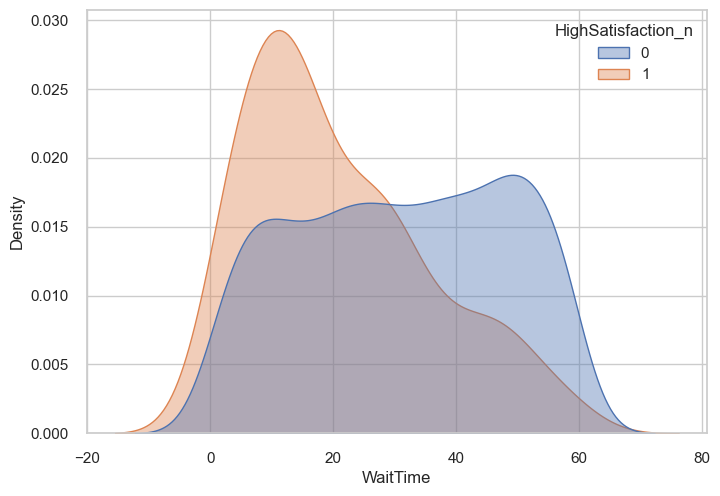

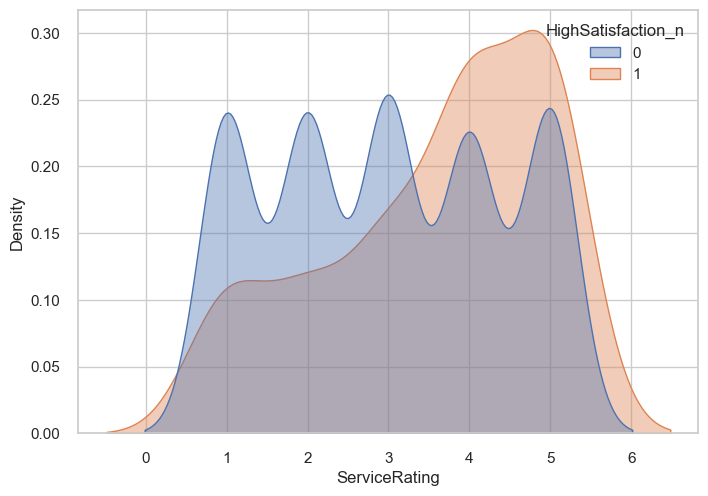

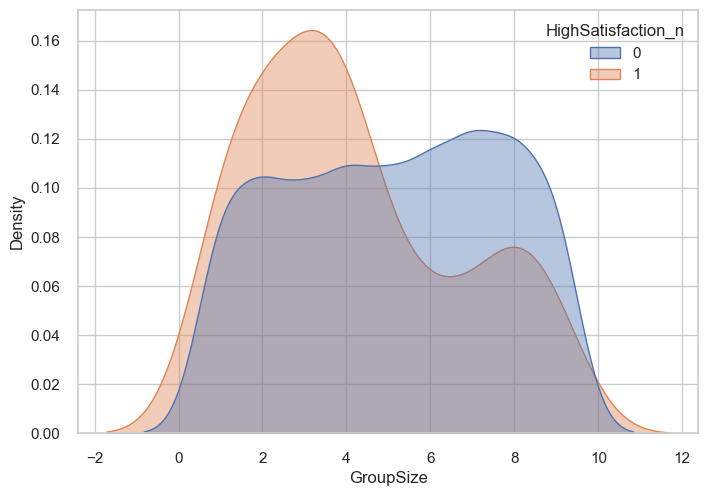

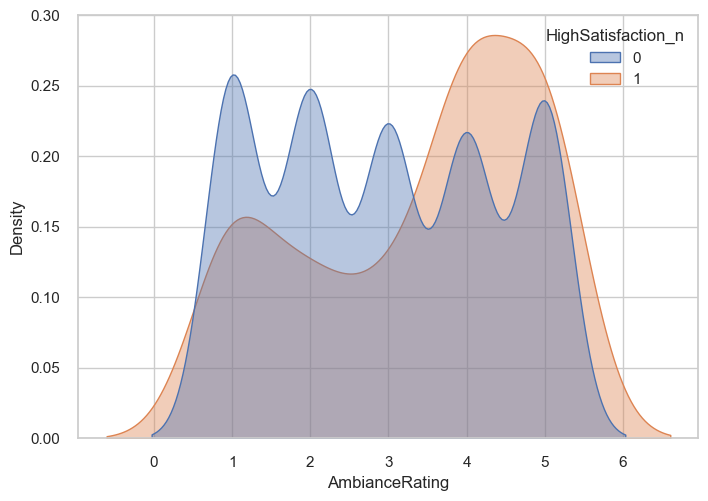

In [61]:
for name in num_cols:
    sns.kdeplot(data=df, x=name, hue=target, fill=True, common_norm=False, alpha=0.4)
    plt.show()

### Categorical data

In [62]:
cat_cols = list(df.select_dtypes(include=["object"]))
cat_cols = cat_cols + [col for col in df.columns if ("_n" in col)]
cat_cols.remove("HighSatisfaction_n")
print(cat_cols)

['VisitFrequency', 'PreferredCuisine', 'TimeOfVisit', 'DiningOccasion', 'OnlineReservation_n', 'DeliveryOrder_n', 'LoyaltyProgramMember_n', 'Gender_n', 'MealType_n']


In [63]:
for name in cat_cols:
    pie_chart(df, name, threshold=100)


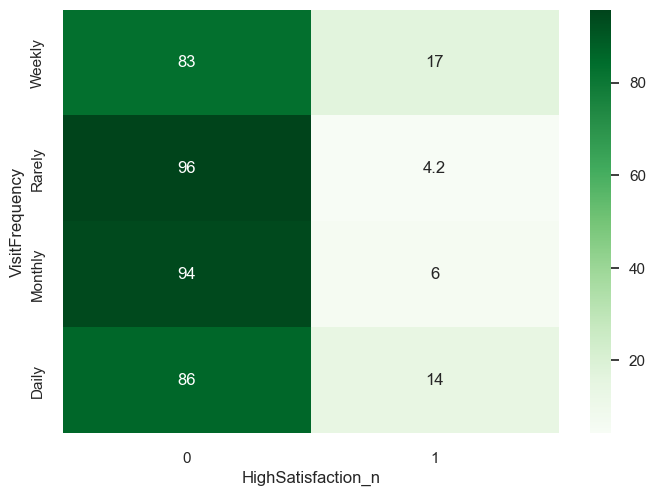

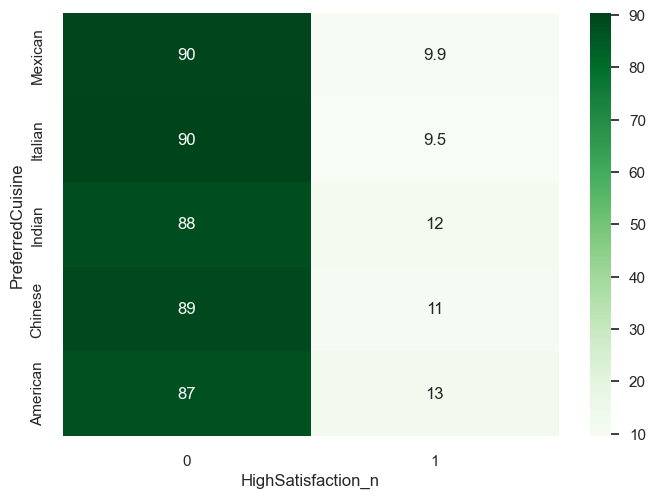

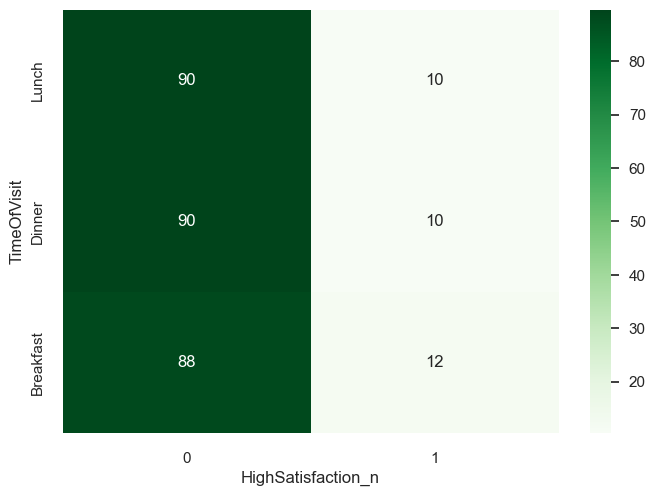

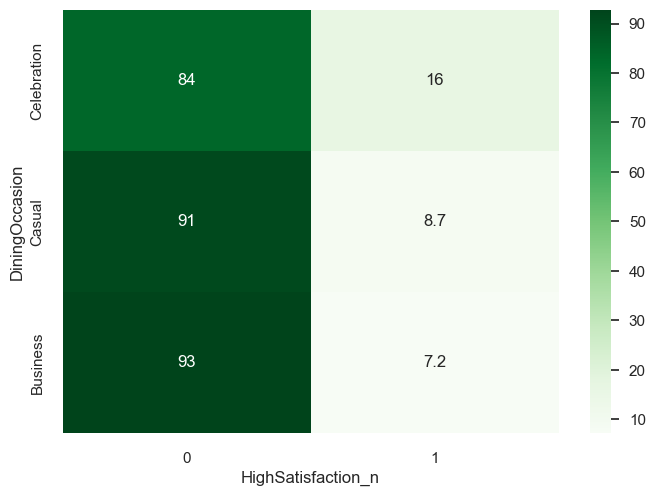

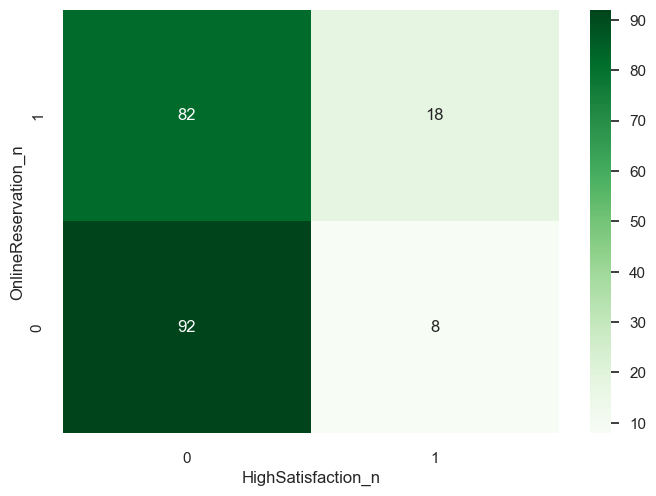

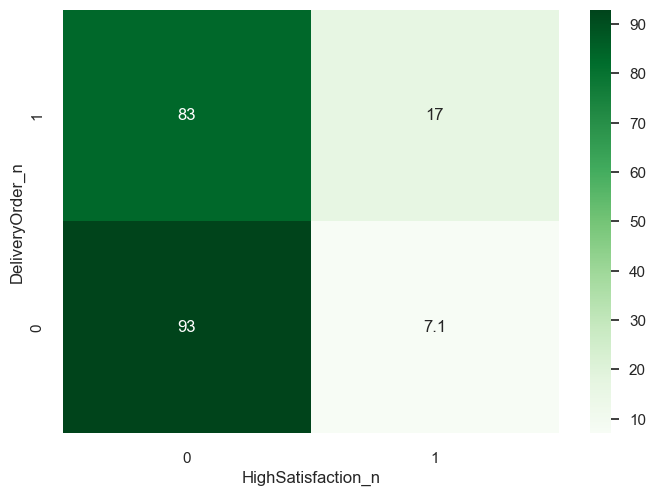

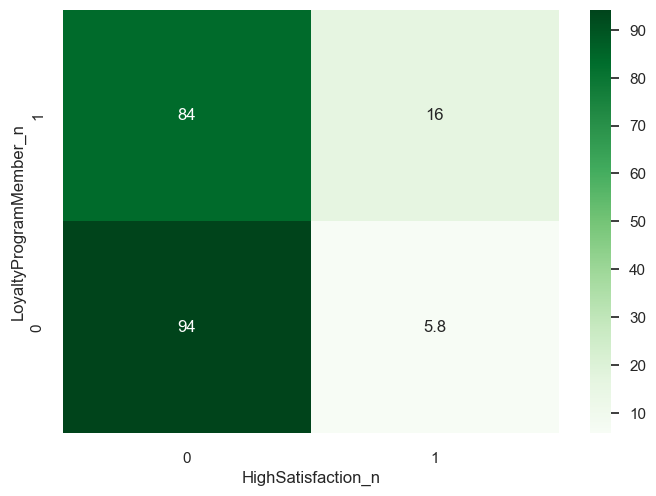

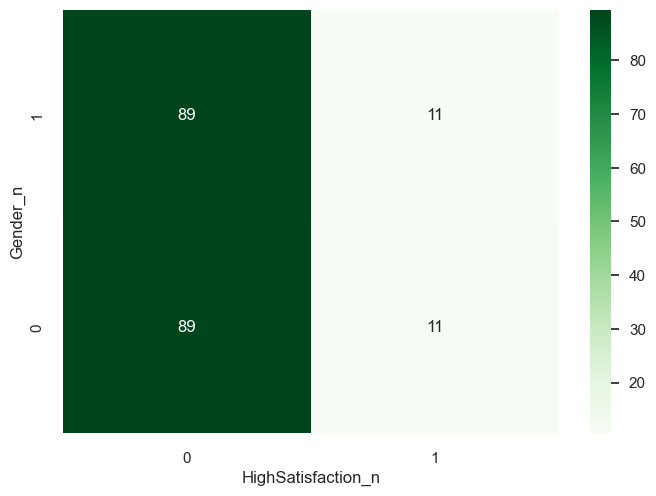

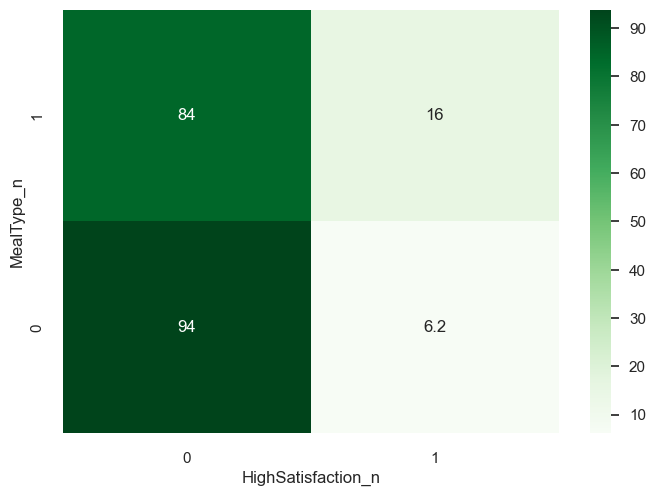

In [64]:
for name in cat_cols:
    cross_tab = pd.DataFrame(pd.crosstab(df[name], df[target], normalize="index"))
    cross_tab = cross_tab * 100

    ax = sns.heatmap(cross_tab, annot=True, cmap="Greens")
    ax.invert_yaxis()
    plt.show()


### Other visualisations

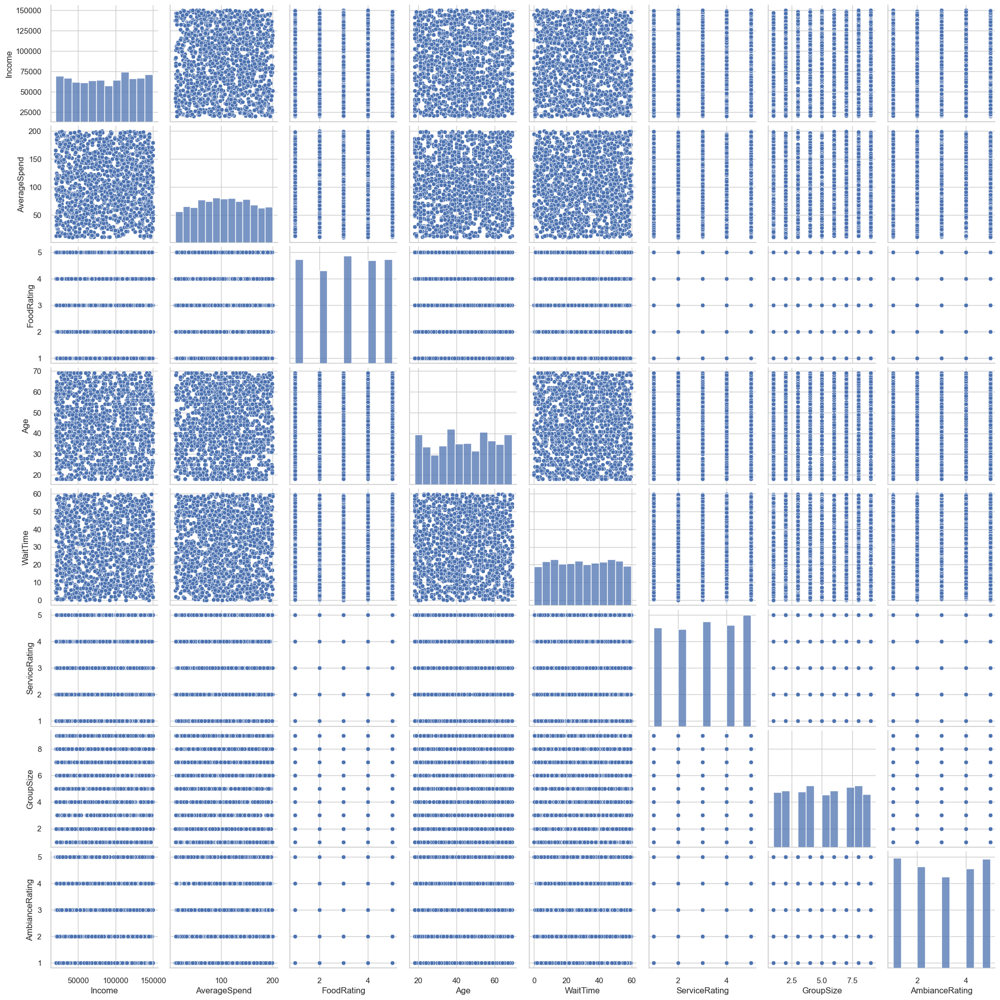

In [65]:
sns.pairplot(df[num_cols])
plt.show()

In [66]:
# Income                    0.342913
# Age                       0.030837
# WaitTime                  0.026820
# FoodRating                0.025153
# VisitFrequency            0.016483

In [67]:
df_copy = df.copy()
df_copy[target] = (df_copy[target] * 100) + 50

fig = px.scatter(
    df_copy,
    x="Age",
    y="WaitTime",
    color="VisitFrequency",
    size=target,
    hover_data=["Age", "Income"],
    labels={
        "Age": "Age (years)",
        "VisitFrequency": "Visit frequency",
        "HighSatisfaction_n": "High satisfaction",
        "WaitTime": "Wait time",
    },
    width=900,
    height=600,
    title="Age versus Wait time",
)
fig.update_layout(
    template="plotly_white",
)
fig.show()


In [68]:
df_copy = df.copy()
df_copy[target] = (df_copy[target] * 100) + 50

fig = px.scatter(
    df_copy,
    x="Age",
    y="WaitTime",
    color="FoodRating",
    size=target,
    hover_data=["Age", "Income"],
    labels={
        "Age": "Age (years)",
        "FoodRating": "Food rating",
        "HighSatisfaction_n": "High satisfaction",
        "WaitTime": "Wait time",
    },
    width=900,
    height=600,
    title="Age versus Wait time",
)
fig.update_layout(
    template="plotly_white",
)
fig.show()


In [69]:
fig = px.scatter(
    df,
    x="Age",
    y="Income",
    color=target,
    size="FoodRating",
    hover_data=["Age", "Income"],
    labels={
        "Age": "Age (years)",
        "Income": "Income",
        "FoodRating": "Food rating",
        "HighSatisfaction_n": "High satisfaction",
    },
    width=900,
    height=600,
    title="Age versus Income",
)
fig.update_layout(
    template="plotly_white",
)
fig.show()


### Test/train split

In [70]:
y = df[target]
X = df.drop([target, "CustomerID"], axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y, shuffle=True, random_state=222)

print(X_train.shape, X_test.shape)
# (1019, 18) (438, 18)

print("Yes train (%): ", round(y_train[y_train == 1].shape[0] / y_train.shape[0] * 100, 2))
print("Yes test (%): ", round(y_test[y_test == 1].shape[0] / y_test.shape[0] * 100, 2))
# Yes train (%):  10.89
# Yes test (%):  10.73

X_train = X_train.reset_index(drop=True)
X_test = X_test.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)
y_test = y_test.reset_index(drop=True)

X_train_orig = X_train.copy()


(1019, 17) (438, 17)
Yes train (%):  10.89
Yes test (%):  10.73


### Examine the features

In [71]:
y = y_train.copy()
X = X_train.copy()

for colname in X.select_dtypes("object"):
    X[colname], _ = X[colname].factorize()

discrete_features = X.dtypes == int

In [72]:
mi_scores = make_mi_scores(X, y, discrete_features)
mi_scores

Income                    0.342913
Age                       0.030837
WaitTime                  0.026820
FoodRating                0.025153
VisitFrequency            0.016483
LoyaltyProgramMember_n    0.015593
MealType_n                0.014172
OnlineReservation_n       0.012339
GroupSize                 0.011198
AmbianceRating            0.010413
ServiceRating             0.007941
DeliveryOrder_n           0.007738
DiningOccasion            0.004845
PreferredCuisine          0.001079
AverageSpend              0.000410
TimeOfVisit               0.000176
Gender_n                  0.000011
Name: MI Scores, dtype: float64

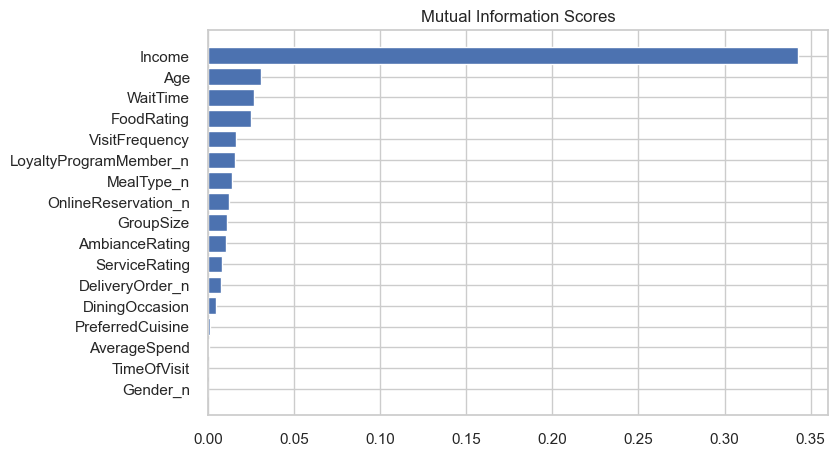

In [73]:
plt.figure(dpi=100, figsize=(8, 5))
plot_mi_scores(mi_scores)
plt.show()

In [74]:
sel_five_cols = SelectKBest(mutual_info_classif, k=5)
sel_five_cols.fit(X, y)
X_train.columns[sel_five_cols.get_support()]

Index(['VisitFrequency', 'OnlineReservation_n', 'LoyaltyProgramMember_n',
       'WaitTime', 'FoodRating'],
      dtype='object')

### Features from tree classification (do not rerun)

In [75]:
cat_cols = list(X_train.select_dtypes(include=["object"]))
cat_cols = cat_cols + [col for col in X_train.columns if ("_n" in col)]
print(cat_cols)

num_cols = list(X_train.select_dtypes(include=["number"],
                                      exclude=["datetime", "timedelta"]).columns)
num_cols = (list(set(num_cols) - set([col for col in X_train.columns if ("_n" in col)])))
print(num_cols)

bin_cols = [col for col in X_train.columns if ("_n" in col)]
print(bin_cols)

['VisitFrequency', 'PreferredCuisine', 'TimeOfVisit', 'DiningOccasion', 'OnlineReservation_n', 'DeliveryOrder_n', 'LoyaltyProgramMember_n', 'Gender_n', 'MealType_n']
['Income', 'AverageSpend', 'FoodRating', 'Age', 'WaitTime', 'ServiceRating', 'GroupSize', 'AmbianceRating']
['OnlineReservation_n', 'DeliveryOrder_n', 'LoyaltyProgramMember_n', 'Gender_n', 'MealType_n']


In [76]:
preprocessor = ColumnTransformer(transformers=[("cat", OneHotEncoder(), cat_cols)], remainder="passthrough")

X_train_tree = pd.DataFrame(preprocessor.fit_transform(X_train), columns=preprocessor.get_feature_names_out())
#.toarray()
X_train_tree = X_train_tree.reset_index(drop=True)
X_train_tree.columns = X_train_tree.columns.str.removeprefix("cat__")
X_train_tree.columns = X_train_tree.columns.str.removeprefix("remainder__")
#print(X_train_tree.columns)
X_train_tree.head()

,VisitFrequency_Daily,VisitFrequency_Monthly,VisitFrequency_Rarely,VisitFrequency_Weekly,PreferredCuisine_American,PreferredCuisine_Chinese,PreferredCuisine_Indian,PreferredCuisine_Italian,PreferredCuisine_Mexican,TimeOfVisit_Breakfast,...,MealType_n_0,MealType_n_1,Age,Income,AverageSpend,GroupSize,WaitTime,ServiceRating,FoodRating,AmbianceRating
0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,1.0,0.0,57.0,99335.0,131.089135,3.0,12.310390,4.0,1.0,4.0
1,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,1.0,21.0,140769.0,21.782624,1.0,4.816431,4.0,3.0,1.0
2,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.0,1.0,22.0,145965.0,51.479883,5.0,28.730600,3.0,4.0,3.0
3,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,1.0,0.0,39.0,53426.0,133.378162,5.0,37.730552,3.0,4.0,3.0
4,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,54.0,92219.0,161.248614,7.0,47.413765,4.0,3.0,1.0


In [77]:
clf = DecisionTreeClassifier(max_depth=5, random_state=1234)
model = clf.fit(X_train_tree, y_train)

In [78]:
text_representation = tree.export_text(clf, feature_names=list(X_train_tree.columns))

In [79]:
rule_lst = []
flattened_lst = []
flattened_lsts = []

for split_size in tqdm([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8]):
    minutes = 0.001
    t_end = time.time() + 60 * minutes

    while time.time() < t_end:
        k = random.randint(1, len(list(set(X_train_tree.columns))))
        X_trees, X_tree_test, y_trees, y_tree_test = train_test_split(X_train_tree,
                                                                      y_train,
                                                                      test_size = split_size,stratify = y,
                                                                      random_state = 222)
        print(X_trees.shape, y_trees.shape)
        dset = X_trees[random.choices(list(set(X_trees.columns)), k=k)]
        model = clf.fit(dset, y_trees)
        text_representation = tree.export_text(clf, feature_names= list(dset.columns))
        rules, proba = get_rules(clf, list(dset.columns), [0,1], 80, 100)
        rule_lst.append(list(set(rules)))
    flattened_lst = [val for sublist in rule_lst for val in sublist]
    flattened_lst = list(set(flattened_lst))

for i in range(len(flattened_lst)):
    flattened_lsts.append(flattened_lst[i].split(" then class")[0])
flattened_lsts = list(set(flattened_lsts))

 25%|██▌       | 2/8 [00:00<00:00, 13.06it/s]

(917, 33) (917,)
(917, 33) (917,)
(815, 33) (815,)
(815, 33) (815,)
(713, 33) (713,)
(713, 33) (713,)


 50%|█████     | 4/8 [00:00<00:00, 12.20it/s]

(713, 33) (713,)
(611, 33) (611,)
(611, 33) (611,)
(611, 33) (611,)
(509, 33) (509,)
(509, 33) (509,)
(509, 33) (509,)
(407, 33) (407,)
(407, 33) (407,)


100%|██████████| 8/8 [00:00<00:00, 12.62it/s]

(407, 33) (407,)
(305, 33) (305,)
(305, 33) (305,)
(305, 33) (305,)
(305, 33) (305,)
(305, 33) (305,)
(203, 33) (203,)
(203, 33) (203,)
(203, 33) (203,)
(203, 33) (203,)


In [80]:
flattened_lsts

['if (VisitFrequency_Weekly <= 0.5)',
 'if (DeliveryOrder_n_1 <= 0.5) and (PreferredCuisine_American <= 0.5)',
 'if (FoodRating <= 3.5) and (WaitTime > 20.563) and (LoyaltyProgramMember_n_0 <= 0.5) and (Age <= 60.5) and (Age > 18.5)',
 'if (WaitTime > 31.86) and (ServiceRating <= 4.5) and (OnlineReservation_n_0 > 0.5) and (PreferredCuisine_Mexican <= 0.5)',
 'if (FoodRating <= 3.5) and (DeliveryOrder_n_0 > 0.5) and (AverageSpend <= 187.45) and (DiningOccasion_Business <= 0.5)',
 'if (LoyaltyProgramMember_n_0 > 0.5) and (Income <= 94966.5)',
 'if (AverageSpend > 57.766) and (VisitFrequency_Monthly <= 0.5) and (AverageSpend > 58.557) and (AverageSpend <= 197.514) and (AverageSpend <= 175.43)',
 'if (VisitFrequency_Weekly > 0.5)',
 'if (FoodRating <= 3.5) and (WaitTime > 20.563) and (LoyaltyProgramMember_n_0 > 0.5)',
 'if (OnlineReservation_n_1 <= 0.5) and (DiningOccasion_Casual <= 0.5)',
 'if (WaitTime <= 31.86) and (FoodRating <= 3.5) and (DeliveryOrder_n_1 <= 0.5) and (AverageSpend <= 

### New features

In [81]:
for i, dset in enumerate([X_train, X_test]):

    dseta = dset.copy()

    dseta["feature_1"] = 0
    dseta.loc[
        (dseta.FoodRating <= 3.5)
        & (dseta.DeliveryOrder_n == 0)
        & (dseta.MealType_n == 0),
        "feature_1",
    ] = 1

    dseta["feature_2"] = 0
    dseta.loc[
        (dseta.LoyaltyProgramMember_n == 1)
        & (dseta.OnlineReservation_n == 0)
        & (dseta.DiningOccasion == "Celebration")
        & (dseta.AverageSpend <= 187.173)
        & (dseta.Age <= 68.5),
        "feature_2",
    ] = 1

    dseta["feature_3"] = 0
    dseta.loc[
        (dseta.LoyaltyProgramMember_n == 0)
        & (dseta.ServiceRating <= 3.5)
        & (dseta.AverageSpend <= 122.74),
        "feature_3",
    ] = 1

    dseta["feature_4"] = 0
    dseta.loc[
        (dseta.WaitTime > 31.86)
        & (dseta.OnlineReservation_n == 0)
        & (dseta.MealType_n == 0),
        "feature_4",
    ] = 1

    dseta["feature_5"] = 0
    dseta.loc[
        (dseta.OnlineReservation_n == 0)
        & (dseta.VisitFrequency == "Weekly")
        & (dseta.Age > 34.5)
        & (dseta.VisitFrequency != "Daily"),
        "feature_5",
    ] = 1

    dseta["feature_6"] = 0
    dseta.loc[
        (dseta.MealType_n == 0)
        & (dseta.Age <= 45.5)
        & (dseta.DiningOccasion == "Celebration")
        & (dseta.Age > 23.5),
        "feature_6",
    ] = 1

    if i == 0:
        X_train = dseta
    elif i == 1:
        X_test = dseta


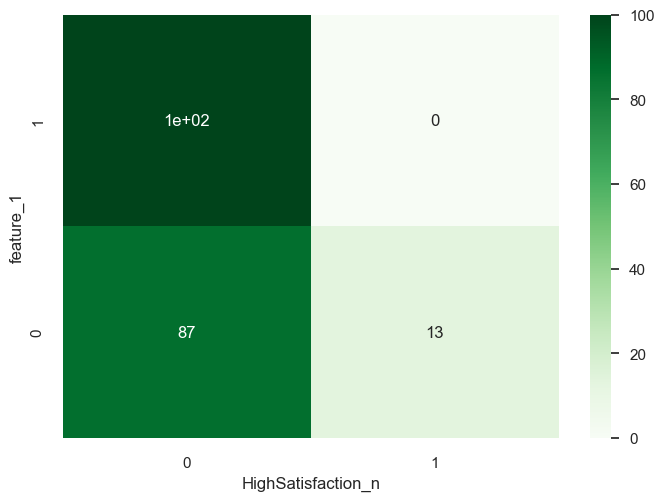

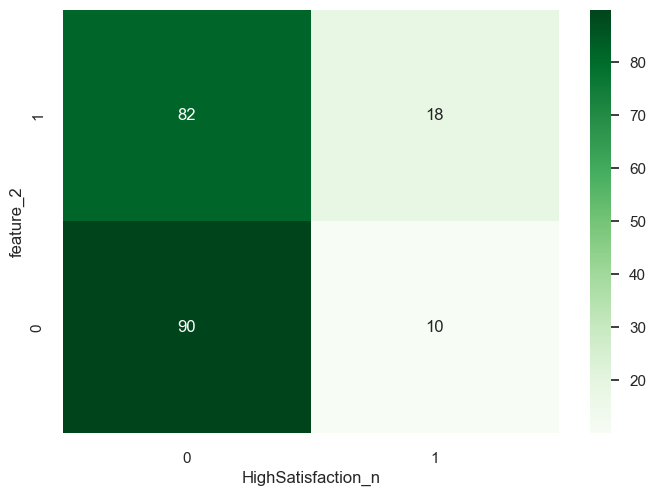

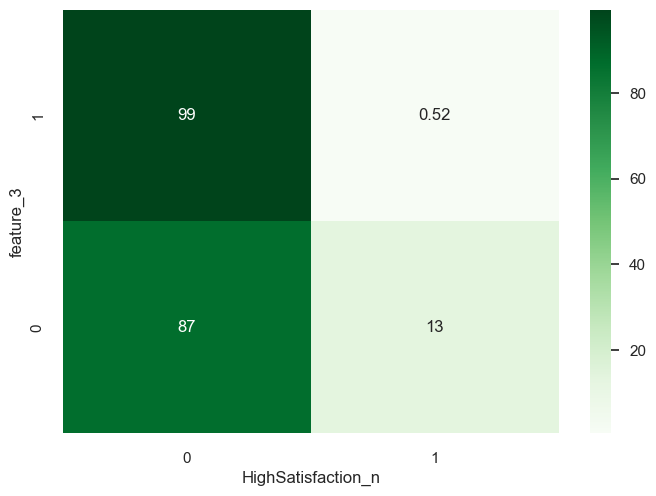

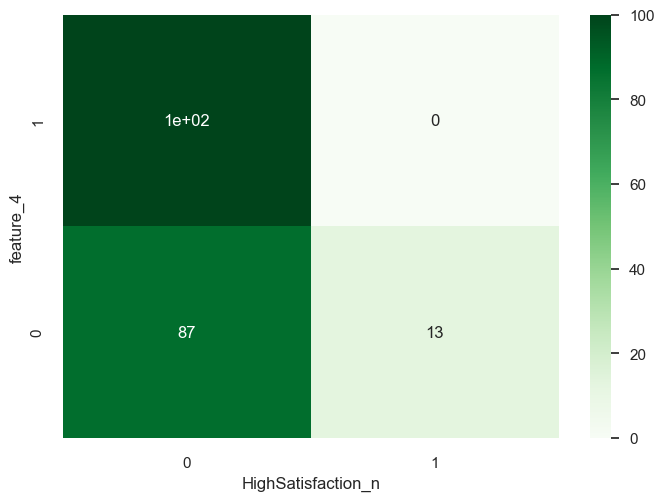

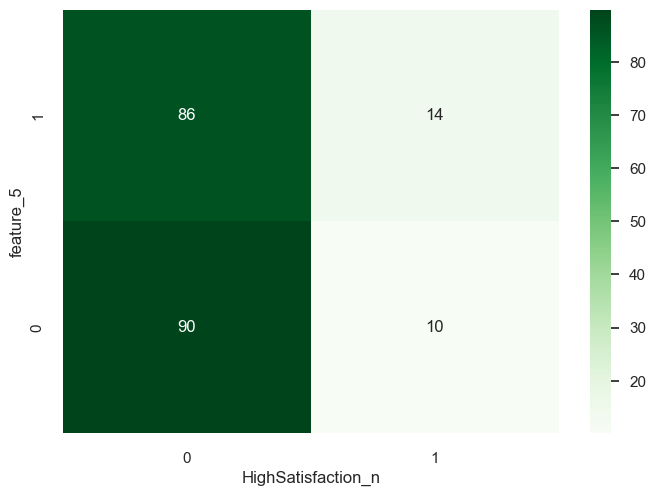

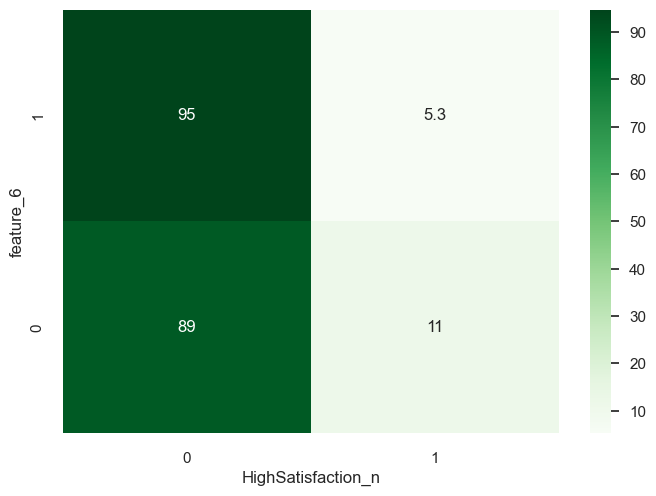

In [82]:
for name in [col for col in X_train.columns if "feature_" in col]:
    cross_tab = pd.DataFrame(pd.crosstab(X_train[name], y_train, normalize="index"))
    cross_tab = cross_tab * 100

    ax = sns.heatmap(cross_tab, annot = True, cmap="Greens")
    ax.invert_yaxis()
    plt.show()

### Binning data

/var/folders/4t/t1tjs2gd7kzg3jkt5d1snhlh0000gn/T/ipykernel_1256/1484926886.py:18: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



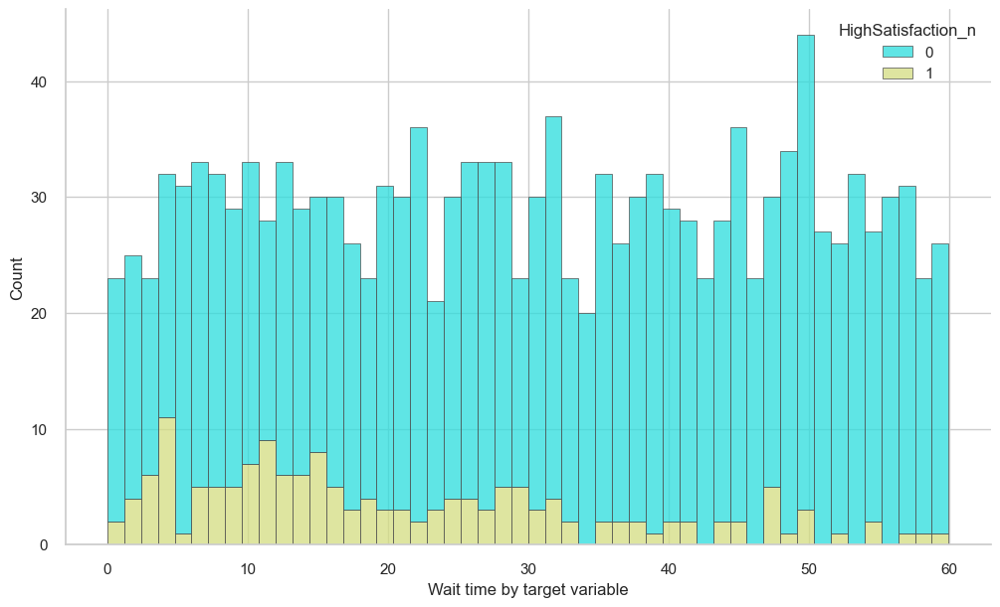

In [83]:
fig, ax = plt.subplots(figsize=(12,7))
sns.despine(fig)

sns.histplot(
    df,
    x="WaitTime",
    hue=target,
    multiple="stack",
    palette="rainbow",
    edgecolor=".3",
    linewidth=.5,
    log_scale=False,
    bins = 50
)
ax.xaxis.set_major_formatter(mpl.ticker.ScalarFormatter())

plt.xlabel("Wait time by target variable")
fig.show()

In [84]:
m_val_lst = ["WaitTime"]

for m_val in m_val_lst:
    X_train[m_val + "_bin"], bin_edges  = pd.qcut(X_train[m_val],
                                                   q = [0, .1, .2, .3, .4, .5, .6, .7, .8, .9, 1],
                                                   retbins = True,
                                                   duplicates = "drop")
    print(m_val, bin_edges,range(len(bin_edges)-1))

    # Train data
    X_train[m_val + "_bin"]  = pd.cut(X_train[m_val],
                                       bins = bin_edges,
                                       labels = range(len(bin_edges)-1),
                                       duplicates = "drop",
                                       include_lowest=True)
    X_train[m_val + "_bin"]  = X_train[m_val + "_bin"].astype(str)
    X_train.loc[X_train[m_val + "_bin"] == "nan",m_val + "_bin"] = "Missing"

    # Test data
    X_test[m_val + "_bin"] = pd.cut(X_test[m_val],
                                    bins = bin_edges,
                                    labels = range(len(bin_edges)-1),
                                    include_lowest=True)

    X_test[m_val + "_bin"] = X_test[m_val + "_bin"].astype("str")
    X_test.loc[X_test[m_val + "_bin"] == "nan",m_val + "_bin"] = "Missing"

WaitTime [1.38029667e-03 6.27341775e+00 1.13419510e+01 1.71407214e+01
 2.30013642e+01 2.91151457e+01 3.58448082e+01 4.25740347e+01
 4.83837015e+01 5.35461858e+01 5.98623862e+01] range(0, 10)


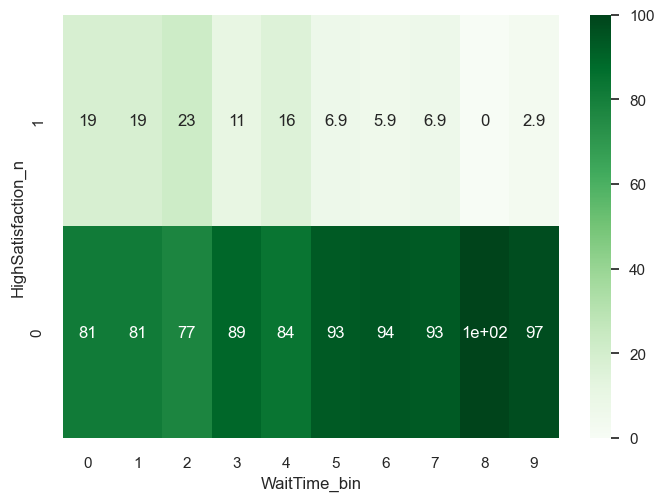

In [85]:
for m_val in m_val_lst:
    pd.crosstab(X_train[m_val + "_bin"], columns="Count")

    re_data = pd.concat([X_train, y_train], axis=1)

    room_t = pd.DataFrame(pd.crosstab(re_data[target], re_data[m_val + "_bin"], normalize="columns"))
    room_t = room_t * 100

    ax = sns.heatmap(room_t, annot=True, cmap="Greens")
    ax.invert_yaxis()
    plt.show()


### Preprocess the model data

In [86]:
col_lst = list(X_train.columns)
col_lst.sort()
print(col_lst)

X_train = X_train.drop(m_val_lst, axis=1)
X_test = X_test.drop(m_val_lst, axis=1)


['Age', 'AmbianceRating', 'AverageSpend', 'DeliveryOrder_n', 'DiningOccasion', 'FoodRating', 'Gender_n', 'GroupSize', 'Income', 'LoyaltyProgramMember_n', 'MealType_n', 'OnlineReservation_n', 'PreferredCuisine', 'ServiceRating', 'TimeOfVisit', 'VisitFrequency', 'WaitTime', 'WaitTime_bin', 'feature_1', 'feature_2', 'feature_3', 'feature_4', 'feature_5', 'feature_6']


In [87]:
# Multicollinearity

num_cols = X_train.select_dtypes(include=np.number).columns.tolist()

vif = calculate_vif(X_train[num_cols])

high_vif = vif[(vif.VIF > 10)]
to_drop_vif = list(high_vif.Features)
print(to_drop_vif)
vif.sort_values(["VIF"], ascending = False)

[]


,Features,VIF
0,Age,9.382182
8,FoodRating,5.874510
7,ServiceRating,5.769025
1,Income,5.510443
2,AverageSpend,5.226416
9,AmbianceRating,5.017929
3,GroupSize,4.749692
11,MealType_n,3.119282
6,LoyaltyProgramMember_n,2.704650
12,feature_1,2.151554


In [88]:
#to_drop_vif = ["nr_employed"]

try:
    X_train = X_train.drop(to_drop_vif, axis = 1)
    X_test = X_test.drop(to_drop_vif, axis = 1)
except KeyError:
    X_train = X_train
    X_test = X_test

In [89]:
num_cols = list(X_train.select_dtypes(include=["number"], exclude=["datetime", "timedelta"]).columns)
num_cols = (list(set(num_cols) - set([col for col in X_train.columns if ("_n" in col) or ("feature_" in col)])))
print(num_cols)

['Income', 'AverageSpend', 'FoodRating', 'Age', 'GroupSize', 'AmbianceRating', 'ServiceRating']


#### Correlation

[]


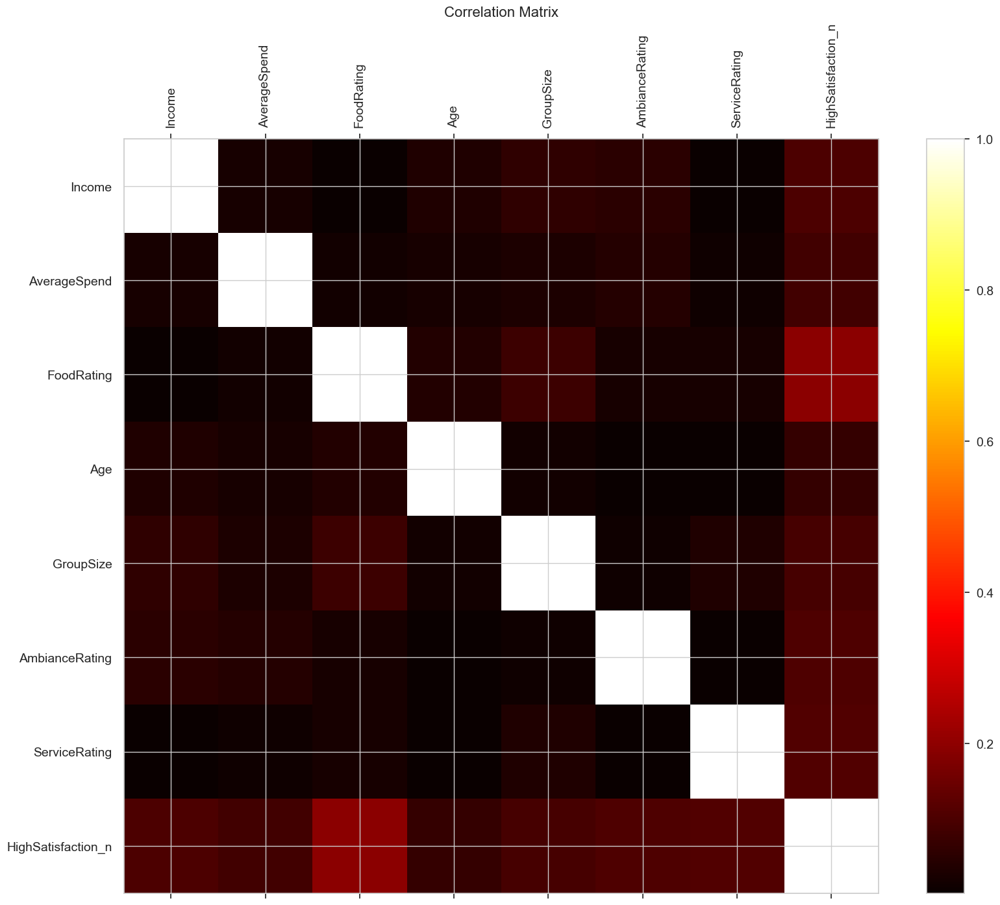

In [90]:
corre_data = pd.concat([X_train[num_cols], pd.DataFrame(y_train)], axis=1)

cor_matrix = corre_data.corr().abs()
upper_tri = cor_matrix.where(np.triu(np.ones(cor_matrix.shape), k=1).astype(bool))

to_drop_corr = [column for column in upper_tri.columns if any(upper_tri[column] > 0.8)]
print(to_drop_corr)

f = plt.figure(figsize=(19, 15))
plt.matshow(cor_matrix, fignum=f.number, cmap=plt.get_cmap("hot"))
plt.xticks(
    range(corre_data.select_dtypes(["number"]).shape[1]),
    corre_data.select_dtypes(["number"]).columns,
    fontsize=14,
    rotation=90,
)
plt.yticks(
    range(corre_data.select_dtypes(["number"]).shape[1]), corre_data.select_dtypes(["number"]).columns, fontsize=14
)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title("Correlation Matrix", fontsize=16)
plt.show()


In [91]:
try:
    X_train = X_train.drop(to_drop_corr, axis = 1)
    X_test = X_test.drop(to_drop_corr, axis = 1)
except KeyError:
    X_train = X_train
    X_test = X_test

In [92]:
# High cardinality adjustment

cat_cols = X_train.select_dtypes(include=["object", "category"]).columns.tolist()

card_vars = []
cat_data = X_train[cat_cols]
for i in range(cat_data.shape[1]):
    X_train.loc[X_train[cat_data.columns[i]].isnull(), cat_data.columns[i]] = "Missing"
    X_test.loc[X_test[cat_data.columns[i]].isnull(), cat_data.columns[i]] = "Missing"

    if len(list(set(cat_data.iloc[:, i]))) > 100:
        card_vars.append(cat_data.columns[i])

    if cat_data.iloc[:, i].nunique() > 60:
        print(cat_data.columns[i], len(list(set(cat_data.iloc[:, i]))))

        a = pd.crosstab(cat_data[cat_data.columns[i]], columns="Count")
        a = pd.DataFrame(a).sort_values("Count", ascending=False).reset_index()
        val_list = list(a.iloc[:30, 0])
        X_train.loc[~X_train[cat_data.columns[i]].isin(val_list), cat_data.columns[i]] = "Other"
        X_test.loc[~X_test[cat_data.columns[i]].isin(val_list), cat_data.columns[i]] = "Other"

print(card_vars)


[]


#### Standardisation

In [93]:
num_cols = list(X_train.select_dtypes(include=["number"], exclude=["datetime", "timedelta"]).columns)
num_cols = (list(set(num_cols) - set([col for col in X_train.columns if ("_n" in col) or ("feature_" in col)])))
print(num_cols)

cat_cols = list(X_train.select_dtypes(include=["object", "category"]))
cat_cols = (list(set(cat_cols) - set([col for col in X_train.columns if "_bin" in col])))
cat_cols.remove("VisitFrequency")
print(cat_cols)

bin_cols = [col for col in X_train.columns if "_n" in col]
print(bin_cols)

ord_cols = ["WaitTime_bin", "VisitFrequency"]

['Income', 'AverageSpend', 'FoodRating', 'Age', 'GroupSize', 'AmbianceRating', 'ServiceRating']
['TimeOfVisit', 'PreferredCuisine', 'DiningOccasion']
['OnlineReservation_n', 'DeliveryOrder_n', 'LoyaltyProgramMember_n', 'Gender_n', 'MealType_n']


In [94]:
preprocessor = ColumnTransformer(
        transformers=[
            ("num", StandardScaler(), num_cols),
            ("cat", OneHotEncoder(), cat_cols)
        ],
        remainder="passthrough"
)

X_train_proc = pd.DataFrame(preprocessor.fit_transform(X_train), columns=preprocessor.get_feature_names_out())
X_test_proc = pd.DataFrame(preprocessor.fit_transform(X_test), columns=preprocessor.get_feature_names_out())

print(X_train_proc.shape, X_test_proc.shape)

print(
    f"Data min:max {X_train_proc[[col for col in X_train_proc.columns if ('cat__' in col) or ('num__' in col)]].min().min(), X_train_proc[[col for col in X_train_proc.columns if ('cat__' in col) or ('num__' in col)]].max().max()}"
)
print(
    f"Data min:max {X_test_proc[[col for col in X_test_proc.columns if ('cat_' in col) or ('num__' in col)]].min().min(), X_test_proc[[col for col in X_test_proc.columns if ('cat_' in col) or ('num__' in col)]].max().max()}"
)

print(X_train_proc.columns)

(1019, 31) (438, 31)
Data min:max (-1.8057734867597015, 1.7549769238696706)
Data min:max (-1.8656564649552352, 1.882989586783164)
Index(['num__Income', 'num__AverageSpend', 'num__FoodRating', 'num__Age',
       'num__GroupSize', 'num__AmbianceRating', 'num__ServiceRating',
       'cat__TimeOfVisit_Breakfast', 'cat__TimeOfVisit_Dinner',
       'cat__TimeOfVisit_Lunch', 'cat__PreferredCuisine_American',
       'cat__PreferredCuisine_Chinese', 'cat__PreferredCuisine_Indian',
       'cat__PreferredCuisine_Italian', 'cat__PreferredCuisine_Mexican',
       'cat__DiningOccasion_Business', 'cat__DiningOccasion_Casual',
       'cat__DiningOccasion_Celebration', 'remainder__VisitFrequency',
       'remainder__OnlineReservation_n', 'remainder__DeliveryOrder_n',
       'remainder__LoyaltyProgramMember_n', 'remainder__Gender_n',
       'remainder__MealType_n', 'remainder__feature_1', 'remainder__feature_2',
       'remainder__feature_3', 'remainder__feature_4', 'remainder__feature_5',
       'remai

In [95]:
X_train.VisitFrequency.unique()

array(['Rarely', 'Weekly', 'Monthly', 'Daily'], dtype=object)

In [96]:
ordinal_lst = ["remainder__WaitTime_bin", "remainder__VisitFrequency"]

ordinal_encoder_bin = OrdinalEncoder(categories=[["Missing", "0", "1", "2", "3", "4", "5", "6", "7", "8", "9"]])
ordinal_encoder_bin.fit(pd.DataFrame(X_train_proc["remainder__WaitTime_bin"]))
ord_data_train = pd.DataFrame(
    ordinal_encoder_bin.transform(pd.DataFrame(X_train_proc["remainder__WaitTime_bin"])), columns=["remainder__WaitTime_bin"]
)
ord_data_test = pd.DataFrame(
    ordinal_encoder_bin.transform(pd.DataFrame(X_test_proc["remainder__WaitTime_bin"])), columns=["remainder__WaitTime_bin"]
)

ordinal_vf_bin = OrdinalEncoder(
    categories=[
        [
            "Rarely",
            "Monthly",
            "Weekly",
            "Daily",
        ]
    ]
)
ordinal_vf_bin.fit(pd.DataFrame(X_train_proc["remainder__VisitFrequency"]))
ord_data_train["remainder__VisitFrequency"] = ordinal_vf_bin.transform(pd.DataFrame(X_train_proc["remainder__VisitFrequency"]))
ord_data_test["remainder__VisitFrequency"] = ordinal_vf_bin.transform(pd.DataFrame(X_test_proc["remainder__VisitFrequency"]))

for name in ordinal_lst:
    ord_data_train[name] = ord_data_train[name].astype(int)
    ord_data_test[name] = ord_data_test[name].astype(int)

transformer_train_o = StandardScaler().fit(ord_data_train)
ord_data_train = pd.DataFrame(transformer_train_o.transform(ord_data_train))
ord_data_train.columns = ordinal_lst

print(f"Training data min:max {ord_data_train.min().min(),ord_data_train.max().max()}")

transformer_test_o = StandardScaler().fit(ord_data_test)
ord_data_test = pd.DataFrame(transformer_test_o.transform(ord_data_test))
ord_data_test.columns = ordinal_lst

print(f"Test data min:max {ord_data_test.min().min(),ord_data_test.max().max()}")


Training data min:max (-1.5657832593391654, 1.7379712936890166)
Test data min:max (-2.051973113797926, 1.6895625855738283)


In [97]:
# Bring data together

try:
    X_train_proc.drop(ordinal_lst, axis=1, inplace=True)
    X_test_proc.drop(ordinal_lst, axis=1, inplace=True)
except KeyError:
    X_train_proc = X_train_proc
    X_test_proc = X_test_proc

ord_data_train = ord_data_train.reset_index(drop=True)
X_train_mod = pd.concat([X_train_proc, ord_data_train], axis=1)

ord_data_test = ord_data_test.reset_index(drop=True)
X_test_mod = pd.concat([X_test_proc, ord_data_test], axis=1)

print(X_train_mod.shape, X_test_mod.shape)
# (1019, 31) (438, 31)


(1019, 31) (438, 31)


In [98]:
print(X_train_mod.columns)

Index(['num__Income', 'num__AverageSpend', 'num__FoodRating', 'num__Age',
       'num__GroupSize', 'num__AmbianceRating', 'num__ServiceRating',
       'cat__TimeOfVisit_Breakfast', 'cat__TimeOfVisit_Dinner',
       'cat__TimeOfVisit_Lunch', 'cat__PreferredCuisine_American',
       'cat__PreferredCuisine_Chinese', 'cat__PreferredCuisine_Indian',
       'cat__PreferredCuisine_Italian', 'cat__PreferredCuisine_Mexican',
       'cat__DiningOccasion_Business', 'cat__DiningOccasion_Casual',
       'cat__DiningOccasion_Celebration', 'remainder__OnlineReservation_n',
       'remainder__DeliveryOrder_n', 'remainder__LoyaltyProgramMember_n',
       'remainder__Gender_n', 'remainder__MealType_n', 'remainder__feature_1',
       'remainder__feature_2', 'remainder__feature_3', 'remainder__feature_4',
       'remainder__feature_5', 'remainder__feature_6',
       'remainder__WaitTime_bin', 'remainder__VisitFrequency'],
      dtype='object')


In [99]:
# Check that train/test sets have same columns

mod_cols = (list(set(list(X_train_mod.columns)) - set(["index"])))
X_train_mod = X_train_mod[mod_cols]
miss_lst = list(set(list(X_train_mod.columns)) - set(list(X_test_mod.columns)))

for name in miss_lst:
    X_test_mod[name] = 0
X_test_mod = X_test_mod[list(X_train_mod.columns)]

drop_test_lst = list(set(list(X_test_mod.columns)) - set(list(X_train_mod.columns)))
X_test_mod = X_test_mod.drop(drop_test_lst, axis = 1)


print(X_train_mod.shape, X_test_mod.shape)
# (1019, 31) (438, 31)

(1019, 31) (438, 31)


In [100]:
X_train_mod.to_feather(os.path.join(path_folder, "data/X_train_mod.ftr"))
X_test_mod.to_feather(os.path.join(path_folder, "data/X_test_mod.ftr"))
y_train_df = pd.DataFrame(y_train)
y_train_df.to_feather(os.path.join(path_folder, "data/y_train.ftr"))
y_test_df = pd.DataFrame(y_test)
y_test_df.to_feather(os.path.join(path_folder, "data/y_test.ftr"))

print(X_train_mod.shape, X_test_mod.shape, y_train_df.shape, y_test_df.shape)
# (1019, 31) (438, 31) (1019, 1) (438, 1)

(1019, 31) (438, 31) (1019, 1) (438, 1)


### Clustering

#### PCA and K means

In [101]:
pca_cols = (list(set(list(X_train_mod.columns)) - set([col for col in X_train_mod.columns if "feature_" in col])))
print(pca_cols)

['cat__TimeOfVisit_Lunch', 'remainder__DeliveryOrder_n', 'cat__PreferredCuisine_Indian', 'cat__PreferredCuisine_Chinese', 'cat__TimeOfVisit_Breakfast', 'cat__PreferredCuisine_Italian', 'cat__TimeOfVisit_Dinner', 'cat__PreferredCuisine_American', 'cat__DiningOccasion_Business', 'num__AverageSpend', 'cat__DiningOccasion_Celebration', 'remainder__Gender_n', 'num__AmbianceRating', 'remainder__VisitFrequency', 'remainder__LoyaltyProgramMember_n', 'num__FoodRating', 'cat__PreferredCuisine_Mexican', 'remainder__MealType_n', 'num__ServiceRating', 'num__Income', 'cat__DiningOccasion_Casual', 'remainder__WaitTime_bin', 'remainder__OnlineReservation_n', 'num__GroupSize', 'num__Age']


In [102]:
cat_cols = [col for col in X_train_mod.columns if ("cat__" in col)] + X_train_mod.select_dtypes(include=["object", "category"]).columns.tolist()
print("Categorical columns:", cat_cols)
num_cols = X_train_mod.select_dtypes(include=np.number).columns.tolist()
num_cols = (list(set(list(X_train_mod.columns)) - set([col for col in X_train_mod.columns if ("_n" in col) or ("feature_" in col)] + cat_cols)))
print("Numeric columns:", num_cols)

for name in cat_cols:
    X_train_mod[name] = X_train_mod[name].astype(int)

Categorical columns: ['cat__TimeOfVisit_Lunch', 'cat__PreferredCuisine_Indian', 'cat__PreferredCuisine_Chinese', 'cat__TimeOfVisit_Breakfast', 'cat__PreferredCuisine_Italian', 'cat__TimeOfVisit_Dinner', 'cat__PreferredCuisine_American', 'cat__DiningOccasion_Business', 'cat__DiningOccasion_Celebration', 'cat__PreferredCuisine_Mexican', 'cat__DiningOccasion_Casual', 'cat__TimeOfVisit_Lunch', 'remainder__DeliveryOrder_n', 'remainder__feature_1', 'cat__PreferredCuisine_Indian', 'remainder__feature_3', 'remainder__feature_6', 'cat__PreferredCuisine_Chinese', 'cat__TimeOfVisit_Breakfast', 'remainder__feature_2', 'cat__PreferredCuisine_Italian', 'cat__TimeOfVisit_Dinner', 'cat__PreferredCuisine_American', 'remainder__feature_4', 'cat__DiningOccasion_Business', 'num__AverageSpend', 'remainder__feature_5', 'cat__DiningOccasion_Celebration', 'remainder__Gender_n', 'num__AmbianceRating', 'remainder__LoyaltyProgramMember_n', 'num__FoodRating', 'cat__PreferredCuisine_Mexican', 'remainder__MealType_

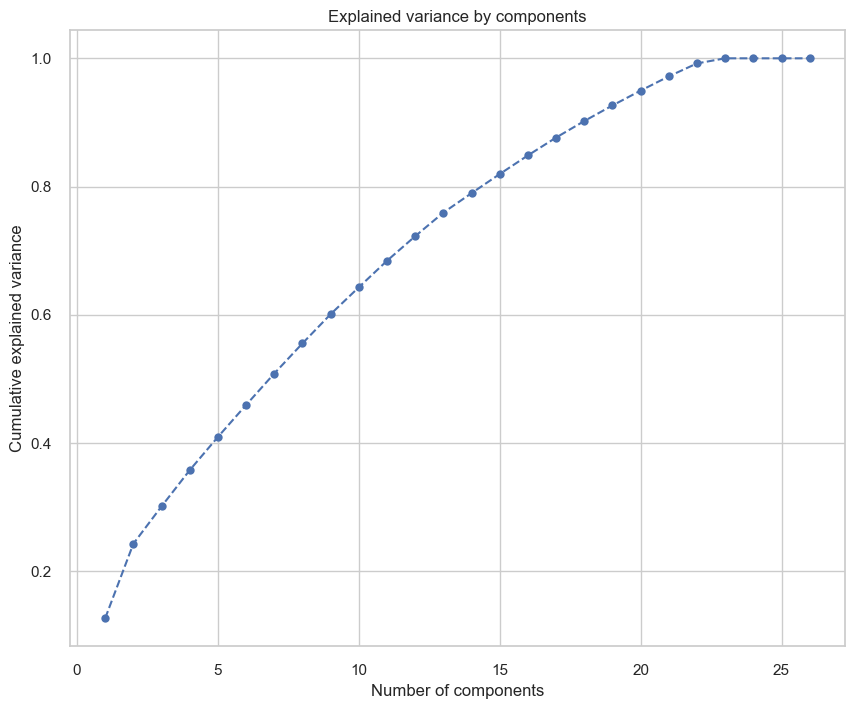

In [103]:

all_data = pd.concat([X_train_mod[pca_cols], y_train], axis = 1)

pca = PCA()
pca.fit(all_data)

plt.figure(figsize=(10,8))
plt.plot(range(1,len(pca.explained_variance_ratio_.cumsum())+1),
         pca.explained_variance_ratio_.cumsum(),
         marker="o",linestyle="--")
plt.title("Explained variance by components")
plt.xlabel("Number of components")
plt.ylabel("Cumulative explained variance")
plt.show()

In [104]:
pca = PCA(n_components=14)
pca.fit(all_data)
scores_pca = pca.transform(all_data)

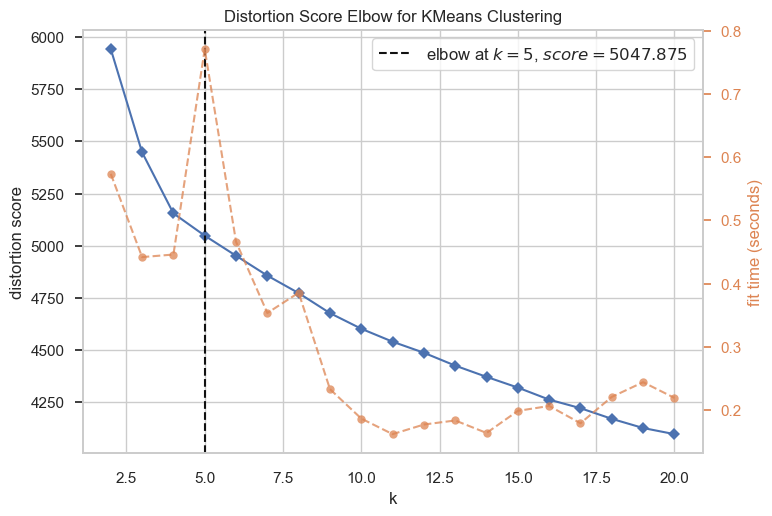

CPU times: user 19.1 s, sys: 1.92 s, total: 21.1 s
Wall time: 6.92 s


<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [105]:
%%time

kmeans_model = KMeans(n_clusters=i, init="k-means++", random_state=42)
visualizer = KElbowVisualizer(kmeans_model, k=20)

visualizer.fit(scores_pca)
visualizer.show()

In [106]:
%time

n_clusters = 5

tuned_clustering = KMeans(n_clusters=n_clusters, init="k-means++", random_state=0)
labels = tuned_clustering.fit_predict(scores_pca)
each_silhouette_score = silhouette_samples(scores_pca, labels, metric="euclidean")
silhouette_avg = silhouette_score(scores_pca, labels)

silhouette_score(
    scores_pca, tuned_clustering.labels_, metric="euclidean"
)

CPU times: user 3 µs, sys: 1 µs, total: 4 µs
Wall time: 6.91 µs


0.07784587325249867

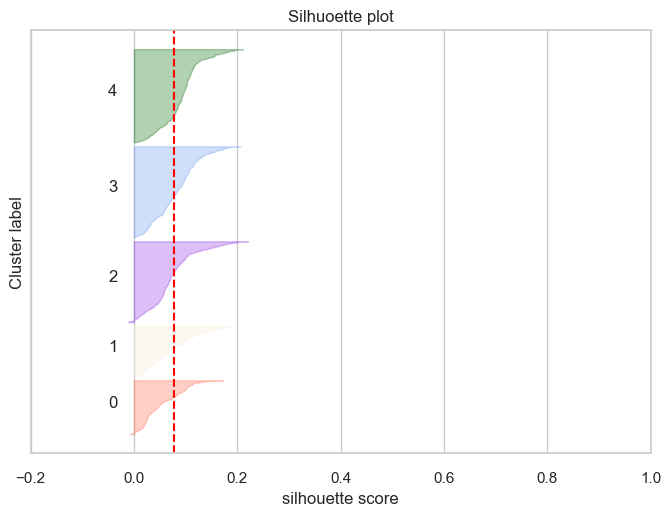

In [107]:
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
y_lower = 10
colorlist = [
    "tomato",
    "antiquewhite",
    "blueviolet",
    "cornflowerblue",
    "darkgreen",
    "seashell",
    "skyblue",
    "mediumseagreen",
    "red",
    "yellow",
]

for i in range(n_clusters):
    ith_cluster_silhouette_values = each_silhouette_score[labels == i]
    ith_cluster_silhouette_values.sort()
    size_cluster_i = ith_cluster_silhouette_values.shape[0]
    y_upper = y_lower + size_cluster_i

    color = colorlist[i]
    ax.fill_betweenx(
        np.arange(y_lower, y_upper), 0, ith_cluster_silhouette_values, facecolor=color, edgecolor=color, alpha=0.3
    )

    # label the silhouse plots with their cluster numbers at the middle
    ax.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

    # compute the new y_lower for next plot
    y_lower = y_upper + 10

ax.set_title("Silhuoette plot")
ax.set_xlabel("silhouette score")
ax.set_ylabel("Cluster label")

# the vertical line for average silhouette score of all the values
ax.axvline(x=silhouette_avg, color="red", linestyle="--")

ax.set_yticks([])
ax.set_xticks([-0.2, 0, 0.2, 0.4, 0.6, 0.8, 1])


In [108]:
kmeans_pca = KMeans(n_clusters=n_clusters, init="k-means++", random_state=42)
kmeans_pca.fit(scores_pca)
print(pd.DataFrame(scores_pca[:,:2], columns=["Component 1", "Component 2"]).shape)
(28816, 2)
df_segm_pca_means = pd.concat(
    [all_data.reset_index(drop=True), pd.DataFrame(scores_pca[:,:2], columns=["Component 1", "Component 2"])],axis=1)

df_segm_pca_means["Clusters"] = kmeans_pca.labels_

df_segm_pca_means.head()

(1019, 2)


,cat__TimeOfVisit_Lunch,remainder__DeliveryOrder_n,cat__PreferredCuisine_Indian,cat__PreferredCuisine_Chinese,cat__TimeOfVisit_Breakfast,cat__PreferredCuisine_Italian,cat__TimeOfVisit_Dinner,cat__PreferredCuisine_American,cat__DiningOccasion_Business,num__AverageSpend,...,num__Income,cat__DiningOccasion_Casual,remainder__WaitTime_bin,remainder__OnlineReservation_n,num__GroupSize,num__Age,HighSatisfaction_n,Component 1,Component 2,Clusters
0,1,0,1,0,0,0,0,0,1,0,...,0,0,-0.869804,1,0,0,0,-0.410793,-1.788977,2
1,1,0,1,0,0,0,0,0,0,-1,...,1,0,-1.565783,0,-1,-1,0,1.526589,-0.639798,4
2,0,0,0,0,1,0,0,1,1,-1,...,1,0,-0.173824,0,0,-1,0,-0.050494,-0.457932,2
3,0,0,0,0,0,1,1,0,0,0,...,0,1,0.522155,1,0,0,0,-1.468947,-0.672637,3
4,1,1,0,0,0,0,0,0,0,1,...,0,0,0.870145,0,0,0,0,-0.243353,1.160016,1


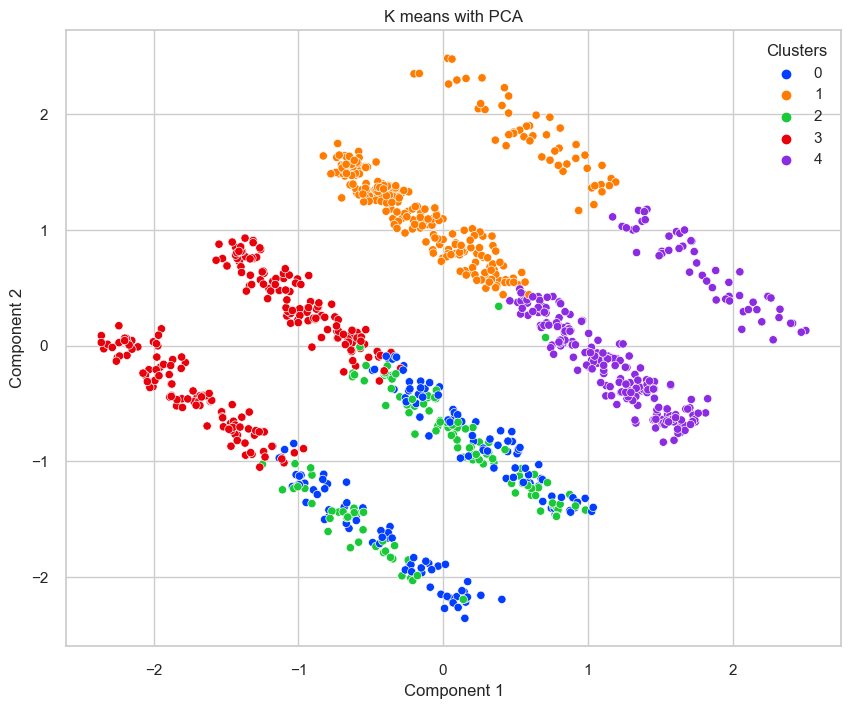

In [109]:
x_axis = df_segm_pca_means["Component 1"]
y_axis = df_segm_pca_means["Component 2"]
plt.figure(figsize=(10, 8))
sns.scatterplot(x=x_axis, y=y_axis, hue=df_segm_pca_means["Clusters"], palette="bright")
plt.title("K means with PCA")
plt.show()

5


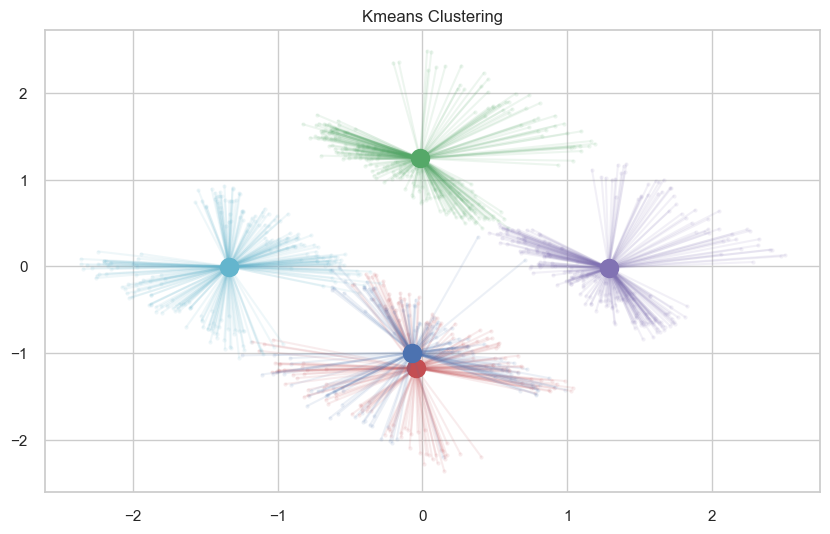

In [110]:
cluster_centers_indices = kmeans_pca.cluster_centers_
labels = kmeans_pca.labels_

print(len(cluster_centers_indices))

plt.figure(figsize=(10, 6))
colors = ["r", "g", "b", "c", "m", "y", "k", "r", "g", "b", "c", "m", "y", "k"]
for k, col in zip(range(len(cluster_centers_indices)), colors):
    class_members = labels == k
    cluster_center = cluster_centers_indices[k]
    plt.plot(scores_pca[class_members, 0], scores_pca[class_members, 1], col + ".", alpha=0.1)
    plt.plot(cluster_center[0], cluster_center[1], "o", markerfacecolor=col, markeredgecolor="k", markersize=14)
    for x in scores_pca[class_members]:
        plt.plot([cluster_center[0], x[0]], [cluster_center[1], x[1]], col, alpha=0.1)

plt.title("Kmeans Clustering")
plt.show()

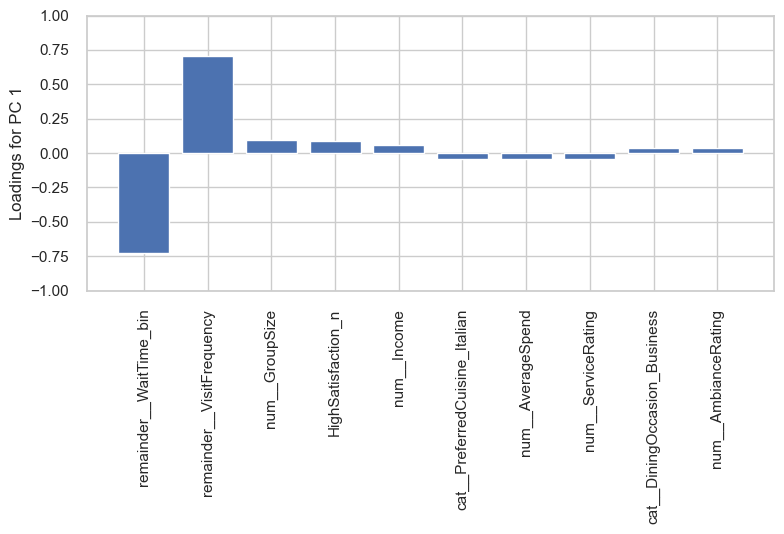

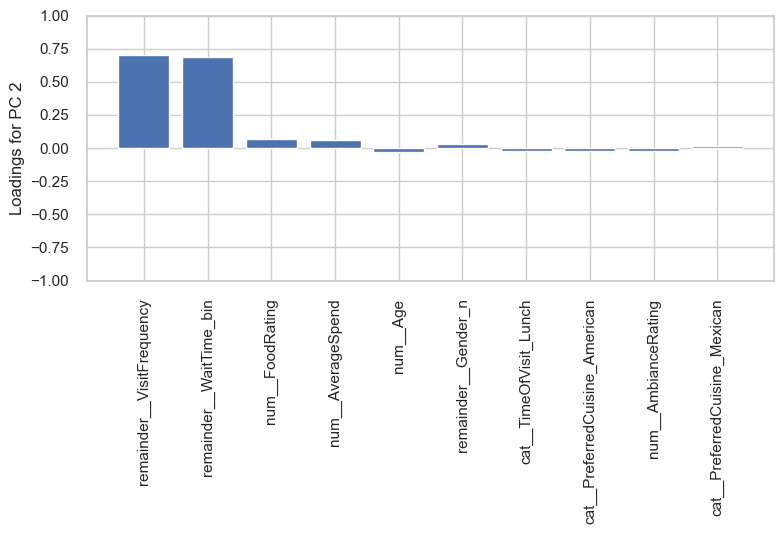

In [111]:
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)

for num in range(2):
    loadings_df = pd.concat([pd.DataFrame(loadings[:, num], columns=["loadings"]),
                            pd.DataFrame(all_data.columns, columns=["parameter"])], axis=1)
    loadings_df["abs_loadings"] = abs(loadings_df["loadings"])
    loadings_df = loadings_df.sort_values(["abs_loadings"], ascending=False)
    loadings_df = loadings_df.iloc[:10, :]

    fig, ax = plt.subplots()

    ax.bar(range(loadings_df.shape[0]), loadings_df.loadings, align='center')
    ax.set_ylabel(f"Loadings for PC {num+1}")
    ax.set_xticks(range(loadings_df.shape[0]))
    ax.set_xticklabels(loadings_df.parameter, rotation=90)

    plt.ylim([-1, 1])
    plt.tight_layout()
    plt.show()

(1019, 27)
(5, 27)
['Index_num__AverageSpend', 'Index_num__AmbianceRating', 'Index_remainder__VisitFrequency', 'Index_num__FoodRating', 'Index_num__ServiceRating', 'Index_num__Income', 'Index_remainder__WaitTime_bin', 'Index_num__GroupSize', 'Index_num__Age', 'Index_HighSatisfaction_n']
['Income', 'AverageSpend', 'FoodRating', 'Age', 'WaitTime', 'VisitFrequency', 'GroupSize', 'HighSatisfaction_n', 'AmbianceRating', 'ServiceRating']
Numeric cluster columns: ['AmbianceRating', 'Income', 'AverageSpend', 'FoodRating', 'WaitTime', 'ServiceRating', 'GroupSize', 'Age']


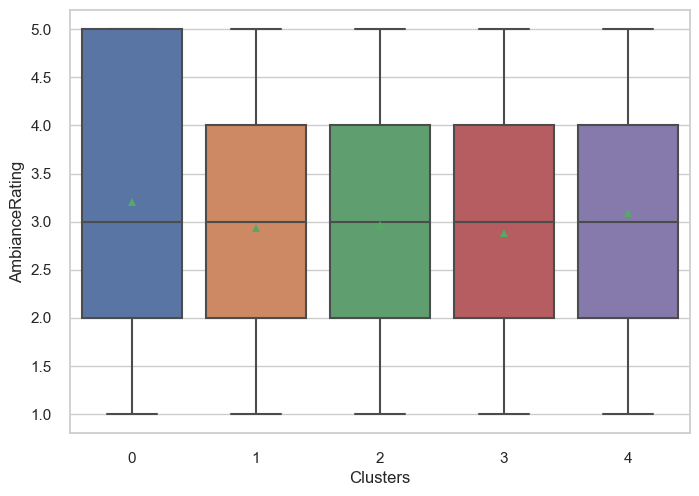

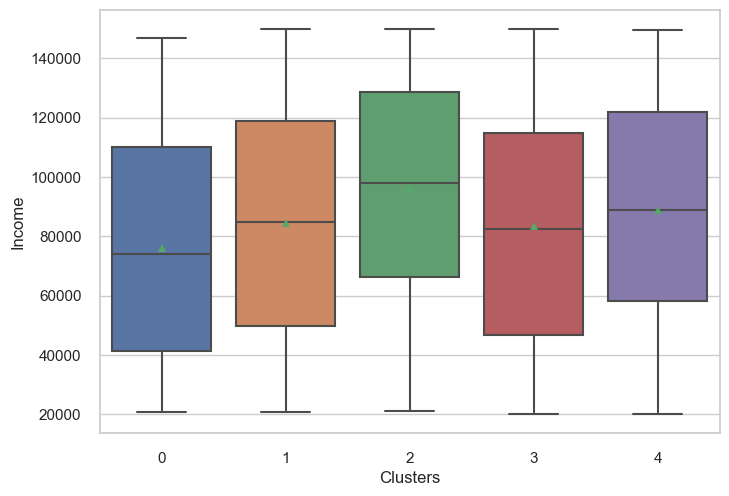

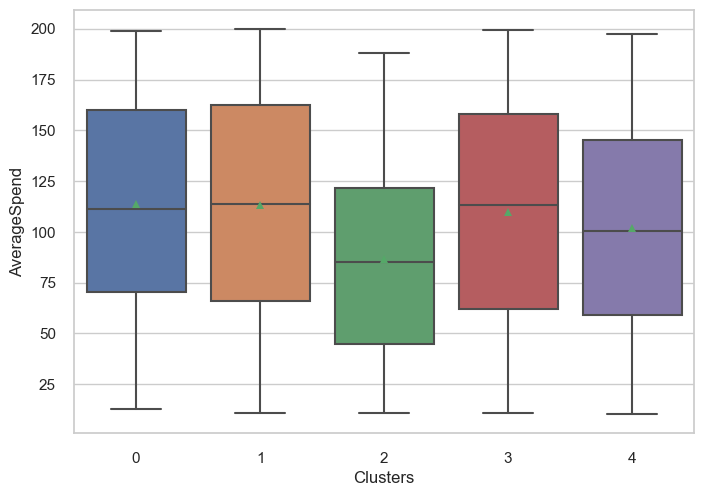

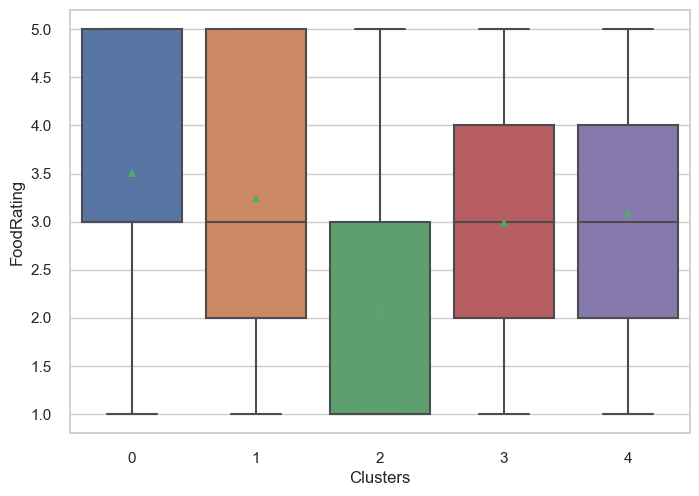

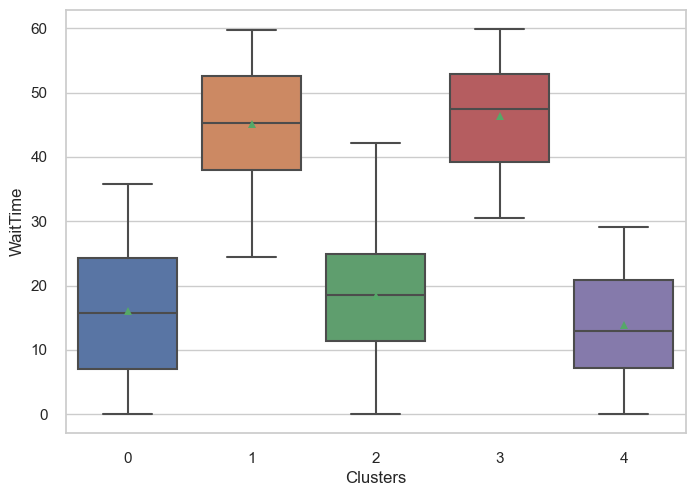

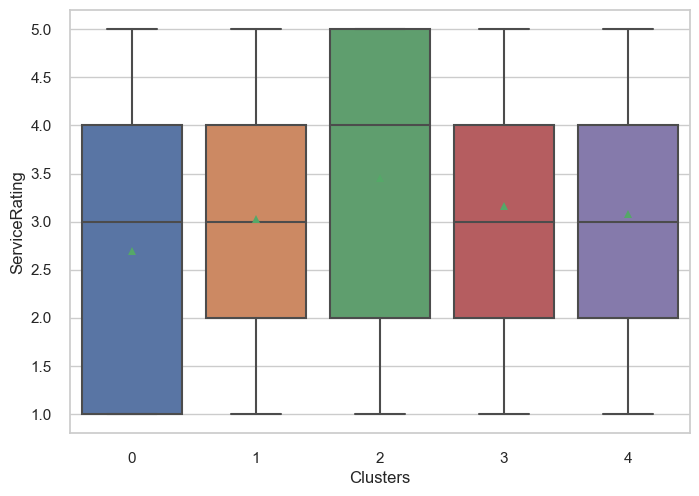

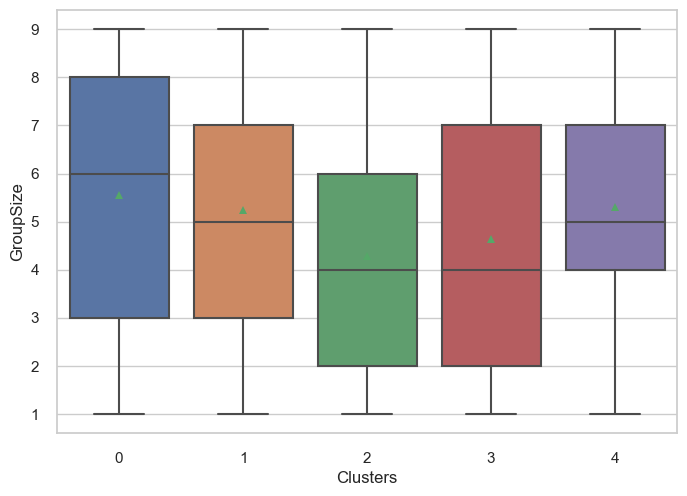

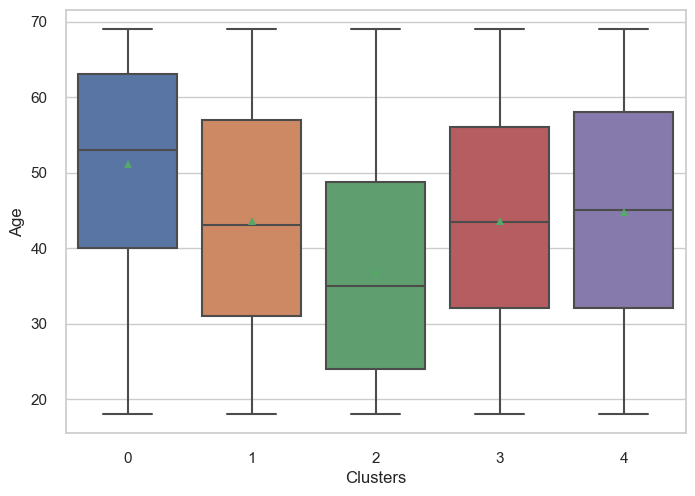

Categorical cluster columns: ['VisitFrequency']


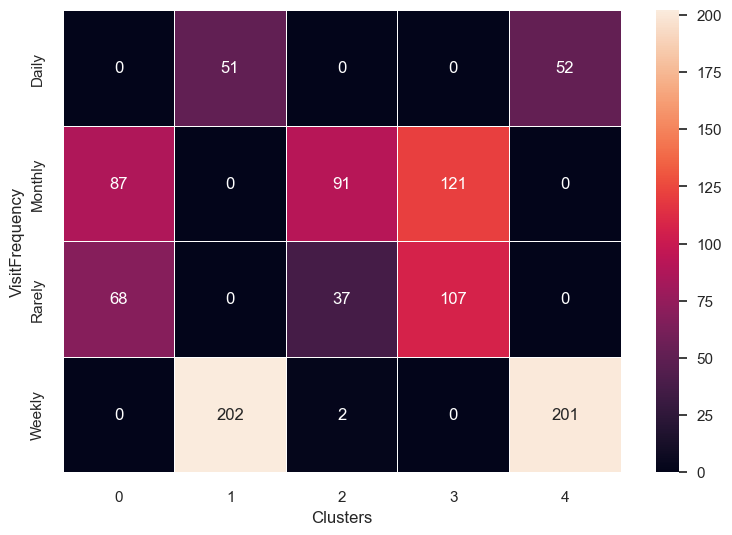

In [112]:
cluster_dset = pd.DataFrame(kmeans_pca.labels_, columns=["Clusters"])

kmeans_import_col, kmeans_origin_col, kmeans_final_dset = cluster_index(all_data, cluster_dset, "Clusters")
print(kmeans_import_col)
print(kmeans_origin_col)

kmeans_origin_col.remove(target)

clust_diag_plots(X_train_orig, kmeans_origin_col, cluster_dset)

In [113]:
clust_check = kmeans_final_dset.sort_values(["Index_" + target]).reset_index(drop=True)
clust_check.iloc[[0,1,-2,-1],:]

,Index_num__AverageSpend,Index_num__AmbianceRating,Index_remainder__VisitFrequency,Index_num__FoodRating,Index_num__ServiceRating,Index_num__Income,Index_remainder__WaitTime_bin,Index_num__GroupSize,Index_num__Age,Index_HighSatisfaction_n,Clusters
0,-1608.880979,1512.762763,591.309278,25.764198,280.813187,406.617449,-905.096789,-1140.397644,105.474551,17.271319,3
1,8208.668269,1768.768769,453.886297,2756.372810,640.254067,-1545.146306,616.190829,-2666.776030,1738.869677,45.436854,2
3,-4518.077495,-2781.531532,570.298505,-1515.932164,-433.720497,1943.893739,748.325998,2423.038436,-1458.406826,114.324989,0
4,1581.709795,-454.426759,-559.104517,-208.964957,63.266212,-549.656789,883.308294,1256.090159,-38.020866,249.034670,4


For the cluster with the highest satisfaction, the following attributes can be seen:
* Low age, visit frequency and ambience rating
* Larger group sizes
* The longest waiting times
* The lowest income
* Less than averge service and food rating
* A high average spend

#### t-SNE

In [114]:
from sklearn.manifold import TSNE


tsne = TSNE(n_components=2,
            init='pca',
            random_state=123)
X_digits_tsne = tsne.fit_transform(all_data)

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning:

The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.



/var/folders/4t/t1tjs2gd7kzg3jkt5d1snhlh0000gn/T/ipykernel_1256/587558179.py:20: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



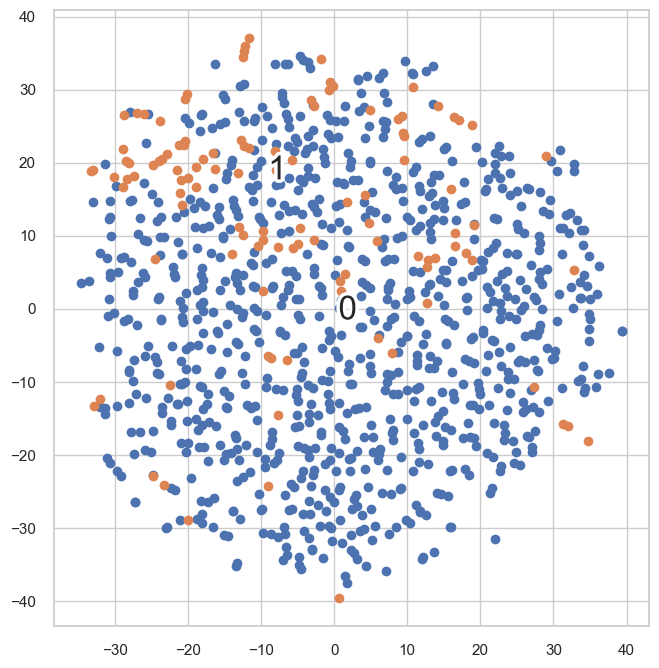

In [115]:
import matplotlib.patheffects as PathEffects


def plot_projection(x, colors):

    fig = plt.figure(figsize=(8, 8))
    ax = plt.subplot(aspect='equal')
    for i in range(2):
        plt.scatter(x[colors == i, 0],
                    x[colors == i, 1])

    for i in range(2):

        xtext, ytext = np.median(x[colors == i, :], axis=0)
        txt = ax.text(xtext, ytext, str(i), fontsize=24)
        txt.set_path_effects([
            PathEffects.Stroke(linewidth=5, foreground="w"),
            PathEffects.Normal()])

    fig.show()

plot_projection(X_digits_tsne, y_train)
# plt.savefig('figures/05_13.png', dpi=300)


### Baseline Models

In [116]:
X_train_mod = pd.read_feather(os.path.join(path_folder, "data/X_train_mod.ftr"), columns=None, use_threads=True)
X_test_mod = pd.read_feather(os.path.join(path_folder, "data/X_test_mod.ftr"), columns=None, use_threads=True)
y_train = pd.read_feather(os.path.join(path_folder, "data/y_train.ftr"), columns=None, use_threads=True)
y_test = pd.read_feather(os.path.join(path_folder, "data/y_test.ftr"), columns=None, use_threads=True)

y_train = y_train[target]
y_test = y_test[target]

print(X_train_mod.shape, X_test_mod.shape, y_train.shape, y_test.shape)
# (1019, 31) (438, 31) (1019,) (438,)


(1019, 31) (438, 31) (1019,) (438,)


In [117]:
X_train_mod.columns = X_train_mod.columns.str.removeprefix("cat__")
X_train_mod.columns = X_train_mod.columns.str.removeprefix("num__")
X_train_mod.columns = X_train_mod.columns.str.removeprefix("remainder__")

X_test_mod.columns = X_test_mod.columns.str.removeprefix("cat__")
X_test_mod.columns = X_test_mod.columns.str.removeprefix("num__")
X_test_mod.columns = X_test_mod.columns.str.removeprefix("remainder__")

In [118]:
models = select_model(X_train_mod, y_train)
models

100%|██████████| 10/10 [00:45<00:00,  4.58s/it]


,model,run_time,roc_auc
0,CatBoostClassifier,0.3,0.932452
1,SGDClassifier,0.0,0.926499
9,"VotingClassifier (XGBClassifier, LGBMClassifie...",0.34,0.926157
2,AdaBoostClassifier,0.03,0.923990
3,BernoulliNB,0.0,0.922614
4,XGBClassifier,0.02,0.918019
5,LGBMClassifier,0.05,0.913675
6,RidgeClassifier,0.0,0.911351
7,BaggingClassifier,0.01,0.810958
8,DecisionTreeClassifier,0.0,0.626530


### Model requirements
* Run mlflow ui in the terminal
* Open http://127.0.0.1:5000

In [119]:
mlflow.set_tracking_uri("http://127.0.0.1:5000")
tracking_uri = mlflow.get_tracking_uri()

mlflc = MLflowCallback(
    tracking_uri = tracking_uri,
    metric_name = "auc",
)


/var/folders/4t/t1tjs2gd7kzg3jkt5d1snhlh0000gn/T/ipykernel_1256/648232250.py:4: ExperimentalWarning:

MLflowCallback is experimental (supported from v1.4.0). The interface can change in the future.



In [120]:
n_splits = 10

cv = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=31416)


#### CatBoost - Optuna

In [122]:
mlflow.end_run()

n_trails = 20

def catboost_opt_objective(trial):
    params = {
        "iterations": trial.suggest_int("iterations", 100, 1000),
        "depth": trial.suggest_int("depth", 4, 10, 1),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.5),
        "random_strength": trial.suggest_float("random_strength", 0.01, 10),
        "bagging_temperature": trial.suggest_float("bagging_temperature", 0.0, 100.0),
    }

    kfolds = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=0)
    roc_auc_lst = []

    #y_train_cb = y_train["y_n"]

    for train_index, test_index in kfolds.split(X_train_mod, y_train):
        X_train_s, X_test_s = X_train_mod.iloc[train_index, :], X_train_mod.iloc[test_index, :]
        y_train_s, y_test_s = y_train[train_index], y_train[test_index]

        model = CatBoostClassifier(**params)
        model.fit(X_train_s, y_train_s, eval_set=(X_test_s, y_test_s), early_stopping_rounds=int(n_trails*0.75), verbose_eval=False)

        y_pred = model.predict(X_test_s)
        roc_auc = round(roc_auc_score(y_test_s, y_pred), 4)
        roc_auc_lst.append(roc_auc)

    mean_roc_auc = np.mean(roc_auc_lst)

    return 1.0 - mean_roc_auc


date_run = datetime.now().strftime("%Y%m%d_%H%M%S")
mlflow.set_experiment(f"Catboost_experiment_{date_run}")

with mlflow.start_run():
    mlflow.set_tag("optimizer", "Optuna")
    mlflow.set_tag("algorithm", "CatBoost")
    print("artifact uri:", mlflow.get_artifact_uri())

    cb_run_id = mlflow.active_run().info.run_id
    print("Run id:", cb_run_id)

    cb_study = optuna.create_study(direction="minimize")

    cb_study.optimize(catboost_opt_objective, n_trials=n_trails)

    best_params_cb = cb_study.best_params
    best_auc_cb = cb_study.best_value

    for key, value in best_params_cb.items():
        mlflow.log_param(key, value)

    mlflow.log_metric("AUC", best_auc_cb)

    model = CatBoostClassifier(**best_params_cb)
    model.fit(X_train_mod, y_train, verbose_eval=False)
    mlflow.sklearn.log_model(model, "Catboost_model")

mlflow.end_run()


2024/07/03 12:36:23 INFO mlflow.tracking.fluent: Experiment with name 'Catboost_experiment_20240703_123623' does not exist. Creating a new experiment.
[I 2024-07-03 12:36:24,542] A new study created in memory with name: no-name-ec9fedbb-d100-4627-9c72-eaf4087a6d54


artifact uri: mlflow-artifacts:/348825164075845865/1994eef7996f400d8f1072f5ed74087b/artifacts
Run id: 1994eef7996f400d8f1072f5ed74087b


[I 2024-07-03 12:36:30,092] Trial 0 finished with value: 0.38661999999999996 and parameters: {'iterations': 503, 'depth': 10, 'learning_rate': 0.49752434373000876, 'random_strength': 2.5185750764768104, 'bagging_temperature': 8.540451370791768}. Best is trial 0 with value: 0.38661999999999996.
[I 2024-07-03 12:36:31,102] Trial 1 finished with value: 0.28445 and parameters: {'iterations': 973, 'depth': 4, 'learning_rate': 0.35375253582627864, 'random_strength': 0.8853598819611663, 'bagging_temperature': 76.05596708178088}. Best is trial 1 with value: 0.28445.
[I 2024-07-03 12:36:42,471] Trial 2 finished with value: 0.4103899999999999 and parameters: {'iterations': 527, 'depth': 7, 'learning_rate': 0.04644939849684495, 'random_strength': 2.5658773627394487, 'bagging_temperature': 95.85179149681942}. Best is trial 1 with value: 0.28445.
[I 2024-07-03 12:36:43,287] Trial 3 finished with value: 0.30099999999999993 and parameters: {'iterations': 246, 'depth': 4, 'learning_rate': 0.4629101033

In [123]:
filepath_cb = os.path.join(path_folder, "models/cb_opt_from_pickle.pkl")
pickle.dump(model, open(filepath_cb, 'wb'))

2024/07/03 12:37:40 INFO mlflow.tracking.fluent: Experiment with name 'CB_opt_optimized_20240703_123740' does not exist. Creating a new experiment.
0it [00:00, ?it/s]

ROC/AUC: 1.0
Accuracy: 1.0
F1 score: 1.0
MCC score: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        91
           1       1.00      1.00      1.00        11

    accuracy                           1.00       102
   macro avg       1.00      1.00      1.00       102
weighted avg       1.00      1.00      1.00       102



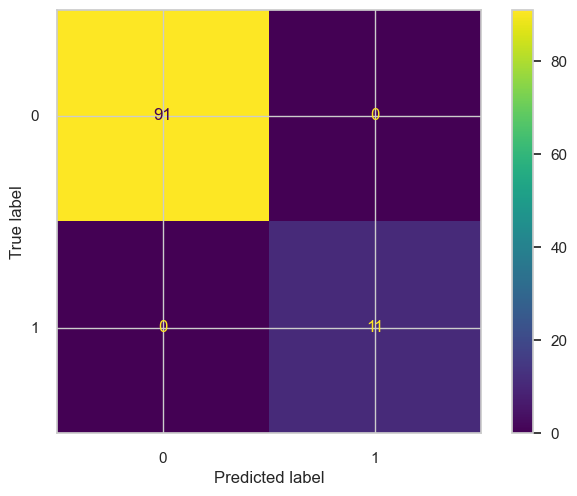

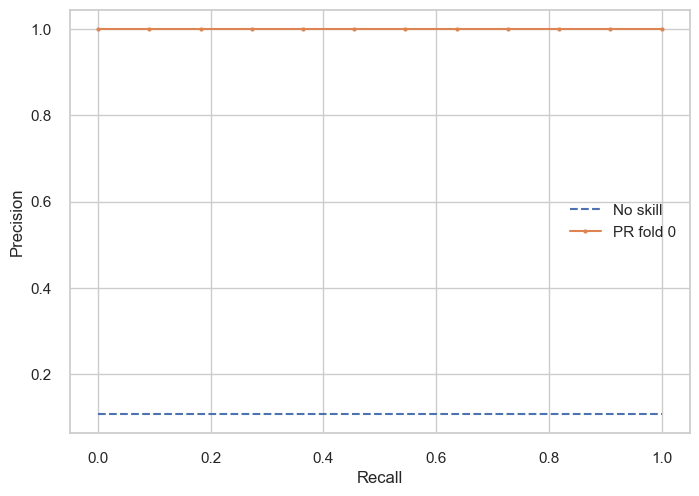

1it [00:00,  1.08it/s]

ROC/AUC: 1.0
Accuracy: 1.0
F1 score: 1.0
MCC score: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        91
           1       1.00      1.00      1.00        11

    accuracy                           1.00       102
   macro avg       1.00      1.00      1.00       102
weighted avg       1.00      1.00      1.00       102



<Figure size 800x550 with 0 Axes>

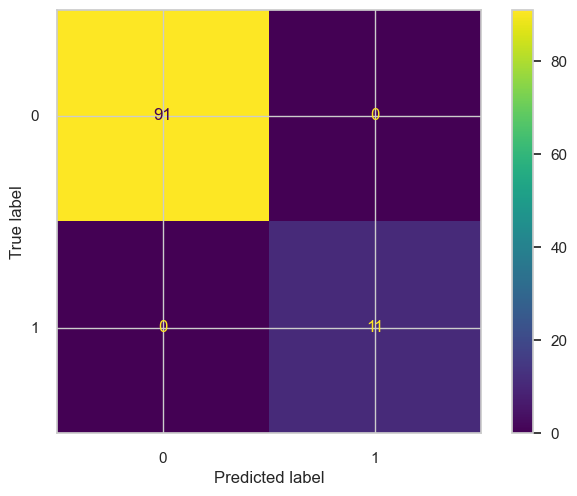

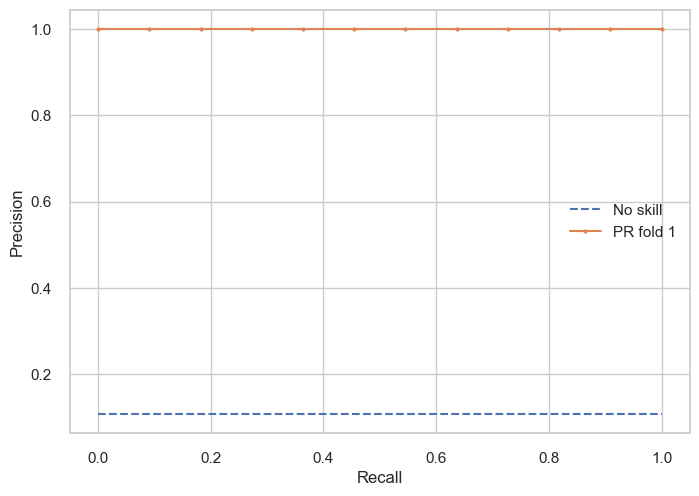

2it [00:01,  1.08it/s]

ROC/AUC: 1.0
Accuracy: 1.0
F1 score: 1.0
MCC score: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        91
           1       1.00      1.00      1.00        11

    accuracy                           1.00       102
   macro avg       1.00      1.00      1.00       102
weighted avg       1.00      1.00      1.00       102



<Figure size 800x550 with 0 Axes>

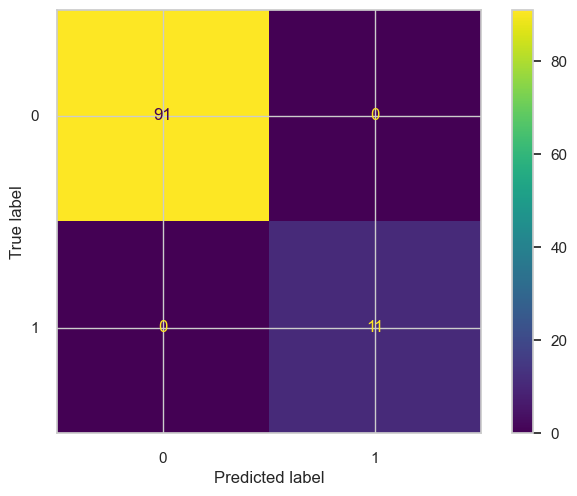

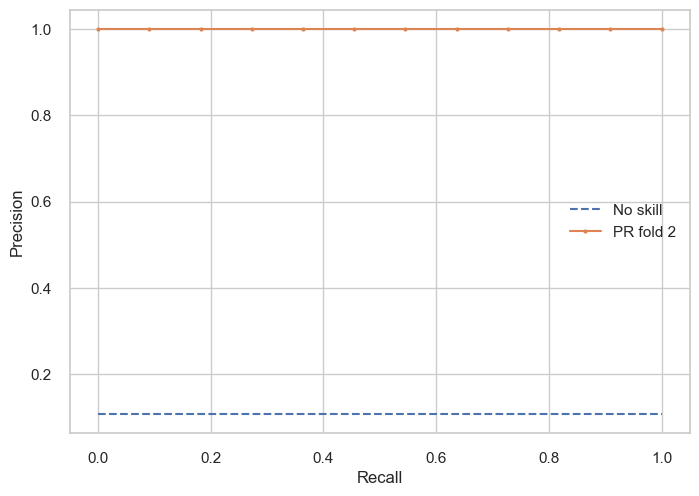

3it [00:02,  1.11it/s]

ROC/AUC: 1.0
Accuracy: 1.0
F1 score: 1.0
MCC score: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        91
           1       1.00      1.00      1.00        11

    accuracy                           1.00       102
   macro avg       1.00      1.00      1.00       102
weighted avg       1.00      1.00      1.00       102



<Figure size 800x550 with 0 Axes>

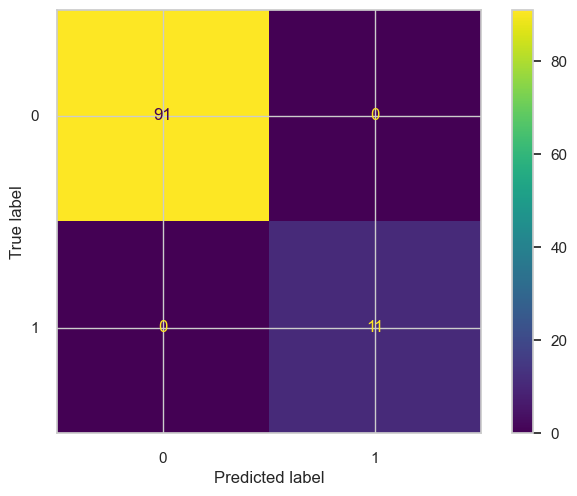

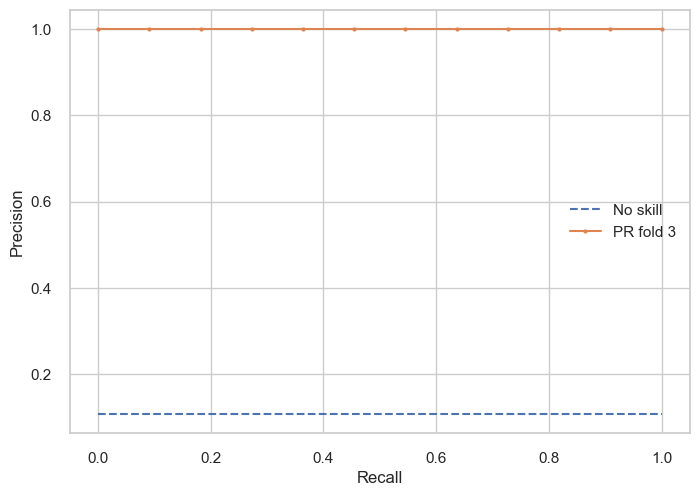

4it [00:03,  1.14it/s]

ROC/AUC: 1.0
Accuracy: 1.0
F1 score: 1.0
MCC score: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        91
           1       1.00      1.00      1.00        11

    accuracy                           1.00       102
   macro avg       1.00      1.00      1.00       102
weighted avg       1.00      1.00      1.00       102



<Figure size 800x550 with 0 Axes>

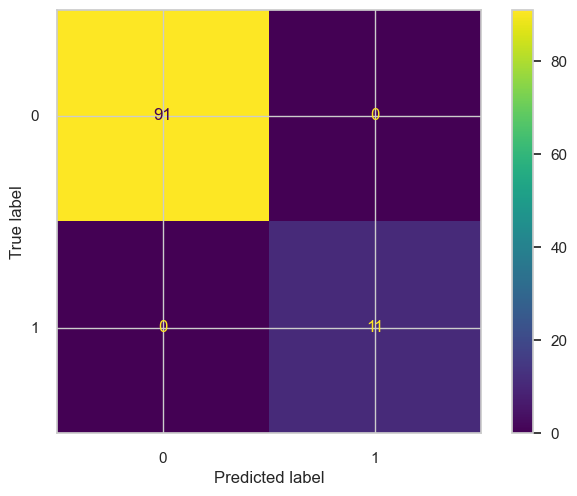

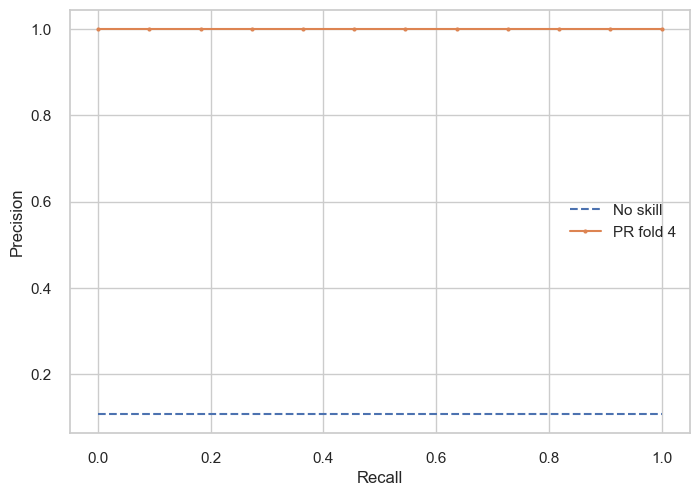

5it [00:04,  1.14it/s]

ROC/AUC: 1.0
Accuracy: 1.0
F1 score: 1.0
MCC score: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        91
           1       1.00      1.00      1.00        11

    accuracy                           1.00       102
   macro avg       1.00      1.00      1.00       102
weighted avg       1.00      1.00      1.00       102



<Figure size 800x550 with 0 Axes>

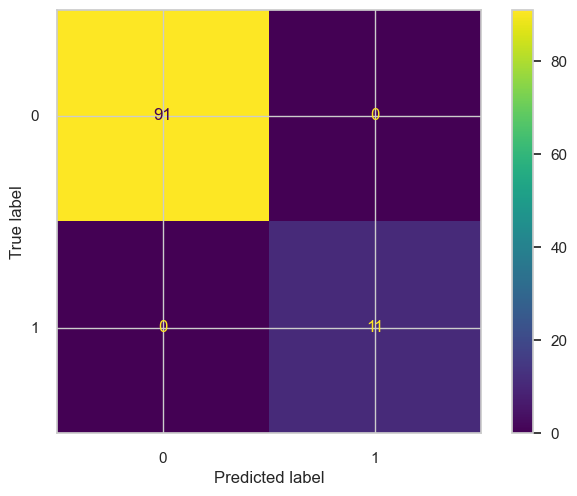

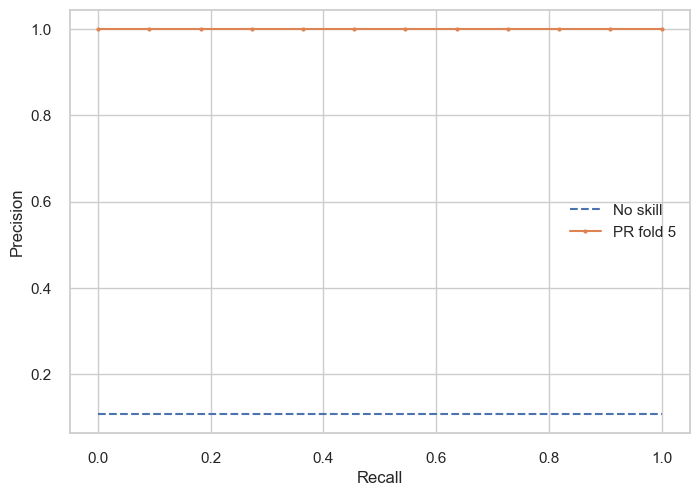

6it [00:05,  1.14it/s]

ROC/AUC: 1.0
Accuracy: 1.0
F1 score: 1.0
MCC score: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        91
           1       1.00      1.00      1.00        11

    accuracy                           1.00       102
   macro avg       1.00      1.00      1.00       102
weighted avg       1.00      1.00      1.00       102



<Figure size 800x550 with 0 Axes>

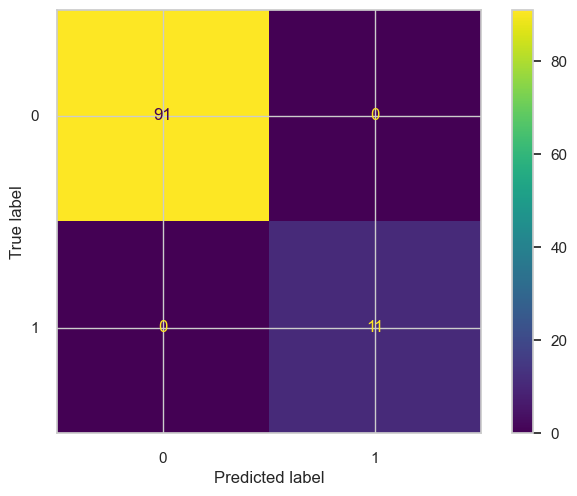

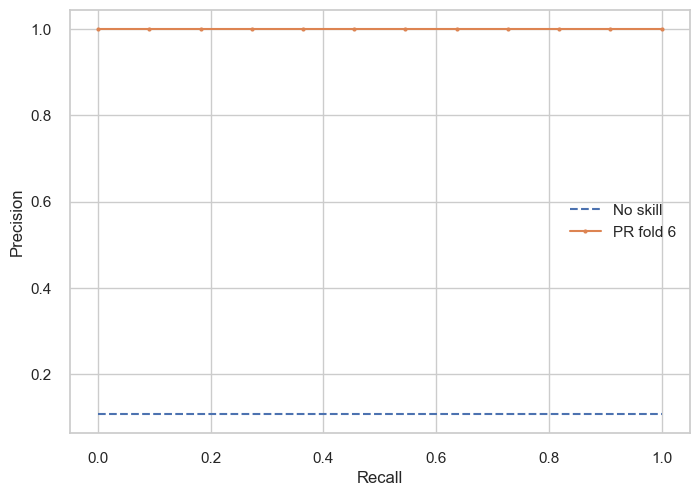

7it [00:06,  1.15it/s]

ROC/AUC: 1.0
Accuracy: 1.0
F1 score: 1.0
MCC score: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        91
           1       1.00      1.00      1.00        11

    accuracy                           1.00       102
   macro avg       1.00      1.00      1.00       102
weighted avg       1.00      1.00      1.00       102



<Figure size 800x550 with 0 Axes>

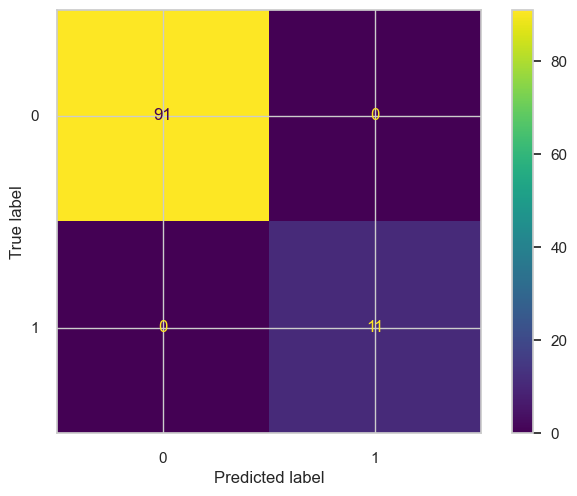

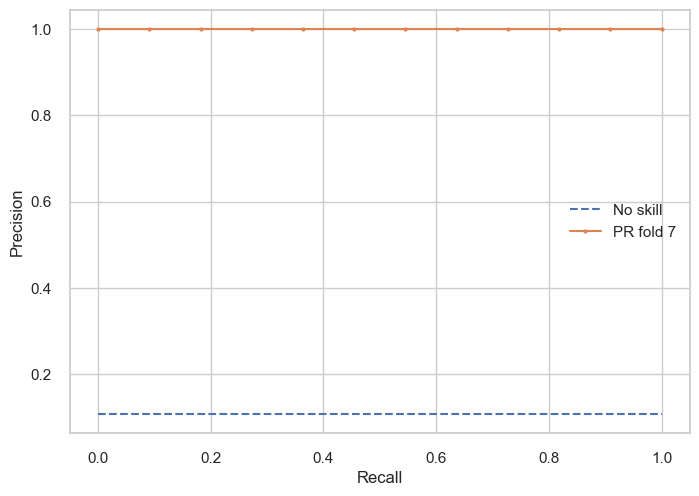

8it [00:07,  1.11it/s]

ROC/AUC: 1.0
Accuracy: 1.0
F1 score: 1.0
MCC score: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        90
           1       1.00      1.00      1.00        12

    accuracy                           1.00       102
   macro avg       1.00      1.00      1.00       102
weighted avg       1.00      1.00      1.00       102



<Figure size 800x550 with 0 Axes>

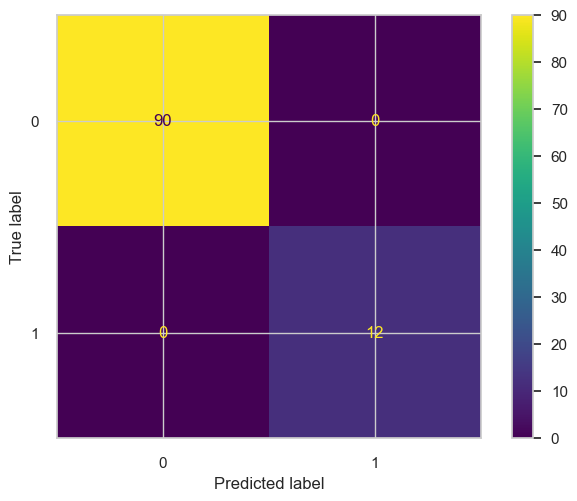

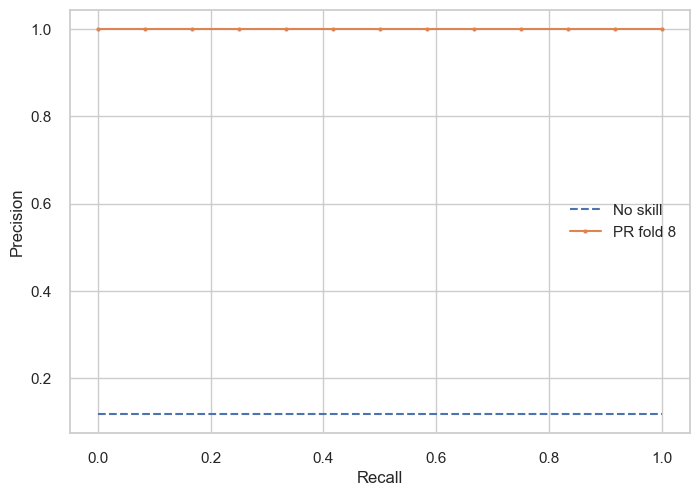

9it [00:08,  1.02s/it]

ROC/AUC: 1.0
Accuracy: 1.0
F1 score: 1.0
MCC score: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        90
           1       1.00      1.00      1.00        11

    accuracy                           1.00       101
   macro avg       1.00      1.00      1.00       101
weighted avg       1.00      1.00      1.00       101



<Figure size 800x550 with 0 Axes>

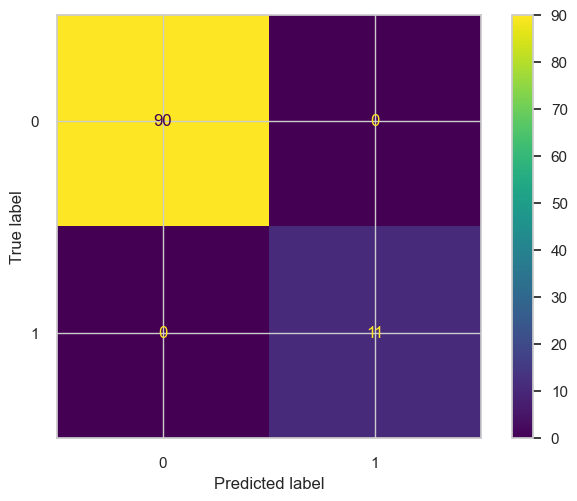

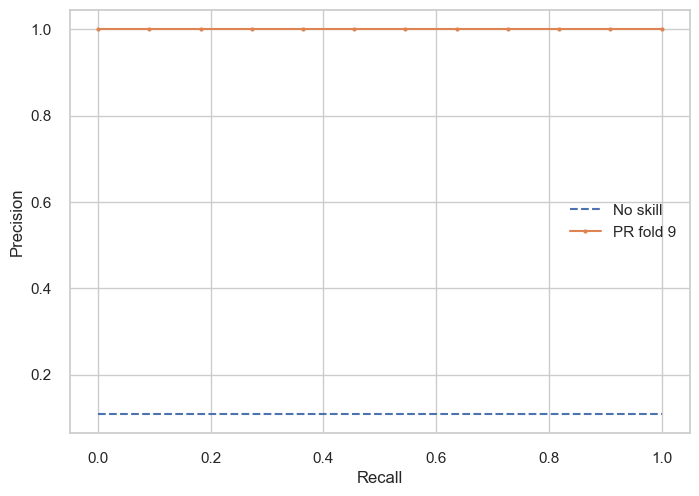

10it [00:09,  1.07it/s]


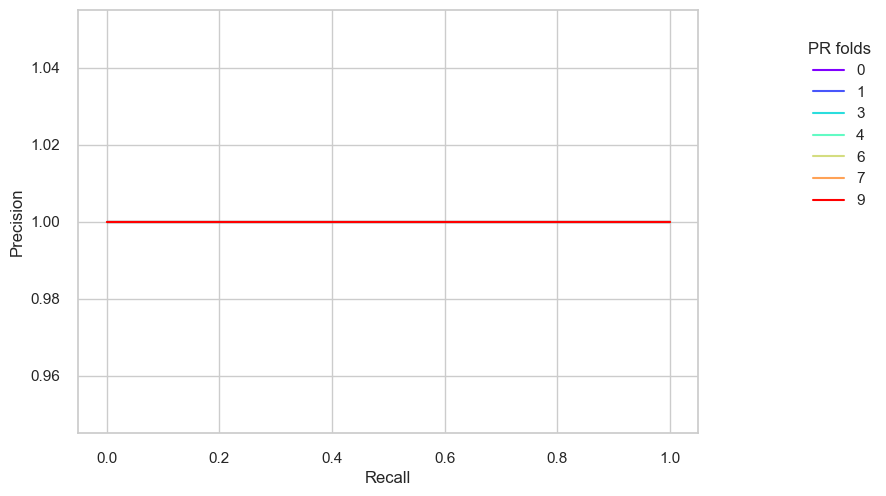

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprec

<Figure size 800x550 with 0 Axes>

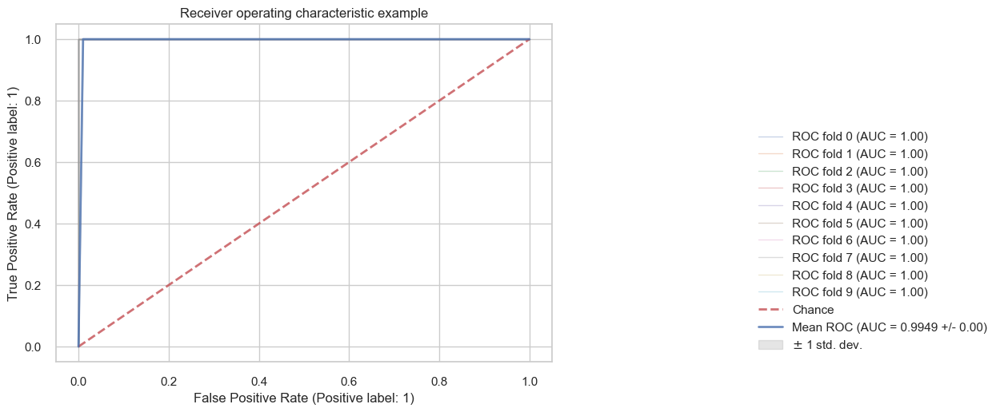

In [124]:
try:
    logged_model = f"runs:/{cb_run_id}/Catboost_model"

    cb_opt_from_pickle = mlflow.sklearn.load_model(logged_model)

    cb_opt_res, cb_opt_threshold, cb_pr_data_train, cb_roc_data_train  = train_diag_mlflow(
        cb_opt_from_pickle, X_train_mod, y_train, n_splits, "CB_opt_optimized"
    )
except Exception:
    filepath_cb = os.path.join(path_folder, "models/cb_opt_from_pickle.pkl")
    with open(filepath_cb, 'rb') as fp_cb:
        cb_opt_from_pickle = pickle.load(fp_cb)
    cb_opt_from_pickle.fit(X_train_mod, y_train)
    cb_opt_res, cb_opt_threshold, cb_pr_data_train, cb_roc_data_train  = train_diag_mlflow(
        cb_opt_from_pickle, X_train_mod, y_train, n_splits, "CB_opt_optimized"
    )

0:	learn: 0.4688919	total: 57ms	remaining: 22.6s
0:	learn: 0.4359233	total: 55.8ms	remaining: 22.1s
0:	learn: 0.4560336	total: 56.5ms	remaining: 22.4s
0:	learn: 0.4709820	total: 56.7ms	remaining: 22.4s
0:	learn: 0.4321589	total: 57.6ms	remaining: 22.8s
0:	learn: 0.4765060	total: 57.8ms	remaining: 22.9s
0:	learn: 0.4782380	total: 57.4ms	remaining: 22.7s
1:	learn: 0.3493555	total: 58.8ms	remaining: 11.6s
1:	learn: 0.2927211	total: 58.9ms	remaining: 11.6s
1:	learn: 0.3298937	total: 58ms	remaining: 11.4s
1:	learn: 0.3015074	total: 57.3ms	remaining: 11.3s
1:	learn: 0.3650522	total: 59.5ms	remaining: 11.7s
1:	learn: 0.3632193	total: 58.5ms	remaining: 11.5s
1:	learn: 0.3663490	total: 59.1ms	remaining: 11.7s
2:	learn: 0.2554368	total: 59.8ms	remaining: 7.85s
2:	learn: 0.2634334	total: 58.2ms	remaining: 7.64s
2:	learn: 0.2778763	total: 59.3ms	remaining: 7.79s
2:	learn: 0.2964088	total: 60.3ms	remaining: 7.92s
2:	learn: 0.3102318	total: 61.1ms	remaining: 8.02s
3:	learn: 0.2164435	total: 60.9ms	r

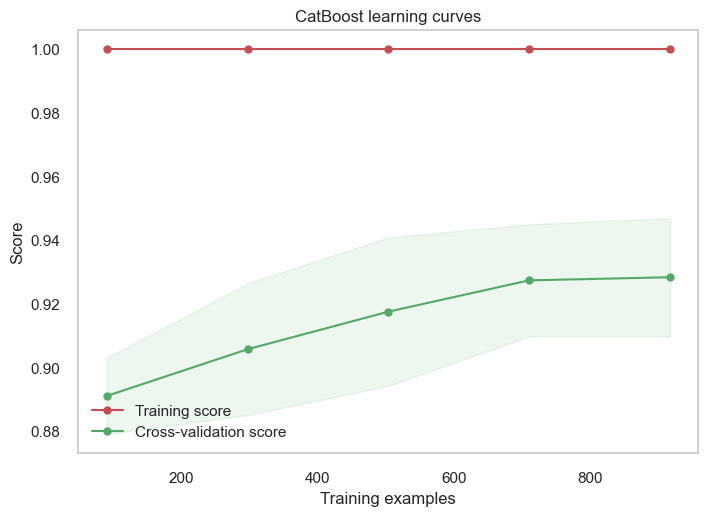

In [125]:
g = plot_learning_curve(cb_opt_from_pickle,
                        "CatBoost learning curves",
                        X_train_mod,
                        y_train,
                        cv=cv)

### LGBM - Optuna

In [126]:
mlflow.end_run()

n_trials = 20

%time

def lgbm_opt_objective(trial):

    params = {
        "application": "binary",
        "metric": "auc",
        "max_depth": trial.suggest_int("max_depth", 4, 15, 1),
        "num_leaves": trial.suggest_int("num_leaves", 20, 80, 10),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.1),
        "feature_fraction": trial.suggest_float("feature_fraction", 1e-8, 1.0),
        "bagging_fraction": trial.suggest_float("bagging_fraction", 1e-8, 1.0),
        "max_bin": trial.suggest_int("max_bin", 20, 90, 10),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 20, 80, 10),
        "min_sum_hessian_in_leaf": trial.suggest_int("min_sum_hessian_in_leaf", 20, 90, 10),
        "random_state": 42,
    }

    train_data = lgb.Dataset(data=X_train_mod, label=y_train, free_raw_data=False)
    model = lgb.cv(
        params,
        train_data,
        nfold=10,
        seed=6,
        stratified=True,
        early_stopping_rounds=int(n_trials * 0.75),
        verbose_eval=2,
        metrics=["auc"],
    )
    score = np.mean(model["auc-mean"])

    return score

    mlflow.end_run()


date_run = datetime.now().strftime("%Y%m%d_%H%M%S")
mlflow.set_experiment(f"LGBM_experiment_{date_run}")

with mlflow.start_run():

    mlflow.set_tag("optimizer", "Optuna")
    mlflow.set_tag("algorithm", "LGBM")
    print("artifact uri:", mlflow.get_artifact_uri())

    lgbm_run_id = mlflow.active_run().info.run_id
    print("Run id:", lgbm_run_id)

    # with mlflow.start_run(nested=True):
    lgbm_study = optuna.create_study(direction="maximize")

    lgbm_study.optimize(lgbm_opt_objective, n_trials=20)

    # Get the best hyperparameters and corresponding score
    best_params_lgbm = lgbm_study.best_params
    best_score_lgbm = lgbm_study.best_value

    for key, value in best_params_lgbm.items():
        mlflow.log_param(key, value)

    mlflow.log_metric("AUC", best_score_lgbm)

    lgbm_model = lgb.LGBMClassifier(**best_params_lgbm)
    lgbm_model.fit(X_train_mod, y_train, verbose=2)
    mlflow.sklearn.log_model(lgbm_model, "LGBM_model")

mlflow.end_run()

print(f"Best Hyperparameters: {best_params_lgbm}")

# Best Hyperparameters: {'max_depth': 11, 'num_leaves': 50, 'learning_rate': 0.08430668978110835, 'feature_fraction': 0.7161896785810328, 'bagging_fraction': 0.2708824941491863, 'max_bin': 60, 'min_data_in_leaf': 70, 'min_sum_hessian_in_leaf': 20}

print(f"Best Validation AUC: {best_score_lgbm}")

# Best Validation Accuracy: 0.9452344999569776


2024/07/03 12:38:06 INFO mlflow.tracking.fluent: Experiment with name 'LGBM_experiment_20240703_123806' does not exist. Creating a new experiment.


CPU times: user 6 µs, sys: 4 µs, total: 10 µs
Wall time: 16.9 µs


[I 2024-07-03 12:38:06,640] A new study created in memory with name: no-name-dc8ec6cd-18c6-49bb-ac4c-9d51a3159070
/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:577: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

[I 2024-07-03 12:38:06,833] Trial 0 finished with value: 0.5 and parameters: {'max_depth': 15, 'num_leaves': 40, 'learning_rate': 0.08184055009135727, 'feature_fraction': 0.5141044305036833, 'bagging_fraction': 0.3799906389579407, 'max_bin': 20, 'min_data_in_leaf': 80, 'min_sum_hessian_in_leaf': 80}. Best is trial 0 wit

artifact uri: mlflow-artifacts:/557123607517458333/b8906fec988448f1a0e4158ef92953fb/artifacts
Run id: b8906fec988448f1a0e4158ef92953fb
[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000806 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 145
[LightGBM] [Info] Number of data points in the train set: 917, number of used features: 30
[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000607 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 145
[LightGBM] [Info] Number of data points in the train set: 917, number of used features: 30
[LightGBM] [Info] Number 

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:577: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 261
[LightGBM] [Info] Number of data points in the train set: 917, number of used features: 31
[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000797 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 261
[LightGBM] [Info] Number of data points in the train set: 917, number of used features: 31
[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the ov

[I 2024-07-03 12:38:07,240] Trial 1 finished with value: 0.7941157693801925 and parameters: {'max_depth': 8, 'num_leaves': 20, 'learning_rate': 0.03777577867668962, 'feature_fraction': 0.4424679881979435, 'bagging_fraction': 0.5131843254344538, 'max_bin': 60, 'min_data_in_leaf': 60, 'min_sum_hessian_in_leaf': 40}. Best is trial 1 with value: 0.7941157693801925.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14]	cv_agg's auc: 0.769715 + 0.0503219
[LightGBM] [Warning] No further splits with positive gain, b

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:577: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

[I 2024-07-03 12:38:07,332] Trial 2 finished with value: 0.5 and parameters: {'max_depth': 9, 'num_leaves': 40, 'learning_rate': 0.09924771717516528, 'feature_fraction': 0.7769213208507307, 'bagging_fraction': 0.8701199079717984, 'max_bin': 90, 'min_data_in_leaf': 30, 'min_sum_hessian_in_leaf': 50}. Best is trial 1 with value: 0.7941157693801925.
/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/light

[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001179 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 321
[LightGBM] [Info] Number of data points in the train set: 917, number of used features: 31
[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000172 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 321
[LightGBM] [Info] Number of data points in the train set: 917, number of used features: 31
[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000520 seconds.
You can set `force_col_wise=true` to remove the ov

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001600 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 321
[LightGBM] [Info] Number of data points in the train set: 917, number of used features: 31
[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001771 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 321
[LightGBM] [Info] Number of data points in the train set: 917, number of used features: 31
[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000870 seconds.
You can set `force_row_wise=true` to remove the ov

[I 2024-07-03 12:38:07,673] Trial 4 finished with value: 0.7762702550860445 and parameters: {'max_depth': 14, 'num_leaves': 70, 'learning_rate': 0.09228878183514991, 'feature_fraction': 0.7782783733387026, 'bagging_fraction': 0.03261417753859835, 'max_bin': 90, 'min_data_in_leaf': 20, 'min_sum_hessian_in_leaf': 40}. Best is trial 1 with value: 0.7941157693801925.
/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:577: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

[I 2024-07-03 12:38:07,765] Trial 5 finished with value: 0.5 and para

[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000462 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 206
[LightGBM] [Info] Number of data points in the train set: 917, number of used features: 31
[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000168 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 206
[LightGBM] [Info] Number of data points in the train set: 917, number of used features: 31
[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.00

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000577 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 301
[LightGBM] [Info] Number of data points in the train set: 917, number of used features: 31
[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000872 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 301
[LightGBM] [Info] Number of data points in the train set: 917, number of used features: 31
[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000541 seconds.
You can set `force_col_wise=true` to remove the overh

[I 2024-07-03 12:38:08,212] Trial 7 finished with value: 0.859085569060569 and parameters: {'max_depth': 8, 'num_leaves': 80, 'learning_rate': 0.0859174409654749, 'feature_fraction': 0.7804531636699131, 'bagging_fraction': 0.03787911241054079, 'max_bin': 80, 'min_data_in_leaf': 60, 'min_sum_hessian_in_leaf': 30}. Best is trial 7 with value: 0.859085569060569.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:577: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

[I 2024-07-03 12:38:08,312] Trial 8 finished with value: 0.5 and parameters: {'max_depth': 10, 'num_leaves': 70, 'learning_rate': 0.028372832803004094, 'feature_fraction': 0.458797745399623, 'bagging_fraction': 0.3763423560753034, 'max_bin': 70, 'min_data_in_leaf': 60, 'min_sum_hessian_in_leaf': 50}. Best is trial 7 with value: 0.859085569060569.
/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/light

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:577: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 917, number of used features: 31
[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000174 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 917, number of used features: 31
[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000552 seconds.
You can set `force_col_wise=true` to remove the ov

[I 2024-07-03 12:38:08,916] Trial 10 finished with value: 0.8801377144180172 and parameters: {'max_depth': 4, 'num_leaves': 80, 'learning_rate': 0.06727677999299604, 'feature_fraction': 0.9879326744561072, 'bagging_fraction': 0.007352900711380356, 'max_bin': 70, 'min_data_in_leaf': 40, 'min_sum_hessian_in_leaf': 20}. Best is trial 10 with value: 0.8801377144180172.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	cv_agg's auc: 0.897938 + 0.0387263
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:577: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000436 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 301
[LightGBM] [Info] Number of data points in the train set: 917, number of used features: 31
[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000179 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 301
[LightGBM] [Info] Number of data points in the train set: 917, number of used features: 31
[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.00

[I 2024-07-03 12:38:09,386] Trial 11 finished with value: 0.8827106986928415 and parameters: {'max_depth': 4, 'num_leaves': 80, 'learning_rate': 0.07042882652945787, 'feature_fraction': 0.9596893264923619, 'bagging_fraction': 0.027021158905779226, 'max_bin': 80, 'min_data_in_leaf': 40, 'min_sum_hessian_in_leaf': 20}. Best is trial 11 with value: 0.8827106986928415.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:577: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000392 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 917, number of used features: 31
[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000492 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 917, number of used features: 31
[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000769 seconds.
You can set `force_row_wise=true` to remove the ov

[I 2024-07-03 12:38:09,851] Trial 12 finished with value: 0.8791192543567544 and parameters: {'max_depth': 4, 'num_leaves': 80, 'learning_rate': 0.0660608683857111, 'feature_fraction': 0.9811928660278815, 'bagging_fraction': 0.04249314591618581, 'max_bin': 70, 'min_data_in_leaf': 40, 'min_sum_hessian_in_leaf': 20}. Best is trial 11 with value: 0.8827106986928415.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[54]	cv_agg's auc: 0.899834 + 0.0359041
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:577: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000495 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 917, number of used features: 31
[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000773 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 917, number of used features: 31
[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.00

[I 2024-07-03 12:38:10,479] Trial 13 finished with value: 0.8787215488215488 and parameters: {'max_depth': 4, 'num_leaves': 70, 'learning_rate': 0.06424506409286429, 'feature_fraction': 0.9758404006764859, 'bagging_fraction': 0.21241106561359613, 'max_bin': 70, 'min_data_in_leaf': 40, 'min_sum_hessian_in_leaf': 20}. Best is trial 11 with value: 0.8827106986928415.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[68]	cv_agg's auc: 0.905598 + 0.0367371
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:577: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 301
[LightGBM] [Info] Number of data points in the train set: 917, number of used features: 31
[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001403 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 301
[LightGBM] [Info] Number of data points in the train set: 917, number of used features: 31
[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.00

[I 2024-07-03 12:38:11,145] Trial 14 finished with value: 0.8483704581053065 and parameters: {'max_depth': 6, 'num_leaves': 80, 'learning_rate': 0.07092516349433596, 'feature_fraction': 0.9544043283248997, 'bagging_fraction': 0.022951976646359375, 'max_bin': 80, 'min_data_in_leaf': 40, 'min_sum_hessian_in_leaf': 30}. Best is trial 11 with value: 0.8827106986928415.


[52]	cv_agg's auc: 0.868305 + 0.0385197
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:577: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 261
[LightGBM] [Info] Number of data points in the train set: 917, number of used features: 31
[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000515 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 261
[LightGBM] [Info] Number of data points in the train set: 917, number of used features: 31
[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.00

[I 2024-07-03 12:38:11,777] Trial 15 finished with value: 0.8822886507011508 and parameters: {'max_depth': 6, 'num_leaves': 60, 'learning_rate': 0.05572030189456575, 'feature_fraction': 0.6188436991336914, 'bagging_fraction': 0.16704481010561834, 'max_bin': 60, 'min_data_in_leaf': 20, 'min_sum_hessian_in_leaf': 20}. Best is trial 11 with value: 0.8827106986928415.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[76]	cv_agg's auc: 0.909441 + 0.0323696
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:577: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000571 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 238
[LightGBM] [Info] Number of data points in the train set: 917, number of used features: 31
[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000640 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 238
[LightGBM] [Info] Number of data points in the train set: 917, number of used features: 31
[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.00

[I 2024-07-03 12:38:12,208] Trial 16 finished with value: 0.8382668000723558 and parameters: {'max_depth': 6, 'num_leaves': 60, 'learning_rate': 0.05285049786688827, 'feature_fraction': 0.6317887545914899, 'bagging_fraction': 0.17842888913820318, 'max_bin': 50, 'min_data_in_leaf': 20, 'min_sum_hessian_in_leaf': 30}. Best is trial 11 with value: 0.8827106986928415.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[62]	cv_agg's auc: 0.860056 + 0.0410361
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:577: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

[I 2024-07-03 12:38:12,403] Trial 17 finished with value: 0.5 and parameters: {'max_depth': 6, 'num_leaves': 60, 'learning_rate': 0.053187596854872975, 'feature_fraction': 0.6095718691250869, 'bagging_fraction': 0.28179432807234966, 'max_bin': 60, 'min_data_in_leaf': 30, 'min_sum_hessian_in_leaf': 90}. Best is trial 11 with value: 0.8827106986928415.
/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/l

[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000547 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 261
[LightGBM] [Info] Number of data points in the train set: 917, number of used features: 31
[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000615 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 261
[LightGBM] [Info] Number of data points in the train set: 917, number of used features: 31
[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001274 seconds.
You can set `force_col_wise=true` to remove the ov

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000834 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 301
[LightGBM] [Info] Number of data points in the train set: 917, number of used features: 31
[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002490 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 301
[LightGBM] [Info] Number of data points in the train set: 917, number of used features: 31
[LightGBM] [Info] Number of positive: 100, number of negative: 817
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.00

[I 2024-07-03 12:38:12,777] Trial 18 finished with value: 0.7644791733607523 and parameters: {'max_depth': 5, 'num_leaves': 50, 'learning_rate': 0.08024606869004103, 'feature_fraction': 0.8723055274570473, 'bagging_fraction': 0.11276992996403518, 'max_bin': 80, 'min_data_in_leaf': 30, 'min_sum_hessian_in_leaf': 40}. Best is trial 11 with value: 0.8827106986928415.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:577: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000565 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 261
[LightGBM] [Info] Number of data points in the train set: 918, number of used features: 31
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109051 -> initscore=-2.100469
[LightGBM] [Info] Start training from score -2.100469
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109051 -> initscore=-2.100469
[LightGBM] [Info] Start training from score -2.100469
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109051 -> initscore=-2.100469
[LightGBM] [Info] Start training from score -2.100469
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [b

[I 2024-07-03 12:38:13,268] Trial 19 finished with value: 0.8823141761016763 and parameters: {'max_depth': 8, 'num_leaves': 50, 'learning_rate': 0.0585848250450155, 'feature_fraction': 0.6889809124030455, 'bagging_fraction': 0.2743055617308004, 'max_bin': 60, 'min_data_in_leaf': 50, 'min_sum_hessian_in_leaf': 20}. Best is trial 11 with value: 0.8827106986928415.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[66]	cv_agg's auc: 0.907576 + 0.0357954
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
[LightGBM] [Warning] bagging_fraction is set=0.027021158905779226, subsample=1.0 will be ignored. Current value: bagging_fraction=0.027021158905779226
[LightGBM] [Warning] feature_fraction is set=0.9596893264923619, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9596893264923619
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=20, min_child_weight=0.001 will be ignored. Current value: min_sum_hessian_in_leaf=20
Best Hyperparameters: {'max_depth': 4, 'num_leaves': 80, 'learning_rate': 0.07042882652945787, 'feature_fraction': 0.9596893264923619, 'bagging_fraction': 0.027021158905779226, 'max_bin': 80, 'min_data_in_leaf': 40, 'min_sum_hessian_in_leaf': 20}
Best Validation AUC: 0.8827106986928415


In [127]:
filepath_lgbm = os.path.join(path_folder, "models/lgbm_opt_from_pickle.pkl")
pickle.dump(model, open(filepath_lgbm, 'wb'))

2024/07/03 12:38:20 INFO mlflow.tracking.fluent: Experiment with name 'LGBM_opt_optimized_20240703_123819' does not exist. Creating a new experiment.
0it [00:00, ?it/s]

ROC/AUC: 0.987
Accuracy: 0.9216
F1 score: 0.4286
MCC score: 0.5007
              precision    recall  f1-score   support

           0       0.92      1.00      0.96        91
           1       1.00      0.27      0.43        11

    accuracy                           0.92       102
   macro avg       0.96      0.64      0.69       102
weighted avg       0.93      0.92      0.90       102



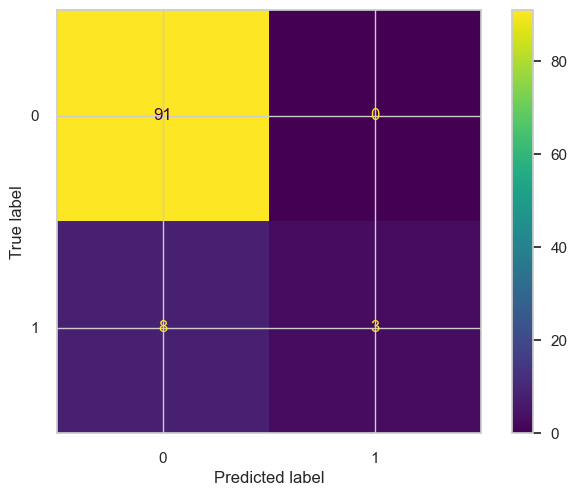

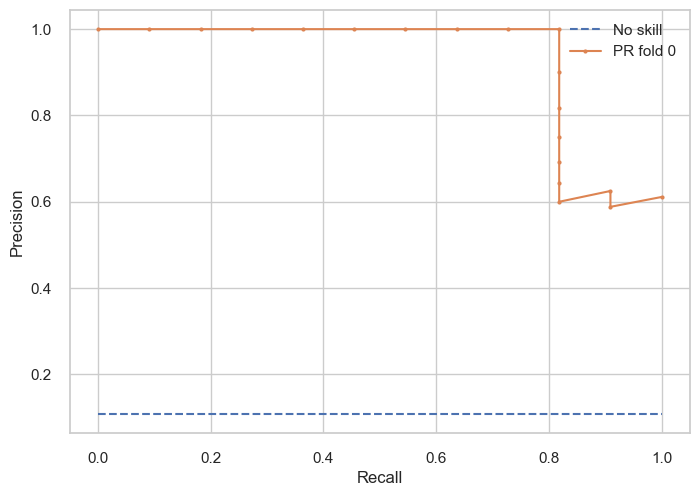

1it [00:00,  1.04it/s]

ROC/AUC: 0.965
Accuracy: 0.9118
F1 score: 0.3077
MCC score: 0.4068
              precision    recall  f1-score   support

           0       0.91      1.00      0.95        91
           1       1.00      0.18      0.31        11

    accuracy                           0.91       102
   macro avg       0.96      0.59      0.63       102
weighted avg       0.92      0.91      0.88       102



<Figure size 800x550 with 0 Axes>

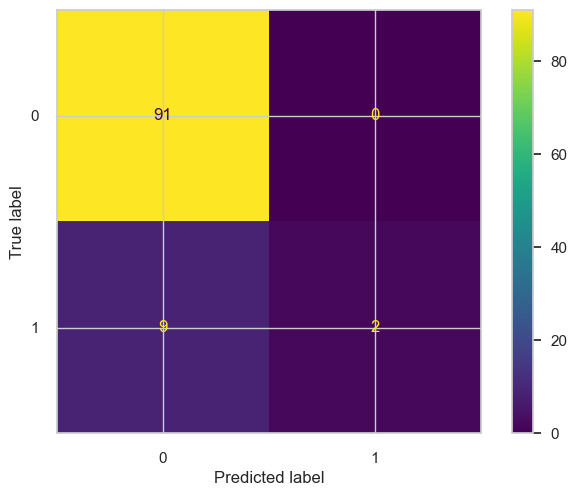

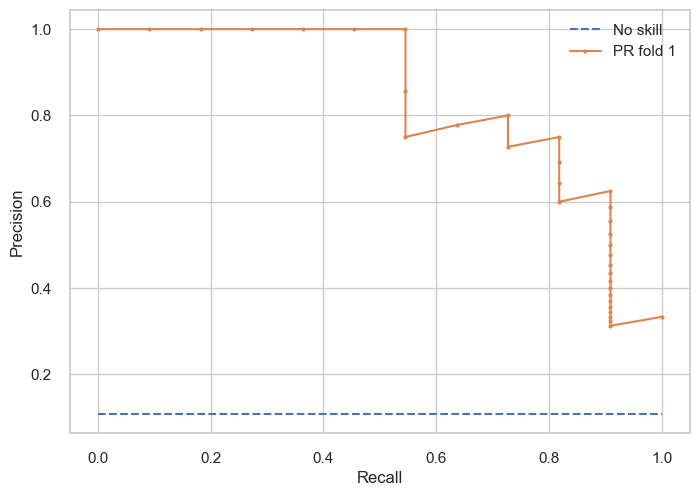

2it [00:01,  1.06it/s]

ROC/AUC: 1.0
Accuracy: 0.9608
F1 score: 0.7778
MCC score: 0.7807
              precision    recall  f1-score   support

           0       0.96      1.00      0.98        91
           1       1.00      0.64      0.78        11

    accuracy                           0.96       102
   macro avg       0.98      0.82      0.88       102
weighted avg       0.96      0.96      0.96       102



<Figure size 800x550 with 0 Axes>

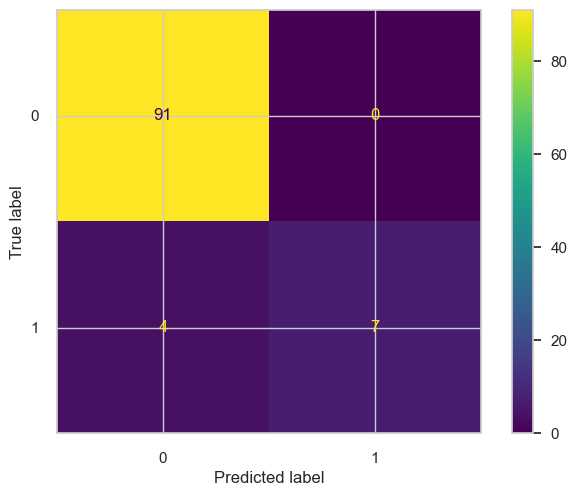

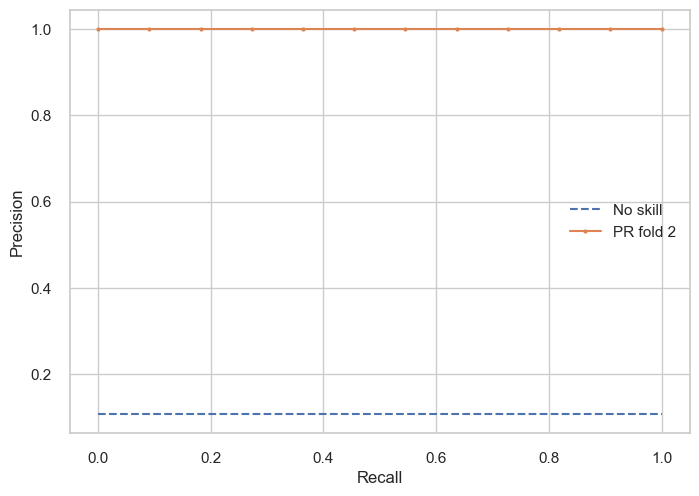

3it [00:02,  1.06it/s]

ROC/AUC: 0.997
Accuracy: 0.9118
F1 score: 0.3077
MCC score: 0.4068
              precision    recall  f1-score   support

           0       0.91      1.00      0.95        91
           1       1.00      0.18      0.31        11

    accuracy                           0.91       102
   macro avg       0.96      0.59      0.63       102
weighted avg       0.92      0.91      0.88       102



<Figure size 800x550 with 0 Axes>

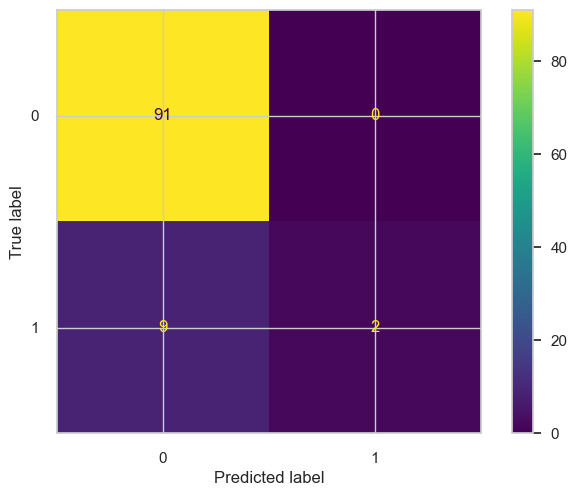

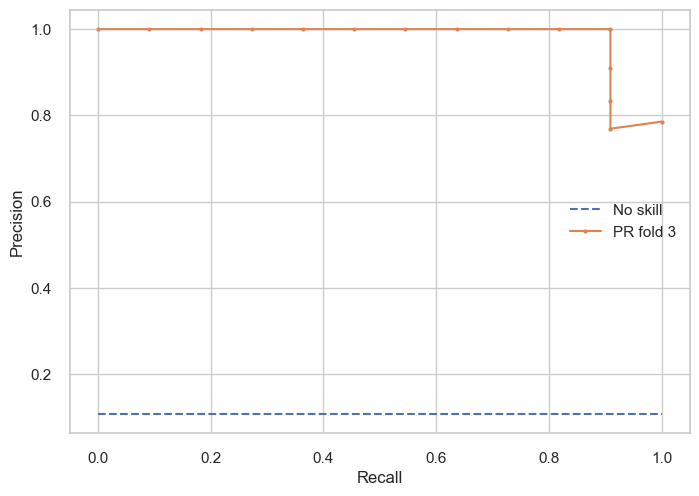

4it [00:03,  1.07it/s]

ROC/AUC: 0.988
Accuracy: 0.9216
F1 score: 0.4286
MCC score: 0.5007
              precision    recall  f1-score   support

           0       0.92      1.00      0.96        91
           1       1.00      0.27      0.43        11

    accuracy                           0.92       102
   macro avg       0.96      0.64      0.69       102
weighted avg       0.93      0.92      0.90       102



<Figure size 800x550 with 0 Axes>

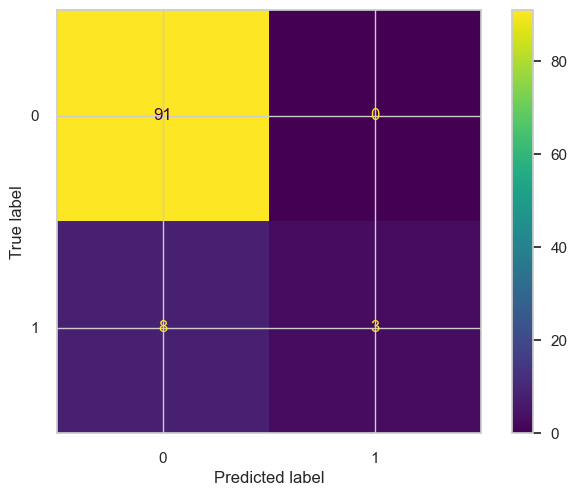

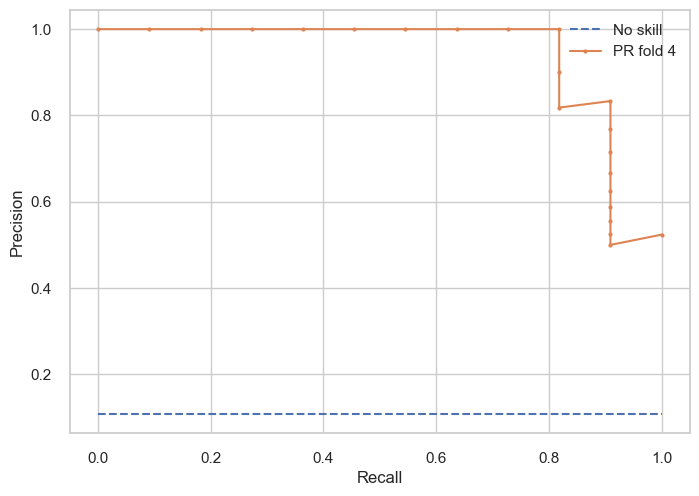

5it [00:04,  1.08it/s]

ROC/AUC: 0.973
Accuracy: 0.9216
F1 score: 0.4286
MCC score: 0.5007
              precision    recall  f1-score   support

           0       0.92      1.00      0.96        91
           1       1.00      0.27      0.43        11

    accuracy                           0.92       102
   macro avg       0.96      0.64      0.69       102
weighted avg       0.93      0.92      0.90       102



<Figure size 800x550 with 0 Axes>

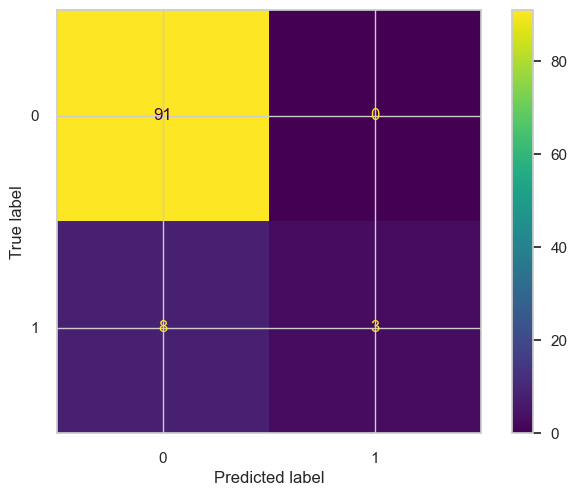

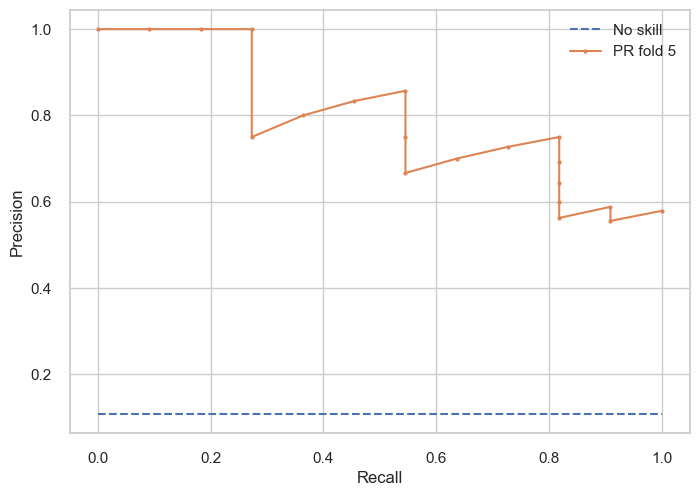

6it [00:05,  1.08it/s]

ROC/AUC: 0.951
Accuracy: 0.9216
F1 score: 0.4286
MCC score: 0.5007
              precision    recall  f1-score   support

           0       0.92      1.00      0.96        91
           1       1.00      0.27      0.43        11

    accuracy                           0.92       102
   macro avg       0.96      0.64      0.69       102
weighted avg       0.93      0.92      0.90       102



<Figure size 800x550 with 0 Axes>

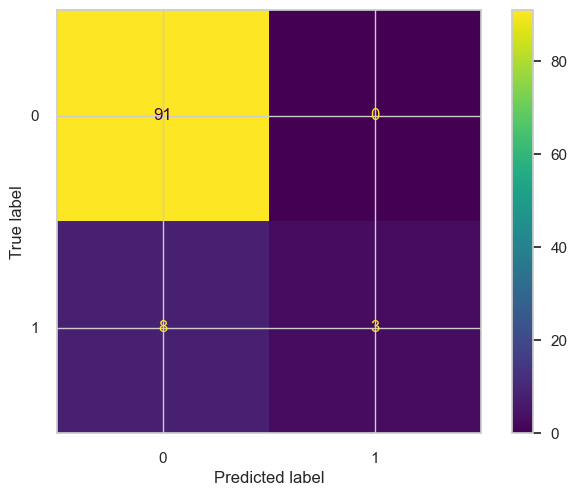

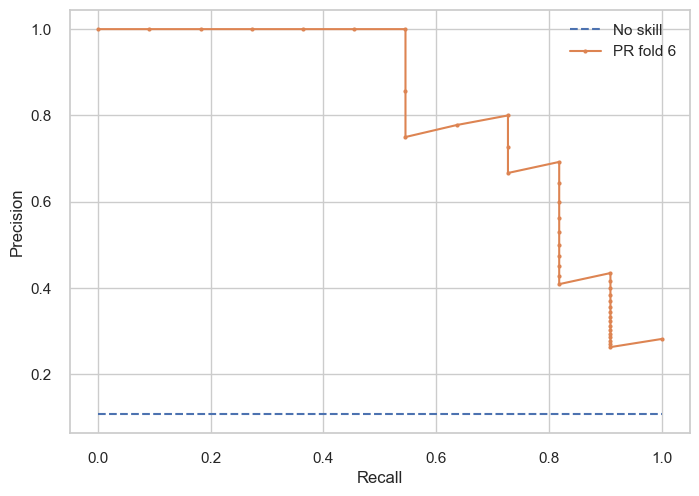

7it [00:06,  1.07it/s]

ROC/AUC: 0.9121
Accuracy: 0.951
F1 score: 0.7059
MCC score: 0.7191
              precision    recall  f1-score   support

           0       0.95      1.00      0.97        91
           1       1.00      0.55      0.71        11

    accuracy                           0.95       102
   macro avg       0.97      0.77      0.84       102
weighted avg       0.95      0.95      0.94       102



<Figure size 800x550 with 0 Axes>

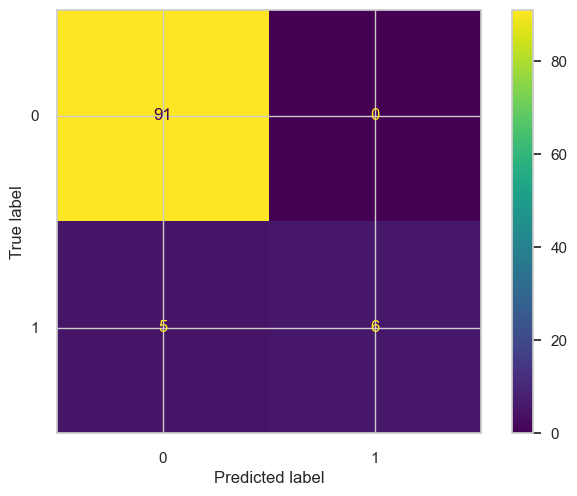

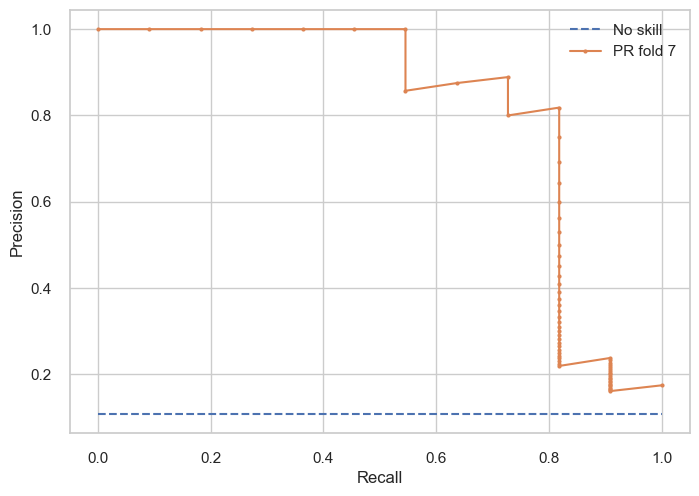

8it [00:07,  1.07it/s]

ROC/AUC: 0.9463
Accuracy: 0.8922
F1 score: 0.2667
MCC score: 0.2966
              precision    recall  f1-score   support

           0       0.90      0.99      0.94        90
           1       0.67      0.17      0.27        12

    accuracy                           0.89       102
   macro avg       0.78      0.58      0.60       102
weighted avg       0.87      0.89      0.86       102



<Figure size 800x550 with 0 Axes>

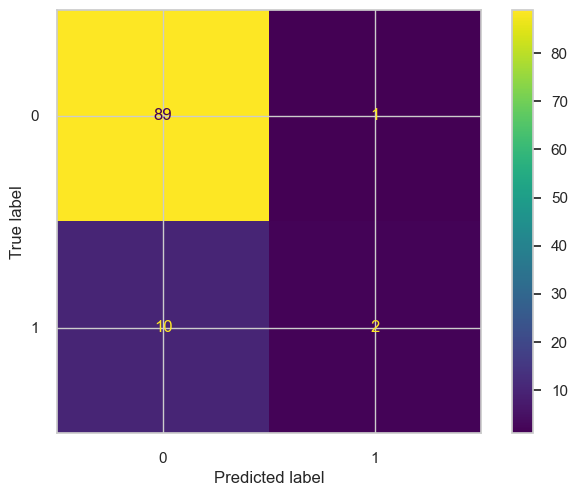

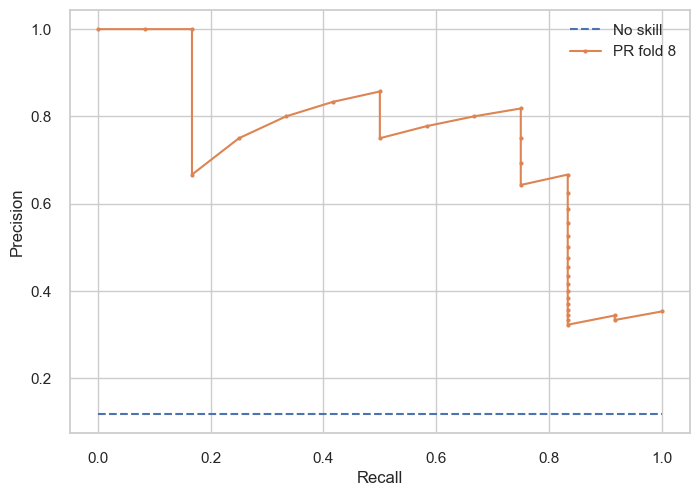

9it [00:08,  1.05it/s]

ROC/AUC: 0.9859
Accuracy: 0.9208
F1 score: 0.4286
MCC score: 0.5005
              precision    recall  f1-score   support

           0       0.92      1.00      0.96        90
           1       1.00      0.27      0.43        11

    accuracy                           0.92       101
   macro avg       0.96      0.64      0.69       101
weighted avg       0.93      0.92      0.90       101



<Figure size 800x550 with 0 Axes>

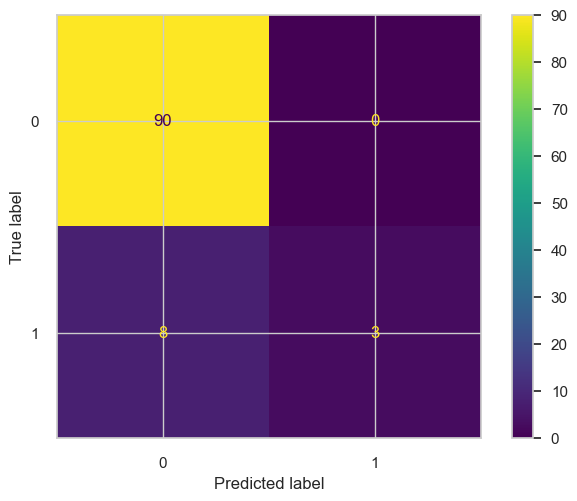

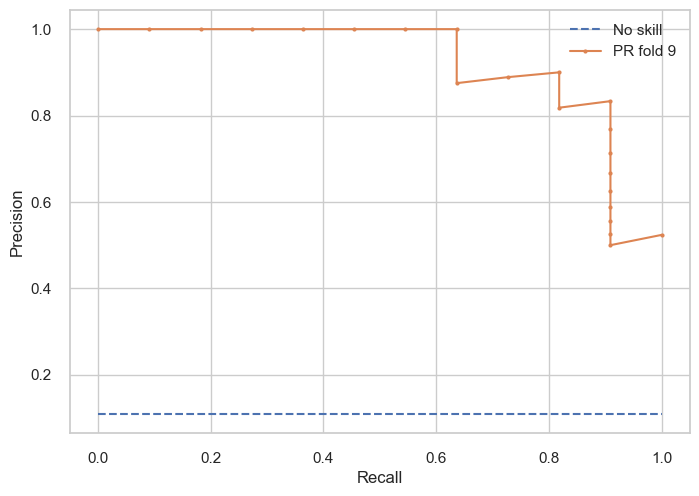

10it [00:09,  1.06it/s]


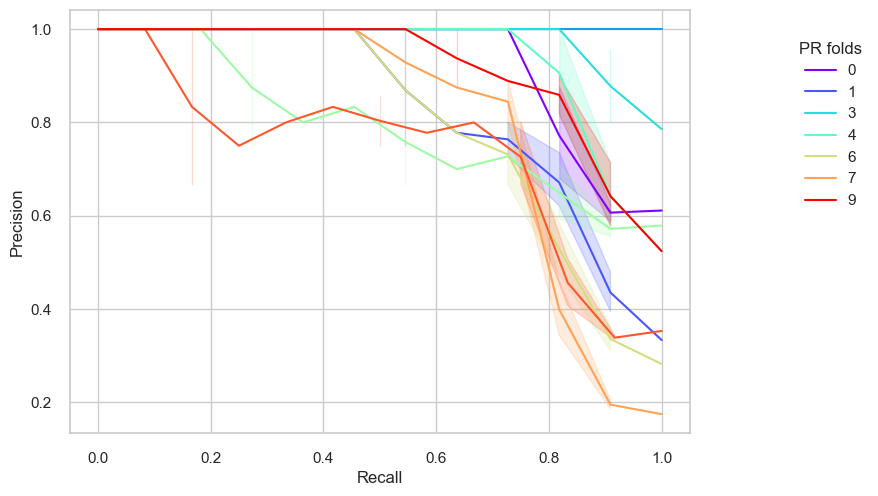

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprec

<Figure size 800x550 with 0 Axes>

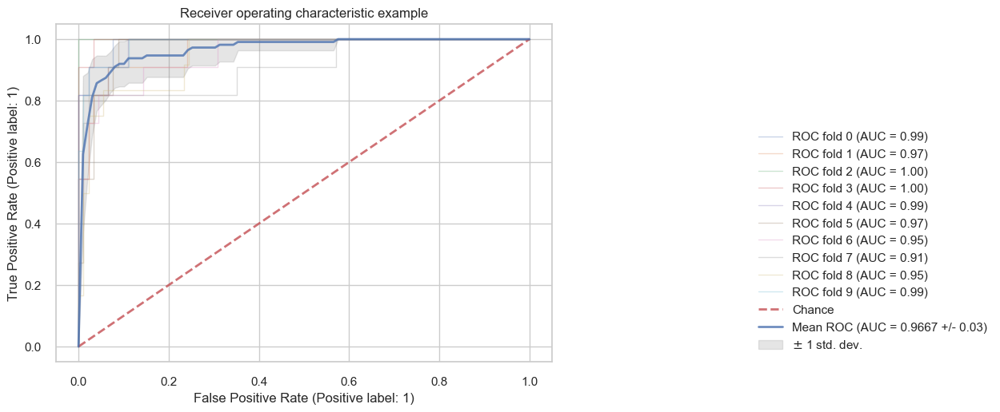

In [128]:
try:
    logged_model = f"runs:/{lgbm_run_id}/LGBM_model"

    lgbm_opt_from_pickle = mlflow.sklearn.load_model(logged_model)

    lgbm_opt_res, lgbm_opt_threshold, lgbm_pr_data_train, lgbm_roc_data_train  = train_diag_mlflow(
        lgbm_opt_from_pickle, X_train_mod, y_train, n_splits, "LGBM_opt_optimized"
    )
except Exception:
    filepath_lgbm = os.path.join(path_folder, "models/lgbm_opt_from_pickle.pkl")
    with open(filepath_lgbm, 'rb') as fp_lgbm:
        lgbm_opt_from_pickle = pickle.load(fp_lgbm)
    lgbm_opt_from_pickle.fit(X_train_mod, y_train)
    lgbm_opt_res, lgbm_opt_threshold, lgbm_pr_data_train, lgbm_roc_data_train  = train_diag_mlflow(
        lgbm_opt_from_pickle, X_train_mod, y_train, n_splits, "LGBM_opt_optimized"
    )

[LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
[LightGBM] [Warning] bagging_fraction is set=0.027021158905779226, subsample=1.0 will be ignored. Current value: bagging_fraction=0.027021158905779226
[LightGBM] [Warning] feature_fraction is set=0.9596893264923619, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9596893264923619
[LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=20, min_child_weight=0.001 will be ignored. Current value: min_sum_hessian_in_leaf=20[LightGBM] [Warning] bagging_fraction is set=0.027021158905779226, subsample=1.0 will be ignored. Current value: bagging_fraction=0.027021158905779226

[LightGBM] [Warning] feature_fraction is set=0.9596893264923619, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9596893264923619
[LightGB

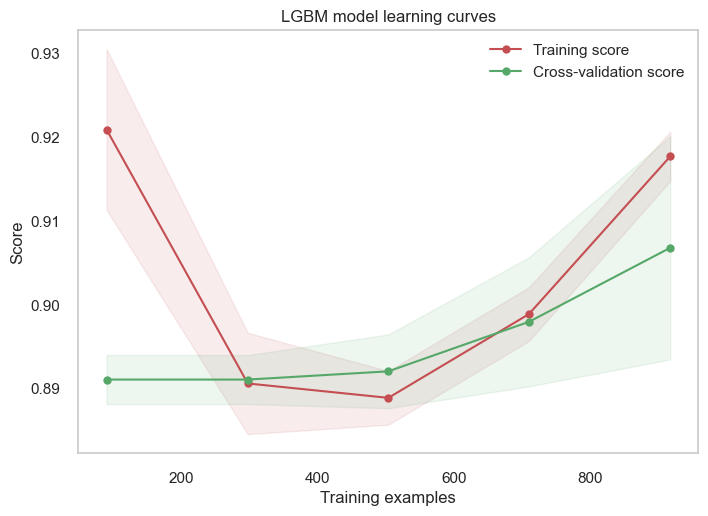

In [129]:
g = plot_learning_curve(lgbm_opt_from_pickle,
                        "LGBM model learning curves",
                        X_train_mod,
                        y_train,
                        cv=cv)

#### XGB - Optuna

In [130]:
mlflow.end_run()

n_trials = 20

%time

def xgb_opt_objective(trial):

    params = {
        "objective": "binary:logistic",
        "eval_metric": "auc",
        "max_depth": trial.suggest_int("max_depth", 4, 15, 1),
        "subsample": trial.suggest_float("subsample", 0.5, 1.0),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.1),
        "min_child_weight": trial.suggest_int("min_child_weight", 1, 10),
        "alpha": trial.suggest_float("alpha", 1e-8, 1.0),
        "lambda": trial.suggest_float("lambda", 1e-8, 1.0),
        "gamma": trial.suggest_float("gamma", 1e-8, 1.0),
        "verbosity": 0,
        "random_state": 42
    }

    kfold = StratifiedKFold(n_splits=3, shuffle=True, random_state=0)
    roc_auc_lst = []

    for train_index, test_index in kfold.split(X_train_mod, y_train):
        X_train_s, X_test_s = X_train_mod.iloc[train_index, :], X_train_mod.iloc[test_index, :]
        y_train_s, y_test_s = y_train[train_index], y_train[test_index]

        dtrain = xgb.DMatrix(X_train_s, label=y_train_s)
        dtest = xgb.DMatrix(X_test_s, label=y_test_s)
        evals = [(dtest, "eval")]
        model = xgb.train(params,
                          dtrain,
                          evals=evals,
                          early_stopping_rounds=int(n_trials/2),
                          verbose_eval=False)
        y_pred = model.predict(dtest)
        y_pred_binary = np.round(y_pred)
        roc_auc = round(roc_auc_score(y_test_s, y_pred_binary), 4)
        roc_auc_lst.append(roc_auc)

    mean_roc_auc = np.mean(roc_auc_lst)

    return mean_roc_auc

date_run = datetime.now().strftime("%Y%m%d_%H%M%S")
mlflow.set_experiment(f"XGB_experiment_{date_run}")

with mlflow.start_run():
    mlflow.set_tag("optimizer", "Optuna")
    mlflow.set_tag("algorithm", "LGBM")
    print("artifact uri:", mlflow.get_artifact_uri())

    xgb_run_id = mlflow.active_run().info.run_id
    print("Run id:", xgb_run_id)

    xgb_study = optuna.create_study(direction="maximize")

    xgb_study.optimize(xgb_opt_objective, n_trials=n_trials)

    # Get the best hyperparameters and corresponding score
    best_params_xgb = xgb_study.best_params
    best_score_xgb = xgb_study.best_value

    for key, value in best_params_xgb.items():
        mlflow.log_param(key, value)

    mlflow.log_metric("AUC", best_score_xgb)

    xgb_model = xgb.XGBClassifier(**best_params_xgb)
    xgb_model.fit(X_train_mod, y_train)
    mlflow.sklearn.log_model(xgb_model, "XGB_model")

mlflow.end_run()

print(f"Best Hyperparameters: {best_params_xgb}")
# Best Hyperparameters: {'max_depth': 5, 'subsample': 0.9270128417985923, 'learning_rate': 0.08553643182604106, 'min_child_weight': 2, 'alpha': 0.936319505363167, 'lambda': 0.33553481360697446, 'gamma': 0.39476171106789726}

print(f"Best Validation AUC: {best_score_xgb}")
# Best Validation Accuracy: 0.9467456827663924

2024/07/03 12:38:35 INFO mlflow.tracking.fluent: Experiment with name 'XGB_experiment_20240703_123834' does not exist. Creating a new experiment.


CPU times: user 3 µs, sys: 2 µs, total: 5 µs
Wall time: 10 µs


[I 2024-07-03 12:38:35,471] A new study created in memory with name: no-name-1fe96b39-ac07-40e7-b019-92e488941cf4
[I 2024-07-03 12:38:35,591] Trial 0 finished with value: 0.5045000000000001 and parameters: {'max_depth': 7, 'subsample': 0.9216242161353582, 'learning_rate': 0.054151783578164164, 'min_child_weight': 10, 'alpha': 0.39788267863872917, 'lambda': 0.20086137237913748, 'gamma': 0.39656671818194417}. Best is trial 0 with value: 0.5045000000000001.


artifact uri: mlflow-artifacts:/515686037452820427/60ae05a4bc9f4323b0ca8f3a6205c0a6/artifacts
Run id: 60ae05a4bc9f4323b0ca8f3a6205c0a6


[I 2024-07-03 12:38:35,711] Trial 1 finished with value: 0.5 and parameters: {'max_depth': 13, 'subsample': 0.7807542180883631, 'learning_rate': 0.01904668195554937, 'min_child_weight': 9, 'alpha': 0.36920893149291145, 'lambda': 0.016544533511660336, 'gamma': 0.860407380477953}. Best is trial 0 with value: 0.5045000000000001.
[I 2024-07-03 12:38:35,861] Trial 2 finished with value: 0.509 and parameters: {'max_depth': 13, 'subsample': 0.5933605405201798, 'learning_rate': 0.04675328618486538, 'min_child_weight': 6, 'alpha': 0.030657669226605296, 'lambda': 0.2270409872299829, 'gamma': 0.4076936984256593}. Best is trial 2 with value: 0.509.
[I 2024-07-03 12:38:35,994] Trial 3 finished with value: 0.5 and parameters: {'max_depth': 9, 'subsample': 0.5123969120678888, 'learning_rate': 0.0598569391530126, 'min_child_weight': 9, 'alpha': 0.682568593952508, 'lambda': 0.292652786053649, 'gamma': 0.7682219566491302}. Best is trial 2 with value: 0.509.
[I 2024-07-03 12:38:36,115] Trial 4 finished w

Best Hyperparameters: {'max_depth': 15, 'subsample': 0.5124169920928218, 'learning_rate': 0.08681237969507288, 'min_child_weight': 1, 'alpha': 0.9994561588916723, 'lambda': 0.5366081914093249, 'gamma': 0.028156457940382018}
Best Validation AUC: 0.5625333333333333


In [131]:
filepath_xgb = os.path.join(path_folder, "models/xgboost_opt_pickle.pkl")
pickle.dump(xgb_model, open(filepath_xgb, 'wb'))

2024/07/03 12:38:45 INFO mlflow.tracking.fluent: Experiment with name 'XGB_opt_optimized_20240703_123845' does not exist. Creating a new experiment.
0it [00:00, ?it/s]

ROC/AUC: 1.0
Accuracy: 0.9902
F1 score: 0.9524
MCC score: 0.9483
              precision    recall  f1-score   support

           0       0.99      1.00      0.99        91
           1       1.00      0.91      0.95        11

    accuracy                           0.99       102
   macro avg       0.99      0.95      0.97       102
weighted avg       0.99      0.99      0.99       102



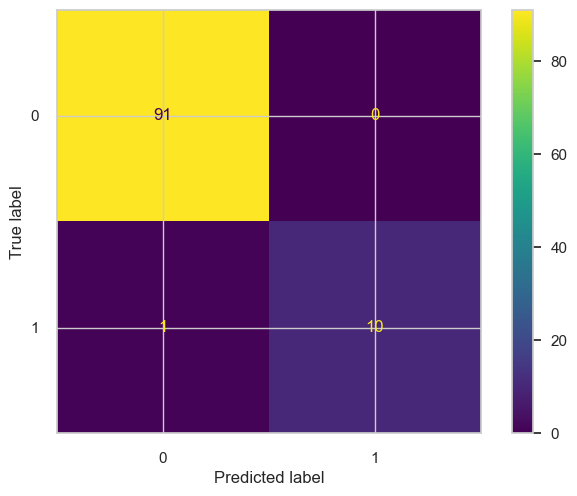

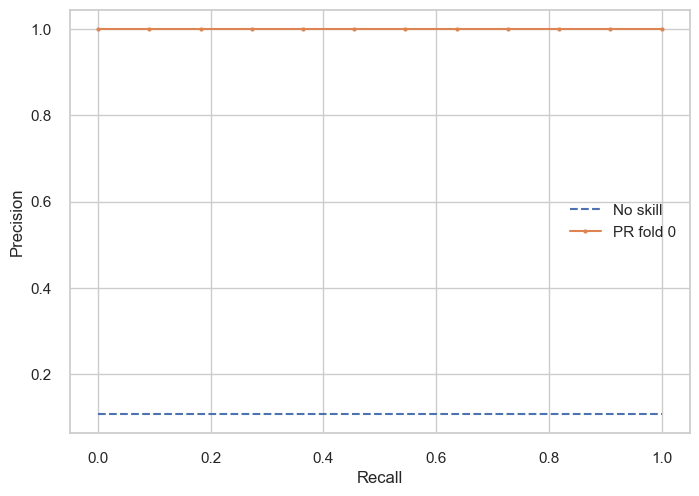

1it [00:00,  1.08it/s]

ROC/AUC: 1.0
Accuracy: 0.9902
F1 score: 0.9524
MCC score: 0.9483
              precision    recall  f1-score   support

           0       0.99      1.00      0.99        91
           1       1.00      0.91      0.95        11

    accuracy                           0.99       102
   macro avg       0.99      0.95      0.97       102
weighted avg       0.99      0.99      0.99       102



<Figure size 800x550 with 0 Axes>

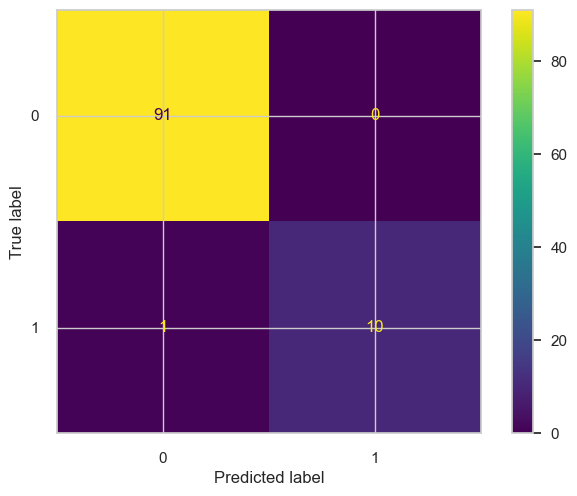

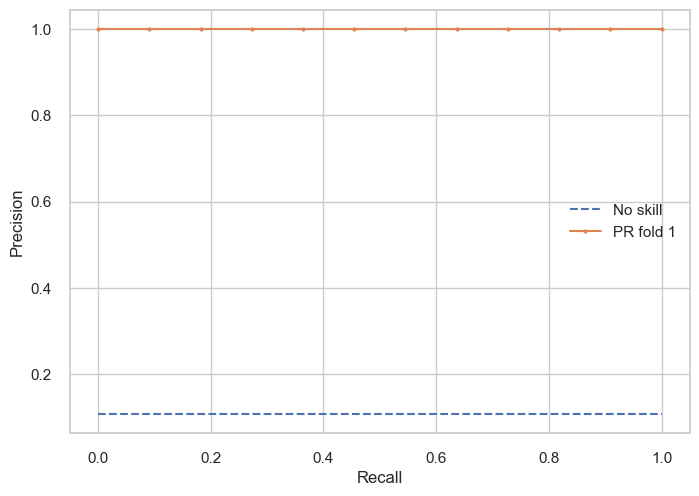

2it [00:01,  1.05it/s]

ROC/AUC: 1.0
Accuracy: 0.9902
F1 score: 0.9524
MCC score: 0.9483
              precision    recall  f1-score   support

           0       0.99      1.00      0.99        91
           1       1.00      0.91      0.95        11

    accuracy                           0.99       102
   macro avg       0.99      0.95      0.97       102
weighted avg       0.99      0.99      0.99       102



<Figure size 800x550 with 0 Axes>

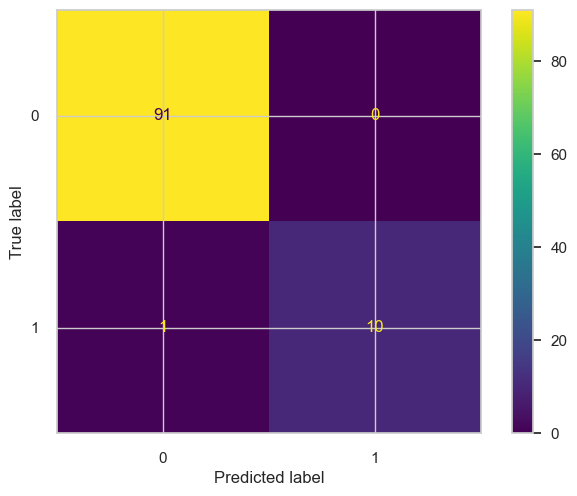

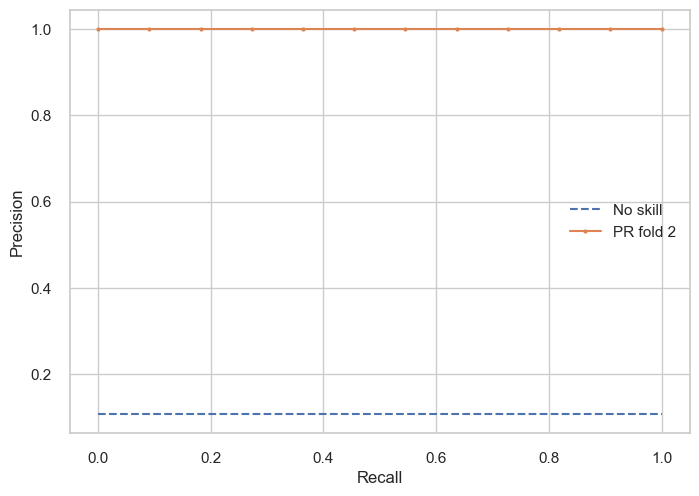

3it [00:03,  1.13s/it]

ROC/AUC: 1.0
Accuracy: 1.0
F1 score: 1.0
MCC score: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        91
           1       1.00      1.00      1.00        11

    accuracy                           1.00       102
   macro avg       1.00      1.00      1.00       102
weighted avg       1.00      1.00      1.00       102



<Figure size 800x550 with 0 Axes>

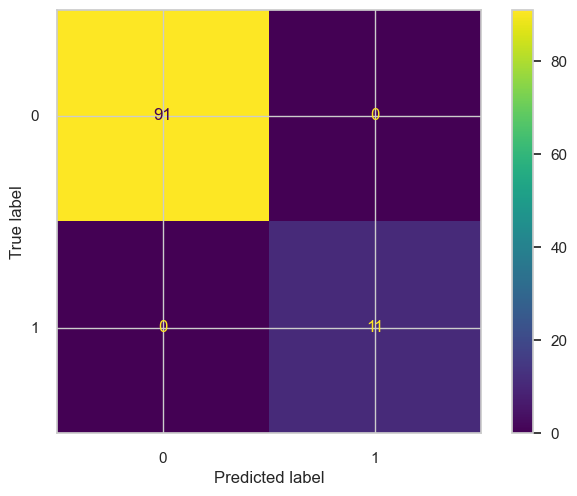

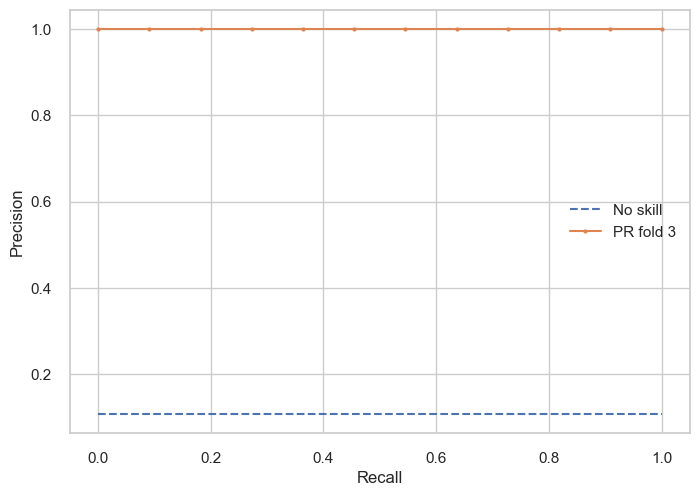

4it [00:04,  1.05s/it]

ROC/AUC: 1.0
Accuracy: 0.9804
F1 score: 0.9
MCC score: 0.8948
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        91
           1       1.00      0.82      0.90        11

    accuracy                           0.98       102
   macro avg       0.99      0.91      0.94       102
weighted avg       0.98      0.98      0.98       102



<Figure size 800x550 with 0 Axes>

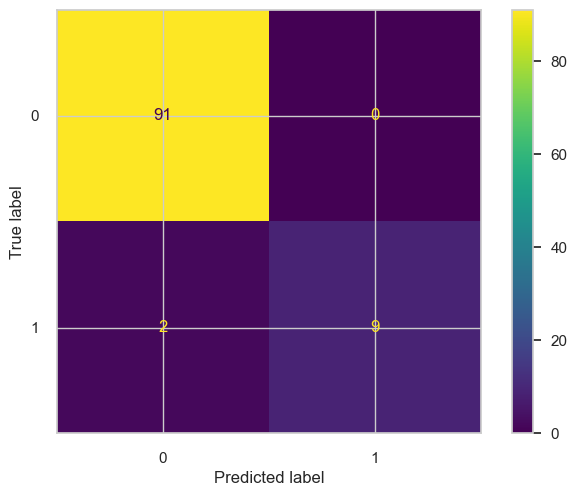

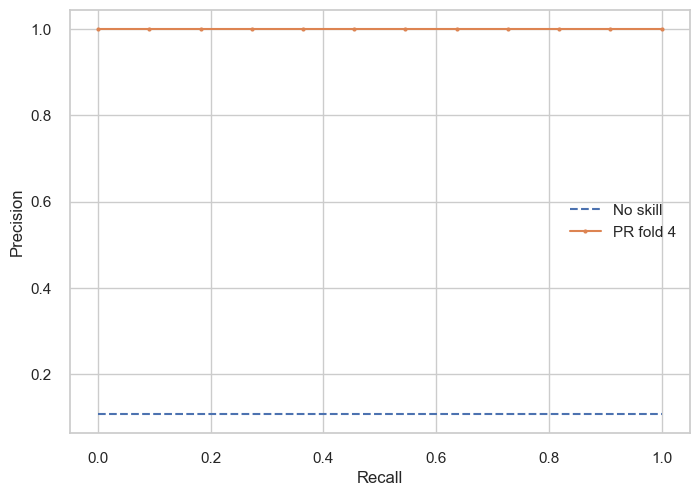

5it [00:05,  1.00s/it]

ROC/AUC: 1.0
Accuracy: 0.9804
F1 score: 0.9
MCC score: 0.8948
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        91
           1       1.00      0.82      0.90        11

    accuracy                           0.98       102
   macro avg       0.99      0.91      0.94       102
weighted avg       0.98      0.98      0.98       102



<Figure size 800x550 with 0 Axes>

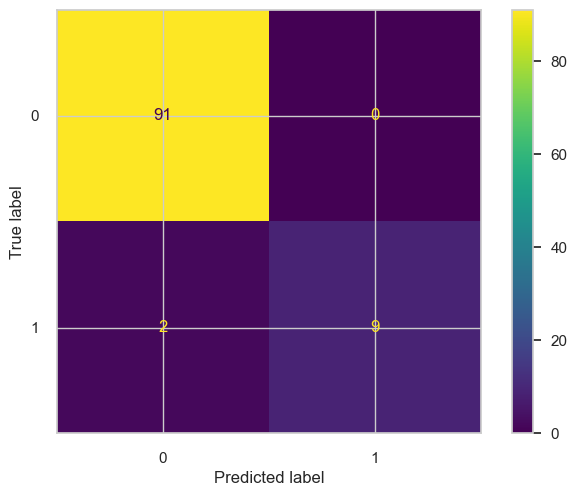

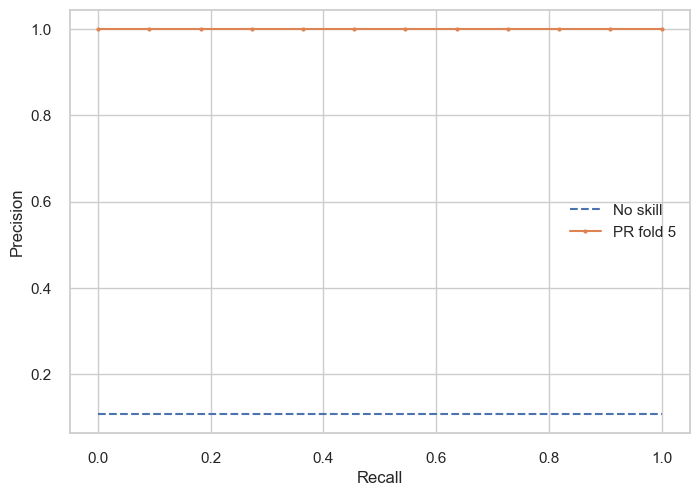

6it [00:05,  1.04it/s]

ROC/AUC: 1.0
Accuracy: 0.9804
F1 score: 0.9
MCC score: 0.8948
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        91
           1       1.00      0.82      0.90        11

    accuracy                           0.98       102
   macro avg       0.99      0.91      0.94       102
weighted avg       0.98      0.98      0.98       102



<Figure size 800x550 with 0 Axes>

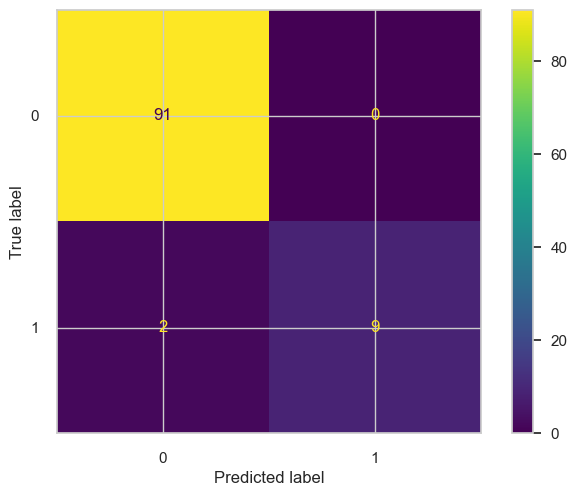

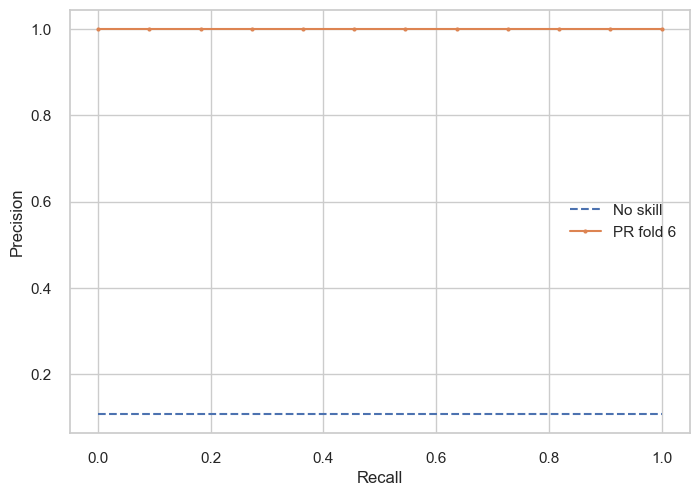

7it [00:06,  1.02it/s]

ROC/AUC: 0.996
Accuracy: 0.9804
F1 score: 0.9
MCC score: 0.8948
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        91
           1       1.00      0.82      0.90        11

    accuracy                           0.98       102
   macro avg       0.99      0.91      0.94       102
weighted avg       0.98      0.98      0.98       102



<Figure size 800x550 with 0 Axes>

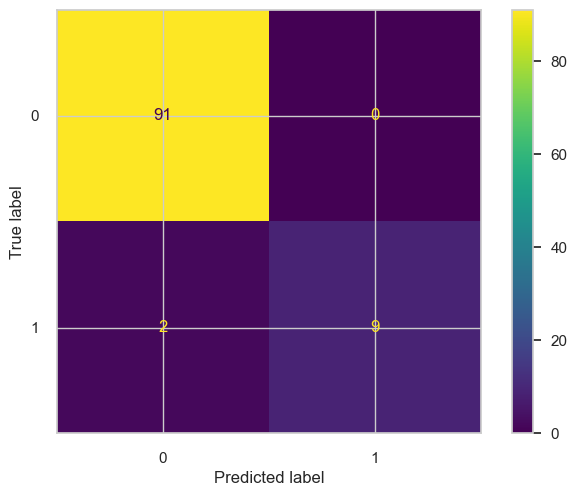

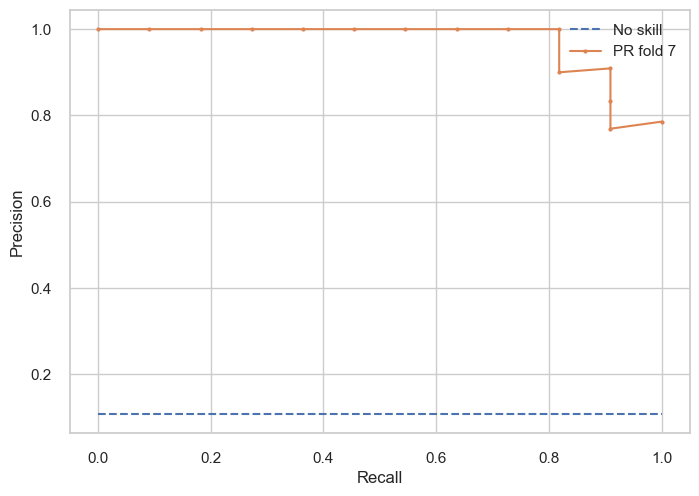

8it [00:08,  1.01s/it]

ROC/AUC: 0.9981
Accuracy: 0.9804
F1 score: 0.9091
MCC score: 0.9029
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        90
           1       1.00      0.83      0.91        12

    accuracy                           0.98       102
   macro avg       0.99      0.92      0.95       102
weighted avg       0.98      0.98      0.98       102



<Figure size 800x550 with 0 Axes>

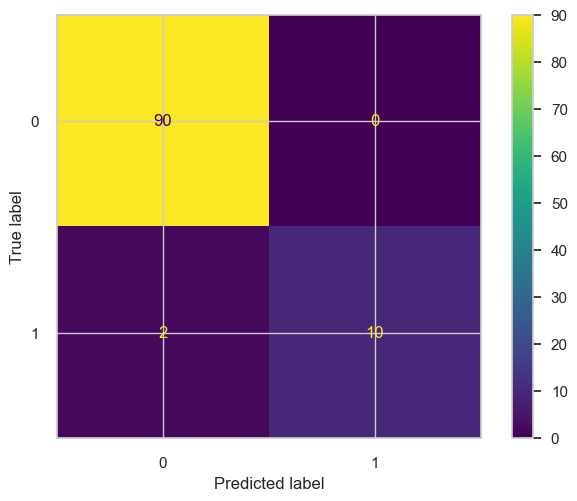

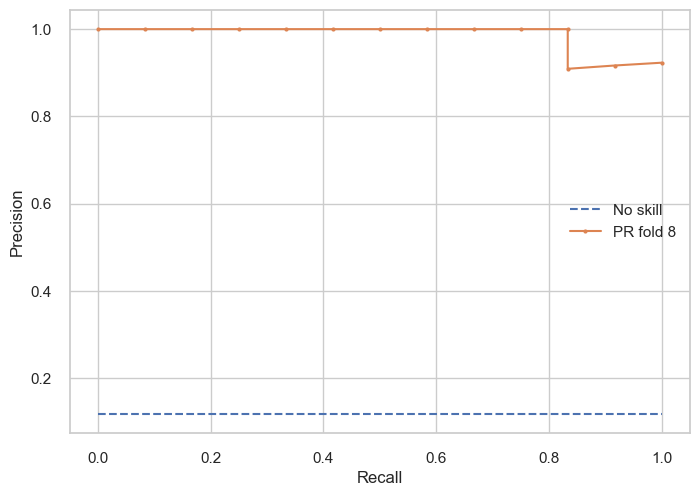

9it [00:08,  1.01it/s]

ROC/AUC: 1.0
Accuracy: 1.0
F1 score: 1.0
MCC score: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        90
           1       1.00      1.00      1.00        11

    accuracy                           1.00       101
   macro avg       1.00      1.00      1.00       101
weighted avg       1.00      1.00      1.00       101



<Figure size 800x550 with 0 Axes>

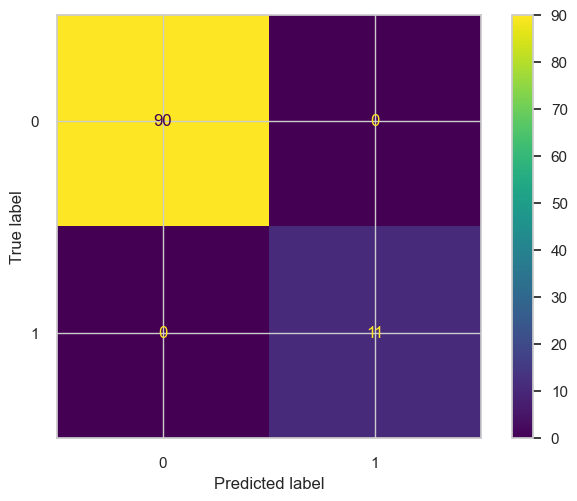

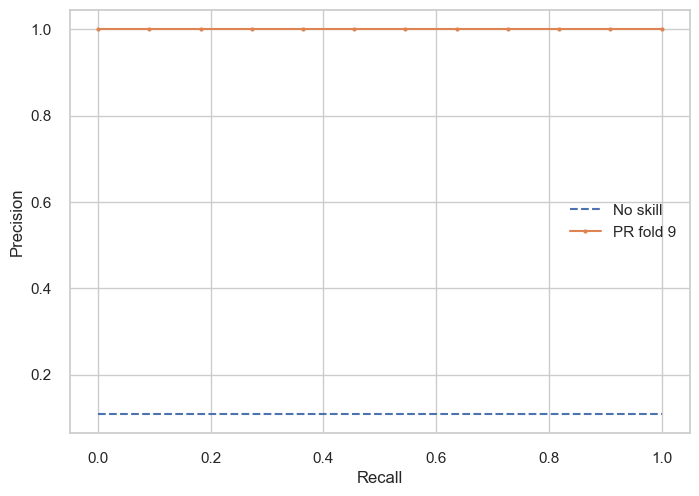

10it [00:09,  1.01it/s]


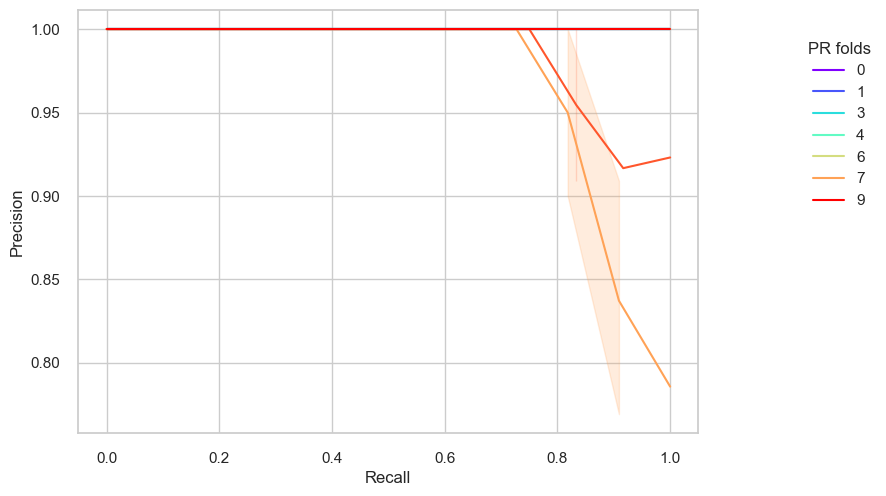

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprec

<Figure size 800x550 with 0 Axes>

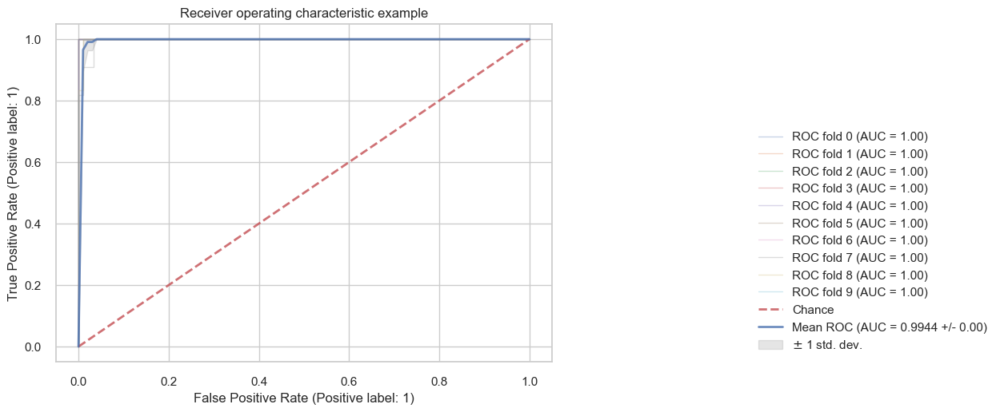

In [132]:
try:
    logged_model = "runs:/{xgb_run_id}/XGB_model"

    xgboost_opt_from_pickle = mlflow.sklearn.load_model(logged_model)

    xgb_opt_res, xgb_opt_threshold, xgb_pr_data, xgb_roc_data_train = train_diag_mlflow(
        xgboost_opt_from_pickle, X_train_mod, y_train, n_splits, "XGB_opt_optimized"
    )
except Exception:
    filepath_xgb = os.path.join(path_folder, "models/xgboost_opt_pickle.pkl")
    with open(filepath_xgb, 'rb') as fp_xgb:
        xgboost_opt_from_pickle = pickle.load(fp_xgb)
    xgboost_opt_from_pickle.fit(X_train_mod, y_train)
    xgb_opt_res, xgb_opt_threshold, xgb_pr_data, xgb_roc_data_train = train_diag_mlflow(
        xgboost_opt_from_pickle, X_train_mod, y_train, n_splits, "XGB_opt_optimized"
    )

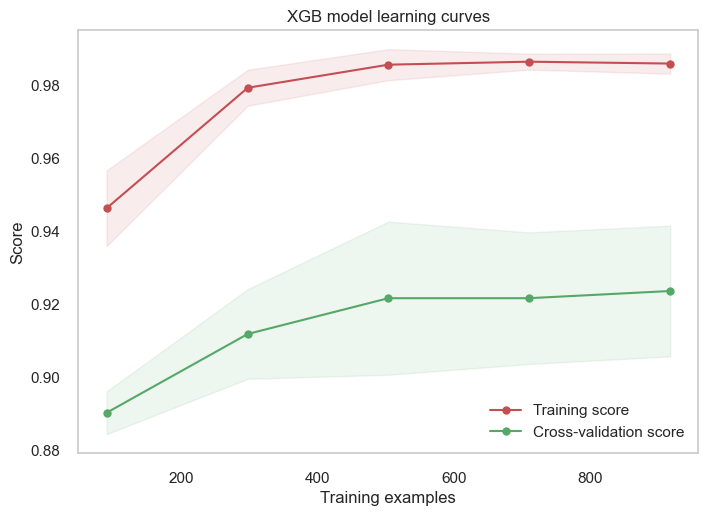

In [133]:
g = plot_learning_curve(xgboost_opt_from_pickle,
                        "XGB model learning curves",
                        X_train_mod,
                        y_train,
                        cv=cv)

#### Optuna visuals

In [134]:
plot_optimization_history(xgb_study)

In [135]:
plot_param_importances(xgb_study)

#### AdaBoost hyperparameter

In [136]:
mlflow.end_run()

n_trials = 20

%time

def ada_opt_objective(trial):

    max_depth = trial.suggest_int("max_depth", 1, 10)
    n_estimators = trial.suggest_int("n_estimators", 50, 200)
    learning_rate = trial.suggest_float("learning_rate", 0.01, 1.0)
    random_state = 42

    kfolds = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=0)
    kfolds.get_n_splits(X_train_mod, y_train)
    roc_auc_lst = []

    for i, (train_index, test_index) in tqdm(enumerate(kfolds.split(X_train_mod, y_train))):
        X_train_s, X_test_s = X_train_mod.iloc[train_index, :], X_train_mod.iloc[test_index, :]
        y_train_s, y_test_s = y_train[train_index], y_train[test_index]
        base_estimator = DecisionTreeClassifier(max_depth=max_depth)
        model = AdaBoostClassifier(base_estimator=base_estimator, n_estimators=n_estimators, learning_rate=learning_rate, random_state=random_state)
        model.fit(X_train_s, y_train_s)

        y_pred = model.predict(X_test_s)
        roc_auc = round(roc_auc_score(y_test_s, y_pred), 4)
        roc_auc_lst.append(roc_auc)

    mean_roc_auc = np.mean(roc_auc_lst)

    return 1.0 - mean_roc_auc

date_run = datetime.now().strftime("%Y%m%d_%H%M%S")
mlflow.set_experiment(f"AdaBoostClassifier_experiment_{date_run}")

with mlflow.start_run():

    mlflow.set_tag("optimizer", "Optuna")
    mlflow.set_tag("algorithm", "AdaBoostClassifier")
    print("artifact uri:", mlflow.get_artifact_uri())

    ada_run_id = mlflow.active_run().info.run_id
    print("Run id:", ada_run_id)

    #with mlflow.start_run(nested=True):
    ada_study = optuna.create_study(direction="minimize")

    ada_study.optimize(ada_opt_objective, n_trials=n_trials)

    # Get the best hyperparameters and corresponding score
    best_params_ada = ada_study.best_params
    best_score_ada = ada_study.best_value

    for key, value in best_params_ada.items():
        mlflow.log_param(key, value)

    mlflow.log_metric("auc", best_score_ada)

    base_estimator = DecisionTreeClassifier(max_depth=best_params_ada["max_depth"])
    ada_model = AdaBoostClassifier(
        base_estimator=base_estimator,
        n_estimators=best_params_ada["n_estimators"],
        learning_rate=best_params_ada["learning_rate"],
        random_state=0,
    )
    ada_model.fit(X_train_mod, y_train)
    mlflow.sklearn.log_model(ada_model, "AdaBoostClassifier_model")

mlflow.end_run()

print(f"Best Hyperparameters: {best_params_ada}")

# Best Hyperparameters: {'max_depth': 11, 'num_leaves': 50, 'learning_rate': 0.08430668978110835, 'feature_fraction': 0.7161896785810328, 'bagging_fraction': 0.2708824941491863, 'max_bin': 60, 'min_data_in_leaf': 70, 'min_sum_hessian_in_leaf': 20}

print(f"Best Validation auc: {best_score_ada}")

# Best Validation Accuracy: 0.9452344999569776

CPU times: user 5 µs, sys: 4 µs, total: 9 µs
Wall time: 16.9 µs


2024/07/03 12:39:03 INFO mlflow.tracking.fluent: Experiment with name 'AdaBoostClassifier_experiment_20240703_123902' does not exist. Creating a new experiment.
[I 2024-07-03 12:39:03,337] A new study created in memory with name: no-name-3a6d0f48-ffbf-4eb7-b21d-c7d4cc232ce3


artifact uri: mlflow-artifacts:/634914023706695543/5b7154db357a4894967f480a6e78c033/artifacts
Run id: 5b7154db357a4894967f480a6e78c033


10it [00:11,  1.18s/it]
[I 2024-07-03 12:39:15,135] Trial 0 finished with value: 0.4081600000000001 and parameters: {'max_depth': 6, 'n_estimators': 199, 'learning_rate': 0.4134836063562155}. Best is trial 0 with value: 0.4081600000000001.
10it [00:04,  2.29it/s]
[I 2024-07-03 12:39:19,513] Trial 1 finished with value: 0.40642999999999996 and parameters: {'max_depth': 5, 'n_estimators': 76, 'learning_rate': 0.48231675724508516}. Best is trial 1 with value: 0.40642999999999996.
10it [00:03,  2.82it/s]
[I 2024-07-03 12:39:23,063] Trial 2 finished with value: 0.33089999999999997 and parameters: {'max_depth': 2, 'n_estimators': 97, 'learning_rate': 0.1997602281276753}. Best is trial 2 with value: 0.33089999999999997.
10it [00:04,  2.28it/s]
[I 2024-07-03 12:39:27,453] Trial 3 finished with value: 0.42444000000000004 and parameters: {'max_depth': 5, 'n_estimators': 83, 'learning_rate': 0.7724607950748414}. Best is trial 2 with value: 0.33089999999999997.
10it [00:04,  2.26it/s]
[I 2024-07-0

Best Hyperparameters: {'max_depth': 1, 'n_estimators': 149, 'learning_rate': 0.9051703787211094}
Best Validation auc: 0.20881000000000005


In [137]:
filepath_ada = os.path.join(path_folder, "models/ada_mod_search_pickle.pkl")
pickle.dump(ada_model, open(filepath_ada, 'wb'))

2024/07/03 12:41:00 INFO mlflow.tracking.fluent: Experiment with name 'AdaBoost_optimized_20240703_124059' does not exist. Creating a new experiment.
0it [00:00, ?it/s]

ROC/AUC: 0.992
Accuracy: 0.9804
F1 score: 0.9
MCC score: 0.8948
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        91
           1       1.00      0.82      0.90        11

    accuracy                           0.98       102
   macro avg       0.99      0.91      0.94       102
weighted avg       0.98      0.98      0.98       102



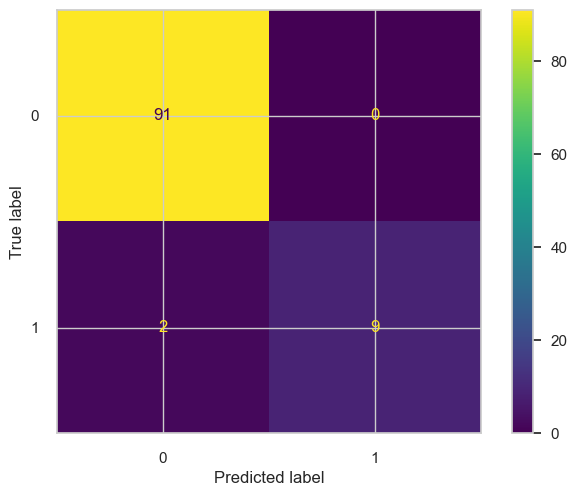

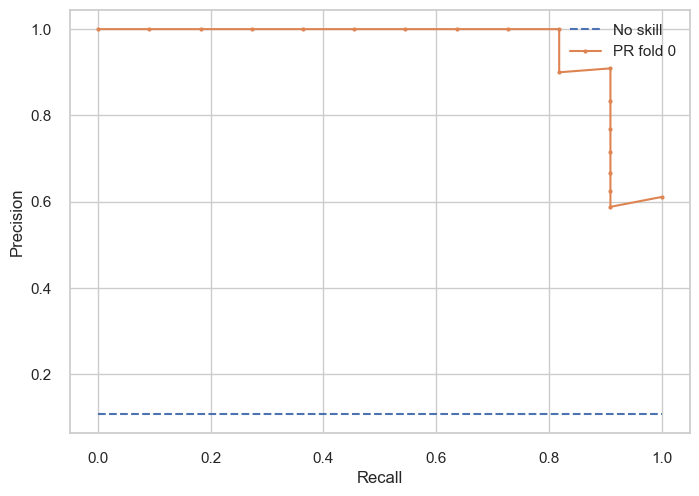

1it [00:01,  1.04s/it]

ROC/AUC: 0.995
Accuracy: 0.9706
F1 score: 0.8571
MCC score: 0.842
              precision    recall  f1-score   support

           0       0.98      0.99      0.98        91
           1       0.90      0.82      0.86        11

    accuracy                           0.97       102
   macro avg       0.94      0.90      0.92       102
weighted avg       0.97      0.97      0.97       102



<Figure size 800x550 with 0 Axes>

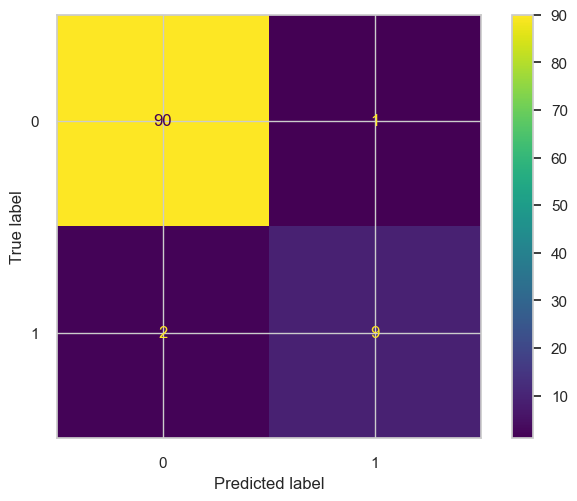

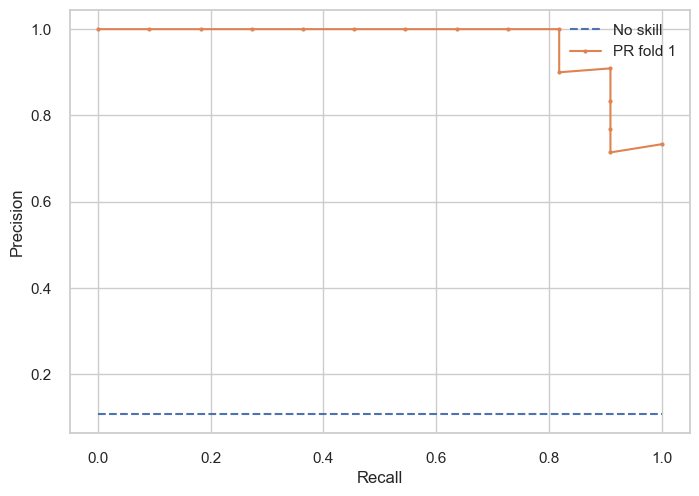

2it [00:02,  1.04s/it]

ROC/AUC: 0.995
Accuracy: 0.9804
F1 score: 0.9
MCC score: 0.8948
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        91
           1       1.00      0.82      0.90        11

    accuracy                           0.98       102
   macro avg       0.99      0.91      0.94       102
weighted avg       0.98      0.98      0.98       102



<Figure size 800x550 with 0 Axes>

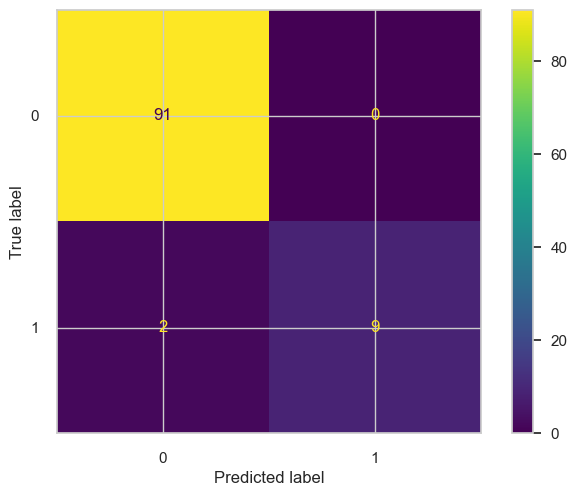

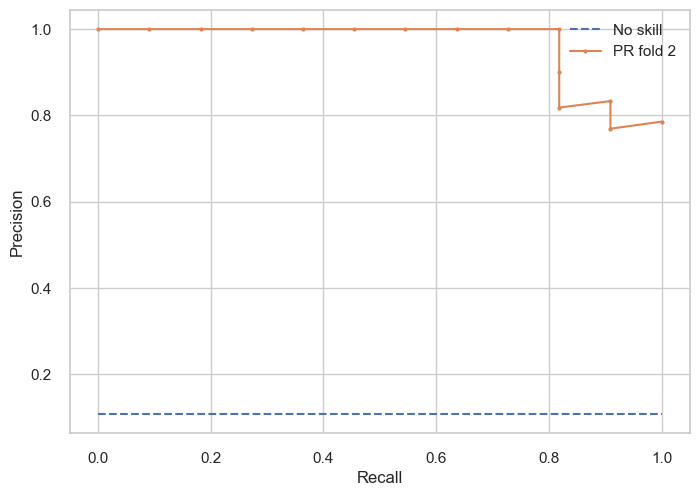

3it [00:03,  1.00it/s]

ROC/AUC: 1.0
Accuracy: 0.9902
F1 score: 0.9524
MCC score: 0.9483
              precision    recall  f1-score   support

           0       0.99      1.00      0.99        91
           1       1.00      0.91      0.95        11

    accuracy                           0.99       102
   macro avg       0.99      0.95      0.97       102
weighted avg       0.99      0.99      0.99       102



<Figure size 800x550 with 0 Axes>

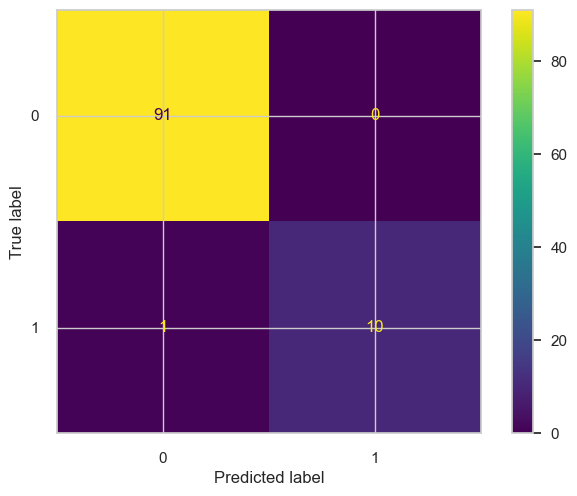

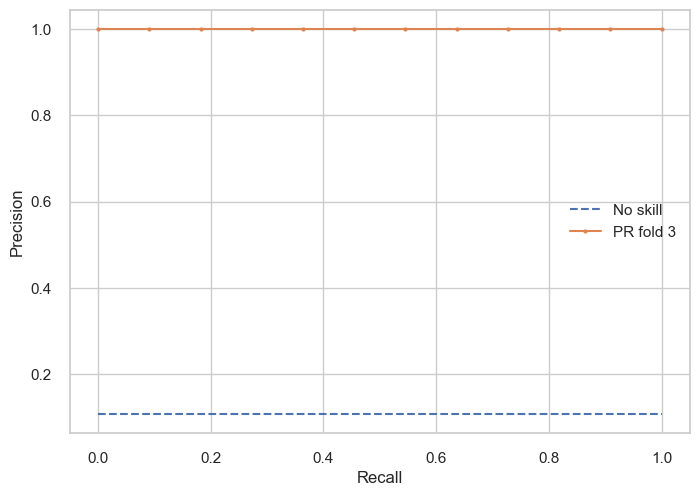

4it [00:03,  1.03it/s]

ROC/AUC: 0.994
Accuracy: 0.9706
F1 score: 0.8571
MCC score: 0.842
              precision    recall  f1-score   support

           0       0.98      0.99      0.98        91
           1       0.90      0.82      0.86        11

    accuracy                           0.97       102
   macro avg       0.94      0.90      0.92       102
weighted avg       0.97      0.97      0.97       102



<Figure size 800x550 with 0 Axes>

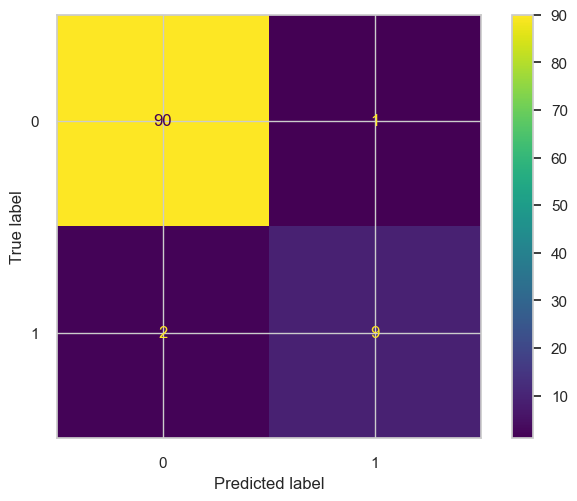

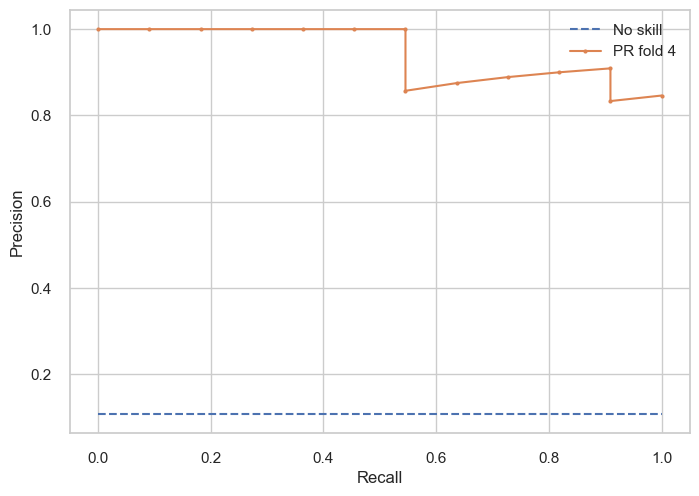

5it [00:05,  1.00s/it]

ROC/AUC: 0.991
Accuracy: 0.951
F1 score: 0.7368
MCC score: 0.7215
              precision    recall  f1-score   support

           0       0.96      0.99      0.97        91
           1       0.88      0.64      0.74        11

    accuracy                           0.95       102
   macro avg       0.92      0.81      0.85       102
weighted avg       0.95      0.95      0.95       102



<Figure size 800x550 with 0 Axes>

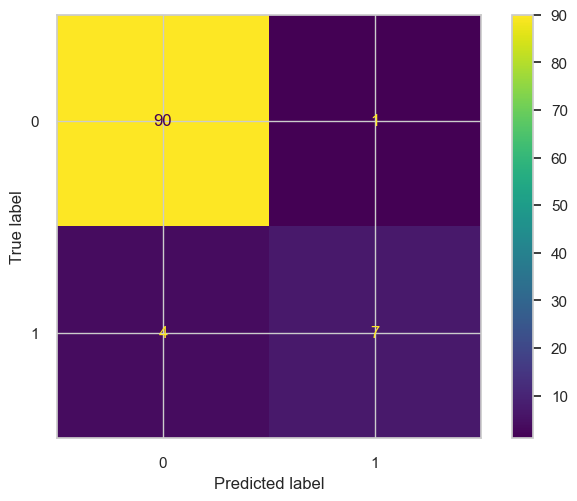

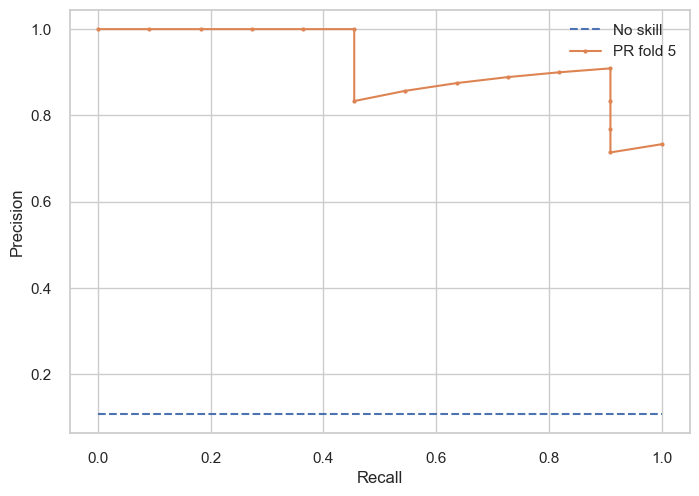

6it [00:05,  1.01it/s]

ROC/AUC: 0.989
Accuracy: 0.9706
F1 score: 0.8571
MCC score: 0.842
              precision    recall  f1-score   support

           0       0.98      0.99      0.98        91
           1       0.90      0.82      0.86        11

    accuracy                           0.97       102
   macro avg       0.94      0.90      0.92       102
weighted avg       0.97      0.97      0.97       102



<Figure size 800x550 with 0 Axes>

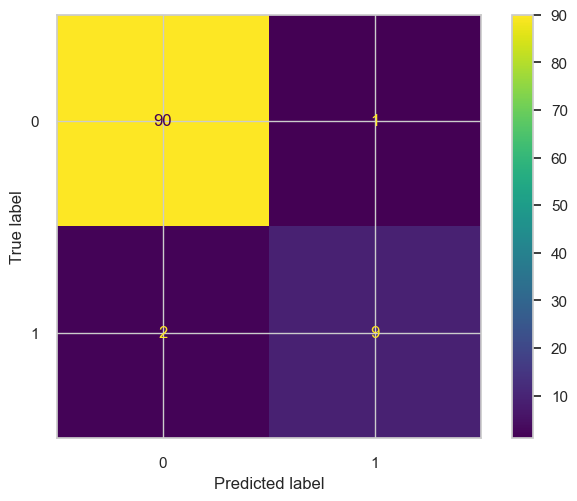

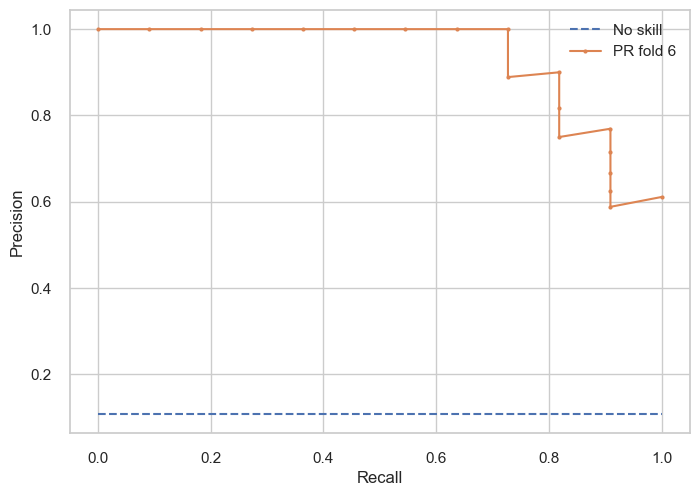

7it [00:06,  1.02it/s]

ROC/AUC: 0.989
Accuracy: 0.9706
F1 score: 0.8421
MCC score: 0.8391
              precision    recall  f1-score   support

           0       0.97      1.00      0.98        91
           1       1.00      0.73      0.84        11

    accuracy                           0.97       102
   macro avg       0.98      0.86      0.91       102
weighted avg       0.97      0.97      0.97       102



<Figure size 800x550 with 0 Axes>

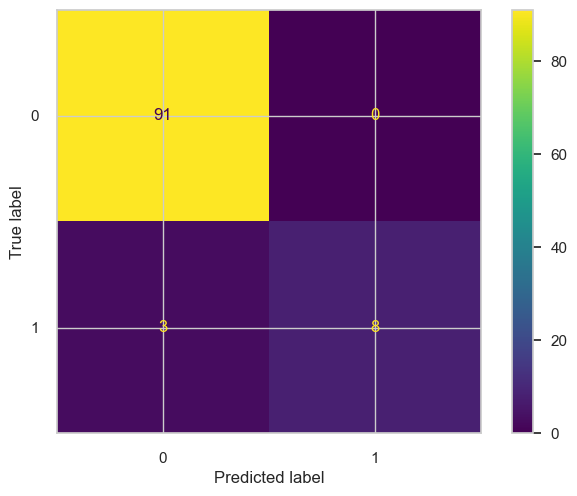

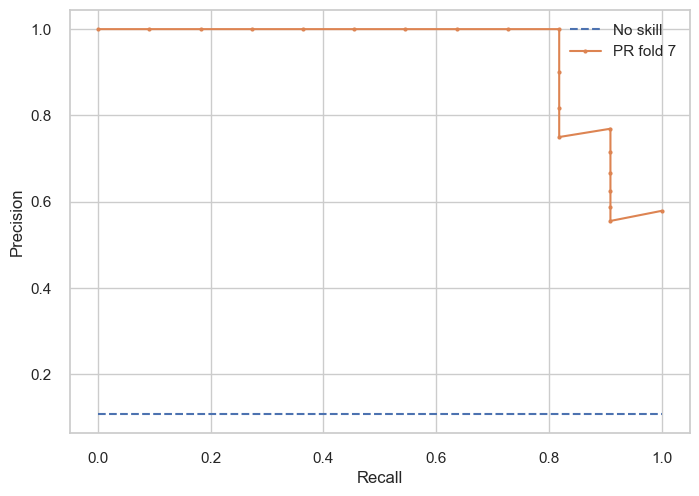

8it [00:07,  1.03it/s]

ROC/AUC: 0.9833
Accuracy: 0.9706
F1 score: 0.8696
MCC score: 0.8541
              precision    recall  f1-score   support

           0       0.98      0.99      0.98        90
           1       0.91      0.83      0.87        12

    accuracy                           0.97       102
   macro avg       0.94      0.91      0.93       102
weighted avg       0.97      0.97      0.97       102



<Figure size 800x550 with 0 Axes>

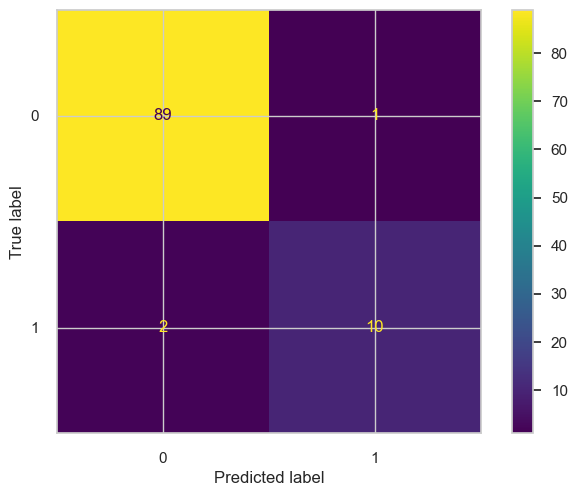

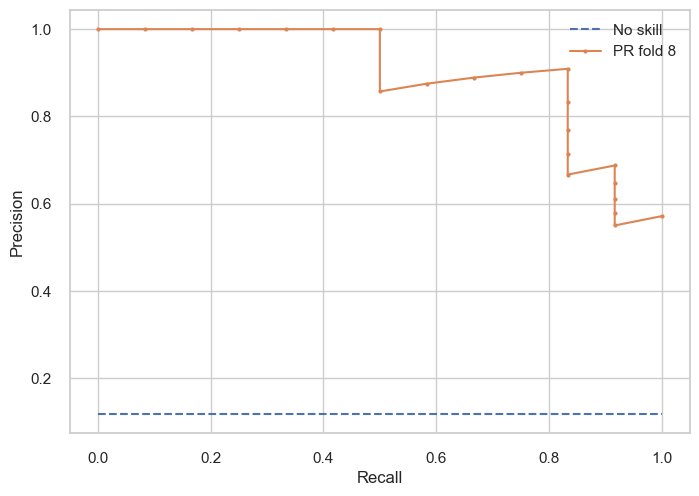

9it [00:08,  1.02it/s]

ROC/AUC: 0.9949
Accuracy: 0.9703
F1 score: 0.8571
MCC score: 0.8418
              precision    recall  f1-score   support

           0       0.98      0.99      0.98        90
           1       0.90      0.82      0.86        11

    accuracy                           0.97       101
   macro avg       0.94      0.90      0.92       101
weighted avg       0.97      0.97      0.97       101



<Figure size 800x550 with 0 Axes>

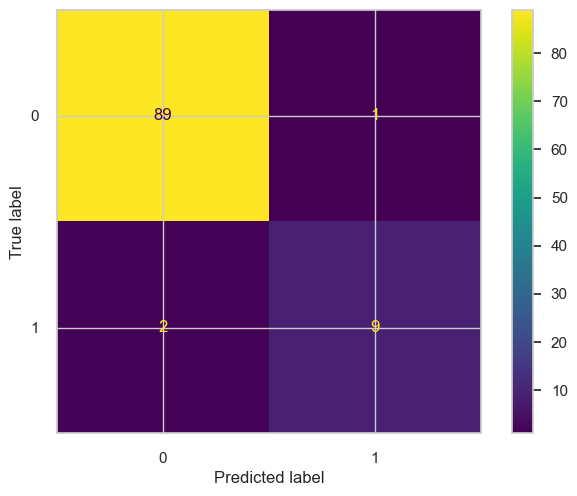

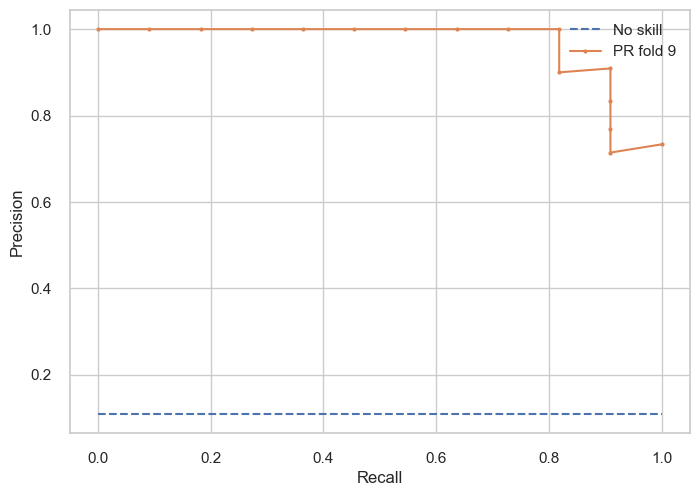

10it [00:09,  1.01it/s]


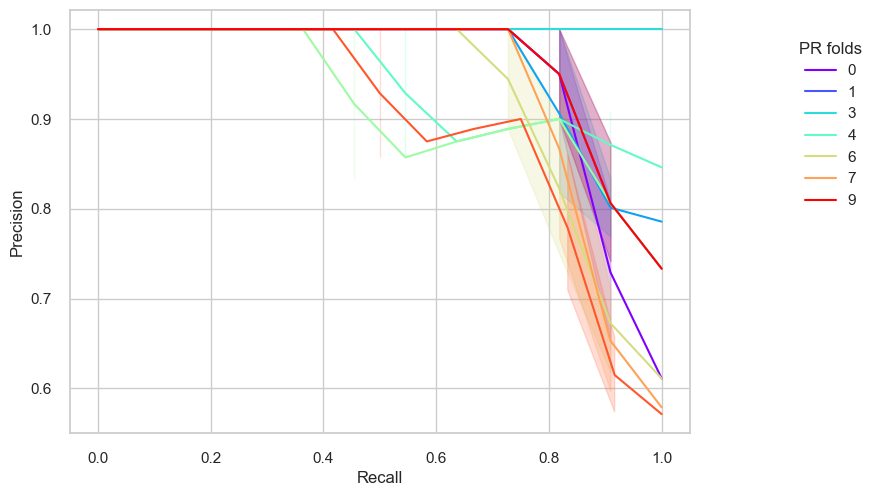

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprec

<Figure size 800x550 with 0 Axes>

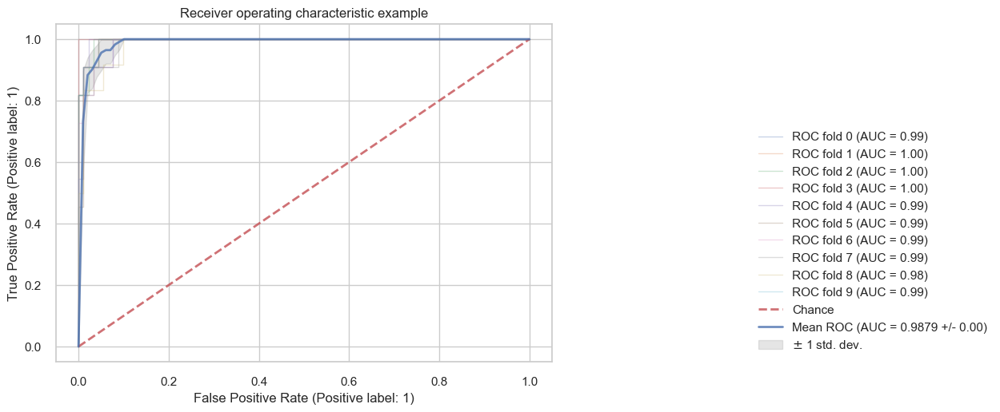

In [138]:
try:
    logged_model = f"runs:/{ada_run_id}/AdaBoostClassifier_model"

    ada_mod_from_pickle = mlflow.sklearn.load_model(logged_model)

    ada_res, ada_threshold, ada_pr_data, ada_roc_data_train = train_diag_mlflow(
        ada_mod_from_pickle, X_train_mod, y_train, n_splits, "AdaBoost_optimized"
    )
except Exception:
    filepath_ada = os.path.join(path_folder, "models/ada_mod_search_pickle.pkl")
    with open(filepath_ada, 'rb') as fp_ada:
        ada_mod_from_pickle = pickle.load(fp_ada)
    ada_mod_from_pickle.fit(X_train_mod, y_train)
    ada_res, ada_threshold, ada_pr_data, ada_roc_data_train = train_diag_mlflow(
        ada_mod_from_pickle, X_train_mod, y_train, n_splits, "AdaBoost_optimized"
    )

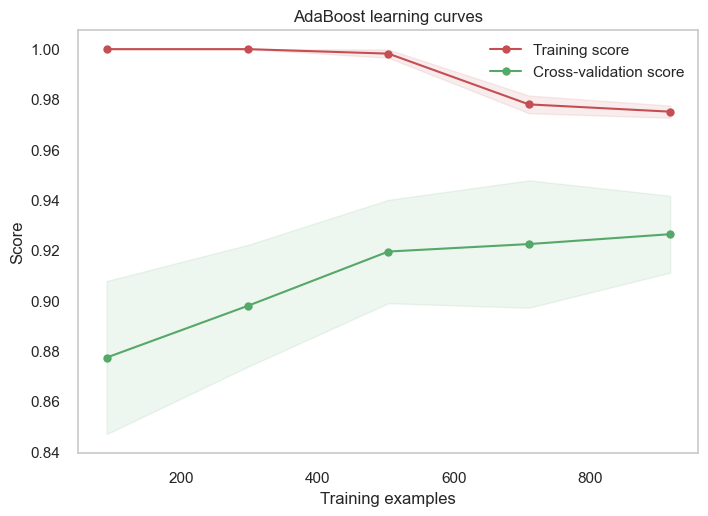

In [139]:
g = plot_learning_curve(ada_mod_from_pickle,
                        "AdaBoost learning curves",
                        X_train_mod,
                        y_train,
                        cv=cv)

#### Voting classifier

In [140]:
print(best_params_lgbm)
print(best_params_xgb)
print(best_params_ada)

{'max_depth': 4, 'num_leaves': 80, 'learning_rate': 0.07042882652945787, 'feature_fraction': 0.9596893264923619, 'bagging_fraction': 0.027021158905779226, 'max_bin': 80, 'min_data_in_leaf': 40, 'min_sum_hessian_in_leaf': 20}
{'max_depth': 15, 'subsample': 0.5124169920928218, 'learning_rate': 0.08681237969507288, 'min_child_weight': 1, 'alpha': 0.9994561588916723, 'lambda': 0.5366081914093249, 'gamma': 0.028156457940382018}
{'max_depth': 1, 'n_estimators': 149, 'learning_rate': 0.9051703787211094}


In [141]:
learner_1 = lgb.LGBMClassifier(
    max_depth=best_params_lgbm["max_depth"],
    num_leaves=best_params_lgbm["num_leaves"],
    learning_rate=best_params_lgbm["learning_rate"],
    feature_fraction=best_params_lgbm["feature_fraction"],
    bagging_fraction=best_params_lgbm["bagging_fraction"],
    max_bin=best_params_lgbm["max_bin"],
    min_data_in_leaf=best_params_lgbm["min_data_in_leaf"],
    min_sum_hessian_in_leaf=best_params_lgbm["min_sum_hessian_in_leaf"],
)
learner_2 = xgb.XGBClassifier(
    max_depth=best_params_xgb["max_depth"],
    subsample=best_params_xgb["subsample"],
    learning_rate=best_params_xgb["learning_rate"],
    min_child_weight=best_params_xgb["min_child_weight"],
    alpha=best_params_xgb["alpha"],
    gamma=best_params_xgb["gamma"],
)
learner_3 = AdaBoostClassifier(
    random_state=42, n_estimators=best_params_ada["n_estimators"], learning_rate=best_params_ada["learning_rate"]
)


# Instantiate the voting classifier
voting = VotingClassifier([("LGBM", learner_1), ("XGB", learner_2), ("Adaboost", learner_3)], voting="soft")

filepath_v = os.path.join(path_folder, "models/voting_pickle.pkl")
pickle.dump(voting, open(filepath_v, "wb"))


[LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
[LightGBM] [Warning] bagging_fraction is set=0.027021158905779226, subsample=1.0 will be ignored. Current value: bagging_fraction=0.027021158905779226
[LightGBM] [Warning] feature_fraction is set=0.9596893264923619, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9596893264923619
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=20, min_child_weight=0.001 will be ignored. Current value: min_sum_hessian_in_leaf=20


2024/07/03 12:41:21 INFO mlflow.tracking.fluent: Experiment with name 'Voting_classifier_20240703_124121' does not exist. Creating a new experiment.
0it [00:00, ?it/s]

ROC/AUC: 1.0
Accuracy: 0.9706
F1 score: 0.8421
MCC score: 0.8391
              precision    recall  f1-score   support

           0       0.97      1.00      0.98        91
           1       1.00      0.73      0.84        11

    accuracy                           0.97       102
   macro avg       0.98      0.86      0.91       102
weighted avg       0.97      0.97      0.97       102



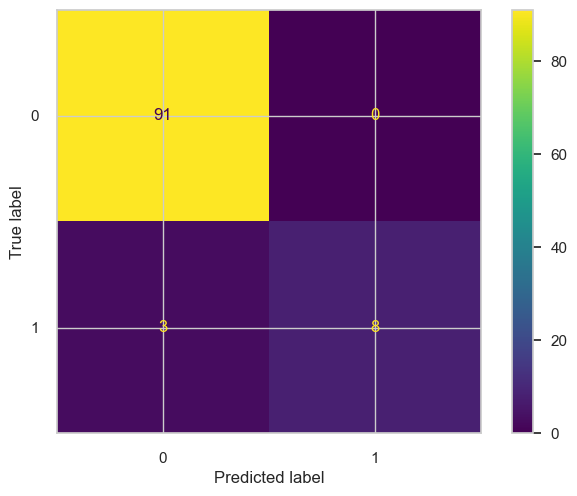

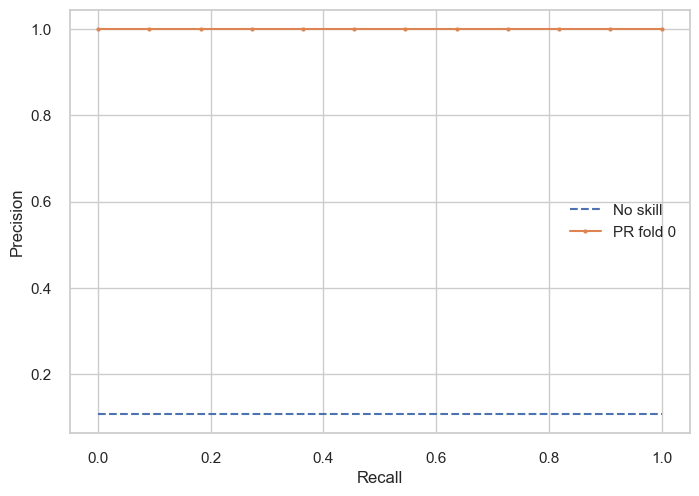

1it [00:01,  1.03s/it]

ROC/AUC: 1.0
Accuracy: 0.9608
F1 score: 0.7778
MCC score: 0.7807
              precision    recall  f1-score   support

           0       0.96      1.00      0.98        91
           1       1.00      0.64      0.78        11

    accuracy                           0.96       102
   macro avg       0.98      0.82      0.88       102
weighted avg       0.96      0.96      0.96       102



<Figure size 800x550 with 0 Axes>

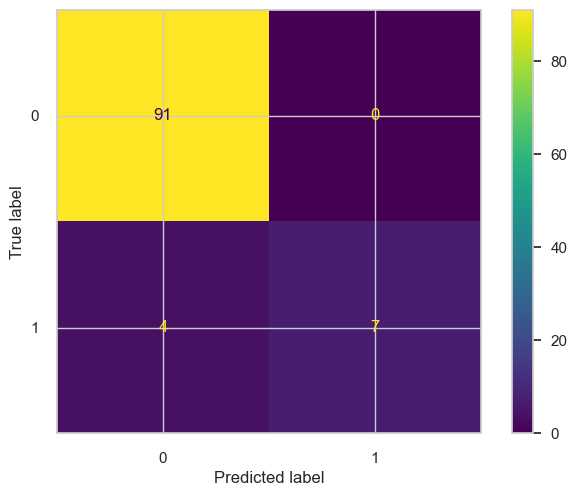

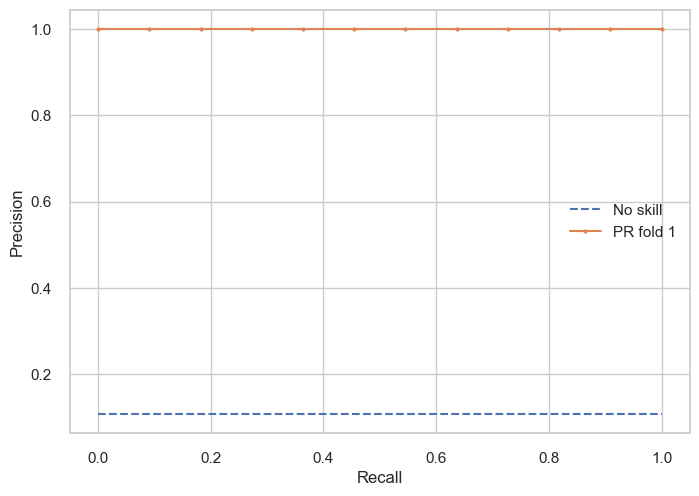

2it [00:02,  1.02s/it]

ROC/AUC: 1.0
Accuracy: 0.9804
F1 score: 0.9
MCC score: 0.8948
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        91
           1       1.00      0.82      0.90        11

    accuracy                           0.98       102
   macro avg       0.99      0.91      0.94       102
weighted avg       0.98      0.98      0.98       102



<Figure size 800x550 with 0 Axes>

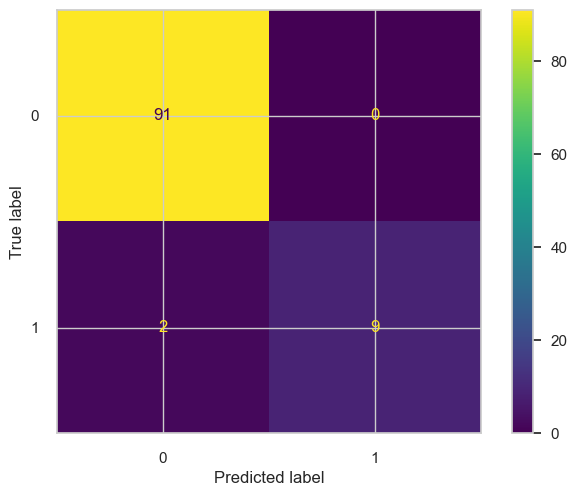

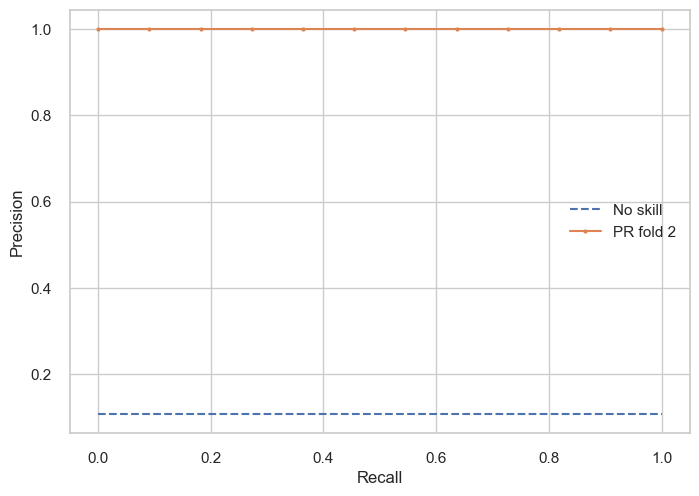

3it [00:03,  1.02s/it]

ROC/AUC: 1.0
Accuracy: 0.9706
F1 score: 0.8421
MCC score: 0.8391
              precision    recall  f1-score   support

           0       0.97      1.00      0.98        91
           1       1.00      0.73      0.84        11

    accuracy                           0.97       102
   macro avg       0.98      0.86      0.91       102
weighted avg       0.97      0.97      0.97       102



<Figure size 800x550 with 0 Axes>

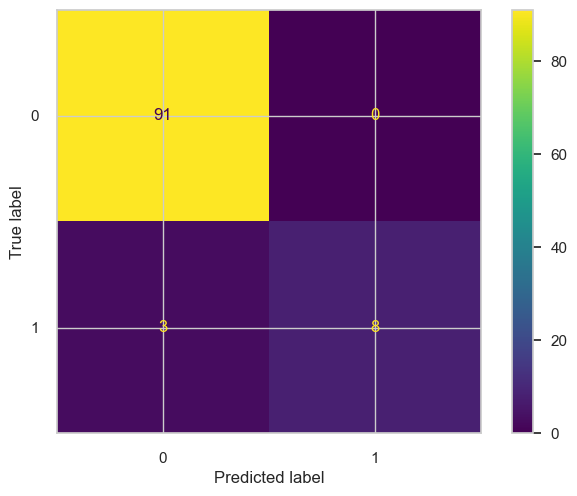

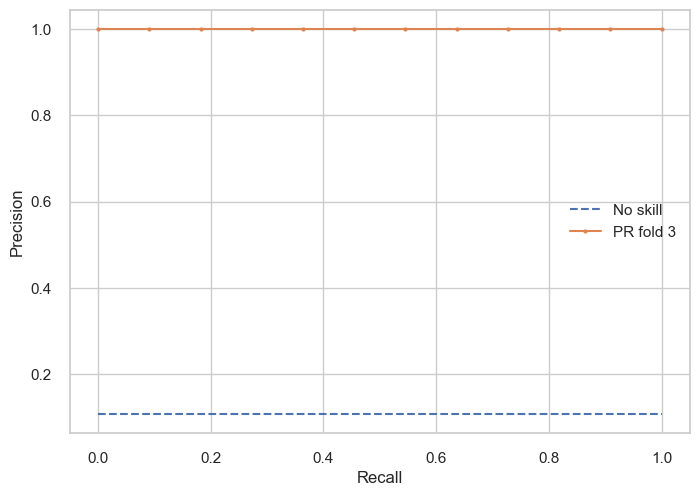

4it [00:04,  1.02s/it]

ROC/AUC: 0.997
Accuracy: 0.9608
F1 score: 0.7778
MCC score: 0.7807
              precision    recall  f1-score   support

           0       0.96      1.00      0.98        91
           1       1.00      0.64      0.78        11

    accuracy                           0.96       102
   macro avg       0.98      0.82      0.88       102
weighted avg       0.96      0.96      0.96       102



<Figure size 800x550 with 0 Axes>

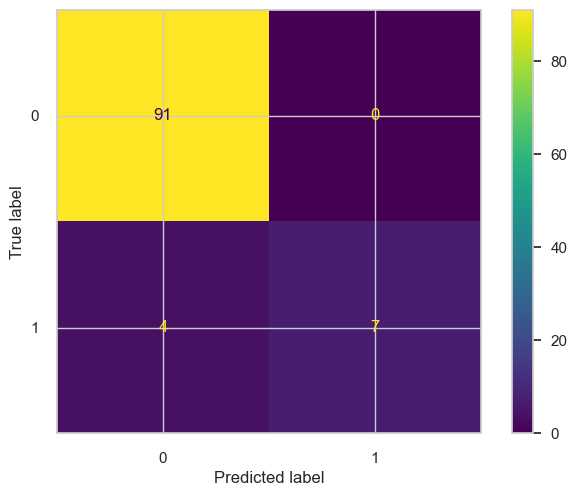

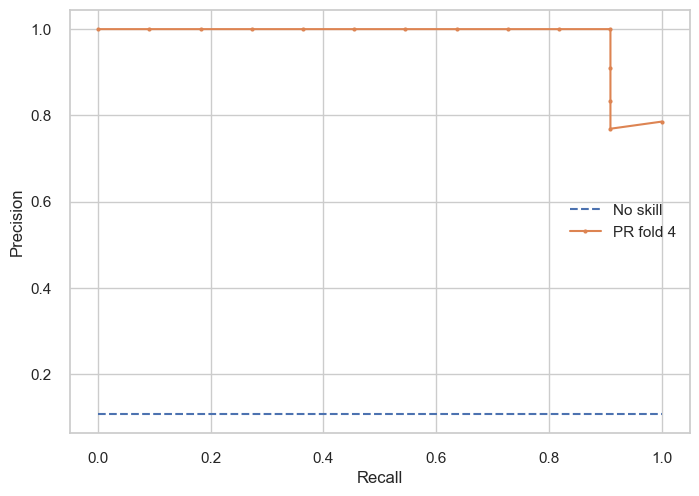

5it [00:05,  1.03s/it]

ROC/AUC: 1.0
Accuracy: 0.9412
F1 score: 0.625
MCC score: 0.653
              precision    recall  f1-score   support

           0       0.94      1.00      0.97        91
           1       1.00      0.45      0.62        11

    accuracy                           0.94       102
   macro avg       0.97      0.73      0.80       102
weighted avg       0.94      0.94      0.93       102



<Figure size 800x550 with 0 Axes>

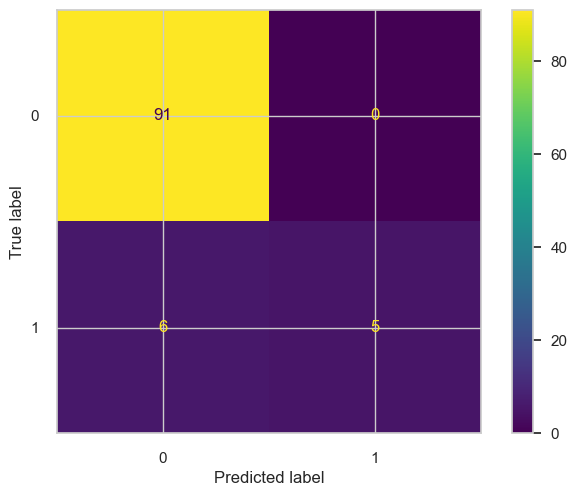

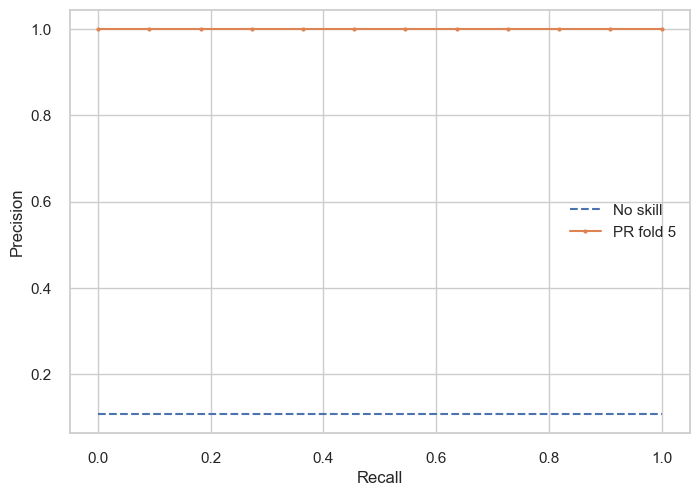

6it [00:06,  1.04s/it]

ROC/AUC: 0.997
Accuracy: 0.951
F1 score: 0.7059
MCC score: 0.7191
              precision    recall  f1-score   support

           0       0.95      1.00      0.97        91
           1       1.00      0.55      0.71        11

    accuracy                           0.95       102
   macro avg       0.97      0.77      0.84       102
weighted avg       0.95      0.95      0.94       102



<Figure size 800x550 with 0 Axes>

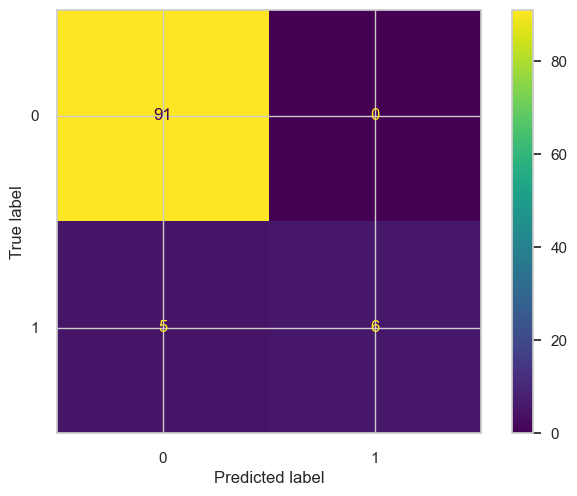

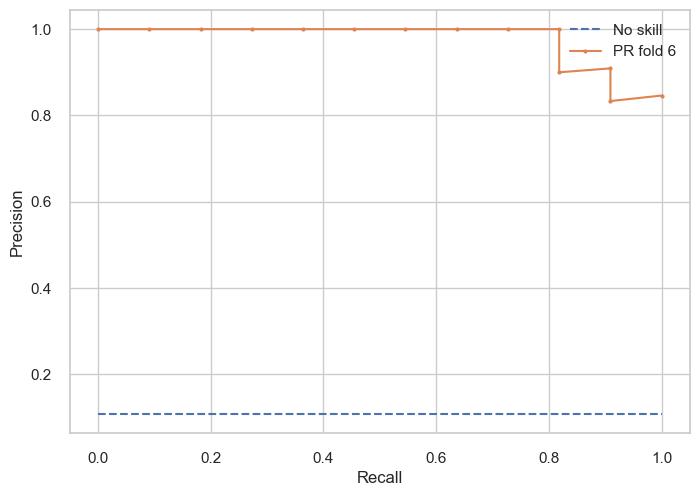

7it [00:07,  1.03s/it]

ROC/AUC: 0.979
Accuracy: 0.9804
F1 score: 0.9
MCC score: 0.8948
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        91
           1       1.00      0.82      0.90        11

    accuracy                           0.98       102
   macro avg       0.99      0.91      0.94       102
weighted avg       0.98      0.98      0.98       102



<Figure size 800x550 with 0 Axes>

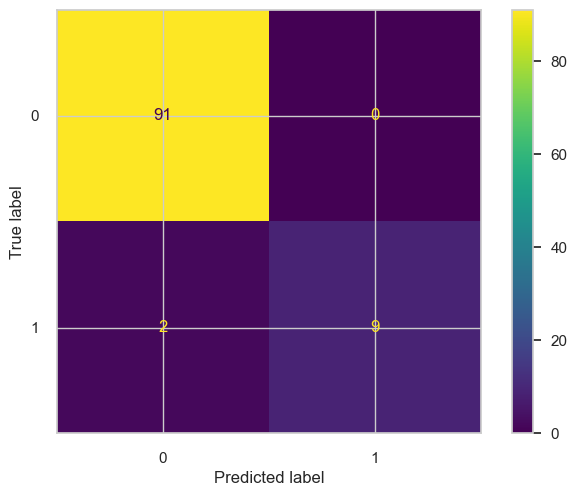

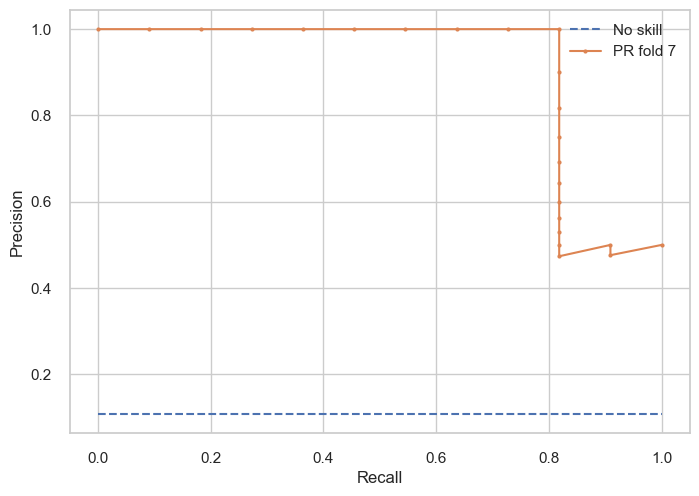

8it [00:08,  1.03s/it]

ROC/AUC: 0.9917
Accuracy: 0.9706
F1 score: 0.8571
MCC score: 0.8519
              precision    recall  f1-score   support

           0       0.97      1.00      0.98        90
           1       1.00      0.75      0.86        12

    accuracy                           0.97       102
   macro avg       0.98      0.88      0.92       102
weighted avg       0.97      0.97      0.97       102



<Figure size 800x550 with 0 Axes>

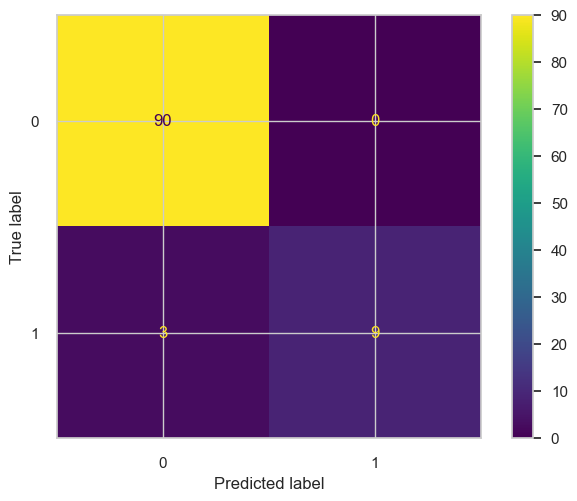

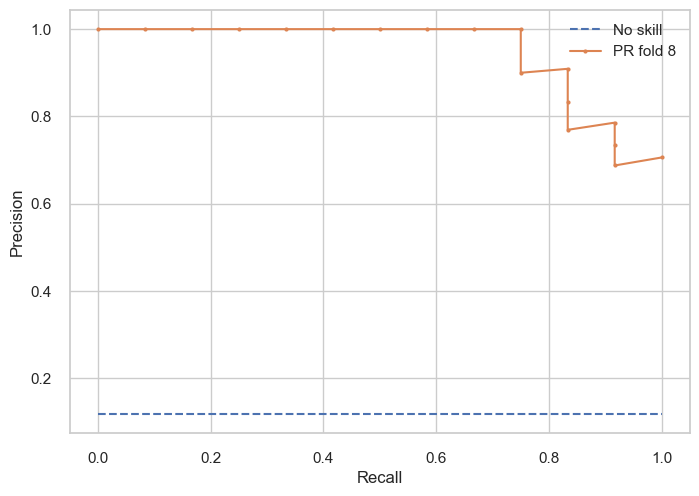

9it [00:09,  1.04s/it]

ROC/AUC: 1.0
Accuracy: 0.9703
F1 score: 0.8421
MCC score: 0.8389
              precision    recall  f1-score   support

           0       0.97      1.00      0.98        90
           1       1.00      0.73      0.84        11

    accuracy                           0.97       101
   macro avg       0.98      0.86      0.91       101
weighted avg       0.97      0.97      0.97       101



<Figure size 800x550 with 0 Axes>

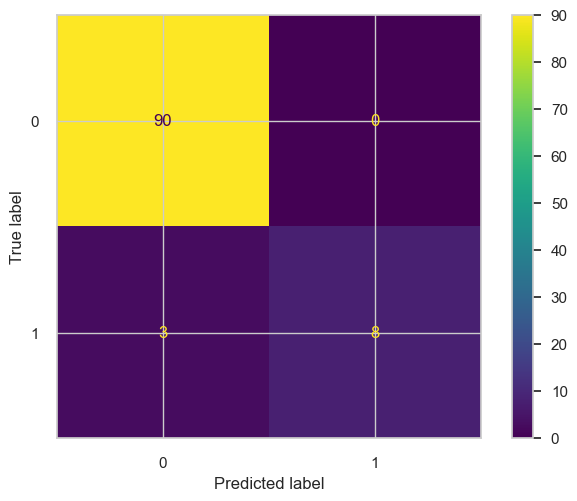

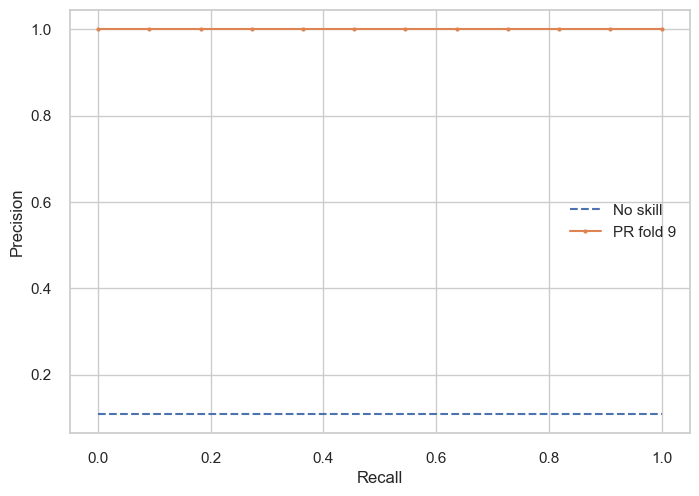

10it [00:10,  1.03s/it]


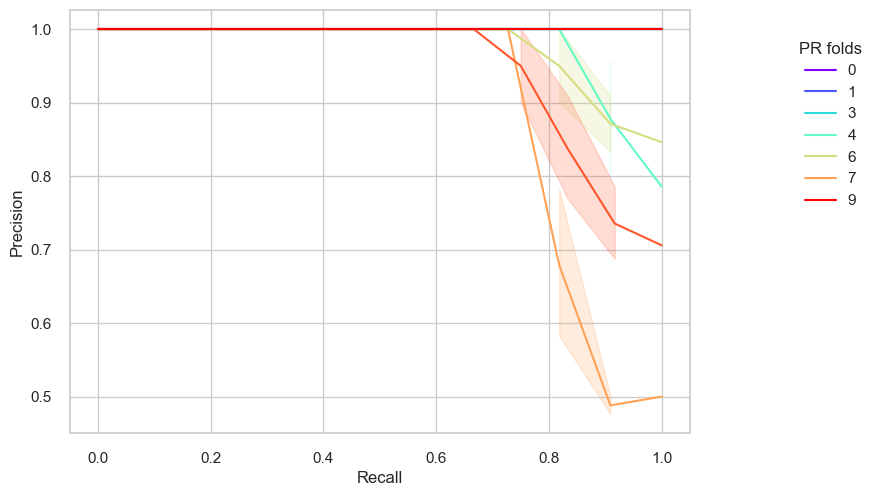

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprec

<Figure size 800x550 with 0 Axes>

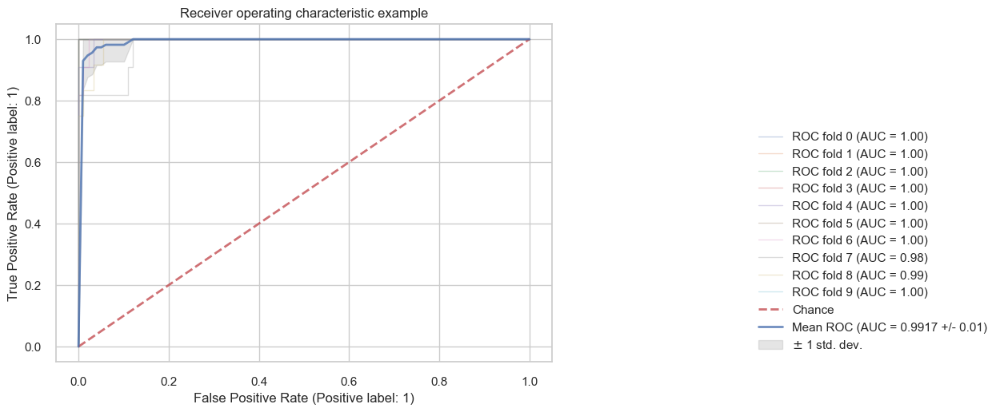

In [142]:
filepath_v = os.path.join(path_folder, "models/voting_pickle.pkl")
with open(filepath_v, 'rb') as fp_v:
    voting_from_pickle = pickle.load(fp_v)

voting_from_pickle.fit(X_train_mod, y_train)
voting_res, voting_threshold, voting_pr_data, voting_roc_data_train = train_diag_mlflow(
    voting_from_pickle, X_train_mod, y_train, n_splits, "Voting_classifier"
)

#### Stacking

In [143]:
classifier1 = DecisionTreeClassifier()

classifier2 = GaussianNB()

classifier3 = LogisticRegression()

classifier4 = RandomForestClassifier(
    n_estimators=500,
    criterion="gini",
    max_depth=10,
    max_features="auto",
    min_samples_leaf=0.005,
    min_samples_split=0.005,
    n_jobs=-1,
    random_state=1000,
)

sclf = StackingClassifier(
    classifiers=[classifier1, classifier2, classifier4], use_probas=True, meta_classifier=LogisticRegression()
)

filepath_sclf = os.path.join(path_folder, "models/sclf_pickle.pkl")
pickle.dump(sclf, open(filepath_sclf, "wb"))


2024/07/03 12:41:36 INFO mlflow.tracking.fluent: Experiment with name 'Stacking_classifier_20240703_124136' does not exist. Creating a new experiment.
0it [00:00, ?it/s]

ROC/AUC: 1.0
Accuracy: 1.0
F1 score: 1.0
MCC score: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        91
           1       1.00      1.00      1.00        11

    accuracy                           1.00       102
   macro avg       1.00      1.00      1.00       102
weighted avg       1.00      1.00      1.00       102



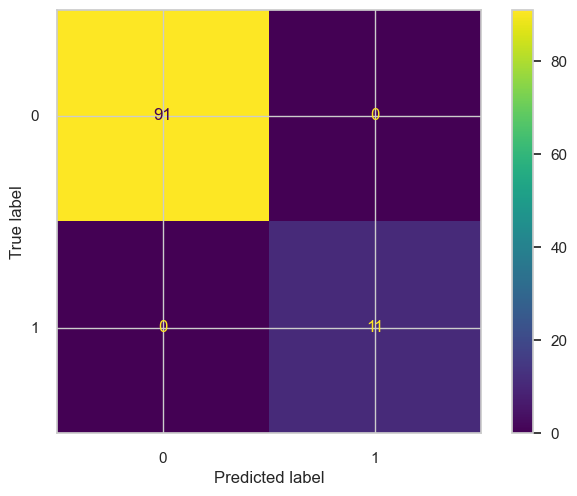

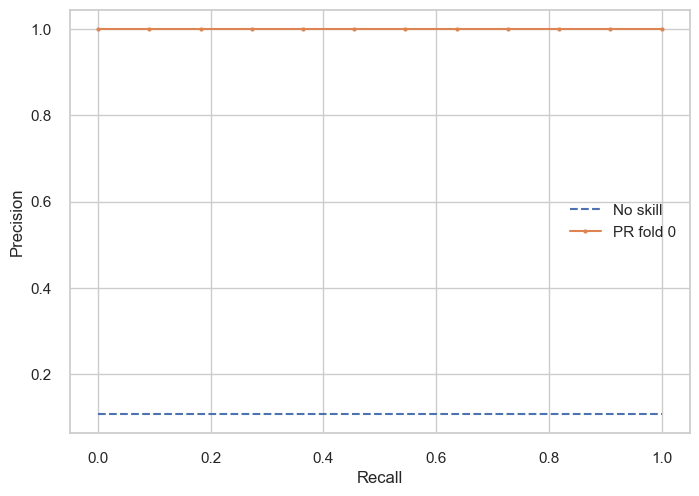

1it [00:01,  1.05s/it]

ROC/AUC: 1.0
Accuracy: 1.0
F1 score: 1.0
MCC score: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        91
           1       1.00      1.00      1.00        11

    accuracy                           1.00       102
   macro avg       1.00      1.00      1.00       102
weighted avg       1.00      1.00      1.00       102



<Figure size 800x550 with 0 Axes>

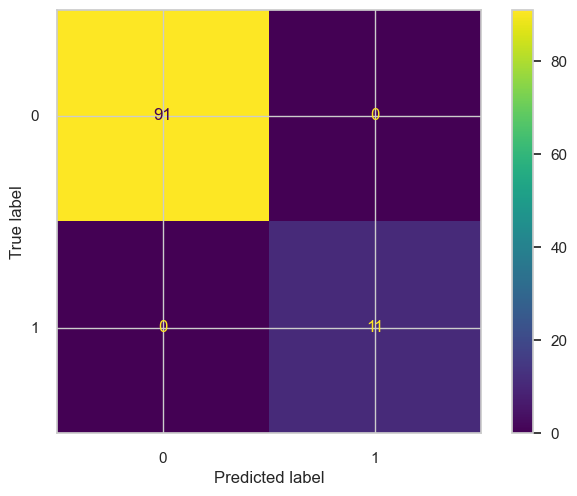

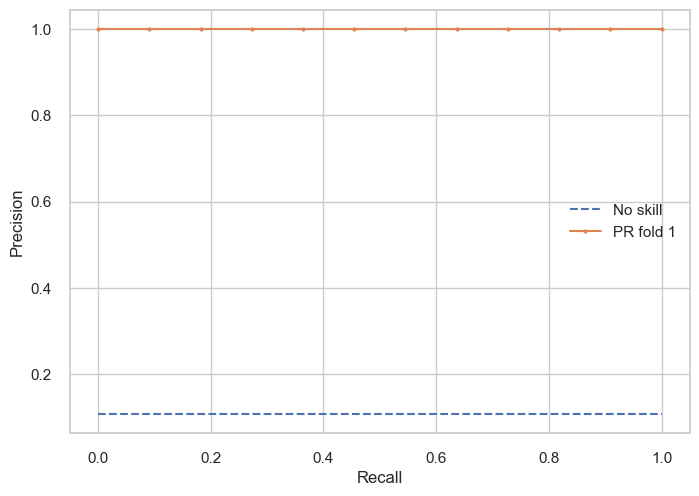

2it [00:02,  1.05s/it]

ROC/AUC: 1.0
Accuracy: 1.0
F1 score: 1.0
MCC score: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        91
           1       1.00      1.00      1.00        11

    accuracy                           1.00       102
   macro avg       1.00      1.00      1.00       102
weighted avg       1.00      1.00      1.00       102



<Figure size 800x550 with 0 Axes>

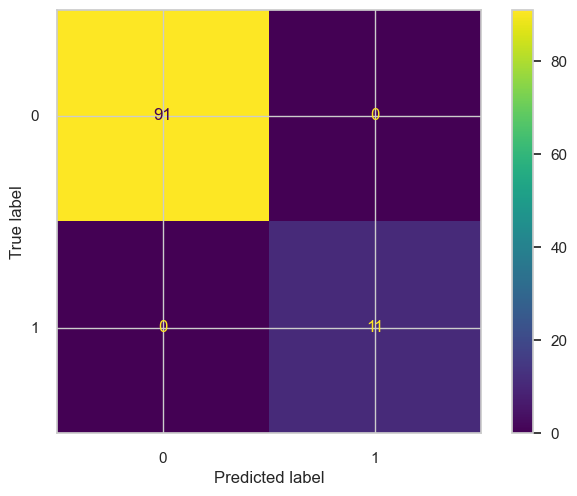

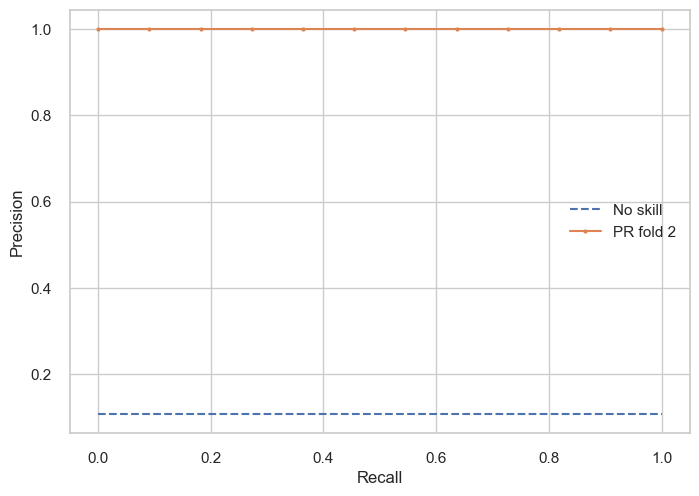

3it [00:03,  1.05s/it]

ROC/AUC: 1.0
Accuracy: 1.0
F1 score: 1.0
MCC score: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        91
           1       1.00      1.00      1.00        11

    accuracy                           1.00       102
   macro avg       1.00      1.00      1.00       102
weighted avg       1.00      1.00      1.00       102



<Figure size 800x550 with 0 Axes>

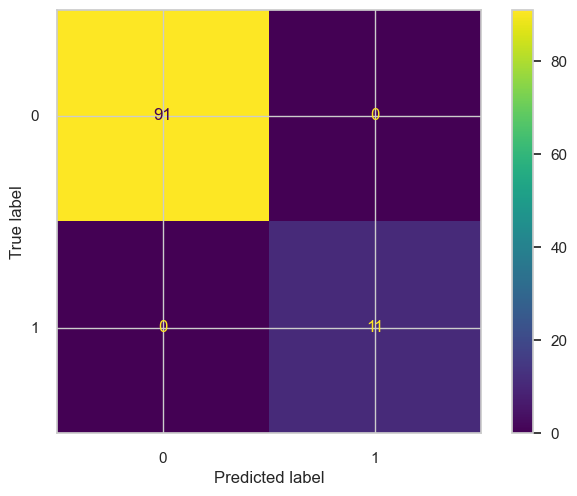

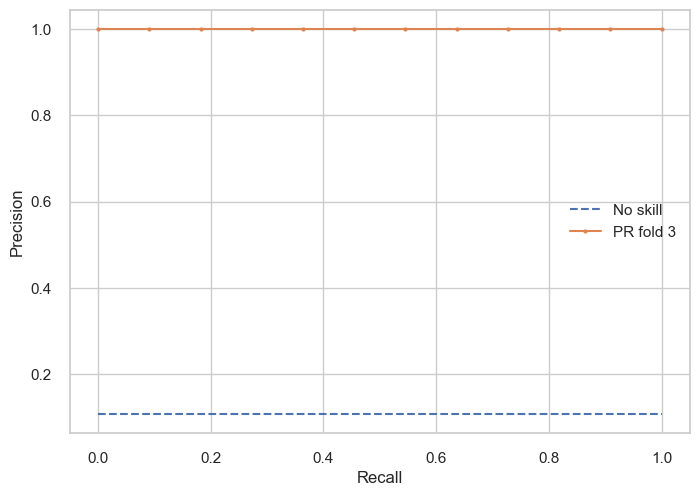

4it [00:04,  1.06s/it]

ROC/AUC: 1.0
Accuracy: 1.0
F1 score: 1.0
MCC score: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        91
           1       1.00      1.00      1.00        11

    accuracy                           1.00       102
   macro avg       1.00      1.00      1.00       102
weighted avg       1.00      1.00      1.00       102



<Figure size 800x550 with 0 Axes>

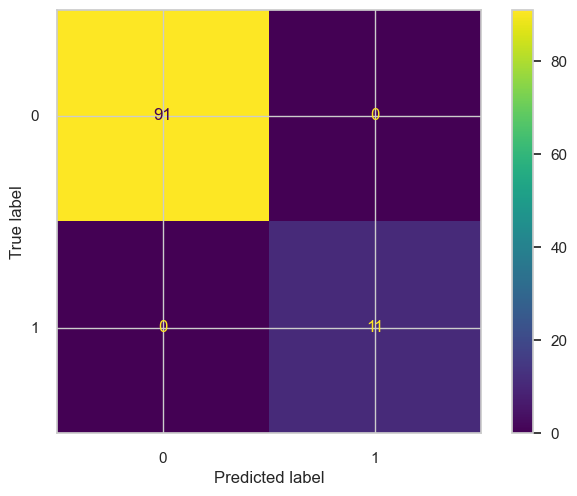

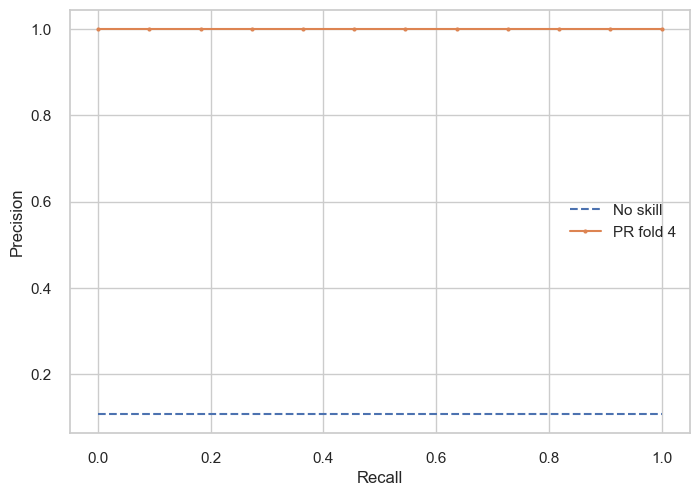

5it [00:05,  1.20s/it]

ROC/AUC: 1.0
Accuracy: 1.0
F1 score: 1.0
MCC score: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        91
           1       1.00      1.00      1.00        11

    accuracy                           1.00       102
   macro avg       1.00      1.00      1.00       102
weighted avg       1.00      1.00      1.00       102



<Figure size 800x550 with 0 Axes>

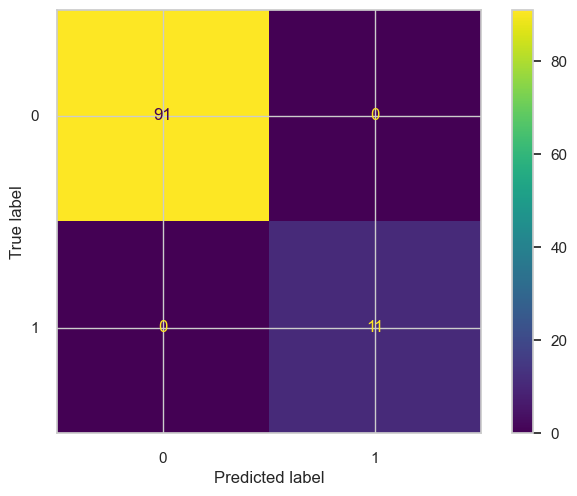

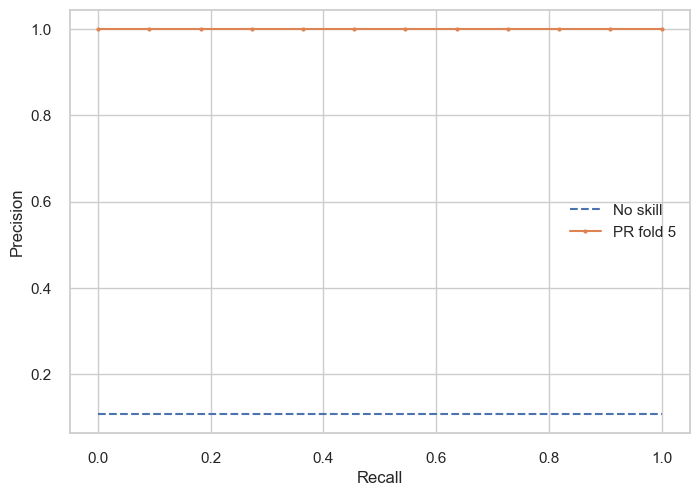

6it [00:06,  1.16s/it]

ROC/AUC: 1.0
Accuracy: 1.0
F1 score: 1.0
MCC score: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        91
           1       1.00      1.00      1.00        11

    accuracy                           1.00       102
   macro avg       1.00      1.00      1.00       102
weighted avg       1.00      1.00      1.00       102



<Figure size 800x550 with 0 Axes>

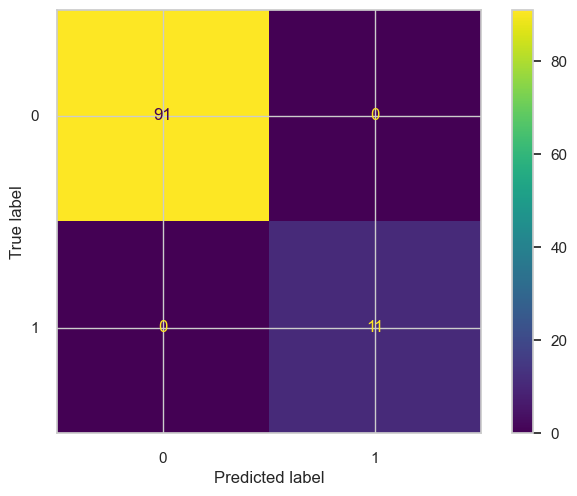

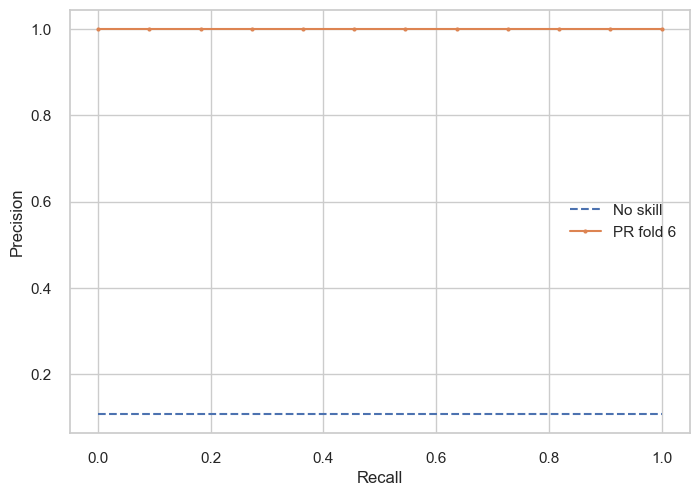

7it [00:07,  1.14s/it]

ROC/AUC: 1.0
Accuracy: 1.0
F1 score: 1.0
MCC score: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        91
           1       1.00      1.00      1.00        11

    accuracy                           1.00       102
   macro avg       1.00      1.00      1.00       102
weighted avg       1.00      1.00      1.00       102



<Figure size 800x550 with 0 Axes>

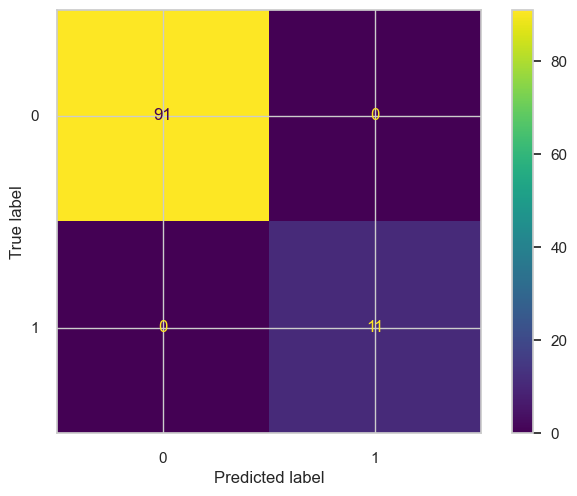

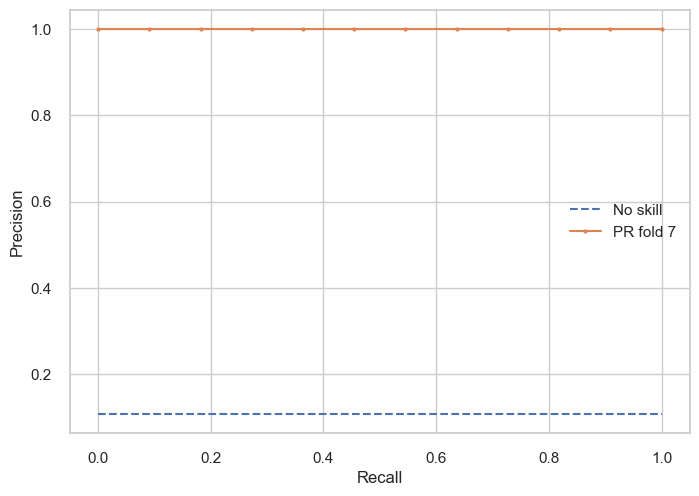

8it [00:08,  1.13s/it]

ROC/AUC: 1.0
Accuracy: 1.0
F1 score: 1.0
MCC score: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        90
           1       1.00      1.00      1.00        12

    accuracy                           1.00       102
   macro avg       1.00      1.00      1.00       102
weighted avg       1.00      1.00      1.00       102



<Figure size 800x550 with 0 Axes>

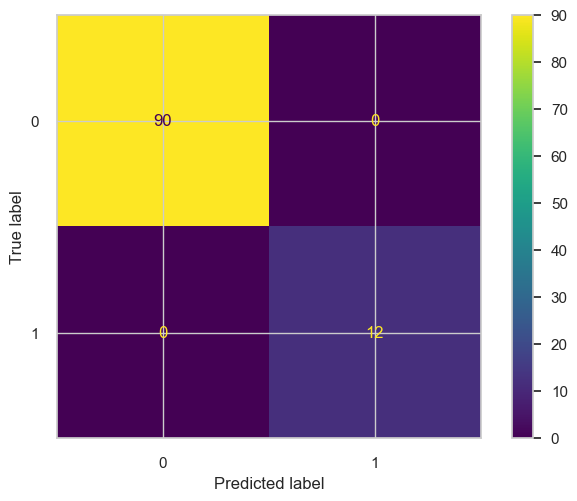

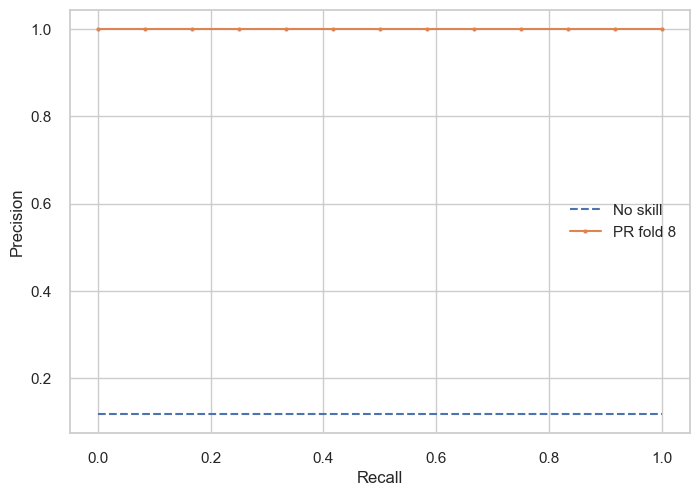

9it [00:10,  1.11s/it]

ROC/AUC: 1.0
Accuracy: 1.0
F1 score: 1.0
MCC score: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        90
           1       1.00      1.00      1.00        11

    accuracy                           1.00       101
   macro avg       1.00      1.00      1.00       101
weighted avg       1.00      1.00      1.00       101



<Figure size 800x550 with 0 Axes>

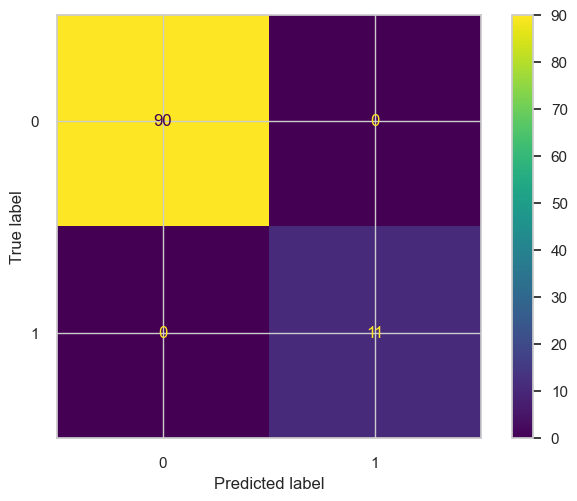

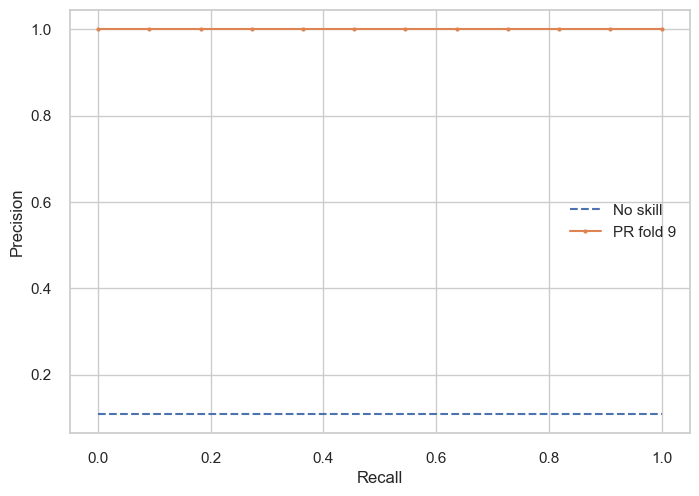

10it [00:11,  1.11s/it]


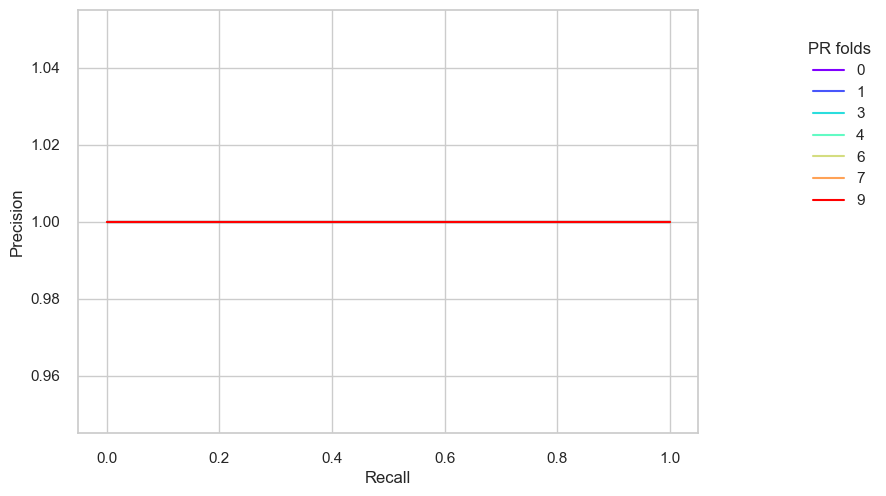

<Figure size 800x550 with 0 Axes>

In [144]:
filepath_sclf = os.path.join(path_folder, "models/sclf_pickle.pkl")
with open(filepath_sclf, 'rb') as fp_sclf:
    sclf_from_pickle = pickle.load(fp_sclf)

sclf_from_pickle.fit(X_train_mod, y_train)
ensemble_res, ensemble_threshold, ensemble_pr_data, ensemble_roc_data_train = train_diag_mlflow(
    sclf_from_pickle, X_train_mod, y_train, n_splits, "Stacking_classifier"
)


#### Final model performance

[('AdaBoost_optimized', AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=1),
                   learning_rate=0.9051703787211094, n_estimators=149,
                   random_state=0)), ('CB_opt_optimized', <catboost.core.CatBoostClassifier object at 0x7fd9a47e3f40>), ('LGBM_opt_optimized', LGBMClassifier(bagging_fraction=0.027021158905779226,
               feature_fraction=0.9596893264923619,
               learning_rate=0.07042882652945787, max_bin=80, max_depth=4,
               min_data_in_leaf=40, min_sum_hessian_in_leaf=20, num_leaves=80)), ('XGB_opt_optimized', XGBClassifier(alpha=0.9994561588916723, base_score=None, booster=None,
              callbacks=None, colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.028156457940382018, gpu_id=None, grow_policy=None,
              importance_type=None, interac

  0%|          | 0/6 [00:00<?, ?it/s]

AdaBoost_optimized


ROC/AUC: 0.8848
Accuracy: 0.9247
F1 score: 0.6292
              precision    recall  f1-score   support

           0       0.95      0.96      0.96       391
           1       0.67      0.60      0.63        47

    accuracy                           0.92       438
   macro avg       0.81      0.78      0.79       438
weighted avg       0.92      0.92      0.92       438



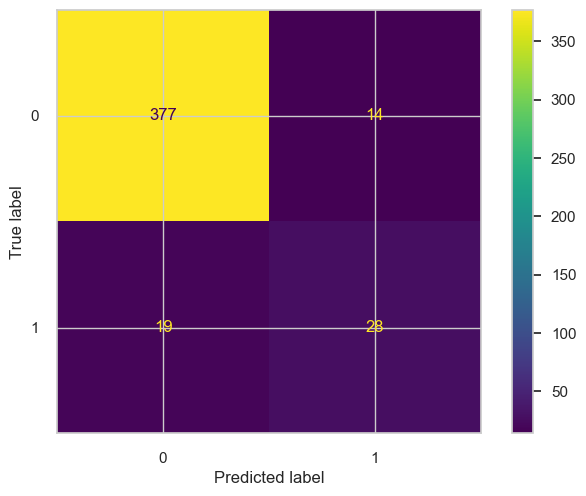

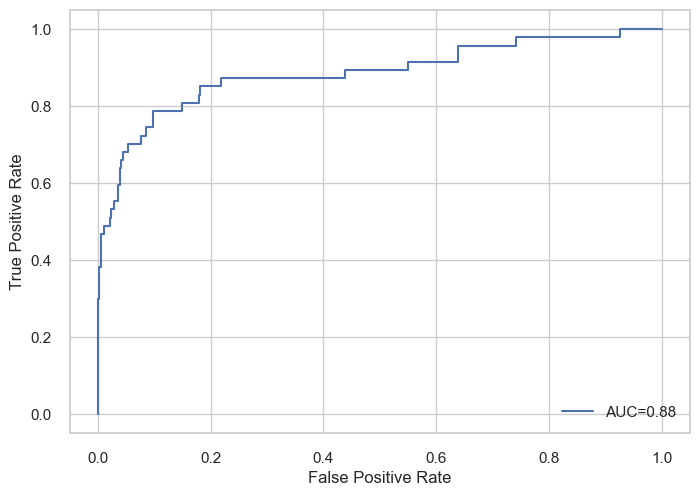

Model: f1 = 0.629 roc_auc = 0.885


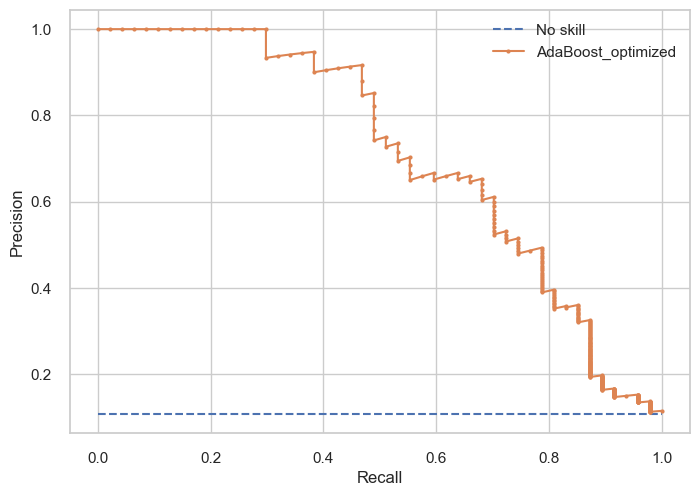

 17%|█▋        | 1/6 [00:01<00:07,  1.45s/it]

CB_opt_optimized


ROC/AUC: 0.9145
Accuracy: 0.9338
F1 score: 0.6234
              precision    recall  f1-score   support

           0       0.94      0.98      0.96       391
           1       0.80      0.51      0.62        47

    accuracy                           0.93       438
   macro avg       0.87      0.75      0.79       438
weighted avg       0.93      0.93      0.93       438



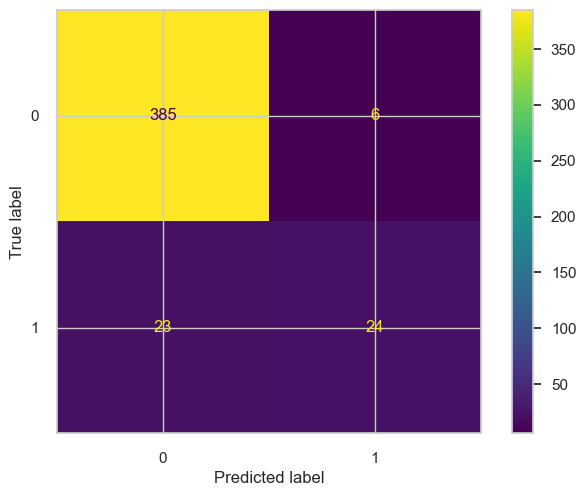

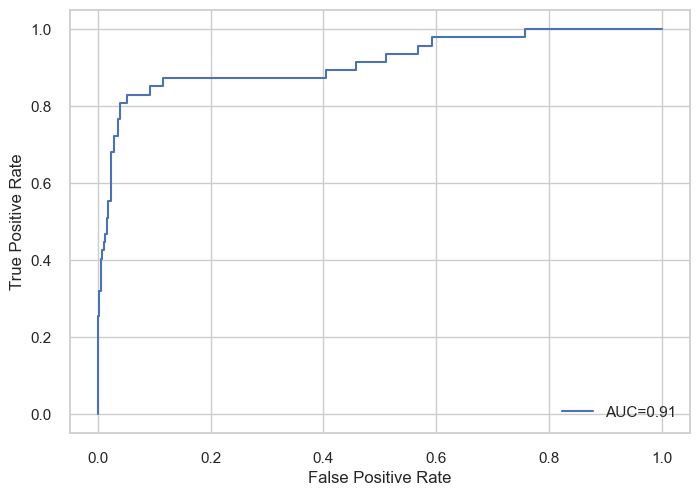

Model: f1 = 0.623 roc_auc = 0.914


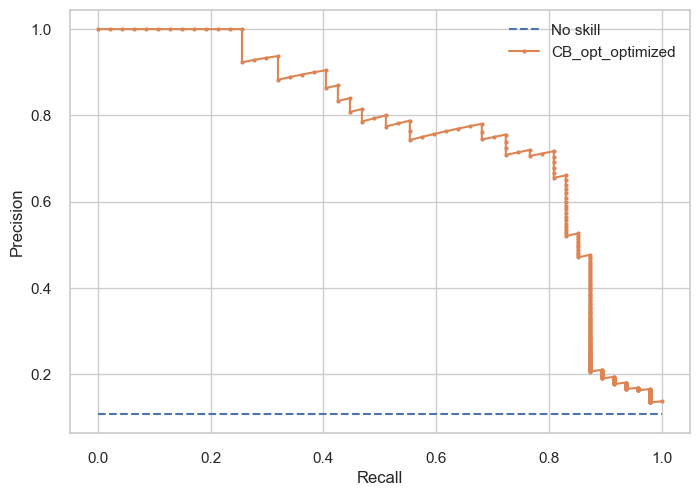

 33%|███▎      | 2/6 [00:02<00:04,  1.23s/it]

LGBM_opt_optimized


ROC/AUC: 0.8865
Accuracy: 0.9201
F1 score: 0.4615
              precision    recall  f1-score   support

           0       0.92      0.99      0.96       391
           1       0.83      0.32      0.46        47

    accuracy                           0.92       438
   macro avg       0.88      0.66      0.71       438
weighted avg       0.91      0.92      0.90       438



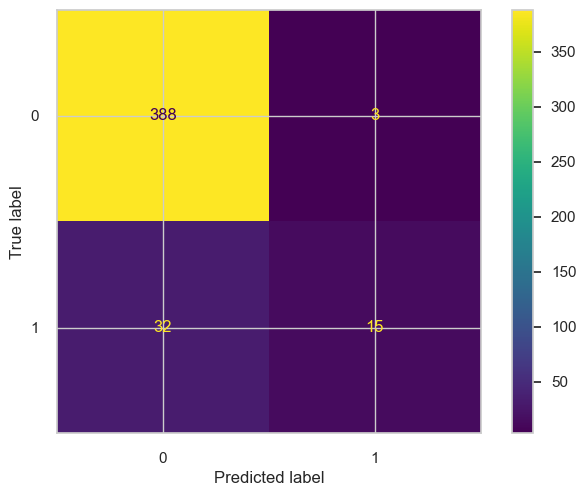

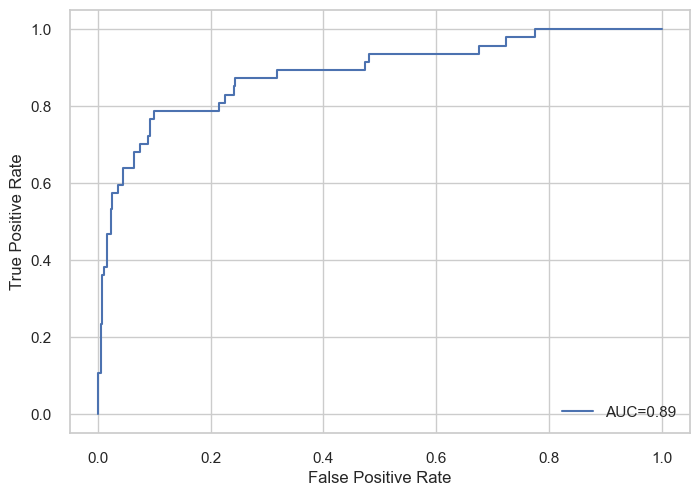

Model: f1 = 0.462 roc_auc = 0.886


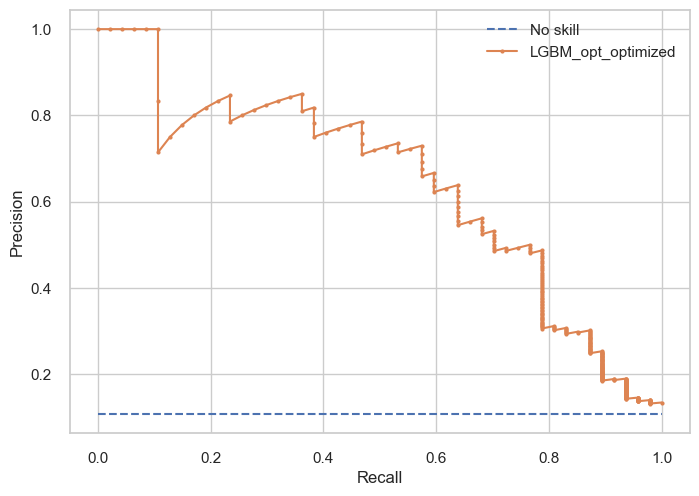

 50%|█████     | 3/6 [00:03<00:03,  1.19s/it]

XGB_opt_optimized


ROC/AUC: 0.8914
Accuracy: 0.9338
F1 score: 0.5797
              precision    recall  f1-score   support

           0       0.94      0.99      0.96       391
           1       0.91      0.43      0.58        47

    accuracy                           0.93       438
   macro avg       0.92      0.71      0.77       438
weighted avg       0.93      0.93      0.92       438



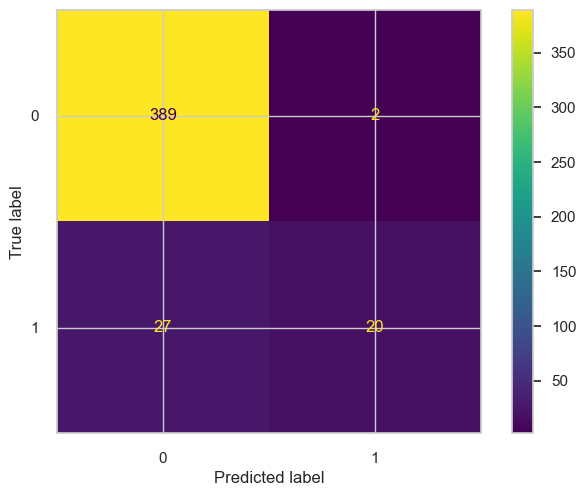

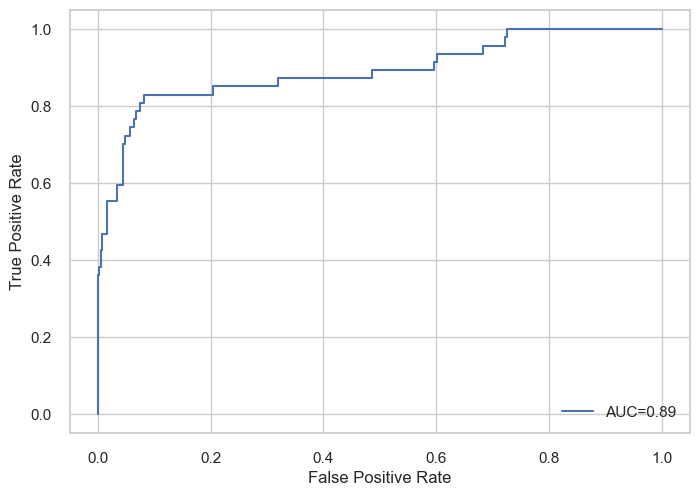

Model: f1 = 0.580 roc_auc = 0.891


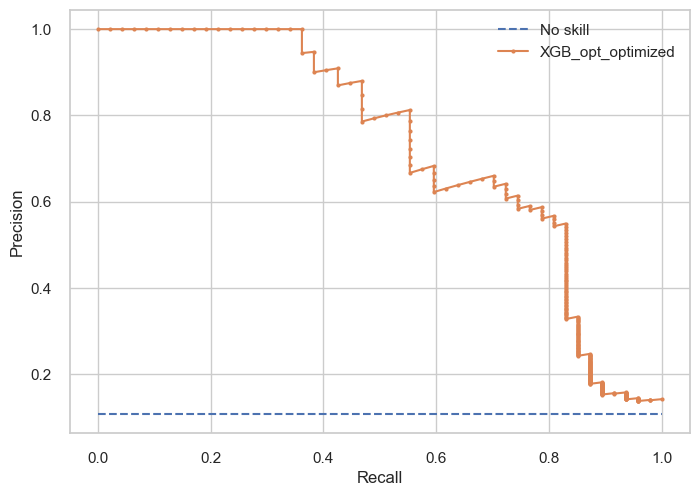

 67%|██████▋   | 4/6 [00:04<00:02,  1.20s/it]

Voting_classifier


ROC/AUC: 0.8958
Accuracy: 0.9247
F1 score: 0.4923
              precision    recall  f1-score   support

           0       0.93      0.99      0.96       391
           1       0.89      0.34      0.49        47

    accuracy                           0.92       438
   macro avg       0.91      0.67      0.73       438
weighted avg       0.92      0.92      0.91       438



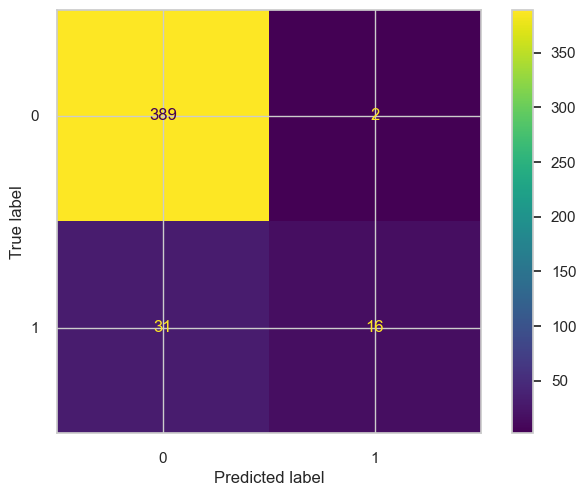

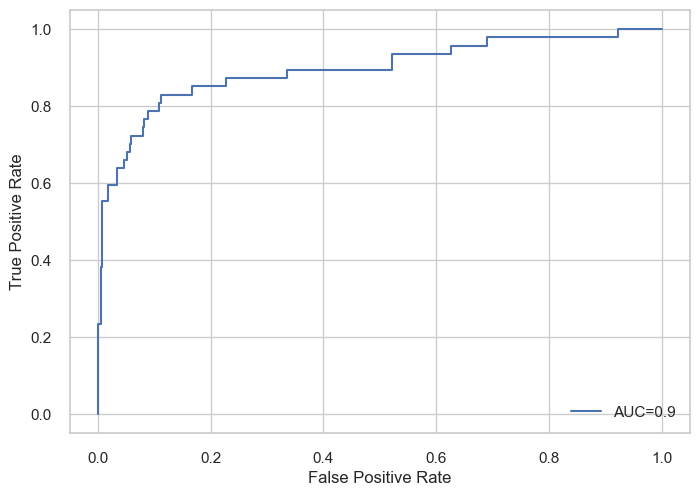

Model: f1 = 0.492 roc_auc = 0.896


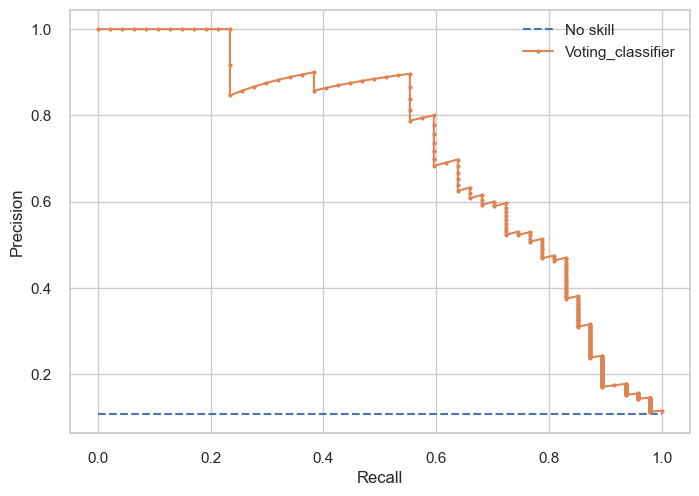

 83%|████████▎ | 5/6 [00:06<00:01,  1.23s/it]

Stacking_classifier


ROC/AUC: 0.8479
Accuracy: 0.8584
F1 score: 0.3673
              precision    recall  f1-score   support

           0       0.93      0.92      0.92       391
           1       0.35      0.38      0.37        47

    accuracy                           0.86       438
   macro avg       0.64      0.65      0.64       438
weighted avg       0.86      0.86      0.86       438



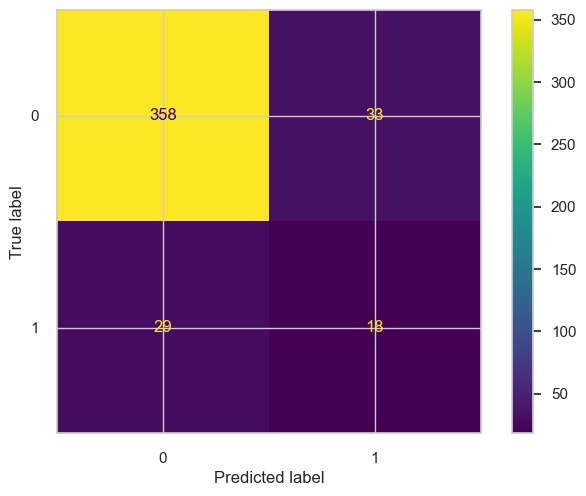

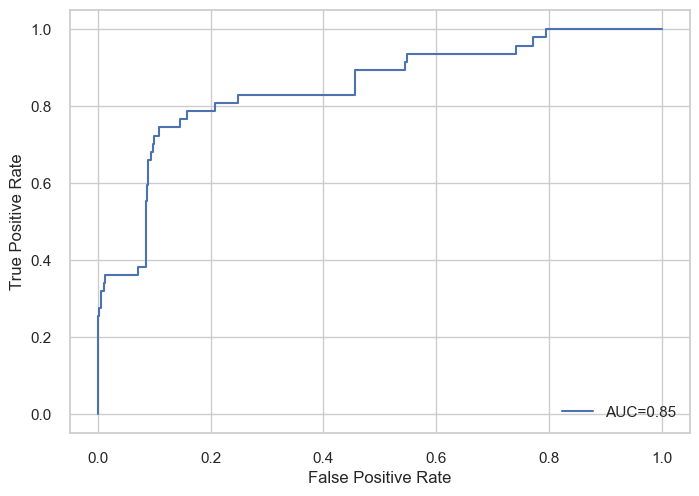

Model: f1 = 0.367 roc_auc = 0.848


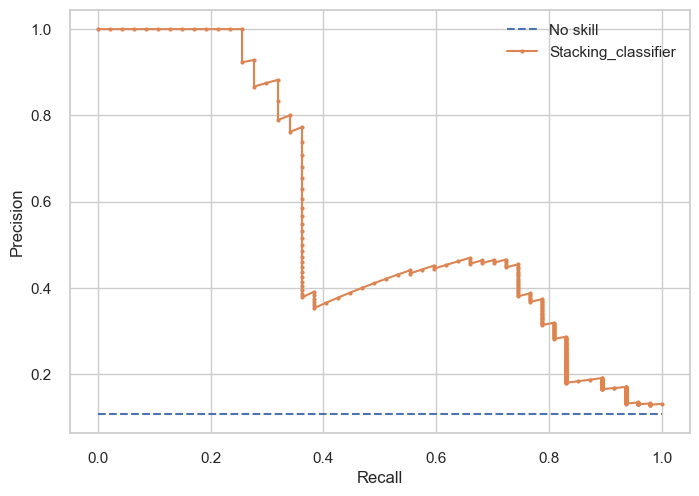

100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


In [145]:
models_optimized = []

try:
    if not issubclass(type(ada_mod_from_pickle), abc.ABCMeta):
        models_optimized.append(("AdaBoost_optimized", ada_mod_from_pickle))
except Exception:
    models_optimized = models_optimized
try:
    if not issubclass(type(cb_opt_from_pickle), abc.ABCMeta):
        models_optimized.append(("CB_opt_optimized", cb_opt_from_pickle))
except Exception:
    models_optimized = models_optimized
try:
    if not issubclass(type(lgbm_opt_from_pickle), abc.ABCMeta):
        models_optimized.append(("LGBM_opt_optimized", lgbm_opt_from_pickle))
except Exception:
    models_optimized = models_optimized
try:
    if not issubclass(type(xgboost_opt_from_pickle), abc.ABCMeta):
        models_optimized.append(("XGB_opt_optimized", xgboost_opt_from_pickle))
except Exception:
    models_optimized = models_optimized
try:
    if not issubclass(type(voting_from_pickle), abc.ABCMeta):
        models_optimized.append(("Voting_classifier", voting_from_pickle))
except Exception:
    models_optimized = models_optimized
try:
    if not issubclass(type(sclf_from_pickle), abc.ABCMeta):
        models_optimized.append(("Stacking_classifier", sclf_from_pickle))
except Exception:
    models_optimized = models_optimized

print(models_optimized)

dset = [("Test", X_test_mod, y_test)]

results_fin = pd.DataFrame(columns=["Model", "Metrics", "Test"])

for name, model in tqdm(models_optimized):

    print(name)

    results = pd.DataFrame(["ROC/AUC:", "Accuracy:", "F1 score:", "MCC score:"], columns=["Metrics"])

    for name_dset, X_dset, y_dset in tqdm(dset):

        # Fit the model

        y_pred_p = model.predict_proba(X_dset)
        y_pred_p1 = y_pred_p[:, 1]

        y_pred_hyp = model.predict(X_dset)

        metric_lst = []
        roc_auc_hyp = round(roc_auc_score(y_dset, y_pred_p1), 4)
        metric_lst.append(roc_auc_hyp)
        accuracy_hyp = round(accuracy_score(y_dset, y_pred_hyp), 4)
        metric_lst.append(accuracy_hyp)
        f1_score_hyp = round(metrics.f1_score(y_dset, y_pred_hyp), 4)
        metric_lst.append(f1_score_hyp)
        mcc_score = round(matthews_corrcoef(y_dset, y_pred_hyp), 4)
        metric_lst.append(mcc_score)

        print("ROC/AUC:", roc_auc_hyp)
        print("Accuracy:", accuracy_hyp)
        print("F1 score:", f1_score_hyp)

        print(classification_report(y_dset, y_pred_hyp))

        cm = confusion_matrix(y_dset, y_pred_hyp)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm)
        disp.plot()
        plt.show()

        results = pd.concat([results, pd.DataFrame(metric_lst, columns=[name_dset])], axis=1)

        # ROC curve

        fpr, tpr, _ = metrics.roc_curve(y_dset, y_pred_p1)

        plt.plot(fpr, tpr, label="AUC=" + str(round(roc_auc_hyp, 2)))
        plt.ylabel("True Positive Rate")
        plt.xlabel("False Positive Rate")
        plt.legend(loc=4)
        plt.show()

        roc_data = pd.concat([pd.DataFrame(fpr), pd.DataFrame(tpr)], axis=1)
        roc_data.columns = ["FPR", "TPR"]
        roc_data = roc_data.reset_index()

        # Precision Recall curves

        precision, recall, thresholds = precision_recall_curve(y_dset, y_pred_p1)

        # calculate F1 score

        f1 = metrics.f1_score(y_dset, y_pred_hyp)

        # summarize scores

        print(f"Model: f1 = {f1:.3f} roc_auc = {roc_auc_hyp:.3f}")

        # plot the precision-recall curves

        no_skill = len(y_dset[y_dset == 1]) / len(y_dset)

        plt.plot([0, 1], [no_skill, no_skill], linestyle="--", label="No skill")
        plt.plot(recall, precision, marker=".", label=name)
        plt.xlabel("Recall")
        plt.ylabel("Precision")
        plt.legend()
        plt.show()

        pr_data = pd.concat([pd.DataFrame(precision), pd.DataFrame(recall)], axis=1)
        pr_data.columns = ["Precision", "Recall"]
        pr_data = pr_data.reset_index()

        results["Model"] = name

    results_fin = pd.concat([results_fin, results], axis=0)


### Performance comparison

In [146]:
train_res = pd.DataFrame()

for name in [xgb_opt_res, lgbm_opt_res, cb_opt_res, ada_res, voting_res, ensemble_res]:
    try:
        train_res = pd.concat([train_res, name], axis = 0)
    except NameError:
        train_res = train_res
train_res["Train_mean"] = train_res.mean(axis=1)
train_res = train_res.sort_values(["Metrics","Train_mean","Model"], ascending = False)
train_res

/var/folders/4t/t1tjs2gd7kzg3jkt5d1snhlh0000gn/T/ipykernel_1256/3841750960.py:8: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



,Metrics,Train_0,Train_1,Train_2,Train_3,Train_4,Train_5,Train_6,Train_7,Train_8,Train_9,Model,Train_mean
0,ROC/AUC:,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,Stacking_classifier,1.00000
0,ROC/AUC:,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,CB_opt_optimized,1.00000
0,ROC/AUC:,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.9960,0.9981,1.0000,XGB_opt_optimized,0.99941
0,ROC/AUC:,1.0000,1.0000,1.0000,1.0000,0.9970,1.0000,0.9970,0.9790,0.9917,1.0000,Voting_classifier,0.99647
0,ROC/AUC:,0.9920,0.9950,0.9950,1.0000,0.9940,0.9910,0.9890,0.9890,0.9833,0.9949,AdaBoost_optimized,0.99232
0,ROC/AUC:,0.9870,0.9650,1.0000,0.9970,0.9880,0.9730,0.9510,0.9121,0.9463,0.9859,LGBM_opt_optimized,0.97053
3,MCC score:,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,Stacking_classifier,1.00000
3,MCC score:,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,CB_opt_optimized,1.00000
3,MCC score:,0.9483,0.9483,0.9483,1.0000,0.8948,0.8948,0.8948,0.8948,0.9029,1.0000,XGB_opt_optimized,0.93270
3,MCC score:,0.8948,0.8420,0.8948,0.9483,0.8420,0.7215,0.8420,0.8391,0.8541,0.8418,AdaBoost_optimized,0.85204


In [147]:
results_final = pd.merge(train_res,
                         results_fin,
                         on = ["Model", "Metrics"],
                         how = "left")
results_final = results_final.sort_values(["Metrics","Test","Model"], ascending = False)
results_final

,Metrics,Train_0,Train_1,Train_2,Train_3,Train_4,Train_5,Train_6,Train_7,Train_8,Train_9,Model,Train_mean,Test
1,ROC/AUC:,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,CB_opt_optimized,1.00000,0.9145
3,ROC/AUC:,1.0000,1.0000,1.0000,1.0000,0.9970,1.0000,0.9970,0.9790,0.9917,1.0000,Voting_classifier,0.99647,0.8958
2,ROC/AUC:,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.9960,0.9981,1.0000,XGB_opt_optimized,0.99941,0.8914
5,ROC/AUC:,0.9870,0.9650,1.0000,0.9970,0.9880,0.9730,0.9510,0.9121,0.9463,0.9859,LGBM_opt_optimized,0.97053,0.8865
4,ROC/AUC:,0.9920,0.9950,0.9950,1.0000,0.9940,0.9910,0.9890,0.9890,0.9833,0.9949,AdaBoost_optimized,0.99232,0.8848
0,ROC/AUC:,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,Stacking_classifier,1.00000,0.8479
7,MCC score:,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,CB_opt_optimized,1.00000,0.6069
8,MCC score:,0.9483,0.9483,0.9483,1.0000,0.8948,0.8948,0.8948,0.8948,0.9029,1.0000,XGB_opt_optimized,0.93270,0.5957
9,MCC score:,0.8948,0.8420,0.8948,0.9483,0.8420,0.7215,0.8420,0.8391,0.8541,0.8418,AdaBoost_optimized,0.85204,0.5886
10,MCC score:,0.8391,0.7807,0.8948,0.8391,0.7807,0.6530,0.7191,0.8948,0.8519,0.8389,Voting_classifier,0.80921,0.5228


/var/folders/4t/t1tjs2gd7kzg3jkt5d1snhlh0000gn/T/ipykernel_1256/237963954.py:20: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



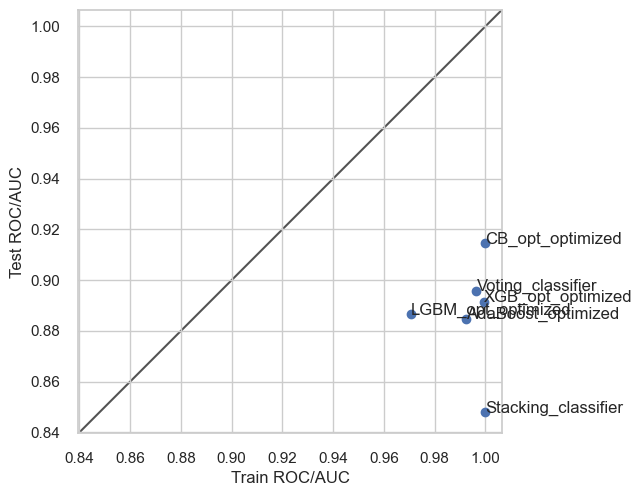

In [148]:
fig, ax = plt.subplots()
ax.scatter(data = results_final[results_final.Metrics == "ROC/AUC:"], x = "Train_mean", y = "Test")
text = list(results_final.loc[results_final.Metrics == "ROC/AUC:", "Model"])
x = list(results_final.loc[results_final.Metrics == "ROC/AUC:", "Train_mean"])
y = list(results_final.loc[results_final.Metrics == "ROC/AUC:", "Test"])
for i in range(len(x)):
    plt.annotate(text[i], (x[i], y[i]))
plt.xlabel("Train ROC/AUC")
plt.ylabel("Test ROC/AUC")

lims = [
    np.min([ax.get_xlim(), ax.get_ylim()]) - 0.005,  # min of both axes
    np.max([ax.get_xlim(), ax.get_ylim()]) + 0.005,  # max of both axes
]

ax.plot(lims, lims, "k-", alpha=0.75, zorder=0)
ax.set_aspect("equal")
ax.set_xlim(lims)
ax.set_ylim(lims)
fig.show()

### Miscalibration

In [149]:
logloss = log_loss(y_test, y_pred_p1)
calibration_loss = brier_score_loss(y_test, y_pred_p1)

print(f"Log Loss: {logloss}")
print(f"Calibration Loss: {calibration_loss}")

Log Loss: 0.5376527798871331
Calibration Loss: 0.1295138939327283


[LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
[LightGBM] [Warning] bagging_fraction is set=0.027021158905779226, subsample=1.0 will be ignored. Current value: bagging_fraction=0.027021158905779226
[LightGBM] [Warning] feature_fraction is set=0.9596893264923619, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9596893264923619
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=20, min_child_weight=0.001 will be ignored. Current value: min_sum_hessian_in_leaf=20
[LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
[LightGBM] [Warning] bagging_fraction is set=0.027021158905779226, subsample=1.0 will be ignored. Current value: bagging_fraction=0.027021158905779226
[LightGBM] [Warning] feature_fraction is set=0.9596893264923619, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9596893264923619
[LightGB

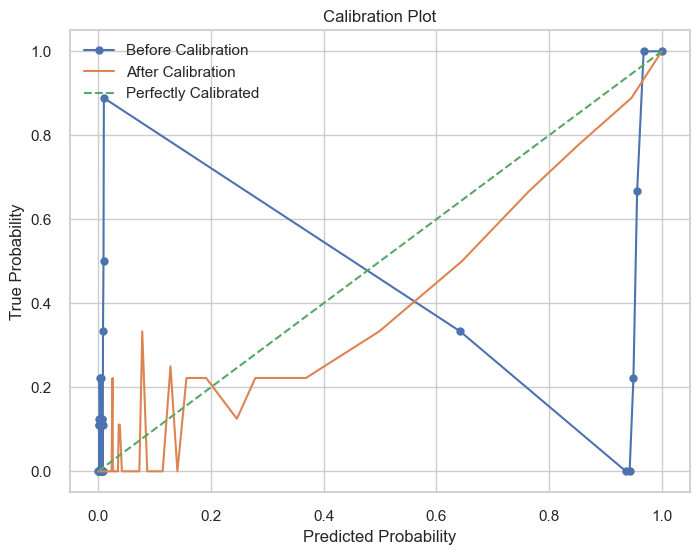

In [150]:

# Calibrating the model
calibrated = CalibratedClassifierCV(lgbm_opt_from_pickle,
                                    method = "sigmoid",
                                    cv = 10)
scores = cross_val_score(calibrated,
                         X_train_mod,
                         y_train,
                         scoring="roc_auc",
                         cv=cv,
                         n_jobs=-1)

print(f"Mean ROC AUC: {np.mean(scores):.4f}")

calibrated.fit(X_train_mod, y_train)

# Predict calibrated probabilities
calibrated_probabilities = calibrated.predict_proba(X_test_mod)[:, 1]

# Plotting Calibration Curves with strategy="quantile"
prob_true, prob_pred = calibration_curve(y_test,
                                         y_pred_p1,
                                         n_bins=50,
                                         strategy="quantile")
prob_true_calibrated, prob_pred_calibrated = calibration_curve(y_test,
                                                               calibrated_probabilities,
                                                               n_bins=50,
                                                               strategy="quantile")

plt.figure(figsize=(8, 6))
plt.plot([0] + prob_pred.tolist() + [1], [0] + prob_true.tolist() + [1],
         marker="o",
         label="Before Calibration")
plt.plot([0] + prob_pred_calibrated.tolist() + [1], [0] + prob_true_calibrated.tolist() + [1],
         marker="x",
         label="After Calibration")
plt.plot([0, 1], [0, 1],
         linestyle="--",
         label="Perfectly Calibrated")
plt.xlabel("Predicted Probability")
plt.ylabel("True Probability")
plt.title("Calibration Plot")
plt.legend(loc="upper left")
#plt.text(0.6, 0.07, f"Calibration Loss Before: {calibration_loss_before:.3f}", color="blue")
#plt.text(0.6, 0.03, f"Calibration Loss After: {calibration_loss_after:.3f}", color="orange")
plt.show()


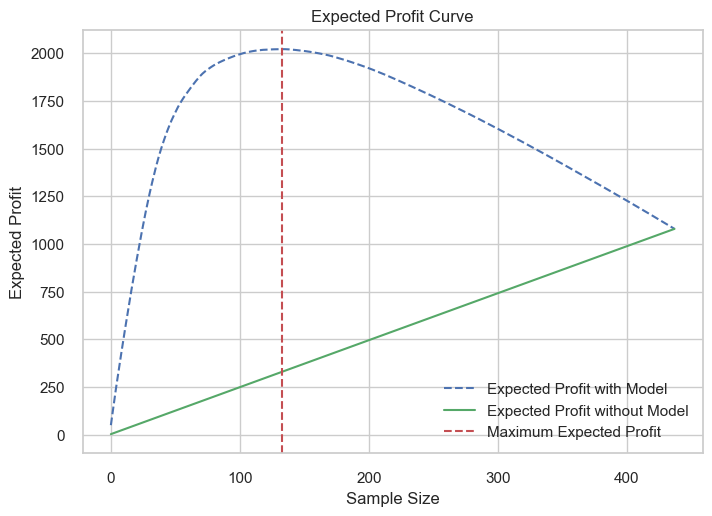

In [151]:
# Calculating expected profit with the average probability
benefit = 50
cost = -5

sorted_probs = np.sort(calibrated_probabilities)[::-1]
cumulative_expected_profit = np.cumsum(sorted_probs * benefit + (1 - sorted_probs) * (cost))

# Without the model
average_prob = np.mean(sorted_probs)
constant_profit = np.cumsum(np.ones_like(sorted_probs) * average_prob * benefit+ (1 - average_prob) * (cost))

# Plotting the expected profit
plt.plot(range(len(sorted_probs)),
         cumulative_expected_profit,
         "b--",
         label="Expected Profit with Model")
plt.plot(range(len(sorted_probs)),
         constant_profit, "g-",
         label="Expected Profit without Model")
plt.axvline(x=np.argmax(cumulative_expected_profit),
            color="r",
            linestyle="--",
            label="Maximum Expected Profit")
plt.xlabel("Sample Size")
plt.ylabel("Expected Profit")
plt.title("Expected Profit Curve")
plt.legend()
plt.show()

### Shapley values

In [152]:
explainer = shap.TreeExplainer(lgbm_opt_from_pickle)
shap_values = explainer.shap_values(X_train_mod)

# visualize the first prediction's explanation
shap.initjs()

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/shap/explainers/_tree.py:353: UserWarning:

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray



/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/shap/explainers/_tree.py:353: UserWarning:

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray



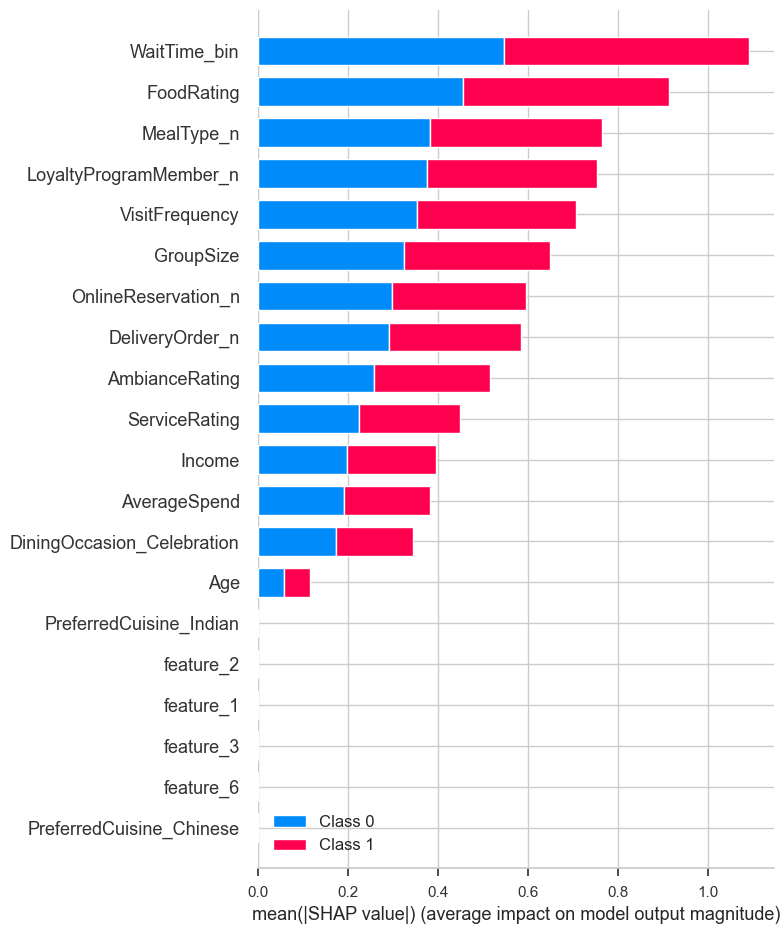

In [153]:
shap_values = shap.TreeExplainer(lgbm_opt_from_pickle).shap_values(X_train_mod)
shap.summary_plot(shap_values, X_train_mod, plot_type="bar")

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/shap/plots/_beeswarm.py:664: UserWarning:

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored



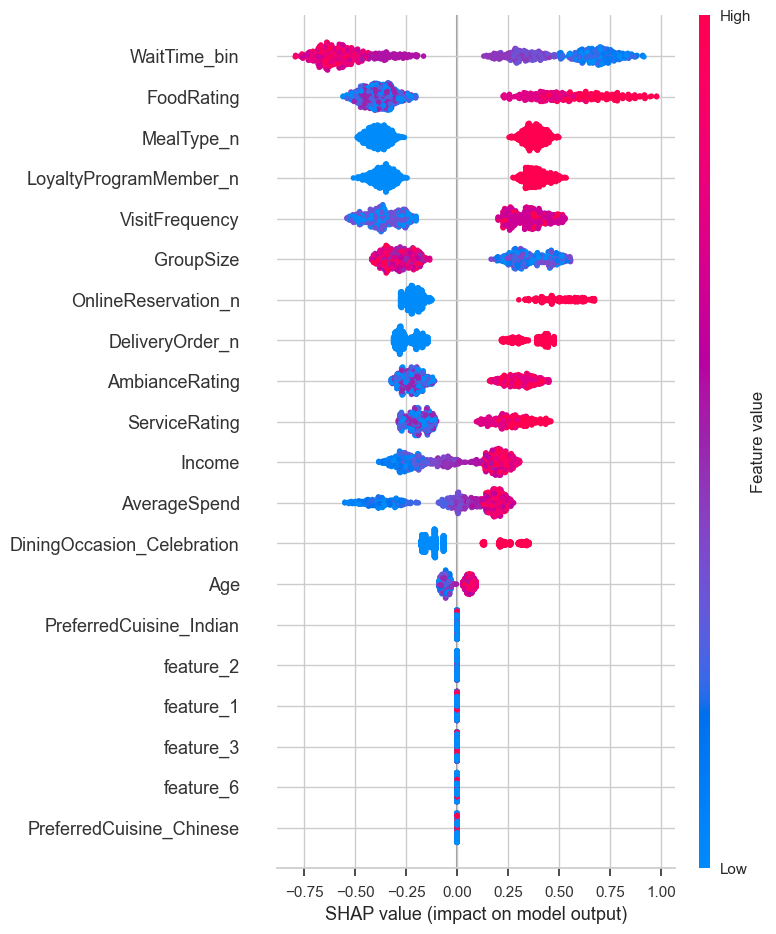

In [154]:
shap.summary_plot(shap_values[1], X_train_mod, plot_type='dot')

### Model interpretation

In [155]:
lbgm_model_data = pd.DataFrame(y_test)
lbgm_model_data["pred"] = pd.Series(lgbm_opt_from_pickle.predict_proba(X_test_mod)[:,1])
lbgm_model_data["decile"] = pd.qcut(lbgm_model_data.pred, 10, labels=False)

In [158]:
Gains_Table = Rank_Order(lbgm_model_data, "pred", target)
Gains_Table

,decile,min_prob,max_prob,avg_prob,cnt_cust,cnt_resp,cnt_non_resp,rrate,cum_cust,cum_resp,cum_non_resp,cum_cust_pct,Gain_Percentage,cum_non_resp_pct,KS,Lift
9,9,0.321912,0.768544,0.482852,44.0,28.0,16.0,63.64,44.0,28.0,16.0,10.05,59.57,4.09,55.48,5.93
8,8,0.188028,0.317963,0.241338,44.0,9.0,35.0,20.45,88.0,37.0,51.0,20.09,78.72,13.04,65.68,3.92
7,7,0.146190,0.187810,0.164619,44.0,2.0,42.0,4.55,132.0,39.0,93.0,30.14,82.98,23.79,59.19,2.75
6,6,0.100201,0.145098,0.122705,43.0,3.0,40.0,6.98,175.0,42.0,133.0,39.95,89.36,34.02,55.34,2.24
5,5,0.072478,0.098643,0.085224,44.0,0.0,44.0,0.00,219.0,42.0,177.0,50.00,89.36,45.27,44.09,1.79
4,4,0.050926,0.072445,0.059996,44.0,2.0,42.0,4.55,263.0,44.0,219.0,60.05,93.62,56.01,37.61,1.56
3,3,0.038520,0.050917,0.043842,43.0,0.0,43.0,0.00,306.0,44.0,262.0,69.86,93.62,67.01,26.61,1.34
2,2,0.026656,0.038021,0.031370,44.0,3.0,41.0,6.82,350.0,47.0,303.0,79.91,100.00,77.49,22.51,1.25
1,1,0.017650,0.026636,0.021670,44.0,0.0,44.0,0.00,394.0,47.0,347.0,89.95,100.00,88.75,11.25,1.11
0,0,0.003638,0.017513,0.011180,44.0,0.0,44.0,0.00,438.0,47.0,391.0,100.00,100.00,100.00,0.00,1.00


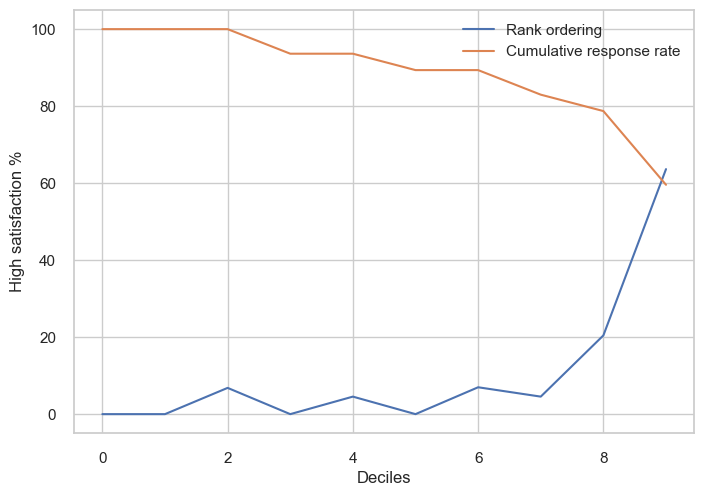

In [160]:
plt.plot(Gains_Table.rrate, label="Rank ordering")
plt.plot(Gains_Table.Gain_Percentage, label="Cumulative response rate")
plt.legend()
plt.xlabel("Deciles")
plt.ylabel("High satisfaction %")
plt.show()

Gain at a given decile level is the ratio of cumulative number of targets (events) up to that decile to the total number of targets (events) in the entire data set.

% of targets (events) covered at a given decile level. For example,  79% of targets covered in top 20% of data based on model. In the case of propensity to buy model, we can say we can identify and target 79% of customers who are likely to buy the product by just sending email to 20% of total customers.

/var/folders/4t/t1tjs2gd7kzg3jkt5d1snhlh0000gn/T/ipykernel_1256/825460365.py:8: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



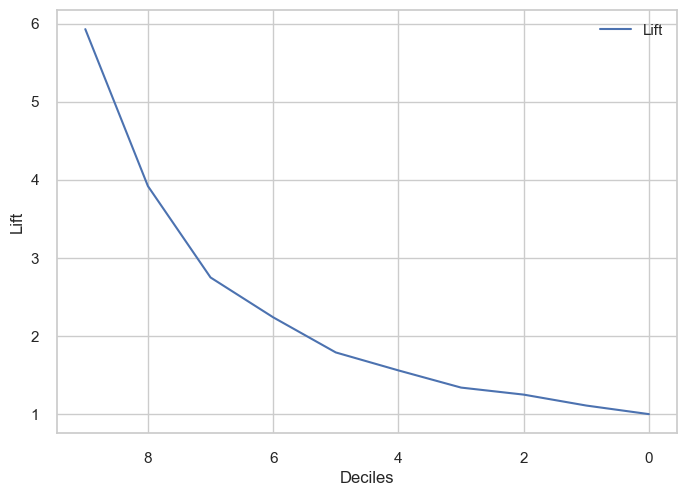

In [161]:
fig, ax = plt.subplots(1)

plt.plot(Gains_Table.Lift, label="Lift")
plt.legend()
ax.invert_xaxis()
plt.xlabel("Deciles")
plt.ylabel("Lift")
fig.show()

Lift measures how much better one can expect to do with the predictive model comparing without a model. It is the ratio of gain % to the random expectation % at a given decile level. The random expectation at the xth decile is x%.

The Cum Lift of 3.92 for top two deciles, means that when selecting 20% of the records based on the model, one can expect 3.92 times the total number of targets (events) found by randomly selecting 20%-of-file without a model.

### Shapley RFECV

In [ ]:
clf = lgbm_opt_from_pickle

selector = RFECV(clf,
                 step=1,
                 cv=5,
                 scoring="roc_auc",
                 n_jobs=-1)
selector.fit(X_train_mod, y_train)


[LightGBM] [Warning] min_data_in_leaf is set=70, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=70
[LightGBM] [Warning] bagging_fraction is set=0.8333737092981576, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8333737092981576
[LightGBM] [Warning] feature_fraction is set=0.9898957849340355, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9898957849340355
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=20, min_child_weight=0.001 will be ignored. Current value: min_sum_hessian_in_leaf=20
[LightGBM] [Warning] min_data_in_leaf is set=70, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=70
[LightGBM] [Warning] bagging_fraction is set=0.8333737092981576, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8333737092981576
[LightGBM] [Warning] feature_fraction is set=0.9898957849340355, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9898957849340355
[LightGBM] [Warn

RFECV(cv=5,
      estimator=LGBMClassifier(bagging_fraction=0.8333737092981576,
                               feature_fraction=0.9898957849340355,
                               learning_rate=0.09764050430050515, max_bin=50,
                               max_depth=9, min_data_in_leaf=70,
                               min_sum_hessian_in_leaf=20, num_leaves=50),
      n_jobs=-1, scoring='roc_auc')

In [ ]:
print("No of selected features:", selector.n_features_)

feature_index = selector.get_support(indices = True)
feature_mask = selector.support_
feature_names = selector.get_feature_names_out()
feature_number = selector.n_features_
results = pd.DataFrame(selector.cv_results_)
rfecv_score = selector.score(X_train_mod, y_train)

print('Original feature number:', len(X_train_mod.columns))
print('Optimal feature number:', feature_number)
print('Selected features:', feature_names)
print('Score:', rfecv_score)

No of selected features: 15
Original feature number: 31
Optimal feature number: 15
Selected features: ['GroupSize' 'MealType_n' 'DiningOccasion_Business' 'Income'
 'DiningOccasion_Celebration' 'LoyaltyProgramMember_n' 'VisitFrequency'
 'ServiceRating' 'DeliveryOrder_n' 'AmbianceRating' 'Age' 'AverageSpend'
 'OnlineReservation_n' 'FoodRating' 'WaitTime_bin']
Score: 0.9391560353287537
